<a href="https://colab.research.google.com/github/Miguithub/MF-BTC/blob/main/MCP1_Classifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

---
# LIB

In [ ]:
import requests
import pandas as pd
import time
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

---

# EXT

In [ ]:
# API Key y parámetros generales
api_key = "EjsF3b55e_87hI7reA6lHGP9bDuqETeL"
tickers = "BTC"
start_date = "2016-06-01"
end_date = "2017-06-01"
limit = 50000

# Headers para autenticación
headers = {
    "Authorization": f"Bearer {api_key}"
}


dataframes = {}

# Bucle para cada ticker
for symbol in tickers:
    print(f"Extrayendo datos de {symbol}...")
    base_url = f"https://api.polygon.io/v2/aggs/ticker/X:{symbol}USD/range/5/minute"
    next_url = f"{base_url}/{start_date}/{end_date}?adjusted=true&sort=asc&limit={limit}&apiKey={api_key}"

    all_data = []

    while next_url:
        response = requests.get(next_url, headers=headers)

        if response.status_code == 200:
            data = response.json()

            if "results" in data:
                all_data.extend(data["results"])

                if "next_url" in data:
                    next_url = data["next_url"]
                    time.sleep(1)
                else:
                    break
            else:
                print(f"No se encontraron más datos para {symbol}.")
                break
        else:
            print(f"Error al obtener datos de {symbol}: {response.status_code}, {response.text}")
            break

    # Convertir a DataFrame con sufijos si hay datos
    if all_data:
        df = pd.DataFrame(all_data)
        df["Datetime"] = pd.to_datetime(df["t"], unit="ms")
        df = df[["Datetime", "o", "h", "l", "c", "v"]]
        dataframes[symbol] = df
        print(f"{symbol} extraído con éxito. Total de filas: {len(df)}")
    else:
        print(f"No se pudo obtener datos para {symbol}.")

# Unir todos los DataFrames por la columna 'Datetime'
mf2 = None
for df in dataframes.values():
    if mf2 is None:
        mf2 = df
    else:
        mf2 = pd.merge(mf2, df, on="Datetime", how="outer")

# Ordenar por fecha y mostrar info
mf2 = mf2.sort_values("Datetime").reset_index(drop=True)
mf2.info()


Extrayendo datos de B...
No se encontraron más datos para B.
No se pudo obtener datos para B.
Extrayendo datos de T...
No se encontraron más datos para T.
No se pudo obtener datos para T.
Extrayendo datos de C...
No se encontraron más datos para C.
No se pudo obtener datos para C.


AttributeError: 'NoneType' object has no attribute 'sort_values'

In [ ]:
# # API Key y parámetros generales
# api_key = "EjsF3b55e_87hI7reA6lHGP9bDuqETeL"
# tickers = ["BTC", "ETH", "USDT", "XRP", "SOL", "DOGE"]
# start_date = "2016-06-01"
# end_date = "2025-06-01"
# limit = 50000

# # Headers para autenticación
# headers = {
#     "Authorization": f"Bearer {api_key}"
# }


# dataframes = {}

# # Bucle para cada ticker
# for symbol in tickers:
#     print(f"Extrayendo datos de {symbol}...")
#     base_url = f"https://api.polygon.io/v2/aggs/ticker/X:{symbol}USD/range/5/minute"
#     next_url = f"{base_url}/{start_date}/{end_date}?adjusted=true&sort=asc&limit={limit}&apiKey={api_key}"

#     all_data = []

#     while next_url:
#         response = requests.get(next_url, headers=headers)

#         if response.status_code == 200:
#             data = response.json()

#             if "results" in data:
#                 all_data.extend(data["results"])

#                 if "next_url" in data:
#                     next_url = data["next_url"]
#                     time.sleep(1)
#                 else:
#                     break
#             else:
#                 print(f"No se encontraron más datos para {symbol}.")
#                 break
#         else:
#             print(f"Error al obtener datos de {symbol}: {response.status_code}, {response.text}")
#             break

#     # Convertir a DataFrame con sufijos si hay datos
#     if all_data:
#         df = pd.DataFrame(all_data)
#         df["Datetime"] = pd.to_datetime(df["t"], unit="ms")
#         df = df[["Datetime", "o", "h", "l", "c", "v"]]
#         df.columns = ["Datetime", f"{symbol}_Open", f"{symbol}_High", f"{symbol}_Low", f"{symbol}_Close", f"{symbol}_Volume"]
#         dataframes[symbol] = df
#         print(f"{symbol} extraído con éxito. Total de filas: {len(df)}")
#     else:
#         print(f"No se pudo obtener datos para {symbol}.")

# # Unir todos los DataFrames por la columna 'Datetime'
# mf1 = None
# for df in dataframes.values():
#     if mf1 is None:
#         mf1 = df
#     else:
#         mf1 = pd.merge(mf1, df, on="Datetime", how="outer")

# # Ordenar por fecha y mostrar info
# mf1 = mf1.sort_values("Datetime").reset_index(drop=True)
# mf1.info()


Extrayendo datos de BTC...
BTC extraído con éxito. Total de filas: 928943
Extrayendo datos de ETH...


In [ ]:
mf1 = bin.copy()

BTC

In [ ]:
mf1.rename(columns=lambda col: col.replace("BTC_", "") if col.startswith("BTC_") else col, inplace=True)

Cleaning

In [ ]:
mf1.drop(columns=[
    "Open",
    "ETH_Open", "ETH_High", "ETH_Low",
    "USDT_Open", "USDT_High", "USDT_Low",
    "SOL_Open", "SOL_High", "SOL_Low",
    "XRP_Open", "XRP_High", "XRP_Low",
    "DOGE_Open", "DOGE_High", "DOGE_Low"
], inplace=True)

In [ ]:
mf1.drop(columns=[
    "ETH_Volume",
    "USDT_Volume",
    "SOL_Volume",
    "XRP_Volume",
    "DOGE_Volume",
    "ETH_Close",
    "USDT_Close",
    "SOL_Close",
    "XRP_Close",
    "DOGE_Close"
], inplace=True)

VOM

In [ ]:
mf1["VoM"] = (
    mf1["Volume"] +  # BTC (ya renombrado)
    mf1.get("ETH_Volume", 0) +
    mf1.get("USDT_Volume", 0) +
    mf1.get("XRP_Volume", 0) +
    mf1.get("SOL_Volume", 0) +
    mf1.get("DOGE_Volume", 0)
)

In [ ]:
mf1["DominanciaBTC"] = mf1["Volume"] / mf1["VoM"]

Market Cap

In [ ]:
mf1["MC"] = np.sqrt( mf1["Volume"] *mf1["Close"])

In [ ]:
mf1["MCM"] = (
    mf1["Volume"] +  # BTC (ya renombrado)
    mf1.get("ETH_Volume", 0) *  mf1.get("ETH_Close", 0)+
    mf1.get("USDT_Volume", 0) *  mf1.get("USDT_Close", 0)+
    mf1.get("XRP_Volume", 0) * mf1.get("XRP_Close", 0)  +
    mf1.get("SOL_Volume", 0) * mf1.get("SOL_Close", 0) +
    mf1.get("DOGE_Volume", 0) * mf1.get("DOGE_Close", 0)
)


In [ ]:
mf1["DominanciaMBTC"] = mf1["MC"] / mf1["MCM"]

cp2 Y vp2

In [ ]:
mf1["cp2"] = (mf1["Close"].shift(1)).diff()

In [ ]:
mf1["vp2"] = (mf1["Volume"].shift(1)).diff()

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ['Volume', 'VoM', 'DominanciaMBTC', 'cp2', 'vp2', "MC", "Close"]
# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B1'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)


         Variable  Mutual Information
0          Volume            0.037520
6           Close            0.036057
1             VoM            0.020019
4             vp2            0.017585
2  DominanciaMBTC            0.017202
5              MC            0.016355
3             cp2            0.008378


In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ['Volume', 'VoM', 'DominanciaMBTC', 'cp2', 'vp2', "MC", "Close"]
# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B2'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)


         Variable  Mutual Information
6           Close            0.029525
0          Volume            0.026165
1             VoM            0.012632
4             vp2            0.012090
5              MC            0.011806
2  DominanciaMBTC            0.011226
3             cp2            0.006280


In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ['Volume', 'VoM', 'DominanciaMBTC', 'cp2', 'vp2', "MC", "Close"]
# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B3'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)


         Variable  Mutual Information
6           Close            0.025858
0          Volume            0.021386
1             VoM            0.010582
5              MC            0.010518
4             vp2            0.009471
2  DominanciaMBTC            0.009295
3             cp2            0.004792


In [ ]:
# Convertir todas las columnas float64 a float32
mf1 = mf1.astype({col: "float32" for col in mf1.select_dtypes(include=["float64"]).columns})
mf1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 933813 entries, 0 to 933812
Data columns (total 22 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   Datetime        933813 non-null  datetime64[ns]
 1   High            928943 non-null  float32       
 2   Low             928943 non-null  float32       
 3   Close           928943 non-null  float32       
 4   Volume          928943 non-null  float32       
 5   ETH_Close       914848 non-null  float32       
 6   ETH_Volume      914848 non-null  float32       
 7   USDT_Close      735903 non-null  float32       
 8   USDT_Volume     735903 non-null  float32       
 9   XRP_Close       860177 non-null  float32       
 10  XRP_Volume      860177 non-null  float32       
 11  SOL_Close       443619 non-null  float32       
 12  SOL_Volume      443619 non-null  float32       
 13  DOGE_Close      796212 non-null  float32       
 14  DOGE_Volume     796212 non-null  flo

In [ ]:
mf1.tail()

,Datetime,High,Low,Close,Volume,ETH_Close,ETH_Volume,USDT_Close,USDT_Volume,XRP_Close,XRP_Volume,SOL_Close,SOL_Volume,DOGE_Close,DOGE_Volume,VoM,DominanciaBTC
1091507,2025-05-27 23:55:00,109019.679688,108860.0,109019.679688,2.386040,2665.810059,108.135818,1.00049,20343.007812,2.3200,30942.453125,176.919998,302.562775,0.22641,4.258849e+04,9.428703e+04,0.000025
1091508,2025-05-27 23:56:00,109048.109375,108900.0,109005.000000,2.204607,2665.209961,42.951313,1.00032,10656.181641,2.3192,17608.439453,176.910004,424.956116,0.22628,7.790719e+04,1.066419e+05,0.000021
1091509,2025-05-27 23:57:00,109032.218750,108880.0,109025.687500,1.953525,2664.330078,63.988811,1.00050,19964.244141,2.3192,28483.378906,176.880005,214.767166,0.22617,5.059784e+04,9.932617e+04,0.000020
1091510,2025-05-27 23:58:00,109043.648438,108870.0,108962.843750,4.611859,2661.989990,38.310387,1.00050,11784.954102,2.3181,23658.062500,176.750000,121.693672,0.22610,1.194940e+06,1.230548e+06,0.000004
1091511,2025-05-27 23:59:00,109004.898438,108840.0,109004.898438,1.129603,2662.040039,45.286221,1.00050,59035.867188,2.3181,11187.500000,176.800003,28.206669,0.22613,8.338119e+04,1.536792e+05,0.000007


In [ ]:
mf1.head()

,Datetime,Open,High,Low,Close,Volume,ETH_Close,ETH_Volume,USDT_Close,USDT_Volume,XRP_Close,XRP_Volume,SOL_Close,SOL_Volume,DOGE_Close,DOGE_Volume
0,2023-05-28 00:00:00,26873.699219,26894.000000,26869.339844,26883.759766,8.254512,1830.760010,53.421684,1.00037,62577.144531,0.47229,500.000000,20.459999,2864.674072,0.072619,27386.767578
1,2023-05-28 00:01:00,26883.599609,26890.000000,26860.169922,26860.210938,35.942440,1829.550049,95.816826,1.00040,57097.800781,0.47204,500.000000,20.440001,437.097992,0.072520,237994.546875
2,2023-05-28 00:02:00,26862.380859,26883.000000,26858.589844,26858.820312,9.218138,1829.430054,119.154411,1.00038,18921.281250,0.47192,134989.453125,20.420000,217.842697,0.072510,33206.871094
3,2023-05-28 00:03:00,26858.830078,26884.000000,26854.359375,26883.000000,13.569174,1829.709961,49.147087,1.00037,69291.250000,NaN,NaN,20.400000,408.791504,0.072507,116536.718750
4,2023-05-28 00:04:00,26854.589844,26865.320312,26854.089844,26863.060547,10.809524,1828.800049,70.785545,1.00038,50621.843750,0.47171,500.000000,20.379999,4284.551758,0.072540,26622.400391


---

# Y

CREACION BINARIA BITCOIN

In [ ]:
bin = mf1[["Datetime", "Volume", "Close"]].copy()

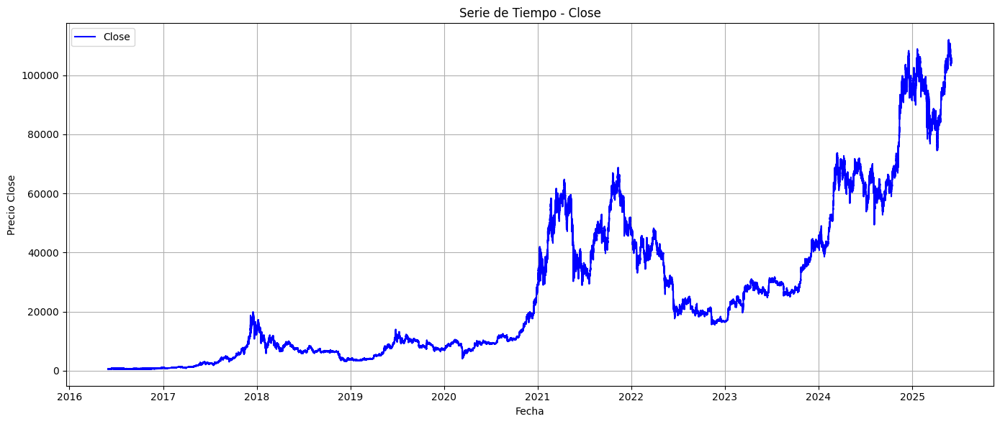

In [ ]:
plt.figure(figsize=(14, 6))
plt.plot(bin["Datetime"], bin["Close"], label="Close", color="blue")
plt.title("Serie de Tiempo - Close")
plt.xlabel("Fecha")
plt.ylabel("Precio Close")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


In [ ]:
# Delta de Close
delta = mf1['Close'].shift(-1) - mf1['Close']
tolerancia = mf1['Close'] * 0.0005

# Clasificación en 3 categorías
mf1['B1'] = np.select(
    condlist=[
        delta > tolerancia,                          # Subida
        (delta >= -tolerancia) & (delta <= tolerancia),  # Neutro
        delta < -tolerancia                          # Bajada
    ],
    choicelist=[0, 1, 2],
    default=np.nan
)

In [ ]:
# Ver el conteo de observaciones por clase en B1
conteo_clases = mf1['B1'].value_counts(dropna=False)
print(conteo_clases)


B1
0.0    314531
2.0    310976
1.0    259804
NaN         1
Name: count, dtype: int64


In [ ]:
# Delta de Close
delta = mf1['Close'].shift(-2) - mf1['Close']
tolerancia = mf1['Close'] * 0.0005

# Clasificación en 3 categorías
mf1['B2'] = np.select(
    condlist=[
        delta > tolerancia,                          # Subida
        (delta >= -tolerancia) & (delta <= tolerancia),  # Neutro
        delta < -tolerancia                          # Bajada
    ],
    choicelist=[0, 1, 2],
    default=np.nan
)

In [ ]:
# Ver el conteo de observaciones por clase en B1
conteo_clases = mf1['B2'].value_counts(dropna=False)
print(conteo_clases)


B2
0.0    346134
2.0    340080
1.0    199096
NaN         2
Name: count, dtype: int64


In [ ]:
# Delta de Close
delta = mf1['Close'].shift(-3) - mf1['Close']
tolerancia = mf1['Close'] * 0.0005

# Clasificación en 3 categorías
mf1['B3'] = np.select(
    condlist=[
        delta > tolerancia,                          # Subida
        (delta >= -tolerancia) & (delta <= tolerancia),  # Neutro
        delta < -tolerancia                          # Bajada
    ],
    choicelist=[0, 1, 2],
    default=np.nan
)

In [ ]:
# Ver el conteo de observaciones por clase en B1
conteo_clases = mf1['B3'].value_counts(dropna=False)
print(conteo_clases)


B3
0.0    362555
2.0    354615
1.0    168139
NaN         3
Name: count, dtype: int64


In [ ]:
# Delta de Close
delta = mf1['Close'].shift(-6) - mf1['Close']
tolerancia = mf1['Close'] * 0.0005

# Clasificación en 3 categorías
mf1['B4'] = np.select(
    condlist=[
        delta > tolerancia,                          # Subida
        (delta >= -tolerancia) & (delta <= tolerancia),  # Neutro
        delta < -tolerancia                          # Bajada
    ],
    choicelist=[0, 1, 2],
    default=np.nan
)

/tmp/ipython-input-57-1530362779.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1['B4'] = np.select(


In [ ]:
# Ver el conteo de observaciones por clase en B1
conteo_clases = mf1['B4'].value_counts(dropna=False)
print(conteo_clases)


B4
0.0    384379
2.0    374178
1.0    126749
NaN         6
Name: count, dtype: int64


V

In [ ]:
# Delta futuro (variación en la siguiente observación)
delta = mf1['Close'].shift(-1) - mf1['Close']

# Tolerancias asimétricas fijas
tolerancia_alza = mf1['Close'] * 0.00065
tolerancia_baja = mf1['Close'] * 0.00047

# Clasificación en 3 categorías con umbrales asimétricos
mf1['V1'] = np.select(
    condlist=[
        delta > tolerancia_alza,                               # Subida
        (delta >= -tolerancia_baja) & (delta <= tolerancia_alza),  # Neutro
        delta < -tolerancia_baja                               # Bajada
    ],
    choicelist=[0, 1, 2],
    default=np.nan
)


In [ ]:
# Ver el conteo de observaciones por clase en B1
conteo_clases = mf1['V1'].value_counts(dropna=False)
print(conteo_clases)

V1
2.0    317444
0.0    284479
1.0    283388
NaN         1
Name: count, dtype: int64


In [ ]:
# Delta futuro (variación en la siguiente observación)
delta = mf1['Close'].shift(-1) - mf1['Close']

# Tolerancias asimétricas fijas
tolerancia_alza = mf1['Close'] * 0.00055
tolerancia_baja = mf1['Close'] * 0.00045

# Clasificación en 3 categorías con umbrales asimétricos
mf1['V1'] = np.select(
    condlist=[
        delta > tolerancia_alza,                               # Subida
        (delta >= -tolerancia_baja) & (delta <= tolerancia_alza),  # Neutro
        delta < -tolerancia_baja                               # Bajada
    ],
    choicelist=[0, 1, 2],
    default=np.nan
)


/tmp/ipython-input-59-1209253862.py:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1['V1'] = np.select(


In [ ]:
# Ver el conteo de observaciones por clase en B1
conteo_clases = mf1['V1'].value_counts(dropna=False)
print(conteo_clases)

V1
2.0    321832
0.0    304142
1.0    259337
NaN         1
Name: count, dtype: int64


Y

In [ ]:
# Delta de Close
delta = mf1['Close'].shift(-1) - mf1['Close']
tolerancia = mf1['Close'] * 0.0001

# Clasificación en 3 categorías
mf1['Y1_1'] = np.select(
    condlist=[
        delta > tolerancia,                          # Subida
        delta <= tolerancia,
    ],
    choicelist=[0, 1],
    default=np.nan
)

In [ ]:
# Ver el conteo de observaciones por clase en B1
conteo_clases = mf1['Y1_1'].value_counts(dropna=False)
print(conteo_clases)

Y1_1
1.0    472596
0.0    412715
NaN         1
Name: count, dtype: int64


#X

In [ ]:
# import numpy as np

# # Agregar una nueva fila con NaN en todas las columnas
# nueva_fila = pd.DataFrame([np.nan], columns=["Close"])
# mf1 = pd.concat([mf1, nueva_fila], ignore_index=True)

# # Aplicar shift(1) ahora sí desplaza y deja un NaN al final
# mf1["Closet"] = mf1["Close"].shift(1)
# mf1["Closet"] = mf1["Close"].shift(1)
# mf1["Volumet"] = mf1["Volume"].shift(1)
# mf1["Hight"] = mf1["High"].shift(1)


In [ ]:
# mf1[["Closet", "Close"]].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 885312 entries, 0 to 885311
Data columns (total 2 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Closet  885312 non-null  float64
 1   Close   885311 non-null  float64
dtypes: float64(2)
memory usage: 13.5 MB


In [ ]:
# mf1 = mf1.iloc[1:].reset_index(drop=True)

In [ ]:
# mf1[["Closet", "Close"]].tail()

,Closet,Close
885308,105779.75,105710.69
885309,105710.69,105708.63
885310,105708.63,105680.99
885311,105680.99,105697.94
885312,105697.94,NaN


In [ ]:
# mf1[["Closet", "Close"]].head()

,Closet,Close
0,NaN,530.834
1,530.834,530.011
2,530.011,530.000
3,530.000,529.970
4,529.970,529.970


cp2

In [ ]:
mf1["cp2"] = (mf1["Close"]).diff()

#VB

In [ ]:
# Definir las ventanas para calcular volatilidad
ventanas_vol = {
    "5": 1,
    "10": 2,
    "15": 3,
    "30": 6,
    "1h": 12,
    "2h": 24,
    "4h": 48,
    "6h": 72,
    "8h": 96,
    "12h": 144,
    "1d": 288,
    "3d": 864,
    "4d": 1152,
    "5d": 1440,
    "1s": 2160,
    "2s": 4320,
    "1m": 9132,
    "2m": 18264,
    "3m": 27369,
    "4m": 36528,
    "5m": 45660,
    "6m": 54792,
    "9m": 82188,
    "1a": 109575,
    "2a": 219150,
    "3a": 328725,
    "4a": 438300
}



# Calcular SD y Volatilidad (VB) para cada ventana
for nombre, ventana in ventanas_vol.items():
    sd_col = f"SD_{ventana}"
    vb_col = f"VB{nombre}"

    mf1[sd_col] = mf1["Close"].rolling(window=ventana, min_periods=ventana).std()
    mf1[vb_col] = mf1[sd_col] * np.sqrt(ventana)


**MCP1**

In [ ]:
print(mf1.columns.tolist())

['Datetime', 'High', 'Low', 'Close', 'Volume', 'B1', 'B2', 'B3', 'Closet', 'Volumet', 'Hight', 'cp2', 'SD_1', 'VB5', 'SD_2', 'VB10', 'SD_3', 'VB15', 'SD_6', 'VB30', 'SD_12', 'VB1h', 'SD_24', 'VB2h', 'SD_48', 'VB4h', 'SD_72', 'VB6h', 'SD_144', 'VB12h', 'SD_288', 'VB1d', 'SD_864', 'VB3d', 'SD_1152', 'VB4d', 'SD_1440', 'VB5d', 'SD_2016', 'VB1s', 'SD_4032', 'VB2s', 'SD_8064', 'VB1m', 'SD_16128', 'VB2m', 'SD_24192', 'VB3m', 'SD_32256', 'VB4m', 'SD_40320', 'VB5m', 'SD_48384', 'VB6m', 'SD_72576', 'VB9m', 'SD_100800', 'VB1a', 'SD_201600', 'VB2a', 'SD_302400', 'VB3a', 'SD_403200', 'VB4a', 'VB_1PCA_1', 'VB_1PCA_2', 'VB_1PCA_3', 'VB_1PCA_4', 'VoSD_1', 'VVo5', 'VoSD_2', 'VVo10', 'VoSD_3', 'VVo15', 'VoSD_6', 'VVo30', 'VoSD_12', 'VVo1h', 'VoSD_24', 'VVo2h', 'VoSD_48', 'VVo4h', 'VoSD_72', 'VVo6h', 'VoSD_144', 'VVo12h', 'VoSD_288', 'VVo1d', 'VoSD_864', 'VVo3d', 'VoSD_1152', 'VVo4d', 'VoSD_1440', 'VVo5d', 'VoSD_2016', 'VVo1s', 'VoSD_4032', 'VVo2s', 'VoSD_8064', 'VVo1m', 'VoSD_16128', 'VVo2m', 'VoSD_241

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ["VB5", 'VB10', 'VB15', 'VB30', 'VB1h', 'VB2h', 'VB4h', 'VB6h', 'VB8h', 'VB12h',
             'VB1d', 'VB3d', 'VB4d', 'VB5d', 'VB1s', 'VB2s', 'VB1m', 'VB2m', 'VB3m',
             'VB4m', 'VB5m', 'VB6m', 'VB9m', 'VB1a', 'VB2a', 'VB3a', 'VB4a']

# Filtrar filas donde B1 no sea NaN
df_filtrado = mf1[~mf1['B1'].isna()]

# Definir X e y
X = df_filtrado[variables].fillna(0)  # Podés seguir llenando NaN en X si querés
y = df_filtrado['B1'].astype(int)     # Ya no tiene NaN, se puede convertir directamente


# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)


   Variable  Mutual Information
1      VB10            0.038955
26     VB4a            0.026835
24     VB2a            0.024746
25     VB3a            0.022194
23     VB1a            0.012914
19     VB4m            0.012629
2      VB15            0.012198
22     VB9m            0.012131
4      VB1h            0.010993
3      VB30            0.010649
5      VB2h            0.009504
18     VB3m            0.009082
20     VB5m            0.007436
6      VB4h            0.006985
17     VB2m            0.006600
7      VB6h            0.006593
21     VB6m            0.006215
8      VB8h            0.005731
15     VB2s            0.005438
9     VB12h            0.004822
16     VB1m            0.004707
10     VB1d            0.003751
14     VB1s            0.003203
11     VB3d            0.003191
12     VB4d            0.002953
13     VB5d            0.002616
0       VB5            0.000000


In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ['VB10','VB15','VB30', 'VB1h']

# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=3)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
for i in range(3):
    mf1.loc[subset.index, f'VB_1PCA1_{i+1}'] = principal_component[:, i]

/tmp/ipython-input-52-3621943372.py:24: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VB_1PCA1_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-52-3621943372.py:24: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VB_1PCA1_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-52-3621943372.py:24: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once 

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ['VB4m', 'VB9m', 'VB1a', 'VB2a', 'VB3a', 'VB4a']

# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=4)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
for i in range(4):
    mf1.loc[subset.index, f'VB_1PCA2_{i+1}'] = principal_component[:, i]

/tmp/ipython-input-53-2227320092.py:24: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VB_1PCA2_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-53-2227320092.py:24: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VB_1PCA2_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-53-2227320092.py:24: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once 

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ['VB15', 'VB4a', 'VB_1PCA1_1', 'VB_1PCA1_2', 'VB_1PCA2_1', 'VB_1PCA2_2', 'VB_1PCA2_3', 'VB_1PCA2_4']
# Filtrar filas donde B1 no sea NaN
df_filtrado = mf1[~mf1['B1'].isna()]

# Definir X e y
X = df_filtrado[variables].fillna(0)  # Podés seguir llenando NaN en X si querés
y = df_filtrado['B1'].astype(int)     # Ya no tiene NaN, se puede convertir directamente


# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)


     Variable  Mutual Information
1        VB4a            0.026955
4  VB_1PCA2_1            0.024109
5  VB_1PCA2_2            0.022633
6  VB_1PCA2_3            0.014859
2  VB_1PCA1_1            0.013042
0        VB15            0.012219
3  VB_1PCA1_2            0.010227


In [ ]:
# Ningun PCA termina siendo de buena calidad, por lo que se tomaran variables crudas
#Optimos:
# [ 'VB4a', 'VB_1PCA1_1',  'VB_1PCA2_1', 'VB_1PCA2_2', 'VB_1PCA2_3', 'VB_1PCA2_4']
# [ 'VB4a', 'VB_1PCA1_1',  'VB4m', 'VB9m', 'VB2a', 'VB3a']

# Siendo superior muy ligeramente el que tiene los PCA

# Modelado es muy regular en clase 1, lo unico quizas rescatable seria su recall
# Esto nos dice que podria aportar para dar estabilidad al modelo

**MCP2**

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ["VB5", 'VB10', 'VB15', 'VB30', 'VB1h', 'VB2h', 'VB4h', 'VB6h', 'VB12h',
             'VB1d', 'VB3d', 'VB4d', 'VB5d', 'VB1s', 'VB2s', 'VB1m', 'VB2m', 'VB3m',
             'VB4m', 'VB5m', 'VB6m', 'VB9m', 'VB1a', 'VB2a', 'VB3a', 'VB4a']

# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B2'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)

   Variable  Mutual Information
23     VB2a            0.064404
24     VB3a            0.060279
25     VB4a            0.056084
22     VB1a            0.045606
21     VB9m            0.035529
20     VB6m            0.027019
1      VB10            0.026936
18     VB4m            0.026694
19     VB5m            0.022741
17     VB3m            0.020107
16     VB2m            0.013738
3      VB30            0.009932
4      VB1h            0.009524
2      VB15            0.009277
15     VB1m            0.008542
5      VB2h            0.008277
7      VB6h            0.006880
6      VB4h            0.006631
14     VB2s            0.005916
8     VB12h            0.004936
9      VB1d            0.004791
13     VB1s            0.004769
12     VB5d            0.004640
10     VB3d            0.004023
11     VB4d            0.003669
0       VB5            0.000000


In [ ]:
# "VB10", "VB15", "VB30"
# + PCA VBs>=3m

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ['VB3m', 'VB4m', 'VB5m', 'VB6m', 'VB9m', 'VB1a', 'VB2a', "VB3a"]

# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=4)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
for i in range(4):
    mf1.loc[subset.index, f'VB_2PCA_{i+1}'] = principal_component[:, i]

/tmp/ipython-input-106-204087209.py:24: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VB_1PCA_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-106-204087209.py:24: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VB_1PCA_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-106-204087209.py:24: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once us

In [ ]:
print(mf1.columns.tolist())

['Datetime', 'High', 'Low', 'Close', 'Volume', 'ETH_Close', 'ETH_Volume', 'USDT_Close', 'USDT_Volume', 'XRP_Close', 'XRP_Volume', 'SOL_Close', 'SOL_Volume', 'DOGE_Close', 'DOGE_Volume', 'VoM', 'DominanciaBTC', 'MC', 'MCM', 'DominanciaMBTC', 'cp2', 'vp2', 'B', 'B1', 'SD_1', 'VB5', 'SD_2', 'VB10', 'SD_3', 'VB15', 'SD_6', 'VB30', 'SD_12', 'VB1h', 'SD_24', 'VB2h', 'SD_48', 'VB4h', 'SD_72', 'VB6h', 'SD_144', 'VB12h', 'SD_288', 'VB1d', 'SD_864', 'VB3d', 'SD_1152', 'VB4d', 'SD_1440', 'VB5d', 'SD_2016', 'VB1s', 'SD_4032', 'VB2s', 'SD_8064', 'VB1m', 'SD_16128', 'VB2m', 'SD_24192', 'VB3m', 'SD_32256', 'VB4m', 'SD_40320', 'VB5m', 'SD_48384', 'VB6m', 'SD_72576', 'VB9m', 'SD_100800', 'VB1a', 'SD_201600', 'VB2a', 'SD_302400', 'VB3a', 'VB_PCA_1', 'VB_PCA_2', 'VB_PCA_3', 'VB_PCA_4', 'QBpc', 'QSD_1', 'VQ5', 'QSD_2', 'VQ10', 'QSD_3', 'VQ15', 'QSD_6', 'VQ30', 'QSD_12', 'VQ1h', 'QSD_24', 'VQ2h', 'QSD_48', 'VQ4h', 'QSD_72', 'VQ6h', 'QSD_144', 'VQ12h', 'QSD_288', 'VQ1d', 'QSD_864', 'VQ3d', 'QSD_1152', 'VQ4d

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ["VB2a", 'VB3a', 'VB_2PCA_1', 'VB_2PCA_2', 'VB_2PCA_3', 'VB_2PCA_4']
# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B2'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)


    Variable  Mutual Information
0       VB2a            0.060294
1       VB3a            0.058993
2  VB_1PCA_1            0.039273
3  VB_1PCA_2            0.031096
4  VB_1PCA_3            0.022599
5  VB_1PCA_4            0.020435


In [ ]:
variables = ['VB3m', 'VB4m', 'VB5m', 'VB6m', 'VB9m', 'VB1a', 'VB2a', "VB3a"]
loadings = pd.Series(pca.components_[1], index=variables)

print("Cargas del x componente:")
print(loadings.sort_values(ascending=False))

print("\nVarianza explicada por el x componente:")
print(pca.explained_variance_ratio_[1])


Cargas del x componente:
VB3a    0.578321
VB2a    0.494974
VB1a    0.211773
VB9m    0.041496
VB6m   -0.198352
VB5m   -0.292615
VB3m   -0.348815
VB4m   -0.356842
dtype: float64

Varianza explicada por el x componente:
0.14030230034736205


In [ ]:
# "VB10", "VB15", "VB30", "VB_2PCA_1", "VB_2PCA_2"

**MCP3**

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ["VB5", 'VB10', 'VB15', 'VB30', 'VB1h', 'VB2h', 'VB4h', 'VB6h', 'VB12h',
             'VB1d', 'VB3d', 'VB4d', 'VB5d', 'VB1s', 'VB2s', 'VB1m', 'VB2m', 'VB3m',
             'VB4m', 'VB5m', 'VB6m', 'VB9m', 'VB1a', 'VB2a', 'VB3a', 'VB4a']

# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B3'].fillna(2).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)

   Variable  Mutual Information
23     VB2a            0.103327
24     VB3a            0.095709
25     VB4a            0.086419
22     VB1a            0.068451
21     VB9m            0.048971
20     VB6m            0.034852
18     VB4m            0.033542
19     VB5m            0.030407
17     VB3m            0.026147
1      VB10            0.020894
16     VB2m            0.016599
15     VB1m            0.011850
3      VB30            0.009407
2      VB15            0.008409
5      VB2h            0.007678
4      VB1h            0.007659
14     VB2s            0.007629
6      VB4h            0.006568
13     VB1s            0.006150
7      VB6h            0.005951
12     VB5d            0.005411
10     VB3d            0.005357
11     VB4d            0.004499
8     VB12h            0.004218
9      VB1d            0.003775
0       VB5            0.000000


In [ ]:
# VB1a', 'VB2a', 'VB3a', 'VB4a'
# + PCA VBs<=1h + PCA 2m<=VBs<1a

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ['VB10', 'VB15', 'VB30', 'VB1h']

# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=2)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
for i in range(2):
    mf1.loc[subset.index, f'VB_3PCA1_{i+1}'] = principal_component[:, i]

/tmp/ipython-input-123-1943229388.py:24: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VB_2PCA1_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-123-1943229388.py:24: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VB_2PCA1_{i+1}'] = principal_component[:, i]


In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ['VB1m', 'VB2m', 'VB3m',
             'VB4m', 'VB5m', 'VB6m', 'VB9m']

# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=4)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
for i in range(4):
    mf1.loc[subset.index, f'VB_3PCA2_{i+1}'] = principal_component[:, i]

/tmp/ipython-input-124-2416292975.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VB_2PCA2_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-124-2416292975.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VB_2PCA2_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-124-2416292975.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at on

In [ ]:
print(mf1.columns.tolist())

['Datetime', 'High', 'Low', 'Close', 'Volume', 'ETH_Close', 'ETH_Volume', 'USDT_Close', 'USDT_Volume', 'XRP_Close', 'XRP_Volume', 'SOL_Close', 'SOL_Volume', 'DOGE_Close', 'DOGE_Volume', 'VoM', 'DominanciaBTC', 'MC', 'MCM', 'DominanciaMBTC', 'cp2', 'vp2', 'B', 'B1', 'SD_1', 'VB5', 'SD_2', 'VB10', 'SD_3', 'VB15', 'SD_6', 'VB30', 'SD_12', 'VB1h', 'SD_24', 'VB2h', 'SD_48', 'VB4h', 'SD_72', 'VB6h', 'SD_144', 'VB12h', 'SD_288', 'VB1d', 'SD_864', 'VB3d', 'SD_1152', 'VB4d', 'SD_1440', 'VB5d', 'SD_2016', 'VB1s', 'SD_4032', 'VB2s', 'SD_8064', 'VB1m', 'SD_16128', 'VB2m', 'SD_24192', 'VB3m', 'SD_32256', 'VB4m', 'SD_40320', 'VB5m', 'SD_48384', 'VB6m', 'SD_72576', 'VB9m', 'SD_100800', 'VB1a', 'SD_201600', 'VB2a', 'SD_302400', 'VB3a', 'VB_PCA_1', 'VB_PCA_2', 'VB_PCA_3', 'VB_PCA_4', 'QBpc', 'QSD_1', 'VQ5', 'QSD_2', 'VQ10', 'QSD_3', 'VQ15', 'QSD_6', 'VQ30', 'QSD_12', 'VQ1h', 'QSD_24', 'VQ2h', 'QSD_48', 'VQ4h', 'QSD_72', 'VQ6h', 'QSD_144', 'VQ12h', 'QSD_288', 'VQ1d', 'QSD_864', 'VQ3d', 'QSD_1152', 'VQ4d

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ["VB10", 'VB30', 'VB6m', 'VB9m', 'VB_3PCA1_1', 'VB_3PCA1_2', 'VB_3PCA2_1', 'VB_3PCA2_2', 'VB_3PCA2_3', 'VB_3PCA2_4']
# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B3'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)


     Variable  Mutual Information
3        VB9m            0.040018
0        VB10            0.035450
2        VB6m            0.034798
1        VB30            0.028634
4  VB_2PCA1_1            0.023793
6  VB_2PCA2_1            0.020539
5  VB_2PCA1_2            0.014072
7  VB_2PCA2_2            0.013926
8  VB_2PCA2_3            0.012169
9  VB_2PCA2_4            0.011338


In [ ]:
variables = ['VB3m', 'VB4m', 'VB5m', 'VB6m', 'VB9m', 'VB1a', 'VB2a', "VB3a"]
loadings = pd.Series(pca.components_[1], index=variables)

print("Cargas del x componente:")
print(loadings.sort_values(ascending=False))

print("\nVarianza explicada por el x componente:")
print(pca.explained_variance_ratio_[1])


Cargas del x componente:
VB3a    0.578321
VB2a    0.494974
VB1a    0.211773
VB9m    0.041496
VB6m   -0.198352
VB5m   -0.292615
VB3m   -0.348815
VB4m   -0.356842
dtype: float64

Varianza explicada por el x componente:
0.14030230034736205


In [ ]:
# "VB1a", 'VB2a', 'VB3a', 'VB4a' "VB10", 'VB30', 'VB6m', 'VB9m'

**SHAP ZONE**

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import xgboost as xgb
import matplotlib.pyplot as plt
import numpy as np

# Variables explicativas y objetivo
features = [ 'VB4a', 'VB_1PCA1_1',  'VB_1PCA2_1', 'VB_1PCA2_2', 'VB_1PCA2_3', 'VB_1PCA2_4']
target = "B1"

# Eliminar filas con NaN
df = mf1[features + [target]].dropna()
df[target] = df[target].astype(int)

# Definir X e y
X = df[features]
y = df[target]

# División: 70% train, 30% temp
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.30, stratify=y, random_state=42)

# División: 20% validation, 10% test (sobre el 30% restante)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=1/3, stratify=y_temp, random_state=42)


# Entrenar modelo multiclase
model = xgb.XGBClassifier(
    objective='multi:softmax',
    num_class=3,
    n_estimators=100,
    max_depth=6,
    learning_rate=0.1,
    use_label_encoder=False,
    eval_metric='mlogloss'
)

model.fit(X_train, y_train)

# --- Evaluación en validation ---
y_val_pred = model.predict(X_val)
print("📊 MATRIZ DE CONFUSIÓN (VALIDATION):")
print(confusion_matrix(y_val, y_val_pred))
print("📄 REPORT (VALIDATION):")
print(classification_report(y_val, y_val_pred))

# --- Evaluación en test ---
y_test_pred = model.predict(X_test)
print("📊 MATRIZ DE CONFUSIÓN (TEST):")
print(confusion_matrix(y_test, y_test_pred))
print("📄 REPORT (TEST):")
print(classification_report(y_test, y_test_pred))


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [01:29:33] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


📊 MATRIZ DE CONFUSIÓN (VALIDATION):
[[ 8664 10963  8993]
 [ 5550 21584  5200]
 [ 8647 10856  8945]]
📄 REPORT (VALIDATION):
              precision    recall  f1-score   support

           0       0.38      0.30      0.34     28620
           1       0.50      0.67      0.57     32334
           2       0.39      0.31      0.35     28448

    accuracy                           0.44     89402
   macro avg       0.42      0.43      0.42     89402
weighted avg       0.42      0.44      0.42     89402

📊 MATRIZ DE CONFUSIÓN (TEST):
[[ 4402  5486  4422]
 [ 2717 10935  2516]
 [ 4293  5354  4577]]
📄 REPORT (TEST):
              precision    recall  f1-score   support

           0       0.39      0.31      0.34     14310
           1       0.50      0.68      0.58     16168
           2       0.40      0.32      0.36     14224

    accuracy                           0.45     44702
   macro avg       0.43      0.44      0.42     44702
weighted avg       0.43      0.45      0.43     44702



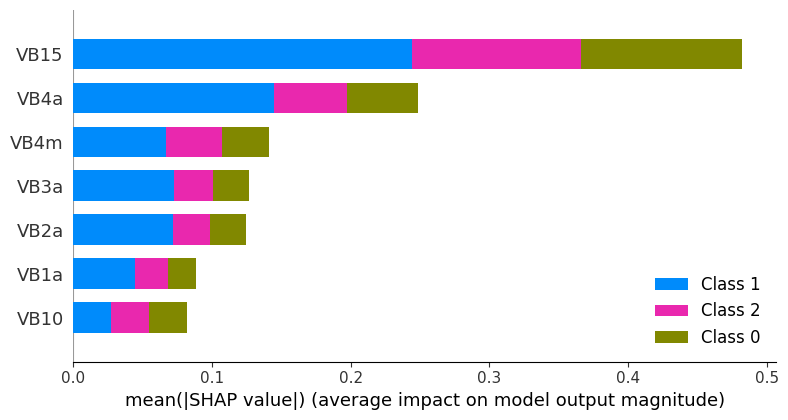

In [ ]:
import shap

explainer = shap.Explainer(model)
shap_values = explainer(X_val)

shap.summary_plot(shap_values, X_val)


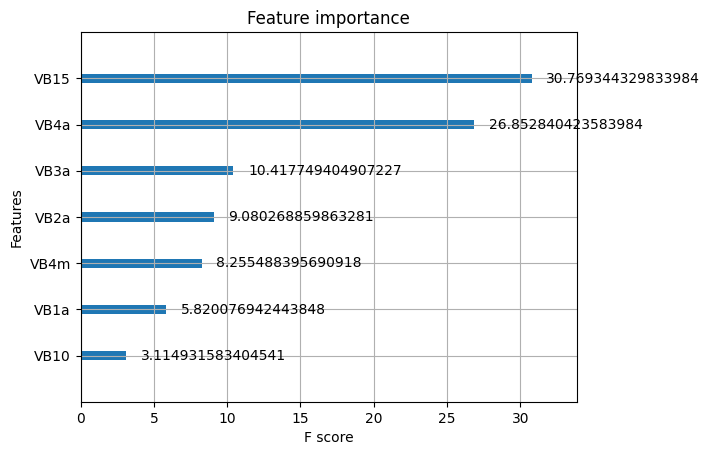

In [ ]:
import matplotlib.pyplot as plt
xgb.plot_importance(model, importance_type='gain')  # gain, weight, cover
plt.show()


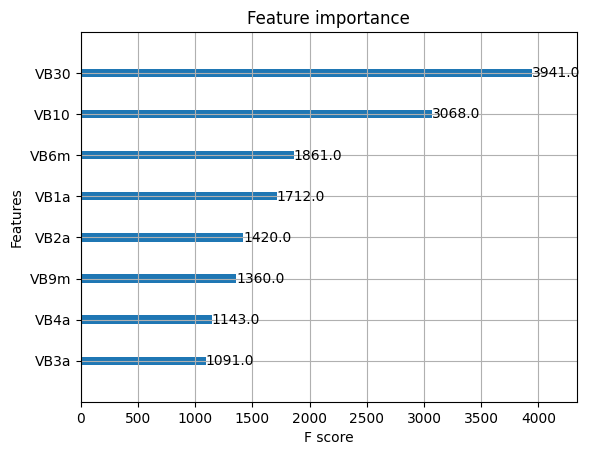

In [ ]:
import matplotlib.pyplot as plt
xgb.plot_importance(model, importance_type='weight')
plt.show()


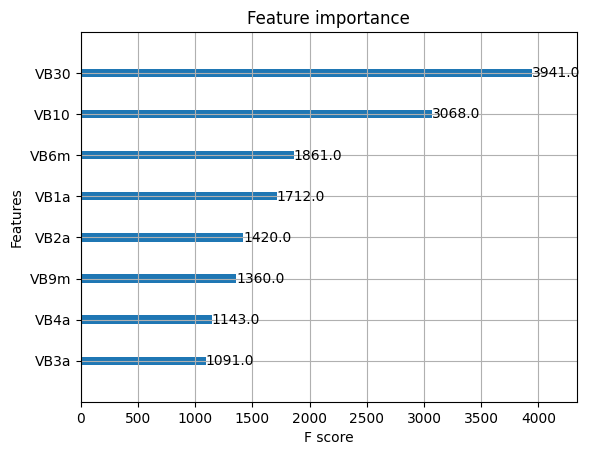

In [ ]:
import matplotlib.pyplot as plt
xgb.plot_importance(model, importance_type='weight')
plt.show()

**RESUMEN**

B1

In [ ]:
# ["VB15", 'VB10', "VB_1PCA_1", "VB_1PCA_2", "VB_PCA_3"]
# ['VB10', 'VB_1PCA_1', 'VB_1PCA_2']
#Los PCA son con: ['VB15','VB30', 'VB1h', 'VB2h', 'VB4h', 'VB6h']

#fuerte en clase neutra 0,9. Debil-regular en extremos
# 📊 MATRIZ DE CONFUSIÓN (VALIDATION):
# [[22285  2137 14288]
#  [ 1040 37858   692]
#  [22116  2140 14026]]
# 📄 REPORT (VALIDATION):
#               precision    recall  f1-score   support

#            0       0.49      0.58      0.53     38710
#            1       0.90      0.96      0.93     39590
#            2       0.48      0.37      0.42     38282

#     accuracy                           0.64    116582
#    macro avg       0.62      0.63      0.62    116582
# weighted avg       0.63      0.64      0.63    116582

# 📊 MATRIZ DE CONFUSIÓN (TEST):
# [[11166  1003  7186]
#  [  535 18891   369]
#  [11078  1029  7035]]
# 📄 REPORT (TEST):
#               precision    recall  f1-score   support

#            0       0.49      0.58      0.53     19355
#            1       0.90      0.95      0.93     19795
#            2       0.48      0.37      0.42     19142

#     accuracy                           0.64     58292
#    macro avg       0.63      0.63      0.63     58292
# weighted avg       0.63      0.64      0.63     58292

B2

In [ ]:
# "VB10", "VB15", "VB30", "VB_2PCA_1", "VB_2PCA_2"
# "VB10", "VB_2PCA_1", "VB15", "VB_2PCA_2"
# PCA armados con: ['VB3m', 'VB4m', 'VB5m', 'VB6m', 'VB9m', 'VB1a', 'VB2a', "VB3a"]

# 📊 MATRIZ DE CONFUSIÓN (VALIDATION):
# [[23473  4694 15409]
#  [ 4668 22591  2860]
#  [22363  4612 15912]]
# 📄 REPORT (VALIDATION):
#               precision    recall  f1-score   support

#            0       0.46      0.54      0.50     43576
#            1       0.71      0.75      0.73     30119
#            2       0.47      0.37      0.41     42887

#     accuracy                           0.53    116582
#    macro avg       0.55      0.55      0.55    116582
# weighted avg       0.53      0.53      0.53    116582

# 📊 MATRIZ DE CONFUSIÓN (TEST):
# [[11647  2374  7767]
#  [ 2234 11422  1404]
#  [11151  2345  7948]]
# 📄 REPORT (TEST):
#               precision    recall  f1-score   support

#            0       0.47      0.53      0.50     21788
#            1       0.71      0.76      0.73     15060
#            2       0.46      0.37      0.41     21444

#     accuracy                           0.53     58292
#    macro avg       0.55      0.55      0.55     58292
# weighted avg       0.53      0.53      0.53     58292

B3

In [ ]:
# "VB1a", 'VB2a', 'VB3a', 'VB4a' "VB10", 'VB30', 'VB6m', 'VB9m'
# MODELO dummy, todo 0,5%
#
# 📊 MATRIZ DE CONFUSIÓN (VALIDATION):
# [[21376  4047 12398]
#  [ 7065 10114  4226]
#  [19725  4139 13332]]
# 📄 REPORT (VALIDATION):
#               precision    recall  f1-score   support

#            0       0.44      0.57      0.50     37821
#            1       0.55      0.47      0.51     21405
#            2       0.45      0.36      0.40     37196

#     accuracy                           0.46     96422
#    macro avg       0.48      0.47      0.47     96422
# weighted avg       0.47      0.46      0.46     96422

# 📊 MATRIZ DE CONFUSIÓN (TEST):
# [[10633  2110  6168]
#  [ 3418  5112  2172]
#  [ 9967  1937  6695]]
# 📄 REPORT (TEST):
#               precision    recall  f1-score   support

#            0       0.44      0.56      0.50     18911
#            1       0.56      0.48      0.51     10702
#            2       0.45      0.36      0.40     18599

#     accuracy                           0.47     48212
#    macro avg       0.48      0.47      0.47     48212
# weighted avg       0.47      0.47      0.46     48212

Por si sola la volatilidad pierde mucho poder predictivo en BTC, a 5 minutos, marca muy bien la tendencia, pero en 15 ya es casi 100% dummy, esto es llamativo
porque en todos los analisis se extrae de manera cauteloza las variables más influyentes de este universo, para su respectivo B (B, B1 y B2)

#VVo

In [ ]:
# Definir las ventanas para calcular volatilidad
ventanas_vol = {
    "5": 1,
    "10": 2,
    "15": 3,
    "30": 6,
    "1h": 12,
    "2h": 24,
    "4h": 48,
    "6h": 72,
    "8h": 96,
    "12h": 144,
    "1d": 288,
    "3d": 864,
    "4d": 1152,
    "5d": 1440,
    "1s": 2160,
    "2s": 4320,
    "1m": 9132,
    "2m": 18264,
    "3m": 27369,
    "4m": 36528,
    "5m": 45660,
    "6m": 54792,
    "9m": 82188,
    "1a": 109575,
    "2a": 219150,
    "3a": 328725,
    "4a": 438300
}
# Calcular SD y Volatilidad (VB) para cada ventana
for nombre, ventana in ventanas_vol.items():
    vosd_col = f"VoSD_{ventana}"
    vvo_col = f"VVo{nombre}"

    mf1[vosd_col] = mf1["Volume"].rolling(window=ventana, min_periods=ventana).std()
    mf1[vvo_col] = mf1[vosd_col] * np.sqrt(ventana)

/tmp/ipython-input-36-2927048649.py:36: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1[vosd_col] = mf1["Volume"].rolling(window=ventana, min_periods=ventana).std()
/tmp/ipython-input-36-2927048649.py:37: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1[vvo_col] = mf1[vosd_col] * np.sqrt(ventana)
/tmp/ipython-input-36-2927048649.py:36: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.

**MCP1**

In [ ]:
print(mf1.columns.tolist())

['Datetime', 'High', 'Low', 'Close', 'Volume', 'ETH_Close', 'ETH_Volume', 'USDT_Close', 'USDT_Volume', 'XRP_Close', 'XRP_Volume', 'SOL_Close', 'SOL_Volume', 'DOGE_Close', 'DOGE_Volume', 'VoM', 'DominanciaBTC', 'MC', 'MCM', 'DominanciaMBTC', 'cp2', 'vp2', 'B', 'B1', 'SD_1', 'VB5', 'SD_2', 'VB10', 'SD_3', 'VB15', 'SD_6', 'VB30', 'SD_12', 'VB1h', 'SD_24', 'VB2h', 'SD_48', 'VB4h', 'SD_72', 'VB6h', 'SD_144', 'VB12h', 'SD_288', 'VB1d', 'SD_864', 'VB3d', 'SD_1152', 'VB4d', 'SD_1440', 'VB5d', 'SD_2016', 'VB1s', 'SD_4032', 'VB2s', 'SD_8064', 'VB1m', 'SD_16128', 'VB2m', 'SD_24192', 'VB3m', 'SD_32256', 'VB4m', 'SD_40320', 'VB5m', 'SD_48384', 'VB6m', 'SD_72576', 'VB9m', 'SD_100800', 'VB1a', 'SD_201600', 'VB2a', 'SD_302400', 'VB3a', 'VB_PCA_1', 'VB_PCA_2', 'VB_PCA_3', 'VB_PCA_4', 'QBpc', 'QSD_1', 'VQ5', 'QSD_2', 'VQ10', 'QSD_3', 'VQ15', 'QSD_6', 'VQ30', 'QSD_12', 'VQ1h', 'QSD_24', 'VQ2h', 'QSD_48', 'VQ4h', 'QSD_72', 'VQ6h', 'QSD_144', 'VQ12h', 'QSD_288', 'VQ1d', 'QSD_864', 'VQ3d', 'QSD_1152', 'VQ4d

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ["VVo5","VVo10", "VVo15", "VVo30", "VVo1h", "VVo2h", "VVo4h", "VVo6h", "VVo8h", "VVo12h", "VVo1d",
 "VVo3d", "VVo4d", "VVo5d", "VVo1s", "VVo2s", "VVo1m", "VVo2m", "VVo3m", "VVo4m", "VVo5m",
 "VVo6m", "VVo9m", "VVo1a", "VVo2a", "VVo3a", "VVo4a"]

# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B1'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)


   Variable  Mutual Information
23    VVo1a            0.045781
25    VVo3a            0.045548
21    VVo6m            0.044960
22    VVo9m            0.044679
19    VVo4m            0.044491
20    VVo5m            0.043736
24    VVo2a            0.043400
18    VVo3m            0.042945
17    VVo2m            0.041190
26    VVo4a            0.040700
16    VVo1m            0.033821
15    VVo2s            0.032671
4     VVo1h            0.032584
5     VVo2h            0.032362
6     VVo4h            0.031760
7     VVo6h            0.031166
3     VVo30            0.030081
8     VVo8h            0.030069
14    VVo1s            0.029675
9    VVo12h            0.028044
10    VVo1d            0.027879
13    VVo5d            0.026805
12    VVo4d            0.026282
11    VVo3d            0.025532
2     VVo15            0.024786
1     VVo10            0.019254
0      VVo5            0.000673


In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ["VVo30", "VVo1h", "VVo2h", "VVo4h", "VVo6h"]
# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=4)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
for i in range(4):
    mf1.loc[subset.index, f'VVo_1PCA1_{i+1}'] = principal_component[:, i]

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = [ "VVo6m", "VVo9m", "VVo1a", "VVo2a", "VVo3a", "VVo4a"]
# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=4)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
for i in range(4):
    mf1.loc[subset.index, f'VVo_1PCA2_{i+1}'] = principal_component[:, i]

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ['VVo_1PCA1_1', 'VVo_1PCA1_2', 'VVo_1PCA1_3', 'VVo_1PCA1_4', 'VVo_1PCA2_1', 'VVo_1PCA2_2', 'VVo_1PCA2_3', 'VVo_1PCA2_4']
# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B1'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)


      Variable  Mutual Information
4  VVo_1PCA2_1            0.040345
7  VVo_1PCA2_4            0.033368
5  VVo_1PCA2_2            0.033168
6  VVo_1PCA2_3            0.032971
0  VVo_1PCA1_1            0.027445
1  VVo_1PCA1_2            0.015226
2  VVo_1PCA1_3            0.013612
3  VVo_1PCA1_4            0.010530


In [ ]:
# variables = ["VVo10", "VVo15", "VVo30", "VVo1h", "VVo2h", "VVo4h", "VVo6h"]
# loadings = pd.Series(pca.components_[0], index=variables)

# print("Cargas del primer componente:")
# print(loadings.sort_values(ascending=False))

# print("\nVarianza explicada por el primer componente:")
# print(pca.explained_variance_ratio_[0])


Cargas del primer componente:
VB1h     0.378367
VB30     0.377974
VB2h     0.369040
VB15     0.367628
VB10     0.346867
VB4h     0.329978
VB6h     0.295419
VB12h    0.268562
VB1d     0.232450
dtype: float64

Varianza explicada por el primer componente:
0.5985023096380601


In [ ]:
# variables = ["VVo2m", "VVo3m", "VVo4m", "VVo5m", "VVo6m", "VVo9m", "VVo1a", "VVo2a", "VVo3a", "VVo4a"]
# loadings = pd.Series(pca.components_[0], index=variables)

# print("Cargas del primer componente:")
# print(loadings.sort_values(ascending=False))

# print("\nVarianza explicada por el primer componente:")
# print(pca.explained_variance_ratio_[0])


In [ ]:
# Esto es porque el PCA cuenta con las apuestas de corto plazo y los otros con las largas

#"Optimo":
#['VVo1h', 'VVo2h', "VVo2s", "VVo1m", "VVo2m", "VVo3m", "VVo4m", "VVo5m", "VVo6m", "VVo9m", "VVo1a", "VVo2a", "VVo3a", "VVo4a"]

#Optimo:
#['VVo_1PCA1_1', "VVo2s", "VVo1m", "VVo2m", "VVo3m", "VVo4m", "VVo5m", "VVo6m", "VVo9m", "VVo1a", "VVo2a", "VVo3a", "VVo4a"]

**MCP2**

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ["VVo5","VVo10", "VVo15", "VVo30", "VVo1h", "VVo2h", "VVo4h", "VVo6h", "VVo12h", "VVo1d",
 "VVo3d", "VVo4d", "VVo5d", "VVo1s", "VVo2s", "VVo1m", "VVo2m", "VVo3m", "VVo4m", "VVo5m",
 "VVo6m", "VVo9m", "VVo1a", "VVo2a", "VVo3a", "VVo4a"]

# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B2'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)

   Variable  Mutual Information
20    VVo6m            0.066667
19    VVo5m            0.066269
21    VVo9m            0.065989
18    VVo4m            0.065780
22    VVo1a            0.065601
23    VVo2a            0.063992
24    VVo3a            0.063372
17    VVo3m            0.062507
16    VVo2m            0.057192
25    VVo4a            0.056636
15    VVo1m            0.046505
14    VVo2s            0.039831
13    VVo1s            0.030942
12    VVo5d            0.025379
5     VVo2h            0.024404
11    VVo4d            0.023977
4     VVo1h            0.023673
6     VVo4h            0.023359
9     VVo1d            0.022629
7     VVo6h            0.022558
10    VVo3d            0.022166
8    VVo12h            0.021837
3     VVo30            0.020636
2     VVo15            0.017496
1     VVo10            0.012924
0      VVo5            0.000469


In [ ]:
# "VVo9m", "VVo1a", "VVo2a", "VVo3a", "VVo4a"
# + PCA 5<=VBs<=2m +  PCA 2m<VBs<=6m

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ["VVo10", "VVo15", "VVo30", "VVo1h", "VVo2h", "VVo4h", "VVo6h", "VVo12h", "VVo1d",
 "VVo3d", "VVo4d", "VVo5d", "VVo1s", "VVo2s", "VVo1m", "VVo2m"]

# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=4)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
for i in range(4):
    mf1.loc[subset.index, f'VVo_2PCA1_{i+1}'] = principal_component[:, i]

/tmp/ipython-input-152-1147587152.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VVo_2PCA1_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-152-1147587152.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VVo_2PCA1_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-152-1147587152.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ["VVo3m", "VVo4m", "VVo5m","VVo6m"]

# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=4)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
for i in range(4):
    mf1.loc[subset.index, f'VVo_2PCA2_{i+1}'] = principal_component[:, i]

/tmp/ipython-input-153-4110807015.py:24: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VVo_2PCA2_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-153-4110807015.py:24: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VVo_2PCA2_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-153-4110807015.py:24: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

In [ ]:
print(mf1.columns.tolist())

['Datetime', 'High', 'Low', 'Close', 'Volume', 'ETH_Close', 'ETH_Volume', 'USDT_Close', 'USDT_Volume', 'XRP_Close', 'XRP_Volume', 'SOL_Close', 'SOL_Volume', 'DOGE_Close', 'DOGE_Volume', 'VoM', 'DominanciaBTC', 'MC', 'MCM', 'DominanciaMBTC', 'cp2', 'vp2', 'B', 'B1', 'SD_1', 'VB5', 'SD_2', 'VB10', 'SD_3', 'VB15', 'SD_6', 'VB30', 'SD_12', 'VB1h', 'SD_24', 'VB2h', 'SD_48', 'VB4h', 'SD_72', 'VB6h', 'SD_144', 'VB12h', 'SD_288', 'VB1d', 'SD_864', 'VB3d', 'SD_1152', 'VB4d', 'SD_1440', 'VB5d', 'SD_2016', 'VB1s', 'SD_4032', 'VB2s', 'SD_8064', 'VB1m', 'SD_16128', 'VB2m', 'SD_24192', 'VB3m', 'SD_32256', 'VB4m', 'SD_40320', 'VB5m', 'SD_48384', 'VB6m', 'SD_72576', 'VB9m', 'SD_100800', 'VB1a', 'SD_201600', 'VB2a', 'SD_302400', 'VB3a', 'VB_PCA_1', 'VB_PCA_2', 'VB_PCA_3', 'VB_PCA_4', 'QBpc', 'QSD_1', 'VQ5', 'QSD_2', 'VQ10', 'QSD_3', 'VQ15', 'QSD_6', 'VQ30', 'QSD_12', 'VQ1h', 'QSD_24', 'VQ2h', 'QSD_48', 'VQ4h', 'QSD_72', 'VQ6h', 'QSD_144', 'VQ12h', 'QSD_288', 'VQ1d', 'QSD_864', 'VQ3d', 'QSD_1152', 'VQ4d

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ["VB2a", 'VB3a', 'VB_1PCA_1', 'VVo_2PCA1_1', 'VVo_2PCA1_2',
            'VVo_2PCA1_3', 'VVo_2PCA1_4', 'VVo_2PCA2_1', 'VVo_2PCA2_2',
            'VVo_2PCA2_3', 'VVo_2PCA2_4']
# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B2'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)


       Variable  Mutual Information
0          VB2a            0.060506
11  VVo_2PCA2_1            0.060249
1          VB3a            0.059364
12  VVo_2PCA2_2            0.038896
13  VVo_2PCA2_3            0.028285
14  VVo_2PCA2_4            0.023614
7   VVo_2PCA1_1            0.021293
3    VVo_2PCA_1            0.021260
2     VB_1PCA_1            0.021239
8   VVo_2PCA1_2            0.013714
4    VVo_2PCA_2            0.013570
9   VVo_2PCA1_3            0.011014
5    VVo_2PCA_3            0.010856
10  VVo_2PCA1_4            0.007431
6    VVo_2PCA_4            0.007328


In [ ]:
# variables = ['VB3m', 'VB4m', 'VB5m', 'VB6m', 'VB9m', 'VB1a', 'VB2a', "VB3a"]
# loadings = pd.Series(pca.components_[1], index=variables)

# print("Cargas del x componente:")
# print(loadings.sort_values(ascending=False))

# print("\nVarianza explicada por el x componente:")
# print(pca.explained_variance_ratio_[1])


Cargas del x componente:
VB3a    0.578321
VB2a    0.494974
VB1a    0.211773
VB9m    0.041496
VB6m   -0.198352
VB5m   -0.292615
VB3m   -0.348815
VB4m   -0.356842
dtype: float64

Varianza explicada por el x componente:
0.14030230034736205


In [ ]:
# "VVo_2PCA2_1", "VVo9m", "VVo1a", "VVo2a", "VVo3a", "VVo4a"

**MCP3**

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ["VVo5","VVo10", "VVo15", "VVo30", "VVo1h", "VVo2h", "VVo4h", "VVo6h", "VVo12h", "VVo1d",
 "VVo3d", "VVo4d", "VVo5d", "VVo1s", "VVo2s", "VVo1m", "VVo2m", "VVo3m", "VVo4m", "VVo5m",
 "VVo6m", "VVo9m", "VVo1a", "VVo2a", "VVo3a", "VVo4a"]

# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B3'].fillna(2).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)

   Variable  Mutual Information
19    VVo5m            0.087657
20    VVo6m            0.087413
21    VVo9m            0.087249
22    VVo1a            0.085833
23    VVo2a            0.085743
24    VVo3a            0.084651
18    VVo4m            0.084140
17    VVo3m            0.081583
25    VVo4a            0.075102
16    VVo2m            0.073615
15    VVo1m            0.058866
14    VVo2s            0.046917
13    VVo1s            0.033118
12    VVo5d            0.025330
11    VVo4d            0.023419
10    VVo3d            0.022708
9     VVo1d            0.020893
6     VVo4h            0.019216
7     VVo6h            0.018960
8    VVo12h            0.018592
5     VVo2h            0.018429
4     VVo1h            0.018171
3     VVo30            0.017326
2     VVo15            0.014005
1     VVo10            0.010396
0      VVo5            0.000000


In [ ]:
#  "VVo2a", "VVo3a"
# + PCA  ["VVo3m", "VVo4m", "VVo5m", "VVo6m", "VVo9m", "VVo1a"]

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ["VVo3m", "VVo4m", "VVo5m", "VVo6m", "VVo9m", "VVo1a"]

# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=4)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
for i in range(4):
    mf1.loc[subset.index, f'VVo_3PCA_{i+1}'] = principal_component[:, i]

/tmp/ipython-input-164-197435489.py:24: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VVo_3PCA_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-164-197435489.py:24: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VVo_3PCA_{i+1}'] = principal_component[:, i]


In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ['VB1m', 'VB2m', 'VB3m',
             'VB4m', 'VB5m', 'VB6m', 'VB9m']

# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=4)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
for i in range(4):
    mf1.loc[subset.index, f'VB_2PCA2_{i+1}'] = principal_component[:, i]

/tmp/ipython-input-124-2416292975.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VB_2PCA2_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-124-2416292975.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VB_2PCA2_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-124-2416292975.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at on

In [ ]:
print(mf1.columns.tolist())

['Datetime', 'High', 'Low', 'Close', 'Volume', 'ETH_Close', 'ETH_Volume', 'USDT_Close', 'USDT_Volume', 'XRP_Close', 'XRP_Volume', 'SOL_Close', 'SOL_Volume', 'DOGE_Close', 'DOGE_Volume', 'VoM', 'DominanciaBTC', 'MC', 'MCM', 'DominanciaMBTC', 'cp2', 'vp2', 'B', 'B1', 'SD_1', 'VB5', 'SD_2', 'VB10', 'SD_3', 'VB15', 'SD_6', 'VB30', 'SD_12', 'VB1h', 'SD_24', 'VB2h', 'SD_48', 'VB4h', 'SD_72', 'VB6h', 'SD_144', 'VB12h', 'SD_288', 'VB1d', 'SD_864', 'VB3d', 'SD_1152', 'VB4d', 'SD_1440', 'VB5d', 'SD_2016', 'VB1s', 'SD_4032', 'VB2s', 'SD_8064', 'VB1m', 'SD_16128', 'VB2m', 'SD_24192', 'VB3m', 'SD_32256', 'VB4m', 'SD_40320', 'VB5m', 'SD_48384', 'VB6m', 'SD_72576', 'VB9m', 'SD_100800', 'VB1a', 'SD_201600', 'VB2a', 'SD_302400', 'VB3a', 'VB_PCA_1', 'VB_PCA_2', 'VB_PCA_3', 'VB_PCA_4', 'QBpc', 'QSD_1', 'VQ5', 'QSD_2', 'VQ10', 'QSD_3', 'VQ15', 'QSD_6', 'VQ30', 'QSD_12', 'VQ1h', 'QSD_24', 'VQ2h', 'QSD_48', 'VQ4h', 'QSD_72', 'VQ6h', 'QSD_144', 'VQ12h', 'QSD_288', 'VQ1d', 'QSD_864', 'VQ3d', 'QSD_1152', 'VQ4d

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ["VVo9m", "VVo1a", 'VVo_3PCA_1', 'VVo_3PCA_2', 'VVo_3PCA_3', 'VVo_3PCA_4']
# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B3'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)


     Variable  Mutual Information
0       VVo9m            0.084252
1       VVo1a            0.082679
2  VVo_3PCA_1            0.079326
3  VVo_3PCA_2            0.060717
4  VVo_3PCA_3            0.050663
5  VVo_3PCA_4            0.044476


In [ ]:
# variables = ['VB3m', 'VB4m', 'VB5m', 'VB6m', 'VB9m', 'VB1a', 'VB2a', "VB3a"]
# loadings = pd.Series(pca.components_[1], index=variables)

# print("Cargas del x componente:")
# print(loadings.sort_values(ascending=False))

# print("\nVarianza explicada por el x componente:")
# print(pca.explained_variance_ratio_[1])


Cargas del x componente:
VB3a    0.578321
VB2a    0.494974
VB1a    0.211773
VB9m    0.041496
VB6m   -0.198352
VB5m   -0.292615
VB3m   -0.348815
VB4m   -0.356842
dtype: float64

Varianza explicada por el x componente:
0.14030230034736205


In [ ]:
#  "VVo_3PCA_1", "VVo_3PCA_2", "VVo9m", "VVo1a", "VVo2a", "VVo3a"

**SHAP ZONE**

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import xgboost as xgb
import matplotlib.pyplot as plt
import numpy as np

# Variables explicativas y objetivo
features = list(set(['VVo1h', 'VVo2h', "VVo2s", "VVo1m", "VVo2m", "VVo3m", "VVo4m", "VVo5m", "VVo6m", "VVo9m", "VVo1a", "VVo2a", "VVo3a", "VVo4a"]))

target = "B1"

# Eliminar filas con NaN
df = mf1[features + [target]].dropna()
df[target] = df[target].astype(int)

# Definir X e y
X = df[features]
y = df[target]

# División: 70% train, 30% temp
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.30, stratify=y, random_state=42)

# División: 20% validation, 10% test (sobre el 30% restante)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=1/3, stratify=y_temp, random_state=42)


# Entrenar modelo multiclase
model = xgb.XGBClassifier(
    objective='multi:softmax',
    num_class=3,
    n_estimators=100,
    max_depth=6,
    learning_rate=0.1,
    use_label_encoder=False,
    eval_metric='mlogloss'
)

model.fit(X_train, y_train)

# --- Evaluación en validation ---
y_val_pred = model.predict(X_val)
print("📊 MATRIZ DE CONFUSIÓN (VALIDATION):")
print(confusion_matrix(y_val, y_val_pred))
print("📄 REPORT (VALIDATION):")
print(classification_report(y_val, y_val_pred))

# --- Evaluación en test ---
y_test_pred = model.predict(X_test)
print("📊 MATRIZ DE CONFUSIÓN (TEST):")
print(confusion_matrix(y_test, y_test_pred))
print("📄 REPORT (TEST):")
print(classification_report(y_test, y_test_pred))


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [01:56:50] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


📊 MATRIZ DE CONFUSIÓN (VALIDATION):
[[ 8977 10829  8814]
 [ 5885 21278  5171]
 [ 9120 10880  8448]]
📄 REPORT (VALIDATION):
              precision    recall  f1-score   support

           0       0.37      0.31      0.34     28620
           1       0.49      0.66      0.56     32334
           2       0.38      0.30      0.33     28448

    accuracy                           0.43     89402
   macro avg       0.42      0.42      0.41     89402
weighted avg       0.42      0.43      0.42     89402

📊 MATRIZ DE CONFUSIÓN (TEST):
[[ 4538  5502  4270]
 [ 2812 10899  2457]
 [ 4488  5381  4355]]
📄 REPORT (TEST):
              precision    recall  f1-score   support

           0       0.38      0.32      0.35     14310
           1       0.50      0.67      0.57     16168
           2       0.39      0.31      0.34     14224

    accuracy                           0.44     44702
   macro avg       0.43      0.43      0.42     44702
weighted avg       0.43      0.44      0.43     44702



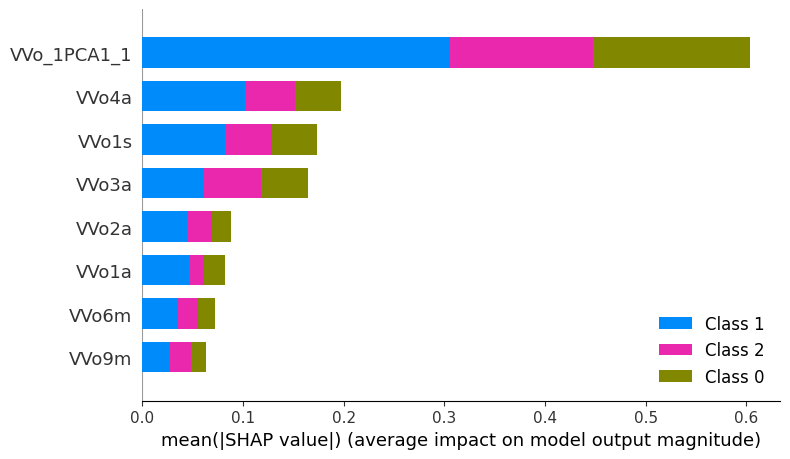

In [ ]:
import shap

explainer = shap.Explainer(model)
shap_values = explainer(X_val)

shap.summary_plot(shap_values, X_val)


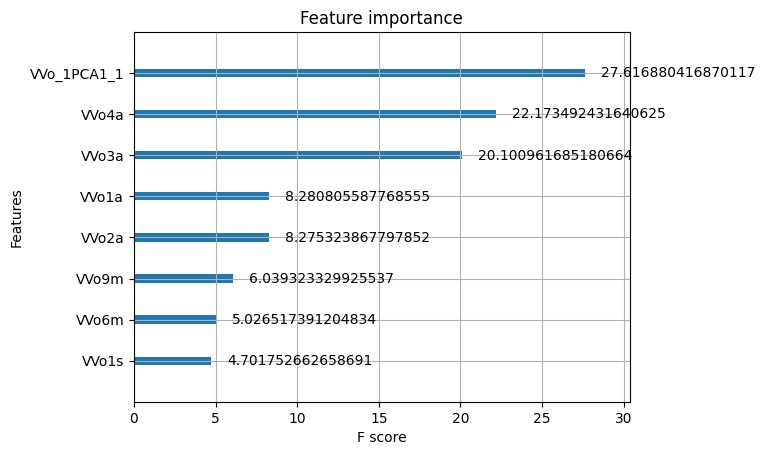

In [ ]:
import matplotlib.pyplot as plt
xgb.plot_importance(model, importance_type='gain')  # gain, weight, cover
plt.show()


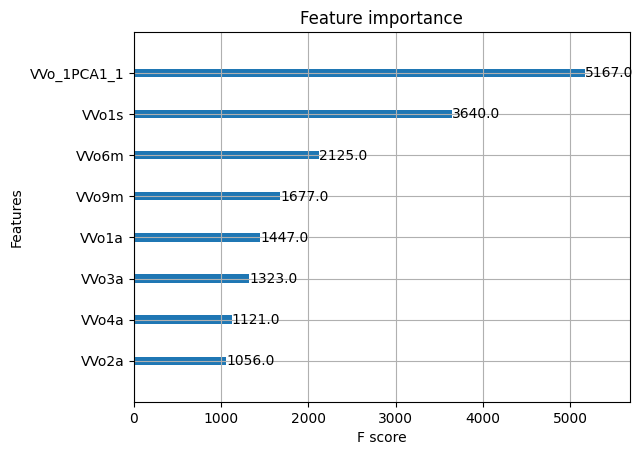

In [ ]:
import matplotlib.pyplot as plt
xgb.plot_importance(model, importance_type='weight')
plt.show()


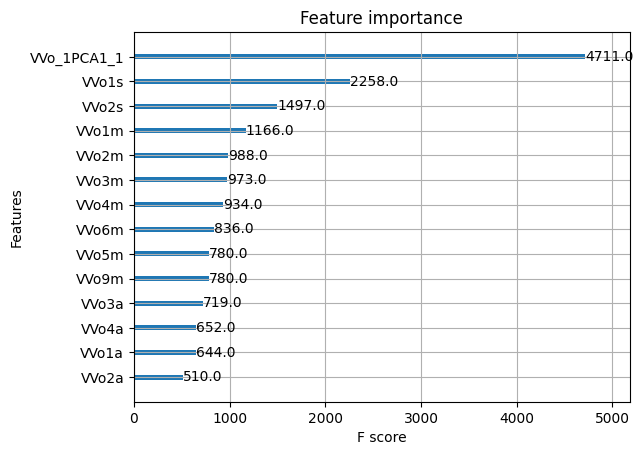

In [ ]:
import matplotlib.pyplot as plt
xgb.plot_importance(model, importance_type='weight')
plt.show()

**RESUMEN**

B1

In [ ]:
# ['VVo_1PCA1_1', "VVo2m", "VVo3m", "VVo4m", "VVo9m", "VVo1a", "VVo3a"]
#Los PCA son con: ["VVo10", "VVo15", "VVo30", "VVo1h", "VVo2h", "VVo4h", "VVo6h"]

# 📊 MATRIZ DE CONFUSIÓN (VALIDATION):
# [[14167 12248 12295]
#  [ 8341 24323  6925]
#  [14120 12252 11911]]
# 📄 REPORT (VALIDATION):
#               precision    recall  f1-score   support

#            0       0.39      0.37      0.38     38710
#            1       0.50      0.61      0.55     39589
#            2       0.38      0.31      0.34     38283

#     accuracy                           0.43    116582
#    macro avg       0.42      0.43      0.42    116582
# weighted avg       0.42      0.43      0.42    116582

# 📊 MATRIZ DE CONFUSIÓN (TEST):
# [[ 7076  6153  6126]
#  [ 4271 12182  3342]
#  [ 7070  6092  5980]]
# 📄 REPORT (TEST):
#               precision    recall  f1-score   support

#            0       0.38      0.37      0.37     19355
#            1       0.50      0.62      0.55     19795
#            2       0.39      0.31      0.35     19142

#     accuracy                           0.43     58292
#    macro avg       0.42      0.43      0.42     58292
# weighted avg       0.42      0.43      0.43     58292

B2

In [ ]:
# "VVo_2PCA2_1", "VVo9m", "VVo1a", "VVo2a", "VVo3a", "VVo4a"
# "VVo_2PCA2_1", "VVo9m", "VVo1a", "VVo2a", "VVo3a", "VVo4a"
# PCA armados con: ['VB1m', 'VB2m', 'VB3m', 'VB4m', 'VB5m', 'VB6m', 'VB9m']

# 📊 MATRIZ DE CONFUSIÓN (VALIDATION):
# [[17313  5301 13090]
#  [ 9663  8775  7030]
#  [16623  5237 13390]]
# 📄 REPORT (VALIDATION):
#               precision    recall  f1-score   support

#            0       0.40      0.48      0.44     35704
#            1       0.45      0.34      0.39     25468
#            2       0.40      0.38      0.39     35250

#     accuracy                           0.41     96422
#    macro avg       0.42      0.40      0.41     96422
# weighted avg       0.41      0.41      0.41     96422

# 📊 MATRIZ DE CONFUSIÓN (TEST):
# [[8629 2698 6525]
#  [4808 4418 3508]
#  [8351 2587 6688]]
# 📄 REPORT (TEST):
#               precision    recall  f1-score   support

#            0       0.40      0.48      0.44     17852
#            1       0.46      0.35      0.39     12734
#            2       0.40      0.38      0.39     17626

#     accuracy                           0.41     48212
#    macro avg       0.42      0.40      0.41     48212
# weighted avg       0.41      0.41      0.41     48212

B3

In [ ]:
# ""VVo_3PCA_1", "VVo_3PCA_2", "VVo9m", "VVo1a", "VVo2a", "VVo3a"

#LOS PCA ENTORPECIAN EL MODELO. MODELO SIN PCAs:

# 📊 MATRIZ DE CONFUSIÓN (VALIDATION):
# [[27744  2974 15350]
#  [13073  4898  7353]
#  [26247  2983 15960]]
# 📄 REPORT (VALIDATION):
#               precision    recall  f1-score   support

#            0       0.41      0.60      0.49     46068
#            1       0.45      0.19      0.27     25324
#            2       0.41      0.35      0.38     45190

#     accuracy                           0.42    116582
#    macro avg       0.43      0.38      0.38    116582
# weighted avg       0.42      0.42      0.40    116582

# 📊 MATRIZ DE CONFUSIÓN (TEST):
# [[13884  1506  7644]
#  [ 6574  2350  3738]
#  [13170  1441  7985]]
# 📄 REPORT (TEST):
#               precision    recall  f1-score   support

#            0       0.41      0.60      0.49     23034
#            1       0.44      0.19      0.26     12662
#            2       0.41      0.35      0.38     22596

#     accuracy                           0.42     58292
#    macro avg       0.42      0.38      0.38     58292
# weighted avg       0.42      0.42      0.40     58292

Por si sola la volatilidad pierde mucho poder predictivo en BTC, a 5 minutos, marca muy bien la tendencia, pero en 15 ya es casi 100% dummy, esto es llamativo
porque en todos los analisis se extrae de manera cauteloza las variables más influyentes de este universo, para su respectivo B (B, B1 y B2)

#VoV

In [ ]:
# VoV
for nombre in ventanas_vol.keys():
    vb_col = f"VB{nombre}"
    vov_col = f"VoV{nombre}"

    if vb_col in mf1.columns:
        mf1[vov_col] = np.sqrt(mf1["Volume"] * mf1[vb_col])


/tmp/ipython-input-40-589197120.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1[vov_col] = np.sqrt(mf1["Volume"] * mf1[vb_col])
/tmp/ipython-input-40-589197120.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1[vov_col] = np.sqrt(mf1["Volume"] * mf1[vb_col])
/tmp/ipython-input-40-589197120.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get 

**MCP1**

In [ ]:
print(mf1.columns.tolist())

['Datetime', 'High', 'Low', 'Close', 'Volume', 'ETH_Close', 'ETH_Volume', 'USDT_Close', 'USDT_Volume', 'XRP_Close', 'XRP_Volume', 'SOL_Close', 'SOL_Volume', 'DOGE_Close', 'DOGE_Volume', 'VoM', 'DominanciaBTC', 'MC', 'MCM', 'DominanciaMBTC', 'cp2', 'vp2', 'B', 'B1', 'SD_1', 'VB5', 'SD_2', 'VB10', 'SD_3', 'VB15', 'SD_6', 'VB30', 'SD_12', 'VB1h', 'SD_24', 'VB2h', 'SD_48', 'VB4h', 'SD_72', 'VB6h', 'SD_144', 'VB12h', 'SD_288', 'VB1d', 'SD_864', 'VB3d', 'SD_1152', 'VB4d', 'SD_1440', 'VB5d', 'SD_2016', 'VB1s', 'SD_4032', 'VB2s', 'SD_8064', 'VB1m', 'SD_16128', 'VB2m', 'SD_24192', 'VB3m', 'SD_32256', 'VB4m', 'SD_40320', 'VB5m', 'SD_48384', 'VB6m', 'SD_72576', 'VB9m', 'SD_100800', 'VB1a', 'SD_201600', 'VB2a', 'SD_302400', 'VB3a', 'VB_PCA_1', 'VB_PCA_2', 'VB_PCA_3', 'VB_PCA_4', 'QBpc', 'QSD_1', 'VQ5', 'QSD_2', 'VQ10', 'QSD_3', 'VQ15', 'QSD_6', 'VQ30', 'QSD_12', 'VQ1h', 'QSD_24', 'VQ2h', 'QSD_48', 'VQ4h', 'QSD_72', 'VQ6h', 'QSD_144', 'VQ12h', 'QSD_288', 'VQ1d', 'QSD_864', 'VQ3d', 'QSD_1152', 'VQ4d

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ["VoV5", "VoV10", "VoV15", "VoV30", "VoV1h", "VoV2h", "VoV4h", "VoV6h", "VoV12h",
             "VoV1d", "VoV3d", "VoV4d", "VoV5d", "VoV1s", "VoV2s", "VoV1m", "VoV2m", "VoV3m",
             "VoV4m", "VoV5m", "VoV6m", "VoV9m", "VoV1a", "VoV2a", "VoV3a"]

# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B1'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)


   Variable  Mutual Information
3     VoV30            0.040314
4     VoV1h            0.039449
5     VoV2h            0.037768
2     VoV15            0.037627
6     VoV4h            0.036693
7     VoV6h            0.033958
22    VoV1a            0.033439
1     VoV10            0.032646
8    VoV12h            0.032030
21    VoV9m            0.031552
20    VoV6m            0.031173
19    VoV5m            0.030625
18    VoV4m            0.029663
9     VoV1d            0.029395
24    VoV3a            0.029220
11    VoV4d            0.028574
10    VoV3d            0.028372
13    VoV1s            0.028346
12    VoV5d            0.028097
17    VoV3m            0.027900
14    VoV2s            0.027285
15    VoV1m            0.026612
23    VoV2a            0.026392
16    VoV2m            0.026337
0      VoV5            0.000000


In [ ]:
# "VoV30", "VoV1h"
# PCA corto y PcA largo

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ["VVo10", "VVo15", "VVo30", "VVo1h", "VVo2h", "VVo4h", "VVo6h"]
# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=4)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
for i in range(4):
    mf1.loc[subset.index, f'VVo_1PCA1_{i+1}'] = principal_component[:, i]

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ["VVo4m", "VVo5m", "VVo6m", "VVo9m", "VVo1a"]
# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=4)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
for i in range(4):
    mf1.loc[subset.index, f'VVo_1PCA2_{i+1}'] = principal_component[:, i]

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ['VVo_1PCA1_1', 'VVo_1PCA1_2', 'VVo_1PCA1_3', 'VVo_1PCA1_4', 'VVo_1PCA2_1', 'VVo_1PCA2_2', 'VVo_1PCA2_3', 'VVo_1PCA2_4']
# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B1'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)


      Variable  Mutual Information
4  VVo_1PCA2_1            0.040927
0  VVo_1PCA1_1            0.035481
5  VVo_1PCA2_2            0.033471
6  VVo_1PCA2_3            0.029150
7  VVo_1PCA2_4            0.022454
1  VVo_1PCA1_2            0.019950
2  VVo_1PCA1_3            0.017219
3  VVo_1PCA1_4            0.016122


In [ ]:
# variables = ["VVo10", "VVo15", "VVo30", "VVo1h", "VVo2h", "VVo4h", "VVo6h"]
# loadings = pd.Series(pca.components_[0], index=variables)

# print("Cargas del primer componente:")
# print(loadings.sort_values(ascending=False))

# print("\nVarianza explicada por el primer componente:")
# print(pca.explained_variance_ratio_[0])


Cargas del primer componente:
VB1h     0.378367
VB30     0.377974
VB2h     0.369040
VB15     0.367628
VB10     0.346867
VB4h     0.329978
VB6h     0.295419
VB12h    0.268562
VB1d     0.232450
dtype: float64

Varianza explicada por el primer componente:
0.5985023096380601


In [ ]:
# variables = ["VVo2m", "VVo3m", "VVo4m", "VVo5m", "VVo6m", "VVo9m", "VVo1a", "VVo2a", "VVo3a", "VVo4a"]
# loadings = pd.Series(pca.components_[0], index=variables)

# print("Cargas del primer componente:")
# print(loadings.sort_values(ascending=False))

# print("\nVarianza explicada por el primer componente:")
# print(pca.explained_variance_ratio_[0])


In [ ]:
#Optimo:
# ["VoV30", "VoV1h", "VVo_1PCA1_1", "VVo_1PCA2_1", "VVo_1PCA2_2"]

**MCP2**

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ["VoV5", "VoV10", "VoV15", "VoV30", "VoV1h", "VoV2h", "VoV4h", "VoV6h", "VoV12h",
             "VoV1d", "VoV3d", "VoV4d", "VoV5d", "VoV1s", "VoV2s", "VoV1m", "VoV2m", "VoV3m",
             "VoV4m", "VoV5m", "VoV6m", "VoV9m", "VoV1a", "VoV2a", "VoV3a"]

# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B2'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)

   Variable  Mutual Information
3     VoV30            0.030181
4     VoV1h            0.029734
5     VoV2h            0.029275
2     VoV15            0.028698
6     VoV4h            0.028258
7     VoV6h            0.026736
8    VoV12h            0.025976
22    VoV1a            0.025087
20    VoV6m            0.024740
9     VoV1d            0.024659
19    VoV5m            0.024164
21    VoV9m            0.023417
1     VoV10            0.023179
11    VoV4d            0.023106
18    VoV4m            0.022733
14    VoV2s            0.022153
10    VoV3d            0.021896
13    VoV1s            0.021541
12    VoV5d            0.021414
16    VoV2m            0.020911
24    VoV3a            0.020820
15    VoV1m            0.020723
17    VoV3m            0.020670
23    VoV2a            0.019275
0      VoV5            0.000000


In [ ]:
# "VVo9m", "VVo1a", "VVo2a", "VVo3a", "VVo4a"
# + PCA 5<=VBs<=2m +  PCA 2m<VBs<=6m

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ["VVo10", "VVo15", "VVo30", "VVo1h", "VVo2h", "VVo4h", "VVo6h", "VVo12h", "VVo1d",
 "VVo3d", "VVo4d", "VVo5d", "VVo1s", "VVo2s", "VVo1m", "VVo2m"]

# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=4)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
for i in range(4):
    mf1.loc[subset.index, f'VVo_2PCA1_{i+1}'] = principal_component[:, i]

/tmp/ipython-input-152-1147587152.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VVo_2PCA1_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-152-1147587152.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VVo_2PCA1_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-152-1147587152.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ["VVo3m", "VVo4m", "VVo5m","VVo6m"]

# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=4)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
for i in range(4):
    mf1.loc[subset.index, f'VVo_2PCA2_{i+1}'] = principal_component[:, i]

/tmp/ipython-input-153-4110807015.py:24: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VVo_2PCA2_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-153-4110807015.py:24: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VVo_2PCA2_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-153-4110807015.py:24: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

In [ ]:
print(mf1.columns.tolist())

['Datetime', 'High', 'Low', 'Close', 'Volume', 'ETH_Close', 'ETH_Volume', 'USDT_Close', 'USDT_Volume', 'XRP_Close', 'XRP_Volume', 'SOL_Close', 'SOL_Volume', 'DOGE_Close', 'DOGE_Volume', 'VoM', 'DominanciaBTC', 'MC', 'MCM', 'DominanciaMBTC', 'cp2', 'vp2', 'B', 'B1', 'SD_1', 'VB5', 'SD_2', 'VB10', 'SD_3', 'VB15', 'SD_6', 'VB30', 'SD_12', 'VB1h', 'SD_24', 'VB2h', 'SD_48', 'VB4h', 'SD_72', 'VB6h', 'SD_144', 'VB12h', 'SD_288', 'VB1d', 'SD_864', 'VB3d', 'SD_1152', 'VB4d', 'SD_1440', 'VB5d', 'SD_2016', 'VB1s', 'SD_4032', 'VB2s', 'SD_8064', 'VB1m', 'SD_16128', 'VB2m', 'SD_24192', 'VB3m', 'SD_32256', 'VB4m', 'SD_40320', 'VB5m', 'SD_48384', 'VB6m', 'SD_72576', 'VB9m', 'SD_100800', 'VB1a', 'SD_201600', 'VB2a', 'SD_302400', 'VB3a', 'VB_PCA_1', 'VB_PCA_2', 'VB_PCA_3', 'VB_PCA_4', 'QBpc', 'QSD_1', 'VQ5', 'QSD_2', 'VQ10', 'QSD_3', 'VQ15', 'QSD_6', 'VQ30', 'QSD_12', 'VQ1h', 'QSD_24', 'VQ2h', 'QSD_48', 'VQ4h', 'QSD_72', 'VQ6h', 'QSD_144', 'VQ12h', 'QSD_288', 'VQ1d', 'QSD_864', 'VQ3d', 'QSD_1152', 'VQ4d

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ["VB2a", 'VB3a', 'VB_1PCA_1', 'VVo_2PCA1_1', 'VVo_2PCA1_2',
            'VVo_2PCA1_3', 'VVo_2PCA1_4', 'VVo_2PCA2_1', 'VVo_2PCA2_2',
            'VVo_2PCA2_3', 'VVo_2PCA2_4']
# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B2'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)


       Variable  Mutual Information
0          VB2a            0.060506
11  VVo_2PCA2_1            0.060249
1          VB3a            0.059364
12  VVo_2PCA2_2            0.038896
13  VVo_2PCA2_3            0.028285
14  VVo_2PCA2_4            0.023614
7   VVo_2PCA1_1            0.021293
3    VVo_2PCA_1            0.021260
2     VB_1PCA_1            0.021239
8   VVo_2PCA1_2            0.013714
4    VVo_2PCA_2            0.013570
9   VVo_2PCA1_3            0.011014
5    VVo_2PCA_3            0.010856
10  VVo_2PCA1_4            0.007431
6    VVo_2PCA_4            0.007328


In [ ]:
# variables = ['VB3m', 'VB4m', 'VB5m', 'VB6m', 'VB9m', 'VB1a', 'VB2a', "VB3a"]
# loadings = pd.Series(pca.components_[1], index=variables)

# print("Cargas del x componente:")
# print(loadings.sort_values(ascending=False))

# print("\nVarianza explicada por el x componente:")
# print(pca.explained_variance_ratio_[1])


Cargas del x componente:
VB3a    0.578321
VB2a    0.494974
VB1a    0.211773
VB9m    0.041496
VB6m   -0.198352
VB5m   -0.292615
VB3m   -0.348815
VB4m   -0.356842
dtype: float64

Varianza explicada por el x componente:
0.14030230034736205


In [ ]:
# "VVo_2PCA2_1", "VVo9m", "VVo1a", "VVo2a", "VVo3a", "VVo4a"

**MCP3**

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ["VoV5", "VoV10", "VoV15", "VoV30", "VoV1h", "VoV2h", "VoV4h", "VoV6h", "VoV12h",
             "VoV1d", "VoV3d", "VoV4d", "VoV5d", "VoV1s", "VoV2s", "VoV1m", "VoV2m", "VoV3m",
             "VoV4m", "VoV5m", "VoV6m", "VoV9m", "VoV1a", "VoV2a", "VoV3a"]

# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B3'].fillna(2).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)

   Variable  Mutual Information
4     VoV1h            0.024615
5     VoV2h            0.024509
3     VoV30            0.024216
2     VoV15            0.024066
6     VoV4h            0.023998
7     VoV6h            0.022338
8    VoV12h            0.021186
1     VoV10            0.019925
22    VoV1a            0.019913
18    VoV4m            0.019613
10    VoV3d            0.019415
20    VoV6m            0.019361
19    VoV5m            0.019221
21    VoV9m            0.019032
9     VoV1d            0.018935
14    VoV2s            0.018582
11    VoV4d            0.018405
12    VoV5d            0.018394
13    VoV1s            0.018034
16    VoV2m            0.017363
24    VoV3a            0.017287
15    VoV1m            0.016569
17    VoV3m            0.016465
23    VoV2a            0.015585
0      VoV5            0.000000


In [ ]:
#  "VVo2a", "VVo3a"
# + PCA  ["VVo3m", "VVo4m", "VVo5m", "VVo6m", "VVo9m", "VVo1a"]

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ["VVo3m", "VVo4m", "VVo5m", "VVo6m", "VVo9m", "VVo1a"]

# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=4)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
for i in range(4):
    mf1.loc[subset.index, f'VVo_3PCA_{i+1}'] = principal_component[:, i]

/tmp/ipython-input-164-197435489.py:24: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VVo_3PCA_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-164-197435489.py:24: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VVo_3PCA_{i+1}'] = principal_component[:, i]


In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ['VB1m', 'VB2m', 'VB3m',
             'VB4m', 'VB5m', 'VB6m', 'VB9m']

# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=4)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
for i in range(4):
    mf1.loc[subset.index, f'VB_2PCA2_{i+1}'] = principal_component[:, i]

/tmp/ipython-input-124-2416292975.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VB_2PCA2_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-124-2416292975.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VB_2PCA2_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-124-2416292975.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at on

In [ ]:
print(mf1.columns.tolist())

['Datetime', 'High', 'Low', 'Close', 'Volume', 'ETH_Close', 'ETH_Volume', 'USDT_Close', 'USDT_Volume', 'XRP_Close', 'XRP_Volume', 'SOL_Close', 'SOL_Volume', 'DOGE_Close', 'DOGE_Volume', 'VoM', 'DominanciaBTC', 'MC', 'MCM', 'DominanciaMBTC', 'cp2', 'vp2', 'B', 'B1', 'SD_1', 'VB5', 'SD_2', 'VB10', 'SD_3', 'VB15', 'SD_6', 'VB30', 'SD_12', 'VB1h', 'SD_24', 'VB2h', 'SD_48', 'VB4h', 'SD_72', 'VB6h', 'SD_144', 'VB12h', 'SD_288', 'VB1d', 'SD_864', 'VB3d', 'SD_1152', 'VB4d', 'SD_1440', 'VB5d', 'SD_2016', 'VB1s', 'SD_4032', 'VB2s', 'SD_8064', 'VB1m', 'SD_16128', 'VB2m', 'SD_24192', 'VB3m', 'SD_32256', 'VB4m', 'SD_40320', 'VB5m', 'SD_48384', 'VB6m', 'SD_72576', 'VB9m', 'SD_100800', 'VB1a', 'SD_201600', 'VB2a', 'SD_302400', 'VB3a', 'VB_PCA_1', 'VB_PCA_2', 'VB_PCA_3', 'VB_PCA_4', 'QBpc', 'QSD_1', 'VQ5', 'QSD_2', 'VQ10', 'QSD_3', 'VQ15', 'QSD_6', 'VQ30', 'QSD_12', 'VQ1h', 'QSD_24', 'VQ2h', 'QSD_48', 'VQ4h', 'QSD_72', 'VQ6h', 'QSD_144', 'VQ12h', 'QSD_288', 'VQ1d', 'QSD_864', 'VQ3d', 'QSD_1152', 'VQ4d

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ["VVo9m", "VVo1a", 'VVo_3PCA_1', 'VVo_3PCA_2', 'VVo_3PCA_3', 'VVo_3PCA_4']
# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B3'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)


     Variable  Mutual Information
0       VVo9m            0.084252
1       VVo1a            0.082679
2  VVo_3PCA_1            0.079326
3  VVo_3PCA_2            0.060717
4  VVo_3PCA_3            0.050663
5  VVo_3PCA_4            0.044476


In [ ]:
# variables = ['VB3m', 'VB4m', 'VB5m', 'VB6m', 'VB9m', 'VB1a', 'VB2a', "VB3a"]
# loadings = pd.Series(pca.components_[1], index=variables)

# print("Cargas del x componente:")
# print(loadings.sort_values(ascending=False))

# print("\nVarianza explicada por el x componente:")
# print(pca.explained_variance_ratio_[1])


Cargas del x componente:
VB3a    0.578321
VB2a    0.494974
VB1a    0.211773
VB9m    0.041496
VB6m   -0.198352
VB5m   -0.292615
VB3m   -0.348815
VB4m   -0.356842
dtype: float64

Varianza explicada por el x componente:
0.14030230034736205


In [ ]:
#  "VVo_3PCA_1", "VVo_3PCA_2", "VVo9m", "VVo1a", "VVo2a", "VVo3a"

**SHAP ZONE**

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import xgboost as xgb
import matplotlib.pyplot as plt
import numpy as np

# Variables explicativas y objetivo
features = list(set([
    "VoV30", "VoV1h", "VVo_1PCA1_1", "VVo_1PCA2_1", "VVo_1PCA2_2"
]))

target = "B1"

# Eliminar filas con NaN
df = mf1[features + [target]].dropna()
df[target] = df[target].astype(int)

# Definir X e y
X = df[features]
y = df[target]

# División: 70% train, 30% temp
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.30, stratify=y, random_state=42)

# División: 20% validation, 10% test (sobre el 30% restante)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=1/3, stratify=y_temp, random_state=42)


# Entrenar modelo multiclase
model = xgb.XGBClassifier(
    objective='multi:softmax',
    num_class=3,
    n_estimators=100,
    max_depth=6,
    learning_rate=0.1,
    use_label_encoder=False,
    eval_metric='mlogloss'
)

model.fit(X_train, y_train)

# --- Evaluación en validation ---
y_val_pred = model.predict(X_val)
print("📊 MATRIZ DE CONFUSIÓN (VALIDATION):")
print(confusion_matrix(y_val, y_val_pred))
print("📄 REPORT (VALIDATION):")
print(classification_report(y_val, y_val_pred))

# --- Evaluación en test ---
y_test_pred = model.predict(X_test)
print("📊 MATRIZ DE CONFUSIÓN (TEST):")
print(confusion_matrix(y_test, y_test_pred))
print("📄 REPORT (TEST):")
print(classification_report(y_test, y_test_pred))


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:23:59] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


📊 MATRIZ DE CONFUSIÓN (VALIDATION):
[[19644 14373 19365]
 [10690 27558 10538]
 [18878 14222 19880]]
📄 REPORT (VALIDATION):
              precision    recall  f1-score   support

           0       0.40      0.37      0.38     53382
           1       0.49      0.56      0.53     48786
           2       0.40      0.38      0.39     52980

    accuracy                           0.43    155148
   macro avg       0.43      0.44      0.43    155148
weighted avg       0.43      0.43      0.43    155148

📊 MATRIZ DE CONFUSIÓN (TEST):
[[ 9700  7238  9753]
 [ 5339 13687  5367]
 [ 9544  7047  9899]]
📄 REPORT (TEST):
              precision    recall  f1-score   support

           0       0.39      0.36      0.38     26691
           1       0.49      0.56      0.52     24393
           2       0.40      0.37      0.38     26490

    accuracy                           0.43     77574
   macro avg       0.43      0.43      0.43     77574
weighted avg       0.42      0.43      0.43     77574



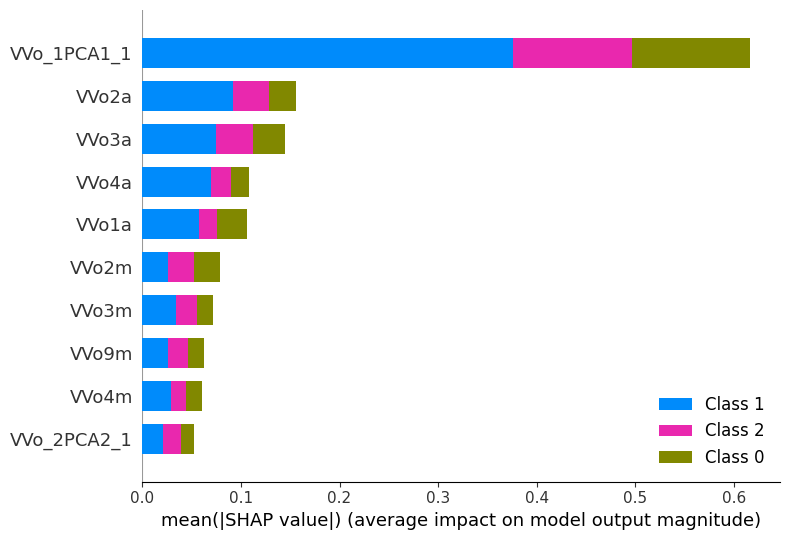

In [ ]:
import shap

explainer = shap.Explainer(model)
shap_values = explainer(X_val)

shap.summary_plot(shap_values, X_val)


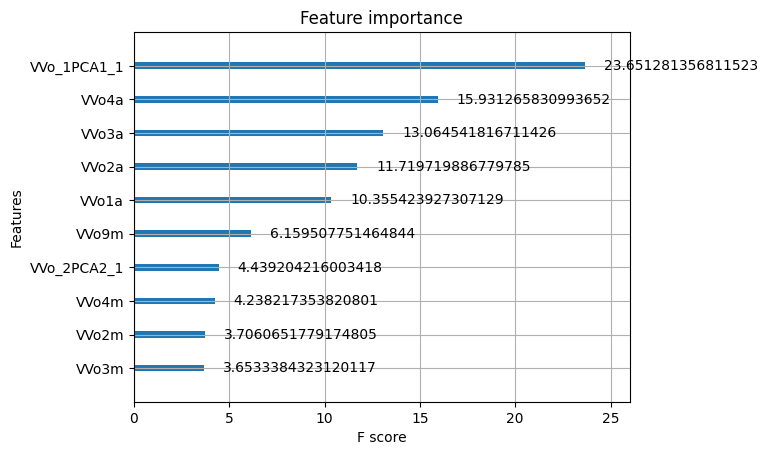

In [ ]:
import matplotlib.pyplot as plt
xgb.plot_importance(model, importance_type='gain')  # gain, weight, cover
plt.show()


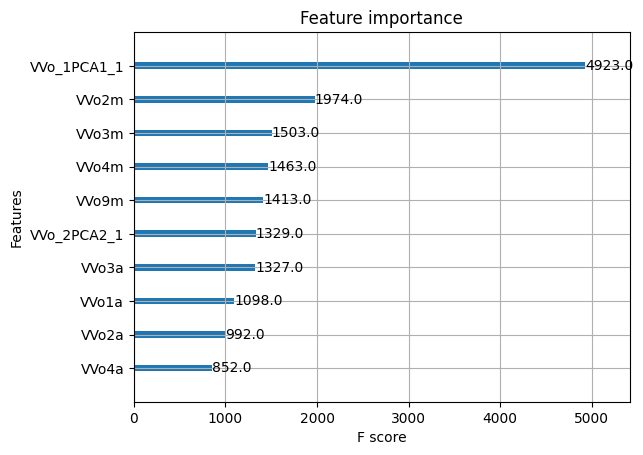

In [ ]:
import matplotlib.pyplot as plt
xgb.plot_importance(model, importance_type='weight')
plt.show()


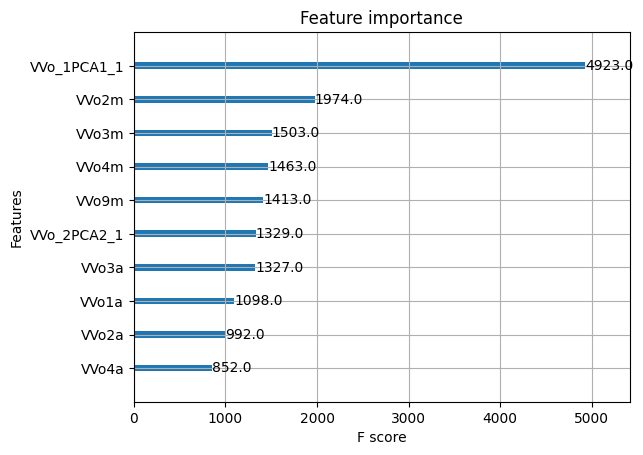

In [ ]:
import matplotlib.pyplot as plt
xgb.plot_importance(model, importance_type='weight')
plt.show()

**RESUMEN**

B1

In [ ]:
# ['VVo_1PCA1_1', "VVo2m", "VVo3m", "VVo4m", "VVo9m", "VVo1a", "VVo3a"]
#Los PCA son con: ["VVo10", "VVo15", "VVo30", "VVo1h", "VVo2h", "VVo4h", "VVo6h"]

# 📊 MATRIZ DE CONFUSIÓN (VALIDATION):
# [[14167 12248 12295]
#  [ 8341 24323  6925]
#  [14120 12252 11911]]
# 📄 REPORT (VALIDATION):
#               precision    recall  f1-score   support

#            0       0.39      0.37      0.38     38710
#            1       0.50      0.61      0.55     39589
#            2       0.38      0.31      0.34     38283

#     accuracy                           0.43    116582
#    macro avg       0.42      0.43      0.42    116582
# weighted avg       0.42      0.43      0.42    116582

# 📊 MATRIZ DE CONFUSIÓN (TEST):
# [[ 7076  6153  6126]
#  [ 4271 12182  3342]
#  [ 7070  6092  5980]]
# 📄 REPORT (TEST):
#               precision    recall  f1-score   support

#            0       0.38      0.37      0.37     19355
#            1       0.50      0.62      0.55     19795
#            2       0.39      0.31      0.35     19142

#     accuracy                           0.43     58292
#    macro avg       0.42      0.43      0.42     58292
# weighted avg       0.42      0.43      0.43     58292

B2

In [ ]:
# "VVo_2PCA2_1", "VVo9m", "VVo1a", "VVo2a", "VVo3a", "VVo4a"
# "VVo_2PCA2_1", "VVo9m", "VVo1a", "VVo2a", "VVo3a", "VVo4a"
# PCA armados con: ['VB1m', 'VB2m', 'VB3m', 'VB4m', 'VB5m', 'VB6m', 'VB9m']

# 📊 MATRIZ DE CONFUSIÓN (VALIDATION):
# [[17313  5301 13090]
#  [ 9663  8775  7030]
#  [16623  5237 13390]]
# 📄 REPORT (VALIDATION):
#               precision    recall  f1-score   support

#            0       0.40      0.48      0.44     35704
#            1       0.45      0.34      0.39     25468
#            2       0.40      0.38      0.39     35250

#     accuracy                           0.41     96422
#    macro avg       0.42      0.40      0.41     96422
# weighted avg       0.41      0.41      0.41     96422

# 📊 MATRIZ DE CONFUSIÓN (TEST):
# [[8629 2698 6525]
#  [4808 4418 3508]
#  [8351 2587 6688]]
# 📄 REPORT (TEST):
#               precision    recall  f1-score   support

#            0       0.40      0.48      0.44     17852
#            1       0.46      0.35      0.39     12734
#            2       0.40      0.38      0.39     17626

#     accuracy                           0.41     48212
#    macro avg       0.42      0.40      0.41     48212
# weighted avg       0.41      0.41      0.41     48212

B3

In [ ]:
# ""VVo_3PCA_1", "VVo_3PCA_2", "VVo9m", "VVo1a", "VVo2a", "VVo3a"

#LOS PCA ENTORPECIAN EL MODELO. MODELO SIN PCAs:

# 📊 MATRIZ DE CONFUSIÓN (VALIDATION):
# [[27744  2974 15350]
#  [13073  4898  7353]
#  [26247  2983 15960]]
# 📄 REPORT (VALIDATION):
#               precision    recall  f1-score   support

#            0       0.41      0.60      0.49     46068
#            1       0.45      0.19      0.27     25324
#            2       0.41      0.35      0.38     45190

#     accuracy                           0.42    116582
#    macro avg       0.43      0.38      0.38    116582
# weighted avg       0.42      0.42      0.40    116582

# 📊 MATRIZ DE CONFUSIÓN (TEST):
# [[13884  1506  7644]
#  [ 6574  2350  3738]
#  [13170  1441  7985]]
# 📄 REPORT (TEST):
#               precision    recall  f1-score   support

#            0       0.41      0.60      0.49     23034
#            1       0.44      0.19      0.26     12662
#            2       0.41      0.35      0.38     22596

#     accuracy                           0.42     58292
#    macro avg       0.42      0.38      0.38     58292
# weighted avg       0.42      0.42      0.40     58292

Por si sola la volatilidad pierde mucho poder predictivo en BTC, a 5 minutos, marca muy bien la tendencia, pero en 15 ya es casi 100% dummy, esto es llamativo
porque en todos los analisis se extrae de manera cauteloza las variables más influyentes de este universo, para su respectivo B (B, B1 y B2)

#RSI

In [ ]:
# Cálculo de deltas
delta = mf1['Close'].diff()

# Diccionario de ventanas
ventanas_vol = {
    "10": 2, "15": 3, "30": 6, "1h": 12, "2h": 24, "4h": 48, "6h": 72, "8h": 96,
    "12h": 144, "1d": 288, "3d": 864, "4d": 1152, "5d": 1440, "1s": 2016, "2s": 4032,
    "1m": 8064, "2m": 16128, "3m": 24192, "4m": 32256, "5m": 40320, "6m": 48384,
    "9m": 72576, "1a": 100800, "2a": 201600, "3a": 302400
}

# RSI con máximas variaciones
for label, n in ventanas_vol.items():
    gain = np.sqrt((delta.where(delta > 0, 0.0).rolling(window=n).max()))
    loss = np.sqrt(((-delta.where(delta < 0, 0.0)).rolling(window=n).max()))

    rs = gain / loss
    rsi = 100 - (100 / (1 + rs))

    mf1[f'RSIV_{label}'] = rsi


/tmp/ipython-input-120-3809917578.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1[f'RSIV_{label}'] = rsi
/tmp/ipython-input-120-3809917578.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1[f'RSIV_{label}'] = rsi
/tmp/ipython-input-120-3809917578.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = fr

In [ ]:
print(mf1.columns.tolist())

['Datetime', 'High', 'Low', 'Close', 'Volume', 'ETH_Close', 'ETH_Volume', 'USDT_Close', 'USDT_Volume', 'XRP_Close', 'XRP_Volume', 'SOL_Close', 'SOL_Volume', 'DOGE_Close', 'DOGE_Volume', 'VoM', 'DominanciaBTC', 'MC', 'MCM', 'DominanciaMBTC', 'cp2', 'vp2', 'SD_1', 'VB5', 'SD_2', 'VB10', 'SD_3', 'VB15', 'SD_6', 'VB30', 'SD_12', 'VB1h', 'SD_24', 'VB2h', 'SD_48', 'VB4h', 'SD_72', 'VB6h', 'SD_144', 'VB12h', 'SD_288', 'VB1d', 'SD_864', 'VB3d', 'SD_1152', 'VB4d', 'SD_1440', 'VB5d', 'SD_2016', 'VB1s', 'SD_4032', 'VB2s', 'SD_8064', 'VB1m', 'SD_16128', 'VB2m', 'SD_24192', 'VB3m', 'SD_32256', 'VB4m', 'SD_40320', 'VB5m', 'SD_48384', 'VB6m', 'SD_72576', 'VB9m', 'SD_100800', 'VB1a', 'SD_201600', 'VB2a', 'SD_302400', 'VB3a', 'VB_PCA_1', 'VB_PCA_2', 'VB_PCA_3', 'VB_PCA_4', 'B', 'B1', 'QBpc', 'QSD_1', 'VQ5', 'QSD_2', 'VQ10', 'QSD_3', 'VQ15', 'QSD_6', 'VQ30', 'QSD_12', 'VQ1h', 'QSD_24', 'VQ2h', 'QSD_48', 'VQ4h', 'QSD_72', 'VQ6h', 'QSD_144', 'VQ12h', 'QSD_288', 'VQ1d', 'QSD_864', 'VQ3d', 'QSD_1152', 'VQ4d

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ['RSIV_10', 'RSIV_15', 'RSIV_30', 'RSIV_1h', 'RSIV_2h',
             'RSIV_4h', 'RSIV_6h', 'RSIV_8h', 'RSIV_12h', 'RSIV_1d', 'RSIV_3d', 'RSIV_4d',
             'RSIV_5d', 'RSIV_1s', 'RSIV_2s', 'RSIV_1m', 'RSIV_2m', 'RSIV_3m',
             'RSIV_4m', 'RSIV_5m', 'RSIV_6m', 'RSIV_9m', 'RSIV_1a', 'RSIV_2a', 'RSIV_3a']


# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B1'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)


    Variable  Mutual Information
6    RSIV_6h            0.064816
7    RSIV_8h            0.064555
9    RSIV_1d            0.063349
5    RSIV_4h            0.063075
8   RSIV_12h            0.062836
4    RSIV_2h            0.058547
10   RSIV_3d            0.057053
11   RSIV_4d            0.055378
12   RSIV_5d            0.054429
13   RSIV_1s            0.051643
14   RSIV_2s            0.049053
3    RSIV_1h            0.048412
15   RSIV_1m            0.044393
16   RSIV_2m            0.042440
17   RSIV_3m            0.039058
18   RSIV_4m            0.039057
19   RSIV_5m            0.038109
24   RSIV_3a            0.037738
21   RSIV_9m            0.037287
20   RSIV_6m            0.037192
22   RSIV_1a            0.033458
23   RSIV_2a            0.030981
2    RSIV_30            0.030129
0    RSIV_10            0.017075
1    RSIV_15            0.013192


In [ ]:
# "RSIV_10", "RSIV_15"
# Van porque si del resto crearemos dos componentes ensamblados, considerando los lapsos
# mayores a 15 minutos y menores a 1 un dia
# mayores a 12h y menores o iguales a un año

**RSIV_PCA1**

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ['RSIV_1h', 'RSIV_2h', 'RSIV_4h', 'RSIV_6h', 'RSIV_8h', 'RSIV_12h',
             'RSIV_1d', 'RSIV_3d', 'RSIV_4d', 'RSIV_5d']

# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=4)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
for i in range(4):
    mf1.loc[subset.index, f'RSI_1PCA1_{i+1}'] = principal_component[:, i]

/tmp/ipython-input-134-836717814.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'RSI_1PCA1_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-134-836717814.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'RSI_1PCA1_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-134-836717814.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ["RSIV_6h", 'RSIV_8h', 'RSI_1PCA1_1', 'RSI_1PCA1_2', 'RSI_1PCA1_3', 'RSI_1PCA1_4']
# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B1'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)


      Variable  Mutual Information
0      RSIV_6h            0.065512
1      RSIV_8h            0.064657
4  RSI_1PCA1_3            0.029748
5  RSI_1PCA1_4            0.029738
3  RSI_1PCA1_2            0.029550
2  RSI_1PCA1_1            0.028763


In [ ]:
variables = ['RSIV_30', 'RSIV_1h', 'RSIV_2h',
             'RSIV_4h', 'RSIV_6h', 'RSIV_12h']
loadings = pd.Series(pca.components_[0], index=variables)

print("Cargas del primer componente:")
print(loadings.sort_values(ascending=False))

print("\nVarianza explicada por el primer componente:")
print(pca.explained_variance_ratio_[0])


Cargas del primer componente:
RSIV_4h     0.501526
RSIV_6h     0.480623
RSIV_2h     0.454409
RSIV_12h    0.366260
RSIV_1h     0.357761
RSIV_30     0.221011
dtype: float64

Varianza explicada por el primer componente:
0.4735541318259824


In [ ]:
# "RSIV_10", "RSIV_15", "RSIV_4h", "RSIV_6h"
#primeros pca malos

**RSIV_PCA2**

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ['RSIV_1d', 'RSIV_3d', 'RSIV_4d', 'RSIV_5d', 'RSIV_1s', 'RSIV_2s',
             'RSIV_1m', 'RSIV_2m', 'RSIV_3m', 'RSIV_4m', 'RSIV_5m', 'RSIV_6m',
             'RSIV_9m', "RSIV_1a"]
# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=4)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
for i in range(4):
    mf1.loc[subset.index, f'RSIV_PCA2_{i+1}'] = principal_component[:, i]

/tmp/ipython-input-84-4254905607.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'RSIV_PCA2_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-84-4254905607.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'RSIV_PCA2_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-84-4254905607.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ["RSIV_1d", 'RSIV_3d', 'RSIV_PCA2_1', 'RSIV_PCA2_2', 'RSIV_PCA2_3', 'RSIV_PCA2_4']
# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)


      Variable  Mutual Information
0      RSIV_1d            0.032950
1      RSIV_3d            0.028482
3  RSIV_PCA2_2            0.027938
2  RSIV_PCA2_1            0.027852
5  RSIV_PCA2_4            0.027673
4  RSIV_PCA2_3            0.026906


In [ ]:
variables = ['RSIV_1d', 'RSIV_3d', 'RSIV_4d', 'RSIV_5d', 'RSIV_1s', 'RSIV_2s',
             'RSIV_1m', 'RSIV_2m', 'RSIV_3m', 'RSIV_4m', 'RSIV_5m', 'RSIV_6m',
             'RSIV_9m', "RSIV_1a"]
loadings = pd.Series(pca.components_[0], index=variables)

print("Cargas del primer componente:")
print(loadings.sort_values(ascending=False))

print("\nVarianza explicada por el primer componente:")
print(pca.explained_variance_ratio_[0])


Cargas del primer componente:
RSIV_4m    0.358374
RSIV_3m    0.351983
RSIV_5m    0.345372
RSIV_2m    0.329130
RSIV_6m    0.313152
RSIV_1m    0.249345
RSIV_1s    0.240343
RSIV_5d    0.236437
RSIV_9m    0.235525
RSIV_2s    0.232212
RSIV_4d    0.223058
RSIV_1a    0.198002
RSIV_3d    0.195069
RSIV_1d    0.098776
dtype: float64

Varianza explicada por el primer componente:
0.33416128029884945


In [ ]:
variables = ['RSIV_1d', 'RSIV_3d', 'RSIV_4d', 'RSIV_5d', 'RSIV_1s', 'RSIV_2s',
             'RSIV_1m', 'RSIV_2m', 'RSIV_3m', 'RSIV_4m', 'RSIV_5m', 'RSIV_6m',
             'RSIV_9m', "RSIV_1a"]
loadings = pd.Series(pca.components_[1], index=variables)

print("Cargas del primer componente:")
print(loadings.sort_values(ascending=False))

print("\nVarianza explicada por el primer componente:")
print(pca.explained_variance_ratio_[1])


Cargas del primer componente:
RSIV_5d    0.367013
RSIV_4d    0.365008
RSIV_1s    0.343220
RSIV_3d    0.335860
RSIV_2s    0.261797
RSIV_1d    0.195239
RSIV_1m    0.158026
RSIV_2m   -0.013742
RSIV_3m   -0.144750
RSIV_4m   -0.229396
RSIV_1a   -0.251078
RSIV_5m   -0.265153
RSIV_9m   -0.282561
RSIV_6m   -0.287905
dtype: float64

Varianza explicada por el primer componente:
0.2768227066761404


In [ ]:
# "RSIV_10", "RSIV_15", "RSIV_4h", "RSIV_6h", "RSIV_1d", 'RSIV_3d', 'RSIV_PCA2_1', 'RSIV_PCA2_2'

SHAP

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import xgboost as xgb
import matplotlib.pyplot as plt
import numpy as np

# Variables explicativas y objetivo
features = ['RSIV_1h', 'RSIV_2h',
             'RSIV_4h', 'RSIV_6h', 'RSIV_8h', 'RSIV_12h', 'RSIV_1d', 'RSIV_3d', 'RSIV_4d',
             'RSIV_5d', 'RSIV_1s', 'RSIV_2s', 'RSIV_1m']
target = "B1"

# Eliminar filas con NaN
df = mf1[features + [target]].dropna()
df[target] = df[target].astype(int)

# Definir X e y
X = df[features]
y = df[target]

# División: 70% train, 30% temp
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.30, stratify=y, random_state=42)

# División: 20% validation, 10% test (sobre el 30% restante)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=1/3, stratify=y_temp, random_state=42)


# Entrenar modelo multiclase
model = xgb.XGBClassifier(
    objective='multi:softmax',
    num_class=3,
    n_estimators=100,
    max_depth=6,
    learning_rate=0.1,
    use_label_encoder=False,
    eval_metric='mlogloss'
)

model.fit(X_train, y_train)

# --- Evaluación en validation ---
y_val_pred = model.predict(X_val)
print("📊 MATRIZ DE CONFUSIÓN (VALIDATION):")
print(confusion_matrix(y_val, y_val_pred))
print("📄 REPORT (VALIDATION):")
print(classification_report(y_val, y_val_pred))

# --- Evaluación en test ---
y_test_pred = model.predict(X_test)
print("📊 MATRIZ DE CONFUSIÓN (TEST):")
print(confusion_matrix(y_test, y_test_pred))
print("📄 REPORT (TEST):")
print(classification_report(y_test, y_test_pred))


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [03:41:29] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


📊 MATRIZ DE CONFUSIÓN (VALIDATION):
[[28637 10757 22839]
 [16515 20615 14533]
 [25934 10648 24972]]
📄 REPORT (VALIDATION):
              precision    recall  f1-score   support

           0       0.40      0.46      0.43     62233
           1       0.49      0.40      0.44     51663
           2       0.40      0.41      0.40     61554

    accuracy                           0.42    175450
   macro avg       0.43      0.42      0.42    175450
weighted avg       0.43      0.42      0.42    175450

📊 MATRIZ DE CONFUSIÓN (TEST):
[[14226  5465 11425]
 [ 8184 10417  7230]
 [13033  5270 12475]]
📄 REPORT (TEST):
              precision    recall  f1-score   support

           0       0.40      0.46      0.43     31116
           1       0.49      0.40      0.44     25831
           2       0.40      0.41      0.40     30778

    accuracy                           0.42     87725
   macro avg       0.43      0.42      0.42     87725
weighted avg       0.43      0.42      0.42     87725



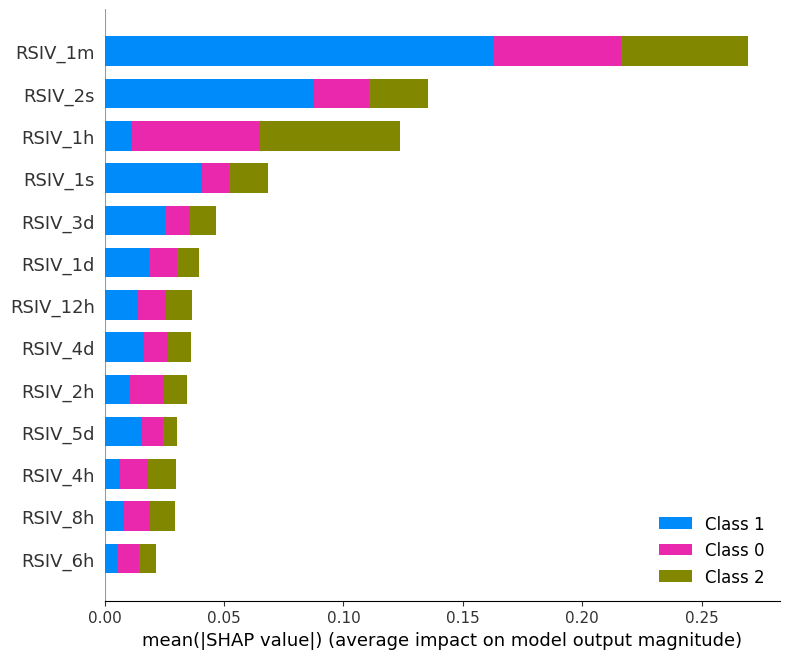

In [ ]:
import shap

explainer = shap.Explainer(model)
shap_values = explainer(X_val)

shap.summary_plot(shap_values, X_val)


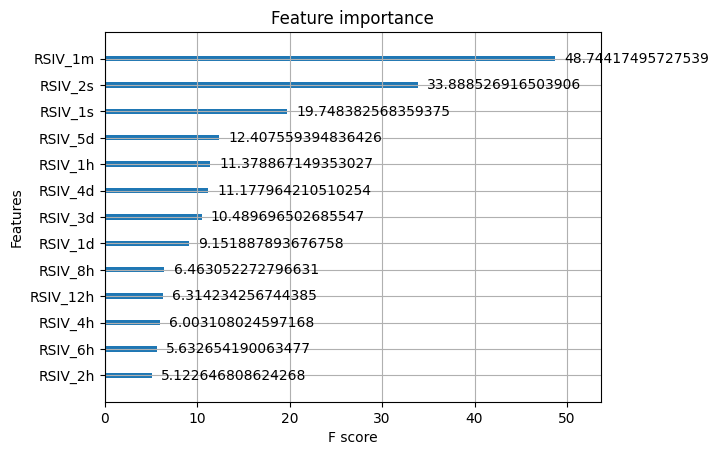

In [ ]:
import matplotlib.pyplot as plt
xgb.plot_importance(model, importance_type='gain')  # gain, weight, cover
plt.show()


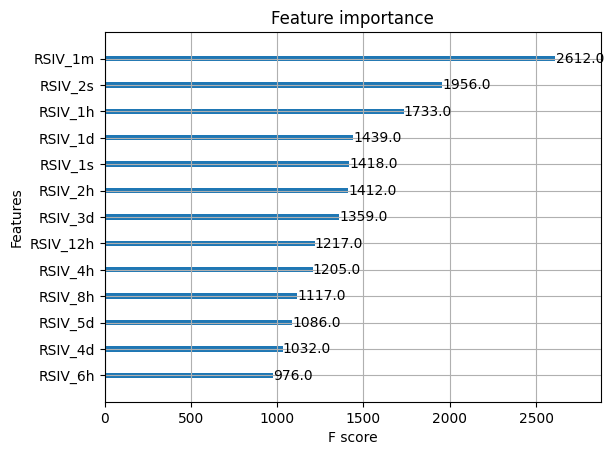

In [ ]:
import matplotlib.pyplot as plt
xgb.plot_importance(model, importance_type='weight')
plt.show()


In [ ]:
#Completito:
# "RSIV_10", "RSIV_15", "RSIV_4h", "RSIV_6h", "RSIV_1d", 'RSIV_3d', 'RSIV_PCA2_1', 'RSIV_PCA2_2'
# Optimo:
# ["RSIV_10", "RSIV_15"]
#Se excpluye al resto porque predicen donde el modelo más se equivoca, la calse neutro

# modelo fuerte en extremos, sobre todo en su recall

#K y D estocasticos

In [ ]:
ventanas = {
    "5": 1, "10": 2, "15": 3, "30": 6, "1h": 12, "2h": 24, "4h": 48, "6h": 72, "8h":96,
    "12h": 144, "1d": 288, "3d": 864, "4d": 1152, "5d": 1440, "1s": 2016, "2s": 4032,
    "1m": 8064, "2m": 16128, "3m": 24192, "4m": 32256, "5m": 40320, "6m": 48384,
    "9m": 72576, "1a": 100800, "2a": 201600, "3a": 302400
}

for label, tau in ventanas.items():
    min_price = mf1['Closet'].rolling(window=tau).min()
    max_price = mf1['Closet'].rolling(window=tau).max()
    mf1[f'%K_{label}'] = ((mf1['Closet'] - min_price) / (max_price - min_price)) * 100


NameError: name 'mf1' is not defined

In [ ]:
print(mf1.columns.tolist())

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ['RSIV_10', 'RSIV_15', 'RSIV_30', 'RSIV_1h', 'RSIV_2h',
             'RSIV_4h', 'RSIV_6h', 'RSIV_8h', 'RSIV_12h', 'RSIV_1d', 'RSIV_3d', 'RSIV_4d',
             'RSIV_5d', 'RSIV_1s', 'RSIV_2s', 'RSIV_1m', 'RSIV_2m', 'RSIV_3m',
             'RSIV_4m', 'RSIV_5m', 'RSIV_6m', 'RSIV_9m', 'RSIV_1a', 'RSIV_2a', 'RSIV_3a']


# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B1'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)


    Variable  Mutual Information
6    RSIV_6h            0.064816
7    RSIV_8h            0.064555
9    RSIV_1d            0.063349
5    RSIV_4h            0.063075
8   RSIV_12h            0.062836
4    RSIV_2h            0.058547
10   RSIV_3d            0.057053
11   RSIV_4d            0.055378
12   RSIV_5d            0.054429
13   RSIV_1s            0.051643
14   RSIV_2s            0.049053
3    RSIV_1h            0.048412
15   RSIV_1m            0.044393
16   RSIV_2m            0.042440
17   RSIV_3m            0.039058
18   RSIV_4m            0.039057
19   RSIV_5m            0.038109
24   RSIV_3a            0.037738
21   RSIV_9m            0.037287
20   RSIV_6m            0.037192
22   RSIV_1a            0.033458
23   RSIV_2a            0.030981
2    RSIV_30            0.030129
0    RSIV_10            0.017075
1    RSIV_15            0.013192


In [ ]:
# "RSIV_10", "RSIV_15"
# Van porque si del resto crearemos dos componentes ensamblados, considerando los lapsos
# mayores a 15 minutos y menores a 1 un dia
# mayores a 12h y menores o iguales a un año

**RSIV_PCA1**

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ['RSIV_1h', 'RSIV_2h', 'RSIV_4h', 'RSIV_6h', 'RSIV_8h', 'RSIV_12h',
             'RSIV_1d', 'RSIV_3d', 'RSIV_4d', 'RSIV_5d']

# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=4)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
for i in range(4):
    mf1.loc[subset.index, f'RSI_1PCA1_{i+1}'] = principal_component[:, i]

/tmp/ipython-input-134-836717814.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'RSI_1PCA1_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-134-836717814.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'RSI_1PCA1_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-134-836717814.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ["RSIV_6h", 'RSIV_8h', 'RSI_1PCA1_1', 'RSI_1PCA1_2', 'RSI_1PCA1_3', 'RSI_1PCA1_4']
# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B1'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)


      Variable  Mutual Information
0      RSIV_6h            0.065512
1      RSIV_8h            0.064657
4  RSI_1PCA1_3            0.029748
5  RSI_1PCA1_4            0.029738
3  RSI_1PCA1_2            0.029550
2  RSI_1PCA1_1            0.028763


In [ ]:
variables = ['RSIV_30', 'RSIV_1h', 'RSIV_2h',
             'RSIV_4h', 'RSIV_6h', 'RSIV_12h']
loadings = pd.Series(pca.components_[0], index=variables)

print("Cargas del primer componente:")
print(loadings.sort_values(ascending=False))

print("\nVarianza explicada por el primer componente:")
print(pca.explained_variance_ratio_[0])


Cargas del primer componente:
RSIV_4h     0.501526
RSIV_6h     0.480623
RSIV_2h     0.454409
RSIV_12h    0.366260
RSIV_1h     0.357761
RSIV_30     0.221011
dtype: float64

Varianza explicada por el primer componente:
0.4735541318259824


In [ ]:
# "RSIV_10", "RSIV_15", "RSIV_4h", "RSIV_6h"
#primeros pca malos

**RSIV_PCA2**

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ['RSIV_1d', 'RSIV_3d', 'RSIV_4d', 'RSIV_5d', 'RSIV_1s', 'RSIV_2s',
             'RSIV_1m', 'RSIV_2m', 'RSIV_3m', 'RSIV_4m', 'RSIV_5m', 'RSIV_6m',
             'RSIV_9m', "RSIV_1a"]
# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=4)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
for i in range(4):
    mf1.loc[subset.index, f'RSIV_PCA2_{i+1}'] = principal_component[:, i]

/tmp/ipython-input-84-4254905607.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'RSIV_PCA2_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-84-4254905607.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'RSIV_PCA2_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-84-4254905607.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ["RSIV_1d", 'RSIV_3d', 'RSIV_PCA2_1', 'RSIV_PCA2_2', 'RSIV_PCA2_3', 'RSIV_PCA2_4']
# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)


      Variable  Mutual Information
0      RSIV_1d            0.032950
1      RSIV_3d            0.028482
3  RSIV_PCA2_2            0.027938
2  RSIV_PCA2_1            0.027852
5  RSIV_PCA2_4            0.027673
4  RSIV_PCA2_3            0.026906


In [ ]:
variables = ['RSIV_1d', 'RSIV_3d', 'RSIV_4d', 'RSIV_5d', 'RSIV_1s', 'RSIV_2s',
             'RSIV_1m', 'RSIV_2m', 'RSIV_3m', 'RSIV_4m', 'RSIV_5m', 'RSIV_6m',
             'RSIV_9m', "RSIV_1a"]
loadings = pd.Series(pca.components_[0], index=variables)

print("Cargas del primer componente:")
print(loadings.sort_values(ascending=False))

print("\nVarianza explicada por el primer componente:")
print(pca.explained_variance_ratio_[0])


Cargas del primer componente:
RSIV_4m    0.358374
RSIV_3m    0.351983
RSIV_5m    0.345372
RSIV_2m    0.329130
RSIV_6m    0.313152
RSIV_1m    0.249345
RSIV_1s    0.240343
RSIV_5d    0.236437
RSIV_9m    0.235525
RSIV_2s    0.232212
RSIV_4d    0.223058
RSIV_1a    0.198002
RSIV_3d    0.195069
RSIV_1d    0.098776
dtype: float64

Varianza explicada por el primer componente:
0.33416128029884945


In [ ]:
variables = ['RSIV_1d', 'RSIV_3d', 'RSIV_4d', 'RSIV_5d', 'RSIV_1s', 'RSIV_2s',
             'RSIV_1m', 'RSIV_2m', 'RSIV_3m', 'RSIV_4m', 'RSIV_5m', 'RSIV_6m',
             'RSIV_9m', "RSIV_1a"]
loadings = pd.Series(pca.components_[1], index=variables)

print("Cargas del primer componente:")
print(loadings.sort_values(ascending=False))

print("\nVarianza explicada por el primer componente:")
print(pca.explained_variance_ratio_[1])


Cargas del primer componente:
RSIV_5d    0.367013
RSIV_4d    0.365008
RSIV_1s    0.343220
RSIV_3d    0.335860
RSIV_2s    0.261797
RSIV_1d    0.195239
RSIV_1m    0.158026
RSIV_2m   -0.013742
RSIV_3m   -0.144750
RSIV_4m   -0.229396
RSIV_1a   -0.251078
RSIV_5m   -0.265153
RSIV_9m   -0.282561
RSIV_6m   -0.287905
dtype: float64

Varianza explicada por el primer componente:
0.2768227066761404


In [ ]:
# "RSIV_10", "RSIV_15", "RSIV_4h", "RSIV_6h", "RSIV_1d", 'RSIV_3d', 'RSIV_PCA2_1', 'RSIV_PCA2_2'

SHAP

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import xgboost as xgb
import matplotlib.pyplot as plt
import numpy as np

# Variables explicativas y objetivo
features = ['RSIV_1h', 'RSIV_2h',
             'RSIV_4h', 'RSIV_6h', 'RSIV_8h', 'RSIV_12h', 'RSIV_1d', 'RSIV_3d', 'RSIV_4d',
             'RSIV_5d', 'RSIV_1s', 'RSIV_2s', 'RSIV_1m']
target = "B1"

# Eliminar filas con NaN
df = mf1[features + [target]].dropna()
df[target] = df[target].astype(int)

# Definir X e y
X = df[features]
y = df[target]

# División: 70% train, 30% temp
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.30, stratify=y, random_state=42)

# División: 20% validation, 10% test (sobre el 30% restante)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=1/3, stratify=y_temp, random_state=42)


# Entrenar modelo multiclase
model = xgb.XGBClassifier(
    objective='multi:softmax',
    num_class=3,
    n_estimators=100,
    max_depth=6,
    learning_rate=0.1,
    use_label_encoder=False,
    eval_metric='mlogloss'
)

model.fit(X_train, y_train)

# --- Evaluación en validation ---
y_val_pred = model.predict(X_val)
print("📊 MATRIZ DE CONFUSIÓN (VALIDATION):")
print(confusion_matrix(y_val, y_val_pred))
print("📄 REPORT (VALIDATION):")
print(classification_report(y_val, y_val_pred))

# --- Evaluación en test ---
y_test_pred = model.predict(X_test)
print("📊 MATRIZ DE CONFUSIÓN (TEST):")
print(confusion_matrix(y_test, y_test_pred))
print("📄 REPORT (TEST):")
print(classification_report(y_test, y_test_pred))


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [03:41:29] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


📊 MATRIZ DE CONFUSIÓN (VALIDATION):
[[28637 10757 22839]
 [16515 20615 14533]
 [25934 10648 24972]]
📄 REPORT (VALIDATION):
              precision    recall  f1-score   support

           0       0.40      0.46      0.43     62233
           1       0.49      0.40      0.44     51663
           2       0.40      0.41      0.40     61554

    accuracy                           0.42    175450
   macro avg       0.43      0.42      0.42    175450
weighted avg       0.43      0.42      0.42    175450

📊 MATRIZ DE CONFUSIÓN (TEST):
[[14226  5465 11425]
 [ 8184 10417  7230]
 [13033  5270 12475]]
📄 REPORT (TEST):
              precision    recall  f1-score   support

           0       0.40      0.46      0.43     31116
           1       0.49      0.40      0.44     25831
           2       0.40      0.41      0.40     30778

    accuracy                           0.42     87725
   macro avg       0.43      0.42      0.42     87725
weighted avg       0.43      0.42      0.42     87725



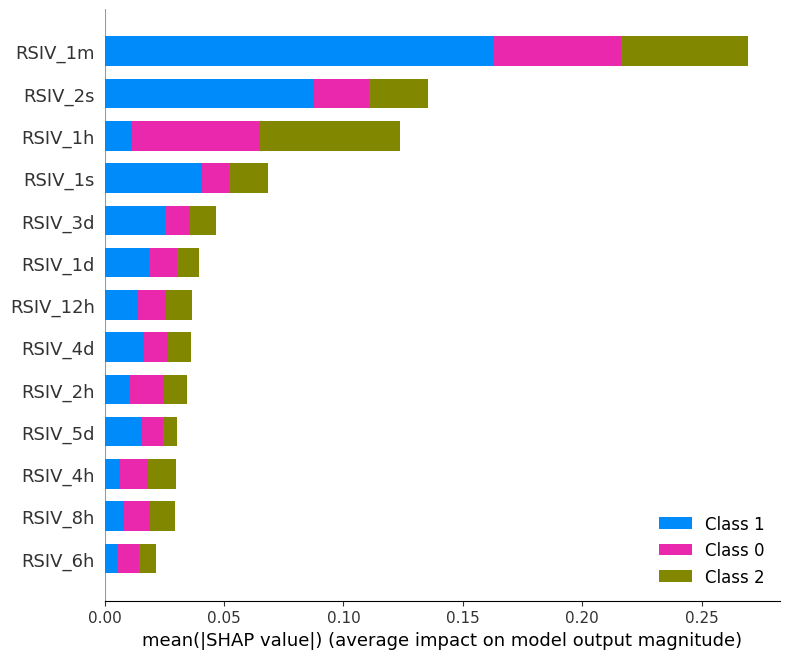

In [ ]:
import shap

explainer = shap.Explainer(model)
shap_values = explainer(X_val)

shap.summary_plot(shap_values, X_val)


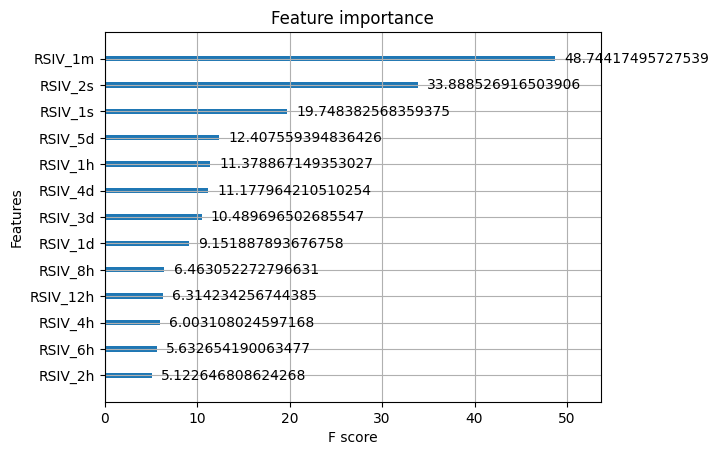

In [ ]:
import matplotlib.pyplot as plt
xgb.plot_importance(model, importance_type='gain')  # gain, weight, cover
plt.show()


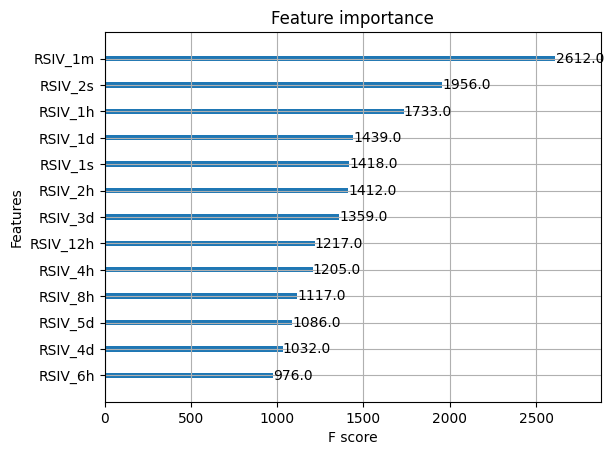

In [ ]:
import matplotlib.pyplot as plt
xgb.plot_importance(model, importance_type='weight')
plt.show()


In [ ]:
#Completito:
# "RSIV_10", "RSIV_15", "RSIV_4h", "RSIV_6h", "RSIV_1d", 'RSIV_3d', 'RSIV_PCA2_1', 'RSIV_PCA2_2'
# Optimo:
# ["RSIV_10", "RSIV_15"]
#Se excpluye al resto porque predicen donde el modelo más se equivoca, la calse neutro

# modelo fuerte en extremos, sobre todo en su recall

#MOM

In [ ]:
# Diccionario de ventanas
ventanas_vol = {
    "5": 1, "10": 2, "15": 3, "30": 6, "1h": 12, "2h": 24, "4h": 48, "6h": 72, "8h": 96,
    "12h": 144, "1d": 288, "3d": 864, "4d": 1152, "5d": 1440, "1s": 2016, "2s": 4032,
    "1m": 8064, "2m": 16128, "3m": 24192, "4m": 32256, "5m": 40320, "6m": 48384,
    "9m": 72576, "1a": 100800, "2a": 201600, "3a": 302400
}

# Calcular MOM% para cada ventana
for label, n in ventanas_vol.items():
    close_tn = mf1["Close"].shift(n)
    mom = (mf1["Close"] - close_tn) / close_tn
    mf1[f"MOM_{label}"] = mom


/tmp/ipython-input-119-3481192990.py:13: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1[f"MOM_{label}"] = mom
/tmp/ipython-input-119-3481192990.py:13: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1[f"MOM_{label}"] = mom
/tmp/ipython-input-119-3481192990.py:13: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = fram

In [ ]:
print(mf1.columns.tolist())

['Datetime', 'High', 'Low', 'Close', 'Volume', 'B1', 'B2', 'B3', 'Closet', 'Volumet', 'Hight', 'cp2', 'SD_1', 'VB5', 'SD_2', 'VB10', 'SD_3', 'VB15', 'SD_6', 'VB30', 'SD_12', 'VB1h', 'SD_24', 'VB2h', 'SD_48', 'VB4h', 'SD_72', 'VB6h', 'SD_144', 'VB12h', 'SD_288', 'VB1d', 'SD_864', 'VB3d', 'SD_1152', 'VB4d', 'SD_1440', 'VB5d', 'SD_2016', 'VB1s', 'SD_4032', 'VB2s', 'SD_8064', 'VB1m', 'SD_16128', 'VB2m', 'SD_24192', 'VB3m', 'SD_32256', 'VB4m', 'SD_40320', 'VB5m', 'SD_48384', 'VB6m', 'SD_72576', 'VB9m', 'SD_100800', 'VB1a', 'SD_201600', 'VB2a', 'SD_302400', 'VB3a', 'SD_403200', 'VB4a', 'VB_1PCA_1', 'VB_1PCA_2', 'VB_1PCA_3', 'VB_1PCA_4', 'VoSD_1', 'VVo5', 'VoSD_2', 'VVo10', 'VoSD_3', 'VVo15', 'VoSD_6', 'VVo30', 'VoSD_12', 'VVo1h', 'VoSD_24', 'VVo2h', 'VoSD_48', 'VVo4h', 'VoSD_72', 'VVo6h', 'VoSD_144', 'VVo12h', 'VoSD_288', 'VVo1d', 'VoSD_864', 'VVo3d', 'VoSD_1152', 'VVo4d', 'VoSD_1440', 'VVo5d', 'VoSD_2016', 'VVo1s', 'VoSD_4032', 'VVo2s', 'VoSD_8064', 'VVo1m', 'VoSD_16128', 'VVo2m', 'VoSD_241

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ['MOM_10', 'MOM_15', 'MOM_30', 'MOM_1h', 'MOM_2h', 'MOM_4h', 'MOM_6h', 'MOM_8h',
             'MOM_12h', 'MOM_1d', 'MOM_3d', 'MOM_4d', 'MOM_5d', 'MOM_1s', 'MOM_2s',
             'MOM_1m', 'MOM_2m', 'MOM_3m', 'MOM_4m', 'MOM_5m', 'MOM_6m', 'MOM_9m', 'MOM_1a', 'MOM_2a', 'MOM_3a']


# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B1'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)


KeyError: "None of [Index(['MOM_10', 'MOM_15', 'MOM_30', 'MOM_1h', 'MOM_2h', 'MOM_4h', 'MOM_6h',\n       'MOM_8h', 'MOM_12h', 'MOM_1d', 'MOM_3d', 'MOM_4d', 'MOM_5d', 'MOM_1s',\n       'MOM_2s', 'MOM_1m', 'MOM_2m', 'MOM_3m', 'MOM_4m', 'MOM_5m', 'MOM_6m',\n       'MOM_9m', 'MOM_1a', 'MOM_2a', 'MOM_3a'],\n      dtype='object')] are in the [columns]"

In [ ]:
# "MOM_10"

**MOM_1PCA1**

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ['MOM_1h', 'MOM_2h', 'MOM_4h', 'MOM_6h', 'MOM_8h']
# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=4)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
for i in range(4):
    mf1.loc[subset.index, f'MOM_1PCA1_{i+1}'] = principal_component[:, i]

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ['MOM_1PCA1_1', 'MOM_1PCA1_2', 'MOM_1PCA1_3', 'MOM_1PCA1_4']
# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B1'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)


      Variable  Mutual Information
0  MOM_1PCA1_1            0.035196
1  MOM_1PCA1_2            0.022974
2  MOM_1PCA1_3            0.017859
3  MOM_1PCA1_4            0.017210


In [ ]:
variables = ['MOM_15', 'MOM_30', 'MOM_1h']
loadings = pd.Series(pca.components_[0], index=variables)

print("Cargas del primer componente:")
print(loadings.sort_values(ascending=False))

print("\nVarianza explicada por el primer componente:")
print(pca.explained_variance_ratio_[0])


Cargas del primer componente:
RSIV_4h     0.501526
RSIV_6h     0.480623
RSIV_2h     0.454409
RSIV_12h    0.366260
RSIV_1h     0.357761
RSIV_30     0.221011
dtype: float64

Varianza explicada por el primer componente:
0.4735541318259824


In [ ]:
# "MOM_10", 'MOM_15', 'MOM_30', 'MOM_1h', "MOM_1PCA1_1"

SHAP

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import xgboost as xgb
import matplotlib.pyplot as plt
import numpy as np

# Variables explicativas y objetivo
features = ["MOM_10", 'MOM_15', 'MOM_30', 'MOM_1h', "MOM_1PCA1_1" ]
target = "B1"

# Eliminar filas con NaN
df = mf1[features + [target]].dropna()
df[target] = df[target].astype(int)

# Definir X e y
X = df[features]
y = df[target]

# División: 70% train, 30% temp
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.30, stratify=y, random_state=42)

# División: 20% validation, 10% test (sobre el 30% restante)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=1/3, stratify=y_temp, random_state=42)


# Entrenar modelo multiclase
model = xgb.XGBClassifier(
    objective='multi:softmax',
    num_class=3,
    n_estimators=100,
    max_depth=6,
    learning_rate=0.1,
    use_label_encoder=False,
    eval_metric='mlogloss'
)

model.fit(X_train, y_train)

# --- Evaluación en validation ---
y_val_pred = model.predict(X_val)
print("📊 MATRIZ DE CONFUSIÓN (VALIDATION):")
print(confusion_matrix(y_val, y_val_pred))
print("📄 REPORT (VALIDATION):")
print(classification_report(y_val, y_val_pred))

# --- Evaluación en test ---
y_test_pred = model.predict(X_test)
print("📊 MATRIZ DE CONFUSIÓN (TEST):")
print(confusion_matrix(y_test, y_test_pred))
print("📄 REPORT (TEST):")
print(classification_report(y_test, y_test_pred))


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [03:33:38] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


📊 MATRIZ DE CONFUSIÓN (VALIDATION):
[[30594 14632 17673]
 [14221 26111 11623]
 [20849 13527 27813]]
📄 REPORT (VALIDATION):
              precision    recall  f1-score   support

           0       0.47      0.49      0.48     62899
           1       0.48      0.50      0.49     51955
           2       0.49      0.45      0.47     62189

    accuracy                           0.48    177043
   macro avg       0.48      0.48      0.48    177043
weighted avg       0.48      0.48      0.48    177043

📊 MATRIZ DE CONFUSIÓN (TEST):
[[15307  7209  8934]
 [ 6959 13311  5708]
 [10363  6695 14036]]
📄 REPORT (TEST):
              precision    recall  f1-score   support

           0       0.47      0.49      0.48     31450
           1       0.49      0.51      0.50     25978
           2       0.49      0.45      0.47     31094

    accuracy                           0.48     88522
   macro avg       0.48      0.48      0.48     88522
weighted avg       0.48      0.48      0.48     88522



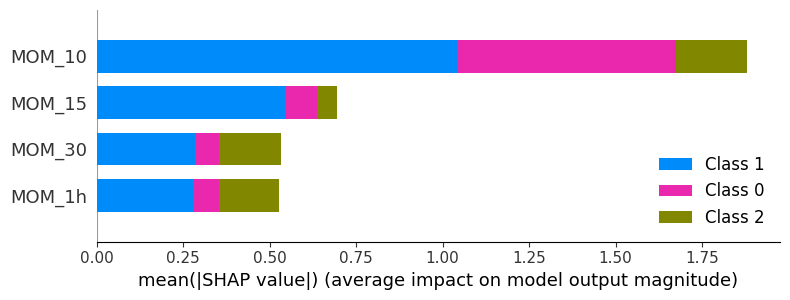

In [ ]:
import shap

explainer = shap.Explainer(model)
shap_values = explainer(X_val)

shap.summary_plot(shap_values, X_val)


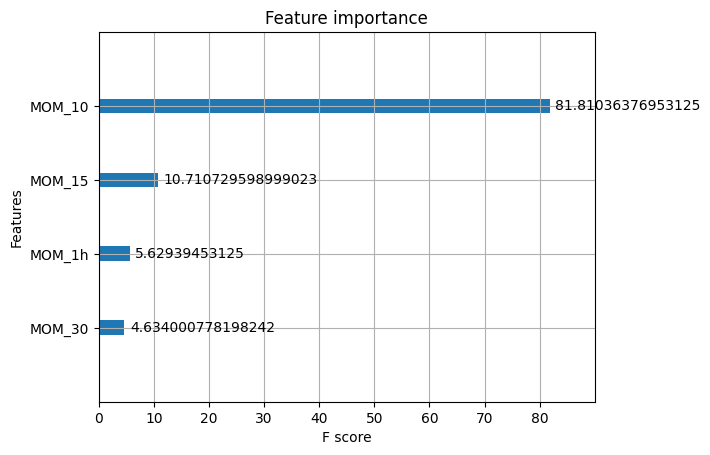

In [ ]:
import matplotlib.pyplot as plt
xgb.plot_importance(model, importance_type='gain')  # gain, weight, cover
plt.show()


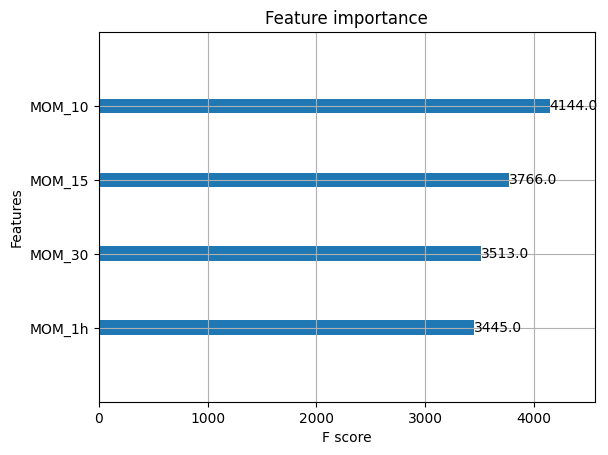

In [ ]:
import matplotlib.pyplot as plt
xgb.plot_importance(model, importance_type='weight')
plt.show()


In [ ]:
#Completito:
# "MOM_10", 'MOM_15', 'MOM_30', 'MOM_1h'
# Optimo:
# "MOM_10", 'MOM_15', 'MOM_1h'

# modelo fuerte en extremo superior, sobre todo en su recall es altimsimo
# probabable uso como modelo binario (varia o no?)
# ESTE ES SUPERIOR AL MOM CLASICO

---
# XGB1

In [ ]:
mf1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 885312 entries, 0 to 885311
Columns: 274 entries, Datetime to RSI_1PCA1_4
dtypes: datetime64[ns](1), float64(273)
memory usage: 1.8 GB


In [ ]:
mf1 = mf1[mf1.drop(columns=["B1"]).notna().all(axis=1)]

In [ ]:
mf1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 0 entries
Columns: 274 entries, Datetime to RSI_1PCA1_4
dtypes: datetime64[ns](1), float64(273)
memory usage: 0.0 bytes


In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ['VB4a', 'VB_1PCA1_1',  'VB_1PCA2_1', 'VB_1PCA2_2', 'VB_1PCA2_3', 'VB_1PCA2_4',
             'Volumet', 'cp2',
             'VVo_1PCA1_1', "VVo2s", "VVo1m", "VVo2m", "VVo3m", "VVo4m", "VVo5m", "VVo6m", "VVo9m", "VVo1a", "VVo2a", "VVo3a", "VVo4a",
             "VoV30", "VoV1h", "VVo_1PCA1_1", "VVo_1PCA2_1", "VVo_1PCA2_2",
             'RSIV_1h', 'RSIV_2h', 'RSIV_4h', 'RSIV_6h', 'RSIV_8h', 'RSIV_12h', 'RSIV_1d', 'RSIV_3d', 'RSIV_4d','RSIV_5d', 'RSIV_1s', 'RSIV_2s', 'RSIV_1m',
             'MOM_10', 'MOM_15', 'MOM_30', 'MOM_1h', 'MOM_2h', 'MOM_4h'
             ]
# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B1'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)


         Variable  Mutual Information
0          Volume            0.054053
1             VoM            0.021890
3             cp2            0.020675
4             vp2            0.019200
2  DominanciaMBTC            0.018308


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import xgboost as xgb
import matplotlib.pyplot as plt
import numpy as np

# Variables explicativas y objetivo
features = ['VB4a', 'VB_1PCA1_1',  'VB_1PCA2_1', 'VB_1PCA2_2', 'VB_1PCA2_3', 'VB_1PCA2_4',
             'Volumet', 'cp2',
             'VVo_1PCA1_1', "VVo2s", "VVo1m", "VVo2m", "VVo3m", "VVo4m", "VVo5m", "VVo6m", "VVo9m", "VVo1a", "VVo2a", "VVo3a", "VVo4a",
             "VoV30", "VoV1h", "VVo_1PCA1_1", "VVo_1PCA2_1", "VVo_1PCA2_2",
             'RSIV_1h', 'RSIV_2h', 'RSIV_4h', 'RSIV_6h', 'RSIV_8h', 'RSIV_12h', 'RSIV_1d', 'RSIV_3d', 'RSIV_4d','RSIV_5d', 'RSIV_1s', 'RSIV_2s', 'RSIV_1m',
             'MOM_10', 'MOM_15', 'MOM_30', 'MOM_1h', 'MOM_2h', 'MOM_4h'
             ]
target = "B1"

# Eliminar filas con NaN
df = mf1[features + [target]].dropna()
df[target] = df[target].astype(int)

# Definir X e y
X = df[features]
y = df[target]

# División: 70% train, 30% temp
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.30, stratify=y, random_state=42)

# División: 20% validation, 10% test (sobre el 30% restante)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=1/3, stratify=y_temp, random_state=42)


# Entrenar modelo multiclase
model = xgb.XGBClassifier(
    objective='multi:softmax',
    num_class=3,
    n_estimators=100,
    max_depth=6,
    learning_rate=0.1,
    use_label_encoder=False,
    eval_metric='mlogloss'
)

model.fit(X_train, y_train)

# --- Evaluación en validation ---
y_val_pred = model.predict(X_val)
print("📊 MATRIZ DE CONFUSIÓN (VALIDATION):")
print(confusion_matrix(y_val, y_val_pred))
print("📄 REPORT (VALIDATION):")
print(classification_report(y_val, y_val_pred))

# --- Evaluación en test ---
y_test_pred = model.predict(X_test)
print("📊 MATRIZ DE CONFUSIÓN (TEST):")
print(confusion_matrix(y_test, y_test_pred))
print("📄 REPORT (TEST):")
print(classification_report(y_test, y_test_pred))


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [21:05:29] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


📊 MATRIZ DE CONFUSIÓN (VALIDATION):
[[8244   92    0]
 [ 113 3230   50]
 [   0   47  756]]
📄 REPORT (VALIDATION):
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      8336
           1       0.96      0.95      0.96      3393
           2       0.94      0.94      0.94       803

    accuracy                           0.98     12532
   macro avg       0.96      0.96      0.96     12532
weighted avg       0.98      0.98      0.98     12532

📊 MATRIZ DE CONFUSIÓN (TEST):
[[4128   40    0]
 [  61 1624   11]
 [   0   20  382]]
📄 REPORT (TEST):
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      4168
           1       0.96      0.96      0.96      1696
           2       0.97      0.95      0.96       402

    accuracy                           0.98      6266
   macro avg       0.97      0.97      0.97      6266
weighted avg       0.98      0.98      0.98      6266



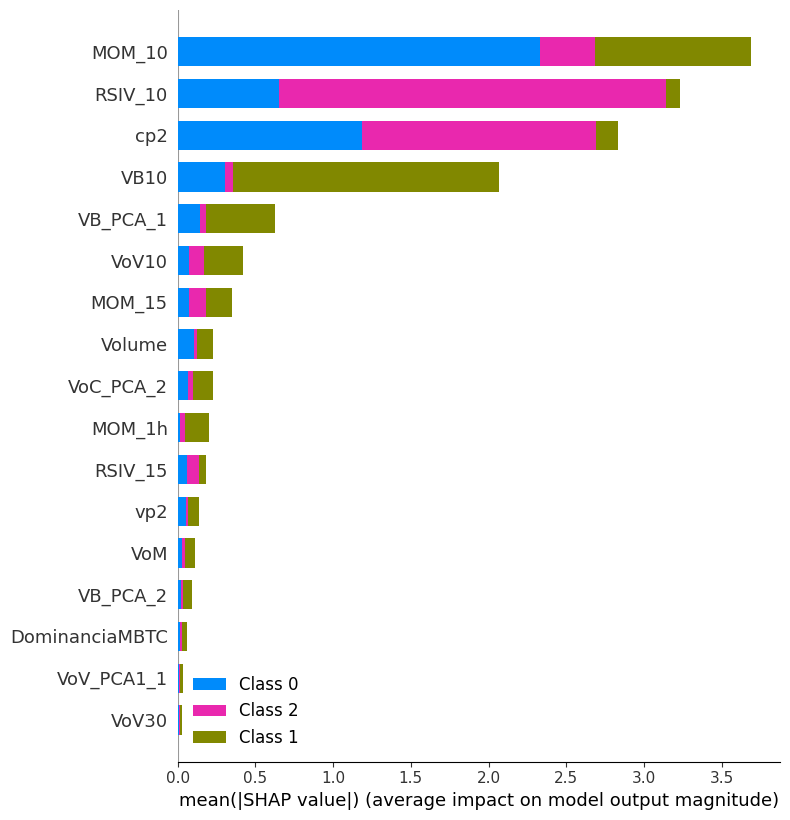

In [ ]:
import shap

explainer = shap.Explainer(model)
shap_values = explainer(X_val)

shap.summary_plot(shap_values, X_val)


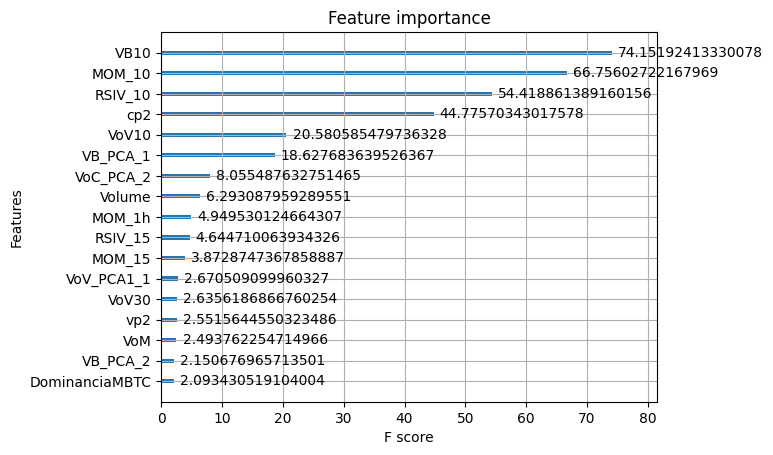

In [ ]:
import matplotlib.pyplot as plt
xgb.plot_importance(model, importance_type='gain')  # gain, weight, cover
plt.show()


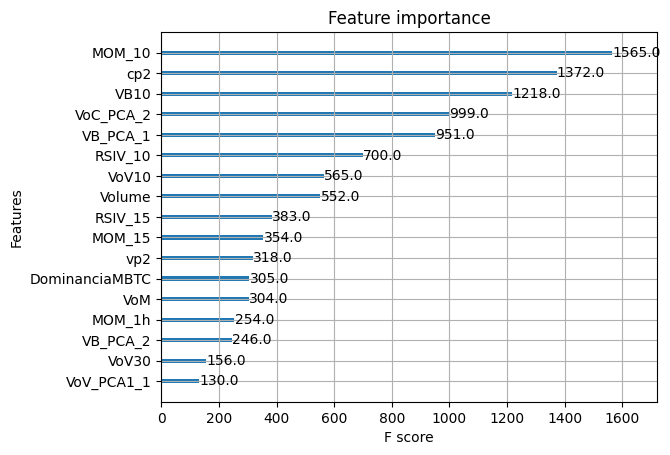

In [ ]:
import matplotlib.pyplot as plt
xgb.plot_importance(model, importance_type='weight')
plt.show()


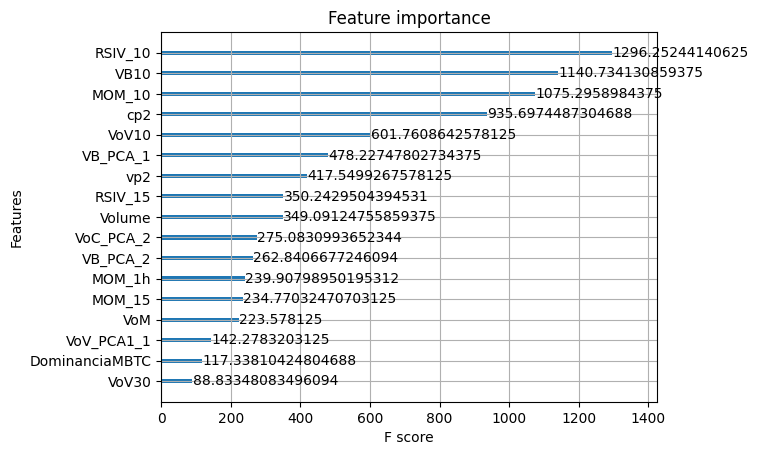

In [ ]:
import matplotlib.pyplot as plt
xgb.plot_importance(model, importance_type='cover')
plt.show()

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [21:09:14] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [21:09:16] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [21:09:17] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [21:09:18] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [21:09:18] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_e

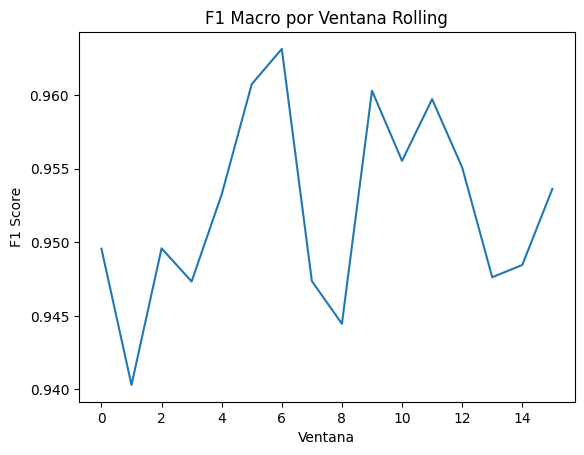

In [ ]:
from sklearn.metrics import classification_report, f1_score
import numpy as np

# Configurar tamaño de ventana y paso
window_size = 10000
step_size = 2000

rolling_results = []

for start in range(0, len(X_train) - window_size - step_size, step_size):
    end_train = start + window_size
    end_val = end_train + step_size

    X_rolling_train = X_train.iloc[start:end_train]
    y_rolling_train = y_train.iloc[start:end_train]
    X_rolling_val = X_train.iloc[end_train:end_val]
    y_rolling_val = y_train.iloc[end_train:end_val]

    model = xgb.XGBClassifier(
        objective='multi:softmax',
        num_class=3,
        n_estimators=100,
        max_depth=6,
        learning_rate=0.1,
        use_label_encoder=False,
        eval_metric='mlogloss'
    )

    model.fit(X_rolling_train, y_rolling_train)
    y_pred = model.predict(X_rolling_val)

    score = f1_score(y_rolling_val, y_pred, average='macro')  # o clase 2
    rolling_results.append(score)

# Visualizar los resultados
import matplotlib.pyplot as plt
plt.plot(rolling_results)
plt.title("F1 Macro por Ventana Rolling")
plt.xlabel("Ventana")
plt.ylabel("F1 Score")
plt.show()


In [ ]:
y_shuffled = y_train.sample(frac=1.0).reset_index(drop=True)
model.fit(X_train, y_shuffled)
y_pred = model.predict(X_val)
print(classification_report(y_val, y_pred))


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [21:09:25] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


              precision    recall  f1-score   support

           0       0.67      1.00      0.80      8336
           1       0.36      0.00      0.01      3393
           2       0.00      0.00      0.00       803

    accuracy                           0.66     12532
   macro avg       0.34      0.33      0.27     12532
weighted avg       0.54      0.66      0.53     12532



# XGB1 RED

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import xgboost as xgb
import matplotlib.pyplot as plt
import numpy as np

# Variables explicativas y objetivo
features = ['Close', 'Volume', 'cp2', "MOM_10", "RSIV_10",
            "VoV10", 'VB10', "VoV30"]
target = "Y1_1"

# Eliminar filas con NaN
df = mf1[features + [target]].dropna()
df[target] = df[target].astype(int)

# Definir X e y
X = df[features]
y = df[target]

# División: 70% train, 30% temp
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.30, stratify=y, random_state=42)

# División: 20% validation, 10% test (sobre el 30% restante)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=1/3, stratify=y_temp, random_state=42)


# Entrenar modelo multiclase
model = xgb.XGBClassifier(
    objective='multi:softmax',
    num_class=3,
    n_estimators=100,
    max_depth=6,
    learning_rate=0.1,
    use_label_encoder=False,
    eval_metric='mlogloss'
)

model.fit(X_train, y_train)

# --- Evaluación en validation ---
y_val_pred = model.predict(X_val)
print("📊 MATRIZ DE CONFUSIÓN (VALIDATION):")
print(confusion_matrix(y_val, y_val_pred))
print("📄 REPORT (VALIDATION):")
print(classification_report(y_val, y_val_pred))

# --- Evaluación en test ---
y_test_pred = model.predict(X_test)
print("📊 MATRIZ DE CONFUSIÓN (TEST):")
print(confusion_matrix(y_test, y_test_pred))
print("📄 REPORT (TEST):")
print(classification_report(y_test, y_test_pred))


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:49:51] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


📊 MATRIZ DE CONFUSIÓN (VALIDATION):
[[29658 52851]
 [22361 72095]]
📄 REPORT (VALIDATION):
              precision    recall  f1-score   support

           0       0.57      0.36      0.44     82509
           1       0.58      0.76      0.66     94456

    accuracy                           0.57    176965
   macro avg       0.57      0.56      0.55    176965
weighted avg       0.57      0.57      0.56    176965

📊 MATRIZ DE CONFUSIÓN (TEST):
[[15082 26172]
 [11366 35863]]
📄 REPORT (TEST):
              precision    recall  f1-score   support

           0       0.57      0.37      0.45     41254
           1       0.58      0.76      0.66     47229

    accuracy                           0.58     88483
   macro avg       0.57      0.56      0.55     88483
weighted avg       0.57      0.58      0.56     88483



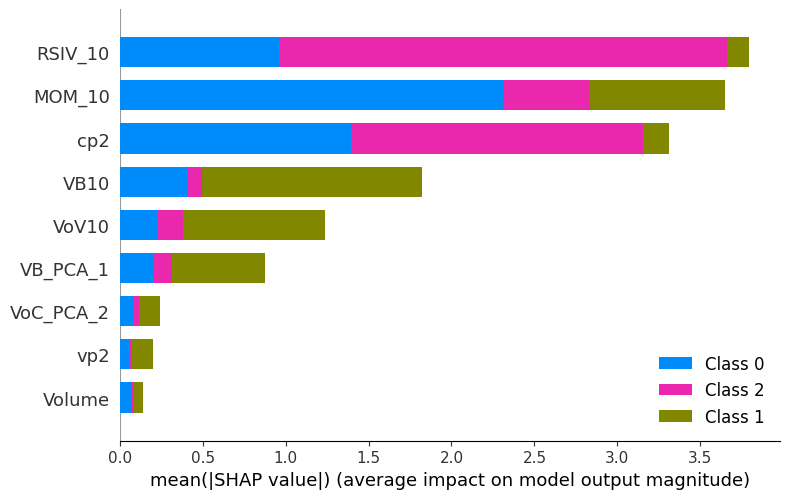

In [ ]:
import shap

explainer = shap.Explainer(model)
shap_values = explainer(X_val)

shap.summary_plot(shap_values, X_val)


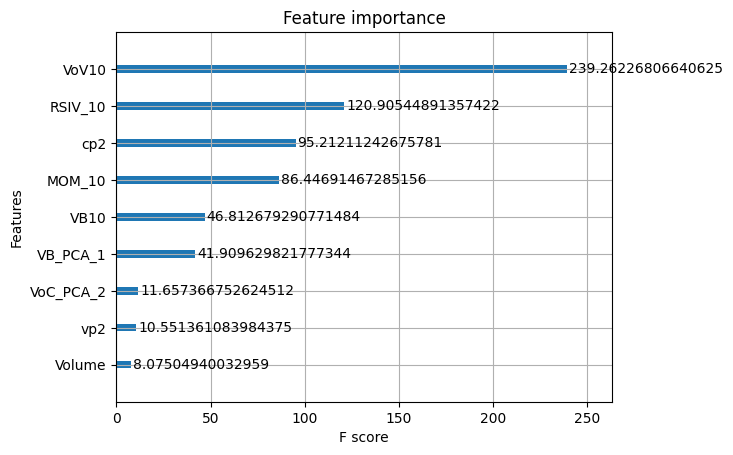

In [ ]:
import matplotlib.pyplot as plt
xgb.plot_importance(model, importance_type='gain')  # gain, weight, cover
plt.show()


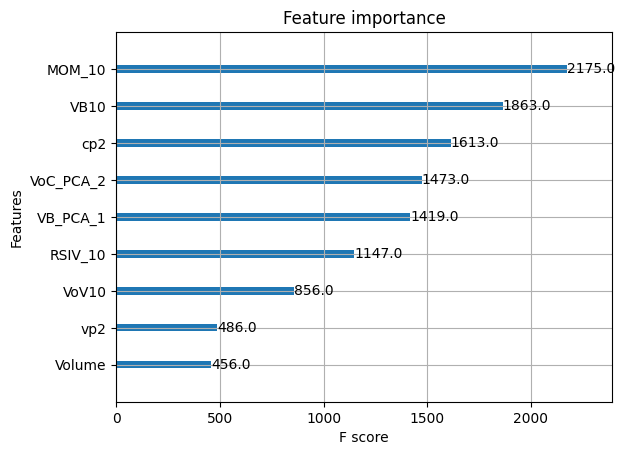

In [ ]:
import matplotlib.pyplot as plt
xgb.plot_importance(model, importance_type='weight')
plt.show()


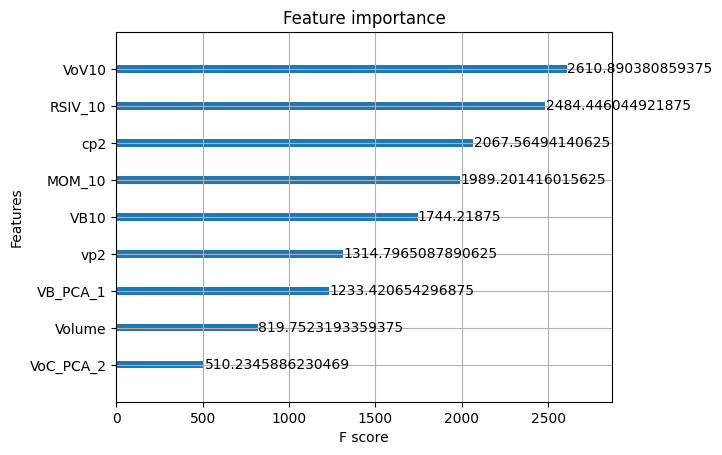

In [ ]:
import matplotlib.pyplot as plt
xgb.plot_importance(model, importance_type='cover')
plt.show()

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [21:39:30] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [21:39:34] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [21:39:36] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [21:39:39] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [21:39:41] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_e

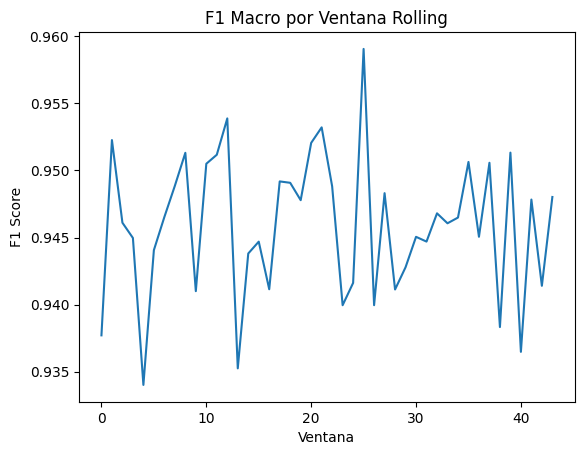

In [ ]:
from sklearn.metrics import classification_report, f1_score
import numpy as np

# Configurar tamaño de ventana y paso
window_size = 10000
step_size = 2000

rolling_results = []

for start in range(0, len(X_train) - window_size - step_size, step_size):
    end_train = start + window_size
    end_val = end_train + step_size

    X_rolling_train = X_train.iloc[start:end_train]
    y_rolling_train = y_train.iloc[start:end_train]
    X_rolling_val = X_train.iloc[end_train:end_val]
    y_rolling_val = y_train.iloc[end_train:end_val]

    model = xgb.XGBClassifier(
        objective='multi:softmax',
        num_class=3,
        n_estimators=100,
        max_depth=6,
        learning_rate=0.1,
        use_label_encoder=False,
        eval_metric='mlogloss'
    )

    model.fit(X_rolling_train, y_rolling_train)
    y_pred = model.predict(X_rolling_val)

    score = f1_score(y_rolling_val, y_pred, average='macro')  # o clase 2
    rolling_results.append(score)

# Visualizar los resultados
import matplotlib.pyplot as plt
plt.plot(rolling_results)
plt.title("F1 Macro por Ventana Rolling")
plt.xlabel("Ventana")
plt.ylabel("F1 Score")
plt.show()


In [ ]:
y_shuffled = y_train.sample(frac=1.0).reset_index(drop=True)
model.fit(X_train, y_shuffled)
y_pred = model.predict(X_val)
print(classification_report(y_val, y_pred))


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [21:40:23] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


              precision    recall  f1-score   support

           0       0.59      1.00      0.74     16841
           1       0.24      0.00      0.00      8664
           2       0.00      0.00      0.00      2945

    accuracy                           0.59     28450
   macro avg       0.28      0.33      0.25     28450
weighted avg       0.42      0.59      0.44     28450



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


# XGB1 BEST + Premio minoritaria

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import xgboost as xgb
import numpy as np

# Definir X e y
X = df[features]
y = df[target]

# División: 70% train, 30% temp
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.30, stratify=y, random_state=42)

# División: 20% validation, 10% test (sobre el 30% restante)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=1/3, stratify=y_temp, random_state=42)

# 🎯 Asignar peso a cada clase (recompensa por predecir la clase 2 correctamente)
# Invertimos la lógica del peso de errores: menor peso = menor castigo si se equivoca
# entonces dar más peso equivale a forzarlo a predecir mejor esa clase
weights = y_train.map({0: 1.0, 1: 1.0, 2: 2.0}).values  # Recompensa por aprender la clase 2

# Entrenar modelo multiclase con peso por muestra
model = xgb.XGBClassifier(
    objective='multi:softmax',
    num_class=3,
    n_estimators=100,
    max_depth=6,
    learning_rate=0.1,
    use_label_encoder=False,
    eval_metric='mlogloss'
)

model.fit(X_train, y_train, sample_weight=weights)

# --- Evaluación en validation ---
y_val_pred = model.predict(X_val)
print("📊 MATRIZ DE CONFUSIÓN (VALIDATION):")
print(confusion_matrix(y_val, y_val_pred))
print("📄 REPORT (VALIDATION):")
print(classification_report(y_val, y_val_pred))

# --- Evaluación en test ---
y_test_pred = model.predict(X_test)
print("📊 MATRIZ DE CONFUSIÓN (TEST):")
print(confusion_matrix(y_test, y_test_pred))
print("📄 REPORT (TEST):")
print(classification_report(y_test, y_test_pred))


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [03:18:32] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


📊 MATRIZ DE CONFUSIÓN (VALIDATION):
[[10551   203   322]
 [  176  3959    79]
 [  102    74  1057]]
📄 REPORT (VALIDATION):
              precision    recall  f1-score   support

           0       0.97      0.95      0.96     11076
           1       0.93      0.94      0.94      4214
           2       0.72      0.86      0.79      1233

    accuracy                           0.94     16523
   macro avg       0.88      0.92      0.90     16523
weighted avg       0.95      0.94      0.94     16523

📊 MATRIZ DE CONFUSIÓN (TEST):
[[5254  103  181]
 [  95 1975   37]
 [  59   25  533]]
📄 REPORT (TEST):
              precision    recall  f1-score   support

           0       0.97      0.95      0.96      5538
           1       0.94      0.94      0.94      2107
           2       0.71      0.86      0.78       617

    accuracy                           0.94      8262
   macro avg       0.87      0.92      0.89      8262
weighted avg       0.94      0.94      0.94      8262



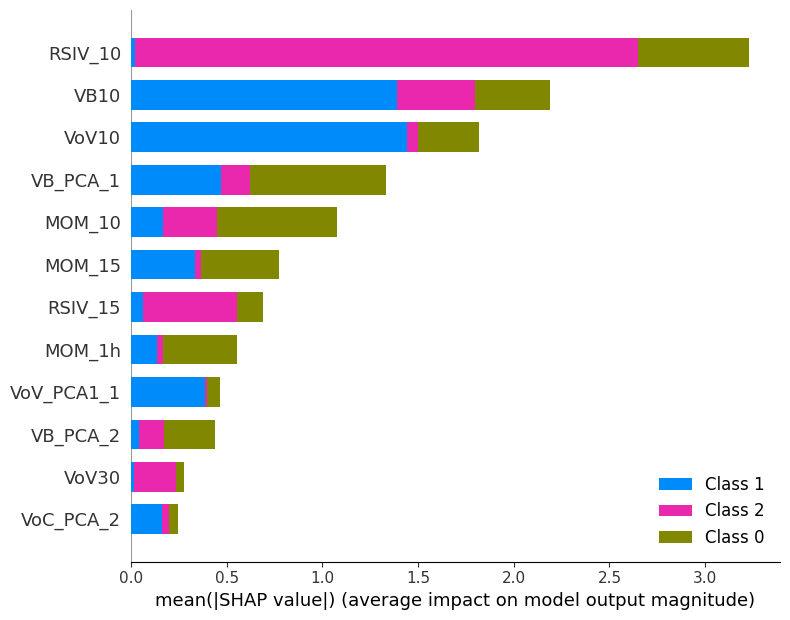

In [ ]:
import shap

explainer = shap.Explainer(model)
shap_values = explainer(X_val)

shap.summary_plot(shap_values, X_val)


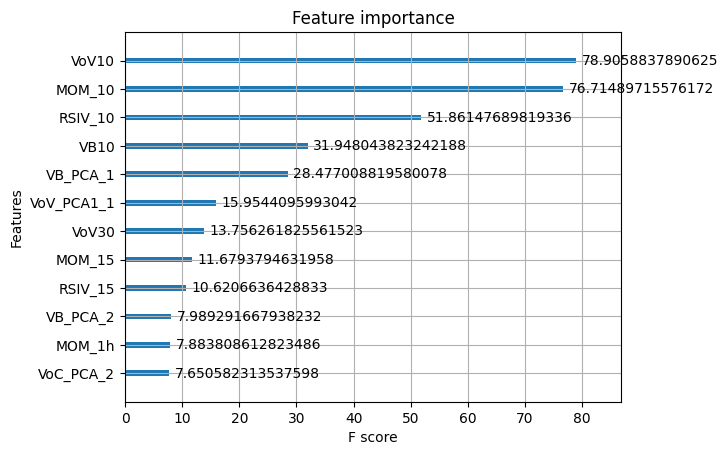

In [ ]:
import matplotlib.pyplot as plt
xgb.plot_importance(model, importance_type='gain')  # gain, weight, cover
plt.show()


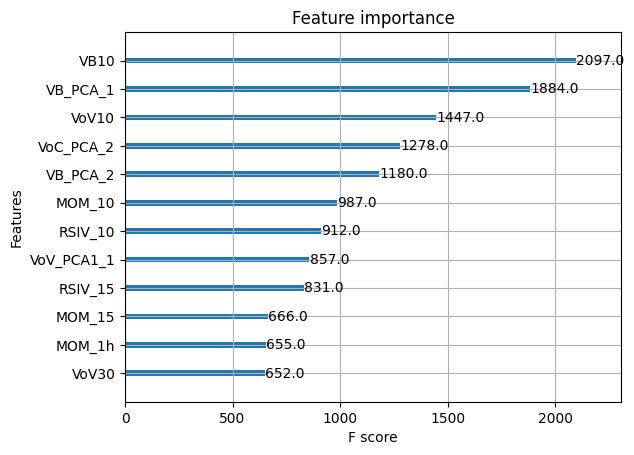

In [ ]:
import matplotlib.pyplot as plt
xgb.plot_importance(model, importance_type='weight')
plt.show()


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:51:17] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:51:18] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:51:19] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:51:19] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:51:20] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_e

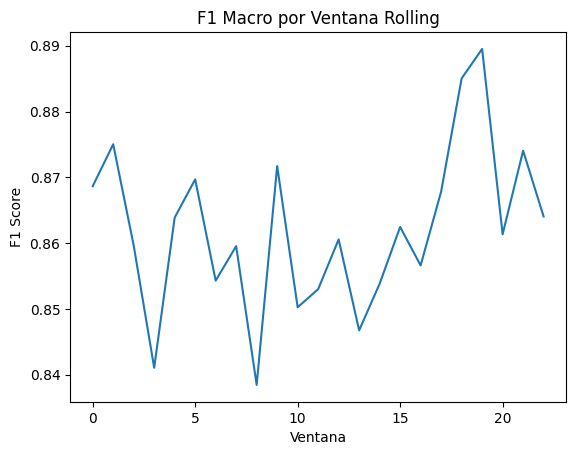

In [ ]:
from sklearn.metrics import classification_report, f1_score
import numpy as np

# Configurar tamaño de ventana y paso
window_size = 10000
step_size = 2000

rolling_results = []

for start in range(0, len(X_train) - window_size - step_size, step_size):
    end_train = start + window_size
    end_val = end_train + step_size

    X_rolling_train = X_train.iloc[start:end_train]
    y_rolling_train = y_train.iloc[start:end_train]
    X_rolling_val = X_train.iloc[end_train:end_val]
    y_rolling_val = y_train.iloc[end_train:end_val]

    model = xgb.XGBClassifier(
        objective='multi:softmax',
        num_class=3,
        n_estimators=100,
        max_depth=6,
        learning_rate=0.1,
        use_label_encoder=False,
        eval_metric='mlogloss'
    )

    model.fit(X_rolling_train, y_rolling_train)
    y_pred = model.predict(X_rolling_val)

    score = f1_score(y_rolling_val, y_pred, average='macro')  # o clase 2
    rolling_results.append(score)

# Visualizar los resultados
import matplotlib.pyplot as plt
plt.plot(rolling_results)
plt.title("F1 Macro por Ventana Rolling")
plt.xlabel("Ventana")
plt.ylabel("F1 Score")
plt.show()


In [ ]:
y_shuffled = y_train.sample(frac=1.0).reset_index(drop=True)
model.fit(X_train, y_shuffled)
y_pred = model.predict(X_val)
print(classification_report(y_val, y_pred))


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:52:20] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


              precision    recall  f1-score   support

           0       0.67      1.00      0.80     11076
           1       0.45      0.00      0.00      4214
           2       0.00      0.00      0.00      1233

    accuracy                           0.67     16523
   macro avg       0.38      0.33      0.27     16523
weighted avg       0.57      0.67      0.54     16523



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


# No VB10

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import xgboost as xgb
import matplotlib.pyplot as plt
import numpy as np

# Variables explicativas y objetivo
features = ['Volume', 'VoM', 'DominanciaMBTC', 'cp2', 'vp2',
            'MOM_1h',  "VoV10", "VoV30", "VoV_PCA1_1",
            'VoC_PCA_2', 'VB_PCA_1', 'VB_PCA_2']
target = "B"

# Eliminar filas con NaN
df = mf1[features + [target]].dropna()
df[target] = df[target].astype(int)

# Definir X e y
X = df[features]
y = df[target]

# División: 70% train, 30% temp
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.30, stratify=y, random_state=42)

# División: 20% validation, 10% test (sobre el 30% restante)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=1/3, stratify=y_temp, random_state=42)


# Entrenar modelo multiclase
model = xgb.XGBClassifier(
    objective='multi:softmax',
    num_class=3,
    n_estimators=100,
    max_depth=6,
    learning_rate=0.1,
    use_label_encoder=False,
    eval_metric='mlogloss'
)

model.fit(X_train, y_train)

# --- Evaluación en validation ---
y_val_pred = model.predict(X_val)
print("📊 MATRIZ DE CONFUSIÓN (VALIDATION):")
print(confusion_matrix(y_val, y_val_pred))
print("📄 REPORT (VALIDATION):")
print(classification_report(y_val, y_val_pred))

# --- Evaluación en test ---
y_test_pred = model.predict(X_test)
print("📊 MATRIZ DE CONFUSIÓN (TEST):")
print(confusion_matrix(y_test, y_test_pred))
print("📄 REPORT (TEST):")
print(classification_report(y_test, y_test_pred))


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [21:30:41] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


📊 MATRIZ DE CONFUSIÓN (VALIDATION):
[[13899   851  2445]
 [  560 15409   346]
 [ 5796   784  4633]]
📄 REPORT (VALIDATION):
              precision    recall  f1-score   support

           0       0.69      0.81      0.74     17195
           1       0.90      0.94      0.92     16315
           2       0.62      0.41      0.50     11213

    accuracy                           0.76     44723
   macro avg       0.74      0.72      0.72     44723
weighted avg       0.75      0.76      0.75     44723

📊 MATRIZ DE CONFUSIÓN (TEST):
[[6994  403 1201]
 [ 268 7721  169]
 [2916  366 2324]]
📄 REPORT (TEST):
              precision    recall  f1-score   support

           0       0.69      0.81      0.74      8598
           1       0.91      0.95      0.93      8158
           2       0.63      0.41      0.50      5606

    accuracy                           0.76     22362
   macro avg       0.74      0.72      0.72     22362
weighted avg       0.75      0.76      0.75     22362



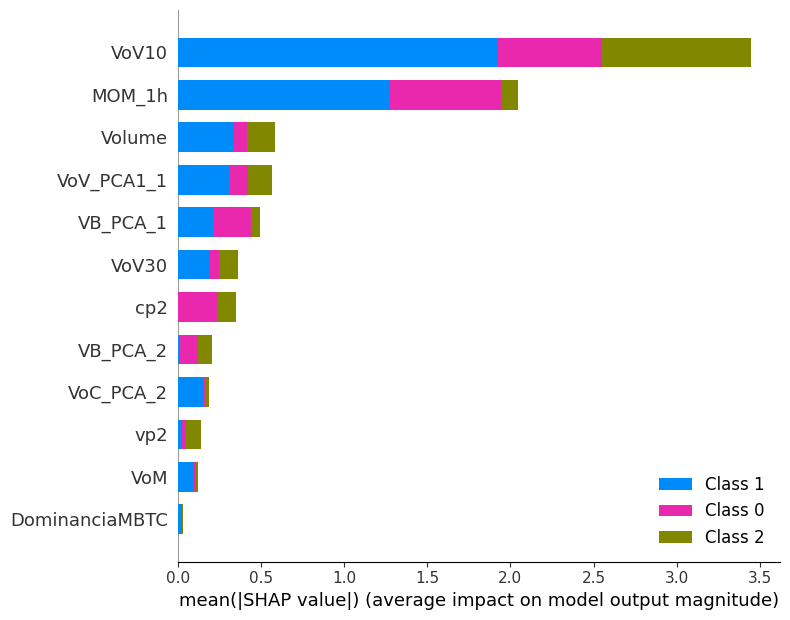

In [ ]:
import shap

explainer = shap.Explainer(model)
shap_values = explainer(X_val)

shap.summary_plot(shap_values, X_val)


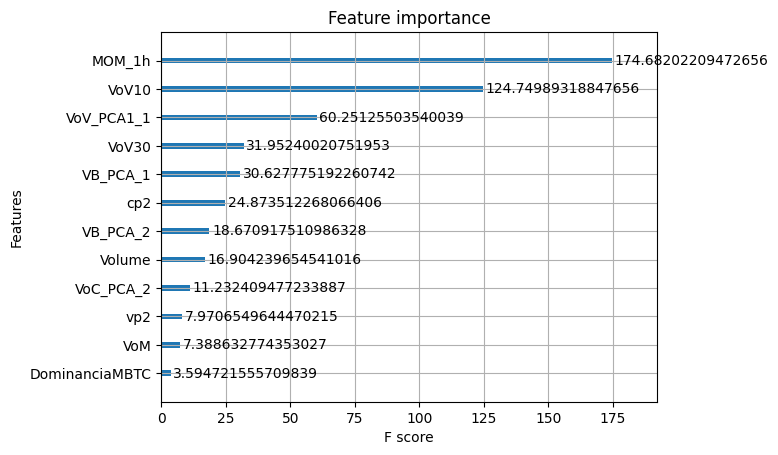

In [ ]:
import matplotlib.pyplot as plt
xgb.plot_importance(model, importance_type='gain')  # gain, weight, cover
plt.show()


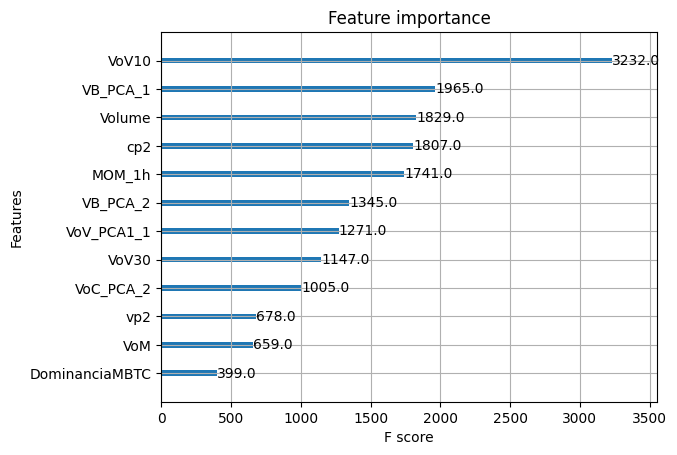

In [ ]:
import matplotlib.pyplot as plt
xgb.plot_importance(model, importance_type='weight')
plt.show()


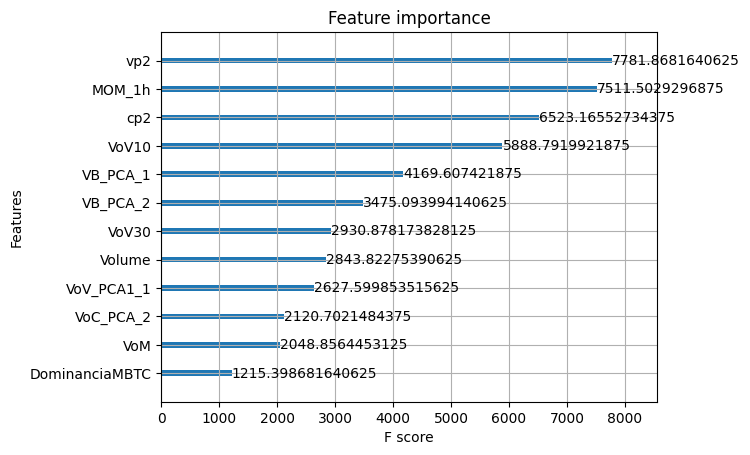

In [ ]:
import matplotlib.pyplot as plt
xgb.plot_importance(model, importance_type='cover')
plt.show()

#ESQUEMA POR UNIVERSO POR CAPAS TEMPORALES

In [ ]:
# VoV
for nombre in ventanas_vol.keys():
    vb_col = f"VB{nombre}"
    vov_col = f"VoV{nombre}"

    if vb_col in mf1.columns:
        mf1[vov_col] = np.sqrt(mf1["Volumet"] * mf1[vb_col])


/tmp/ipython-input-89-3850506155.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1[vov_col] = np.sqrt(mf1["Volumet"] * mf1[vb_col])
/tmp/ipython-input-89-3850506155.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1[vov_col] = np.sqrt(mf1["Volumet"] * mf1[vb_col])
/tmp/ipython-input-89-3850506155.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

**MCP1**

In [ ]:
print(mf1.columns.tolist())

['Datetime', 'High', 'Low', 'Close', 'Volume', 'ETH_Close', 'ETH_Volume', 'USDT_Close', 'USDT_Volume', 'XRP_Close', 'XRP_Volume', 'SOL_Close', 'SOL_Volume', 'DOGE_Close', 'DOGE_Volume', 'VoM', 'DominanciaBTC', 'MC', 'MCM', 'DominanciaMBTC', 'cp2', 'vp2', 'B', 'B1', 'SD_1', 'VB5', 'SD_2', 'VB10', 'SD_3', 'VB15', 'SD_6', 'VB30', 'SD_12', 'VB1h', 'SD_24', 'VB2h', 'SD_48', 'VB4h', 'SD_72', 'VB6h', 'SD_144', 'VB12h', 'SD_288', 'VB1d', 'SD_864', 'VB3d', 'SD_1152', 'VB4d', 'SD_1440', 'VB5d', 'SD_2016', 'VB1s', 'SD_4032', 'VB2s', 'SD_8064', 'VB1m', 'SD_16128', 'VB2m', 'SD_24192', 'VB3m', 'SD_32256', 'VB4m', 'SD_40320', 'VB5m', 'SD_48384', 'VB6m', 'SD_72576', 'VB9m', 'SD_100800', 'VB1a', 'SD_201600', 'VB2a', 'SD_302400', 'VB3a', 'VB_PCA_1', 'VB_PCA_2', 'VB_PCA_3', 'VB_PCA_4', 'QBpc', 'QSD_1', 'VQ5', 'QSD_2', 'VQ10', 'QSD_3', 'VQ15', 'QSD_6', 'VQ30', 'QSD_12', 'VQ1h', 'QSD_24', 'VQ2h', 'QSD_48', 'VQ4h', 'QSD_72', 'VQ6h', 'QSD_144', 'VQ12h', 'QSD_288', 'VQ1d', 'QSD_864', 'VQ3d', 'QSD_1152', 'VQ4d

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ["VoV5", "VoV10", "VoV15", "VoV30", "VoV1h", "VoV2h", "VoV4h", "VoV6h", "VoV12h",
             "VoV1d", "VoV3d", "VoV4d", "VoV5d", "VoV1s", "VoV2s", "VoV1m", "VoV2m", "VoV3m",
             "VoV4m", "VoV5m", "VoV6m", "VoV9m", "VoV1a", "VoV2a", "VoV3a"]

# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B1'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)


   Variable  Mutual Information
3     VoV30            0.040314
4     VoV1h            0.039455
5     VoV2h            0.037763
2     VoV15            0.037610
6     VoV4h            0.036692
7     VoV6h            0.033960
22    VoV1a            0.033737
1     VoV10            0.032761
8    VoV12h            0.032029
21    VoV9m            0.031766
20    VoV6m            0.031118
19    VoV5m            0.030965
18    VoV4m            0.029585
9     VoV1d            0.029422
24    VoV3a            0.029003
11    VoV4d            0.028589
13    VoV1s            0.028395
10    VoV3d            0.028365
12    VoV5d            0.028065
17    VoV3m            0.027778
14    VoV2s            0.027262
15    VoV1m            0.026584
16    VoV2m            0.026395
23    VoV2a            0.025618
0      VoV5            0.000322


In [ ]:
# "VoV30", "VoV1h"
# PCA corto y PcA largo

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ["VVo10", "VVo15", "VVo30", "VVo1h", "VVo2h", "VVo4h", "VVo6h"]
# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=4)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
for i in range(4):
    mf1.loc[subset.index, f'VVo_1PCA1_{i+1}'] = principal_component[:, i]

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ["VVo4m", "VVo5m", "VVo6m", "VVo9m", "VVo1a"]
# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=4)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
for i in range(4):
    mf1.loc[subset.index, f'VVo_1PCA2_{i+1}'] = principal_component[:, i]

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ['VVo_1PCA1_1', 'VVo_1PCA1_2', 'VVo_1PCA1_3', 'VVo_1PCA1_4', 'VVo_1PCA2_1', 'VVo_1PCA2_2', 'VVo_1PCA2_3', 'VVo_1PCA2_4']
# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B1'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)


      Variable  Mutual Information
4  VVo_1PCA2_1            0.040927
0  VVo_1PCA1_1            0.035481
5  VVo_1PCA2_2            0.033471
6  VVo_1PCA2_3            0.029150
7  VVo_1PCA2_4            0.022454
1  VVo_1PCA1_2            0.019950
2  VVo_1PCA1_3            0.017219
3  VVo_1PCA1_4            0.016122


In [ ]:
# variables = ["VVo10", "VVo15", "VVo30", "VVo1h", "VVo2h", "VVo4h", "VVo6h"]
# loadings = pd.Series(pca.components_[0], index=variables)

# print("Cargas del primer componente:")
# print(loadings.sort_values(ascending=False))

# print("\nVarianza explicada por el primer componente:")
# print(pca.explained_variance_ratio_[0])


Cargas del primer componente:
VB1h     0.378367
VB30     0.377974
VB2h     0.369040
VB15     0.367628
VB10     0.346867
VB4h     0.329978
VB6h     0.295419
VB12h    0.268562
VB1d     0.232450
dtype: float64

Varianza explicada por el primer componente:
0.5985023096380601


In [ ]:
# variables = ["VVo2m", "VVo3m", "VVo4m", "VVo5m", "VVo6m", "VVo9m", "VVo1a", "VVo2a", "VVo3a", "VVo4a"]
# loadings = pd.Series(pca.components_[0], index=variables)

# print("Cargas del primer componente:")
# print(loadings.sort_values(ascending=False))

# print("\nVarianza explicada por el primer componente:")
# print(pca.explained_variance_ratio_[0])


In [ ]:
#Optimo:
# ["VoV30", "VoV1h", "VVo_1PCA1_1", "VVo_1PCA2_1", "VVo_1PCA2_2"]

**MCP2**

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ["VVo5","VVo10", "VVo15", "VVo30", "VVo1h", "VVo2h", "VVo4h", "VVo6h", "VVo12h", "VVo1d",
 "VVo3d", "VVo4d", "VVo5d", "VVo1s", "VVo2s", "VVo1m", "VVo2m", "VVo3m", "VVo4m", "VVo5m",
 "VVo6m", "VVo9m", "VVo1a", "VVo2a", "VVo3a", "VVo4a"]

# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B2'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)

   Variable  Mutual Information
21    VVo9m            0.064228
24    VVo3a            0.063366
22    VVo1a            0.063037
23    VVo2a            0.062641
19    VVo5m            0.061486
20    VVo6m            0.060948
18    VVo4m            0.059837
17    VVo3m            0.059547
25    VVo4a            0.058589
16    VVo2m            0.052790
15    VVo1m            0.047340
14    VVo2s            0.038293
13    VVo1s            0.030475
3     VVo30            0.028711
2     VVo15            0.028418
4     VVo1h            0.027480
5     VVo2h            0.025935
6     VVo4h            0.025264
12    VVo5d            0.024491
7     VVo6h            0.023443
11    VVo4d            0.022950
9     VVo1d            0.022758
10    VVo3d            0.022002
1     VVo10            0.021896
8    VVo12h            0.021335
0      VVo5            0.000000


In [ ]:
# "VVo9m", "VVo1a", "VVo2a", "VVo3a", "VVo4a"
# + PCA 5<=VBs<=2m +  PCA 2m<VBs<=6m

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ["VVo10", "VVo15", "VVo30", "VVo1h", "VVo2h", "VVo4h", "VVo6h", "VVo12h", "VVo1d",
 "VVo3d", "VVo4d", "VVo5d", "VVo1s", "VVo2s", "VVo1m", "VVo2m"]

# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=4)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
for i in range(4):
    mf1.loc[subset.index, f'VVo_2PCA1_{i+1}'] = principal_component[:, i]

/tmp/ipython-input-152-1147587152.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VVo_2PCA1_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-152-1147587152.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VVo_2PCA1_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-152-1147587152.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ["VVo3m", "VVo4m", "VVo5m","VVo6m"]

# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=4)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
for i in range(4):
    mf1.loc[subset.index, f'VVo_2PCA2_{i+1}'] = principal_component[:, i]

/tmp/ipython-input-153-4110807015.py:24: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VVo_2PCA2_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-153-4110807015.py:24: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VVo_2PCA2_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-153-4110807015.py:24: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

In [ ]:
print(mf1.columns.tolist())

['Datetime', 'High', 'Low', 'Close', 'Volume', 'ETH_Close', 'ETH_Volume', 'USDT_Close', 'USDT_Volume', 'XRP_Close', 'XRP_Volume', 'SOL_Close', 'SOL_Volume', 'DOGE_Close', 'DOGE_Volume', 'VoM', 'DominanciaBTC', 'MC', 'MCM', 'DominanciaMBTC', 'cp2', 'vp2', 'B', 'B1', 'SD_1', 'VB5', 'SD_2', 'VB10', 'SD_3', 'VB15', 'SD_6', 'VB30', 'SD_12', 'VB1h', 'SD_24', 'VB2h', 'SD_48', 'VB4h', 'SD_72', 'VB6h', 'SD_144', 'VB12h', 'SD_288', 'VB1d', 'SD_864', 'VB3d', 'SD_1152', 'VB4d', 'SD_1440', 'VB5d', 'SD_2016', 'VB1s', 'SD_4032', 'VB2s', 'SD_8064', 'VB1m', 'SD_16128', 'VB2m', 'SD_24192', 'VB3m', 'SD_32256', 'VB4m', 'SD_40320', 'VB5m', 'SD_48384', 'VB6m', 'SD_72576', 'VB9m', 'SD_100800', 'VB1a', 'SD_201600', 'VB2a', 'SD_302400', 'VB3a', 'VB_PCA_1', 'VB_PCA_2', 'VB_PCA_3', 'VB_PCA_4', 'QBpc', 'QSD_1', 'VQ5', 'QSD_2', 'VQ10', 'QSD_3', 'VQ15', 'QSD_6', 'VQ30', 'QSD_12', 'VQ1h', 'QSD_24', 'VQ2h', 'QSD_48', 'VQ4h', 'QSD_72', 'VQ6h', 'QSD_144', 'VQ12h', 'QSD_288', 'VQ1d', 'QSD_864', 'VQ3d', 'QSD_1152', 'VQ4d

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ["VB2a", 'VB3a', 'VB_1PCA_1', 'VVo_2PCA1_1', 'VVo_2PCA1_2',
            'VVo_2PCA1_3', 'VVo_2PCA1_4', 'VVo_2PCA2_1', 'VVo_2PCA2_2',
            'VVo_2PCA2_3', 'VVo_2PCA2_4']
# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B2'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)


       Variable  Mutual Information
0          VB2a            0.060506
11  VVo_2PCA2_1            0.060249
1          VB3a            0.059364
12  VVo_2PCA2_2            0.038896
13  VVo_2PCA2_3            0.028285
14  VVo_2PCA2_4            0.023614
7   VVo_2PCA1_1            0.021293
3    VVo_2PCA_1            0.021260
2     VB_1PCA_1            0.021239
8   VVo_2PCA1_2            0.013714
4    VVo_2PCA_2            0.013570
9   VVo_2PCA1_3            0.011014
5    VVo_2PCA_3            0.010856
10  VVo_2PCA1_4            0.007431
6    VVo_2PCA_4            0.007328


In [ ]:
# variables = ['VB3m', 'VB4m', 'VB5m', 'VB6m', 'VB9m', 'VB1a', 'VB2a', "VB3a"]
# loadings = pd.Series(pca.components_[1], index=variables)

# print("Cargas del x componente:")
# print(loadings.sort_values(ascending=False))

# print("\nVarianza explicada por el x componente:")
# print(pca.explained_variance_ratio_[1])


Cargas del x componente:
VB3a    0.578321
VB2a    0.494974
VB1a    0.211773
VB9m    0.041496
VB6m   -0.198352
VB5m   -0.292615
VB3m   -0.348815
VB4m   -0.356842
dtype: float64

Varianza explicada por el x componente:
0.14030230034736205


In [ ]:
# "VVo_2PCA2_1", "VVo9m", "VVo1a", "VVo2a", "VVo3a", "VVo4a"

**MCP3**

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ["VVo5","VVo10", "VVo15", "VVo30", "VVo1h", "VVo2h", "VVo4h", "VVo6h", "VVo12h", "VVo1d",
 "VVo3d", "VVo4d", "VVo5d", "VVo1s", "VVo2s", "VVo1m", "VVo2m", "VVo3m", "VVo4m", "VVo5m",
 "VVo6m", "VVo9m", "VVo1a", "VVo2a", "VVo3a", "VVo4a"]

# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B3'].fillna(2).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)

   Variable  Mutual Information
23    VVo2a            0.085286
24    VVo3a            0.085125
21    VVo9m            0.083819
22    VVo1a            0.082498
20    VVo6m            0.081450
19    VVo5m            0.081103
18    VVo4m            0.079178
25    VVo4a            0.078738
17    VVo3m            0.076548
16    VVo2m            0.067369
15    VVo1m            0.056650
14    VVo2s            0.045709
13    VVo1s            0.032387
2     VVo15            0.026297
12    VVo5d            0.026139
3     VVo30            0.025817
11    VVo4d            0.023169
5     VVo2h            0.023152
4     VVo1h            0.023086
10    VVo3d            0.022082
6     VVo4h            0.021343
7     VVo6h            0.020719
9     VVo1d            0.020494
8    VVo12h            0.020114
1     VVo10            0.019501
0      VVo5            0.000000


In [ ]:
#  "VVo2a", "VVo3a"
# + PCA  ["VVo3m", "VVo4m", "VVo5m", "VVo6m", "VVo9m", "VVo1a"]

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ["VVo3m", "VVo4m", "VVo5m", "VVo6m", "VVo9m", "VVo1a"]

# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=4)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
for i in range(4):
    mf1.loc[subset.index, f'VVo_3PCA_{i+1}'] = principal_component[:, i]

/tmp/ipython-input-164-197435489.py:24: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VVo_3PCA_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-164-197435489.py:24: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VVo_3PCA_{i+1}'] = principal_component[:, i]


In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ['VB1m', 'VB2m', 'VB3m',
             'VB4m', 'VB5m', 'VB6m', 'VB9m']

# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=4)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
for i in range(4):
    mf1.loc[subset.index, f'VB_2PCA2_{i+1}'] = principal_component[:, i]

/tmp/ipython-input-124-2416292975.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VB_2PCA2_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-124-2416292975.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VB_2PCA2_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-124-2416292975.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at on

In [ ]:
print(mf1.columns.tolist())

['Datetime', 'High', 'Low', 'Close', 'Volume', 'ETH_Close', 'ETH_Volume', 'USDT_Close', 'USDT_Volume', 'XRP_Close', 'XRP_Volume', 'SOL_Close', 'SOL_Volume', 'DOGE_Close', 'DOGE_Volume', 'VoM', 'DominanciaBTC', 'MC', 'MCM', 'DominanciaMBTC', 'cp2', 'vp2', 'B', 'B1', 'SD_1', 'VB5', 'SD_2', 'VB10', 'SD_3', 'VB15', 'SD_6', 'VB30', 'SD_12', 'VB1h', 'SD_24', 'VB2h', 'SD_48', 'VB4h', 'SD_72', 'VB6h', 'SD_144', 'VB12h', 'SD_288', 'VB1d', 'SD_864', 'VB3d', 'SD_1152', 'VB4d', 'SD_1440', 'VB5d', 'SD_2016', 'VB1s', 'SD_4032', 'VB2s', 'SD_8064', 'VB1m', 'SD_16128', 'VB2m', 'SD_24192', 'VB3m', 'SD_32256', 'VB4m', 'SD_40320', 'VB5m', 'SD_48384', 'VB6m', 'SD_72576', 'VB9m', 'SD_100800', 'VB1a', 'SD_201600', 'VB2a', 'SD_302400', 'VB3a', 'VB_PCA_1', 'VB_PCA_2', 'VB_PCA_3', 'VB_PCA_4', 'QBpc', 'QSD_1', 'VQ5', 'QSD_2', 'VQ10', 'QSD_3', 'VQ15', 'QSD_6', 'VQ30', 'QSD_12', 'VQ1h', 'QSD_24', 'VQ2h', 'QSD_48', 'VQ4h', 'QSD_72', 'VQ6h', 'QSD_144', 'VQ12h', 'QSD_288', 'VQ1d', 'QSD_864', 'VQ3d', 'QSD_1152', 'VQ4d

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ["VVo9m", "VVo1a", 'VVo_3PCA_1', 'VVo_3PCA_2', 'VVo_3PCA_3', 'VVo_3PCA_4']
# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B3'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)


     Variable  Mutual Information
0       VVo9m            0.084252
1       VVo1a            0.082679
2  VVo_3PCA_1            0.079326
3  VVo_3PCA_2            0.060717
4  VVo_3PCA_3            0.050663
5  VVo_3PCA_4            0.044476


In [ ]:
# variables = ['VB3m', 'VB4m', 'VB5m', 'VB6m', 'VB9m', 'VB1a', 'VB2a', "VB3a"]
# loadings = pd.Series(pca.components_[1], index=variables)

# print("Cargas del x componente:")
# print(loadings.sort_values(ascending=False))

# print("\nVarianza explicada por el x componente:")
# print(pca.explained_variance_ratio_[1])


Cargas del x componente:
VB3a    0.578321
VB2a    0.494974
VB1a    0.211773
VB9m    0.041496
VB6m   -0.198352
VB5m   -0.292615
VB3m   -0.348815
VB4m   -0.356842
dtype: float64

Varianza explicada por el x componente:
0.14030230034736205


In [ ]:
#  "VVo_3PCA_1", "VVo_3PCA_2", "VVo9m", "VVo1a", "VVo2a", "VVo3a"

**SHAP ZONE**

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import xgboost as xgb
import matplotlib.pyplot as plt
import numpy as np

# Variables explicativas y objetivo
features = list(set([
    "VoV30", "VoV1h", "VVo_1PCA1_1", "VVo_1PCA2_1", "VVo_1PCA2_2"
]))

target = "B1"

# Eliminar filas con NaN
df = mf1[features + [target]].dropna()
df[target] = df[target].astype(int)

# Definir X e y
X = df[features]
y = df[target]

# División: 70% train, 30% temp
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.30, stratify=y, random_state=42)

# División: 20% validation, 10% test (sobre el 30% restante)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=1/3, stratify=y_temp, random_state=42)


# Entrenar modelo multiclase
model = xgb.XGBClassifier(
    objective='multi:softmax',
    num_class=3,
    n_estimators=100,
    max_depth=6,
    learning_rate=0.1,
    use_label_encoder=False,
    eval_metric='mlogloss'
)

model.fit(X_train, y_train)

# --- Evaluación en validation ---
y_val_pred = model.predict(X_val)
print("📊 MATRIZ DE CONFUSIÓN (VALIDATION):")
print(confusion_matrix(y_val, y_val_pred))
print("📄 REPORT (VALIDATION):")
print(classification_report(y_val, y_val_pred))

# --- Evaluación en test ---
y_test_pred = model.predict(X_test)
print("📊 MATRIZ DE CONFUSIÓN (TEST):")
print(confusion_matrix(y_test, y_test_pred))
print("📄 REPORT (TEST):")
print(classification_report(y_test, y_test_pred))


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:23:59] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


📊 MATRIZ DE CONFUSIÓN (VALIDATION):
[[19644 14373 19365]
 [10690 27558 10538]
 [18878 14222 19880]]
📄 REPORT (VALIDATION):
              precision    recall  f1-score   support

           0       0.40      0.37      0.38     53382
           1       0.49      0.56      0.53     48786
           2       0.40      0.38      0.39     52980

    accuracy                           0.43    155148
   macro avg       0.43      0.44      0.43    155148
weighted avg       0.43      0.43      0.43    155148

📊 MATRIZ DE CONFUSIÓN (TEST):
[[ 9700  7238  9753]
 [ 5339 13687  5367]
 [ 9544  7047  9899]]
📄 REPORT (TEST):
              precision    recall  f1-score   support

           0       0.39      0.36      0.38     26691
           1       0.49      0.56      0.52     24393
           2       0.40      0.37      0.38     26490

    accuracy                           0.43     77574
   macro avg       0.43      0.43      0.43     77574
weighted avg       0.42      0.43      0.43     77574



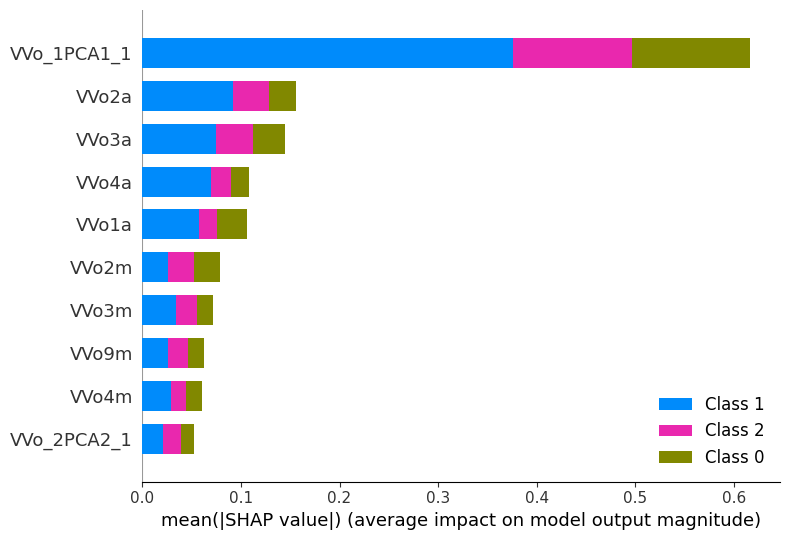

In [ ]:
import shap

explainer = shap.Explainer(model)
shap_values = explainer(X_val)

shap.summary_plot(shap_values, X_val)


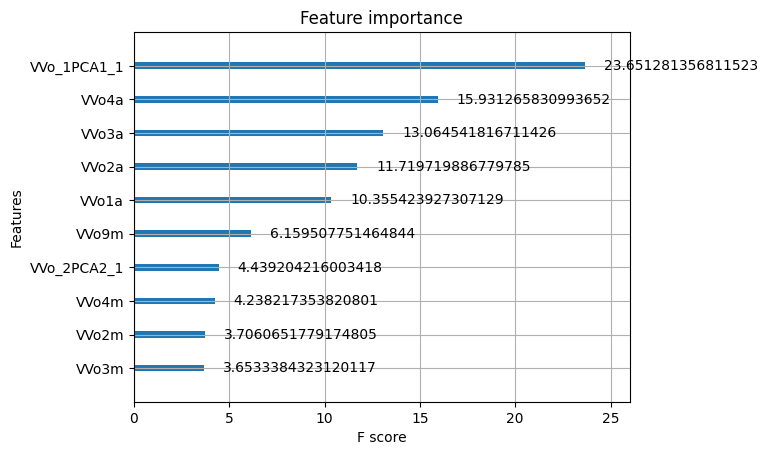

In [ ]:
import matplotlib.pyplot as plt
xgb.plot_importance(model, importance_type='gain')  # gain, weight, cover
plt.show()


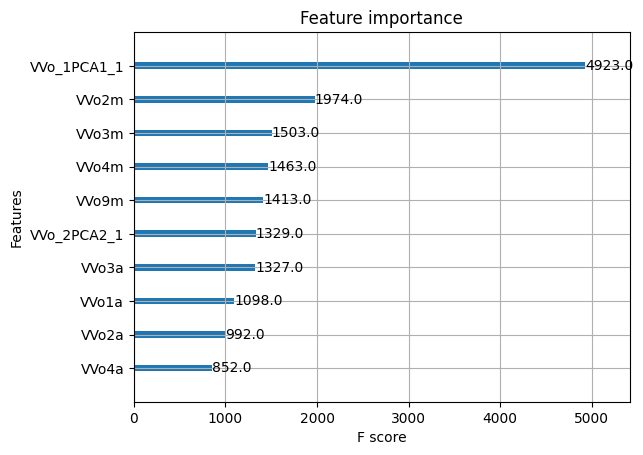

In [ ]:
import matplotlib.pyplot as plt
xgb.plot_importance(model, importance_type='weight')
plt.show()


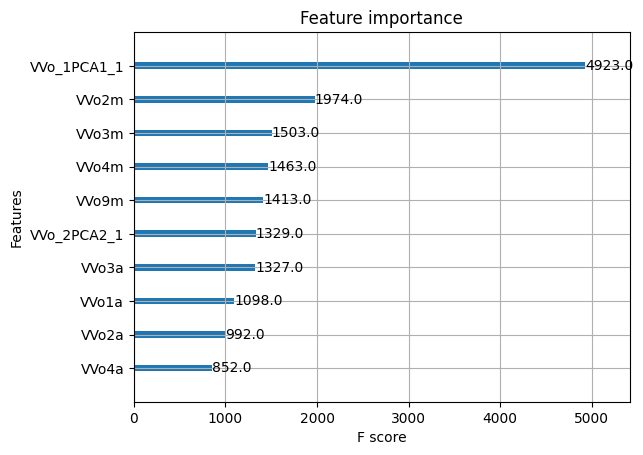

In [ ]:
import matplotlib.pyplot as plt
xgb.plot_importance(model, importance_type='weight')
plt.show()

**RESUMEN**

B1

In [ ]:
# ['VVo_1PCA1_1', "VVo2m", "VVo3m", "VVo4m", "VVo9m", "VVo1a", "VVo3a"]
#Los PCA son con: ["VVo10", "VVo15", "VVo30", "VVo1h", "VVo2h", "VVo4h", "VVo6h"]

# 📊 MATRIZ DE CONFUSIÓN (VALIDATION):
# [[14167 12248 12295]
#  [ 8341 24323  6925]
#  [14120 12252 11911]]
# 📄 REPORT (VALIDATION):
#               precision    recall  f1-score   support

#            0       0.39      0.37      0.38     38710
#            1       0.50      0.61      0.55     39589
#            2       0.38      0.31      0.34     38283

#     accuracy                           0.43    116582
#    macro avg       0.42      0.43      0.42    116582
# weighted avg       0.42      0.43      0.42    116582

# 📊 MATRIZ DE CONFUSIÓN (TEST):
# [[ 7076  6153  6126]
#  [ 4271 12182  3342]
#  [ 7070  6092  5980]]
# 📄 REPORT (TEST):
#               precision    recall  f1-score   support

#            0       0.38      0.37      0.37     19355
#            1       0.50      0.62      0.55     19795
#            2       0.39      0.31      0.35     19142

#     accuracy                           0.43     58292
#    macro avg       0.42      0.43      0.42     58292
# weighted avg       0.42      0.43      0.43     58292

B2

In [ ]:
# "VVo_2PCA2_1", "VVo9m", "VVo1a", "VVo2a", "VVo3a", "VVo4a"
# "VVo_2PCA2_1", "VVo9m", "VVo1a", "VVo2a", "VVo3a", "VVo4a"
# PCA armados con: ['VB1m', 'VB2m', 'VB3m', 'VB4m', 'VB5m', 'VB6m', 'VB9m']

# 📊 MATRIZ DE CONFUSIÓN (VALIDATION):
# [[17313  5301 13090]
#  [ 9663  8775  7030]
#  [16623  5237 13390]]
# 📄 REPORT (VALIDATION):
#               precision    recall  f1-score   support

#            0       0.40      0.48      0.44     35704
#            1       0.45      0.34      0.39     25468
#            2       0.40      0.38      0.39     35250

#     accuracy                           0.41     96422
#    macro avg       0.42      0.40      0.41     96422
# weighted avg       0.41      0.41      0.41     96422

# 📊 MATRIZ DE CONFUSIÓN (TEST):
# [[8629 2698 6525]
#  [4808 4418 3508]
#  [8351 2587 6688]]
# 📄 REPORT (TEST):
#               precision    recall  f1-score   support

#            0       0.40      0.48      0.44     17852
#            1       0.46      0.35      0.39     12734
#            2       0.40      0.38      0.39     17626

#     accuracy                           0.41     48212
#    macro avg       0.42      0.40      0.41     48212
# weighted avg       0.41      0.41      0.41     48212

B3

In [ ]:
# ""VVo_3PCA_1", "VVo_3PCA_2", "VVo9m", "VVo1a", "VVo2a", "VVo3a"

#LOS PCA ENTORPECIAN EL MODELO. MODELO SIN PCAs:

# 📊 MATRIZ DE CONFUSIÓN (VALIDATION):
# [[27744  2974 15350]
#  [13073  4898  7353]
#  [26247  2983 15960]]
# 📄 REPORT (VALIDATION):
#               precision    recall  f1-score   support

#            0       0.41      0.60      0.49     46068
#            1       0.45      0.19      0.27     25324
#            2       0.41      0.35      0.38     45190

#     accuracy                           0.42    116582
#    macro avg       0.43      0.38      0.38    116582
# weighted avg       0.42      0.42      0.40    116582

# 📊 MATRIZ DE CONFUSIÓN (TEST):
# [[13884  1506  7644]
#  [ 6574  2350  3738]
#  [13170  1441  7985]]
# 📄 REPORT (TEST):
#               precision    recall  f1-score   support

#            0       0.41      0.60      0.49     23034
#            1       0.44      0.19      0.26     12662
#            2       0.41      0.35      0.38     22596

#     accuracy                           0.42     58292
#    macro avg       0.42      0.38      0.38     58292
# weighted avg       0.42      0.42      0.40     58292

Por si sola la volatilidad pierde mucho poder predictivo en BTC, a 5 minutos, marca muy bien la tendencia, pero en 15 ya es casi 100% dummy, esto es llamativo
porque en todos los analisis se extrae de manera cauteloza las variables más influyentes de este universo, para su respectivo B (B, B1 y B2)

# "Superfeature" MCP3

In [ ]:
# Supuestos:
# VB2a, VVo6m son los más informativos estructuralmente
# MOM3 = momentum de 3 pasos (últimos 15 min)
# B1, B2 son clases (0 = sube, 1 = neutro, 2 = baja)

mf1["B1_adj"] = mf1["B1"].replace({0: 1, 1: 0, 2: -1})
mf1["B2_adj"] = mf1["B2"].replace({0: 1, 1: 0, 2: -1})

# MOM3: momentum simple (puede mejorarse)
mf1["MOM3"] = mf1["Close"] - mf1["Close"].shift(3)

# Normalización robusta (con rolling mediana por estabilidad)
mf1["VB_norm"] = mf1["VB2a"] / mf1["VB2a"].rolling(2016).median()
mf1["VVo_norm"] = mf1["VVo6m"] / mf1["VVo6m"].rolling(2016).median()
mf1["MOM3_norm"] = mf1["MOM3"] / mf1["Close"].shift(3)

# Superfeature: Índice de Presión Acumulada (IPA)
mf1["IPA"] = (
    mf1["VB_norm"] *
    mf1["VVo_norm"] *
    (1 + mf1["B1_adj"]*0.5 + mf1["B2_adj"]*0.3) *
    np.sign(mf1["MOM3_norm"])
)


#VoC

In [ ]:
# Crear VoC dinámicamente a partir de las VVo existentes
for nombre in ventanas_vol.keys():
    vvo_col = f"VVo{nombre}"
    voc_col = f"VoC{nombre}"

    if vvo_col in mf1.columns:
        mf1[voc_col] = np.sqrt(mf1["Close"]* mf1[vvo_col])

/tmp/ipython-input-44-1358318608.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1[voc_col] = np.sqrt(mf1["Close"]* mf1[vvo_col])
/tmp/ipython-input-44-1358318608.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1[voc_col] = np.sqrt(mf1["Close"]* mf1[vvo_col])
/tmp/ipython-input-44-1358318608.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get

**MCP1**

In [ ]:
print(mf1.columns.tolist())

['Datetime', 'High', 'Low', 'Close', 'Volume', 'B1', 'B2', 'B3', 'Closet', 'Volumet', 'Hight', 'cp2', 'SD_1', 'VB5', 'SD_2', 'VB10', 'SD_3', 'VB15', 'SD_6', 'VB30', 'SD_12', 'VB1h', 'SD_24', 'VB2h', 'SD_48', 'VB4h', 'SD_72', 'VB6h', 'SD_144', 'VB12h', 'SD_288', 'VB1d', 'SD_864', 'VB3d', 'SD_1152', 'VB4d', 'SD_1440', 'VB5d', 'SD_2016', 'VB1s', 'SD_4032', 'VB2s', 'SD_8064', 'VB1m', 'SD_16128', 'VB2m', 'SD_24192', 'VB3m', 'SD_32256', 'VB4m', 'SD_40320', 'VB5m', 'SD_48384', 'VB6m', 'SD_72576', 'VB9m', 'SD_100800', 'VB1a', 'SD_201600', 'VB2a', 'SD_302400', 'VB3a', 'SD_403200', 'VB4a', 'VB_1PCA_1', 'VB_1PCA_2', 'VB_1PCA_3', 'VB_1PCA_4', 'VoSD_1', 'VVo5', 'VoSD_2', 'VVo10', 'VoSD_3', 'VVo15', 'VoSD_6', 'VVo30', 'VoSD_12', 'VVo1h', 'VoSD_24', 'VVo2h', 'VoSD_48', 'VVo4h', 'VoSD_72', 'VVo6h', 'VoSD_144', 'VVo12h', 'VoSD_288', 'VVo1d', 'VoSD_864', 'VVo3d', 'VoSD_1152', 'VVo4d', 'VoSD_1440', 'VVo5d', 'VoSD_2016', 'VVo1s', 'VoSD_4032', 'VVo2s', 'VoSD_8064', 'VVo1m', 'VoSD_16128', 'VVo2m', 'VoSD_241

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ["VoC10", "VoC15", "VoC30", "VoC1h", "VoC2h", "VoC4h", "VoC6h", "VoC8h", "VoC12h",
 "VoC1d", "VoC3d", "VoC5d", "VoC1s", "VoC2s", "VoC1m", "VoC2m", "VoC3m",
 "VoC4m", "VoC5m", "VoC6m", "VoC9m", "VoC1a", "VoC2a", "VoC3a"]
# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B1'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)


   Variable  Mutual Information
22    VoC2a            0.026926
23    VoC3a            0.025765
21    VoC1a            0.025533
20    VoC9m            0.022521
17    VoC4m            0.021749
16    VoC3m            0.021643
18    VoC5m            0.021129
15    VoC2m            0.020488
19    VoC6m            0.020178
12    VoC1s            0.019702
14    VoC1m            0.019566
4     VoC2h            0.018831
13    VoC2s            0.018313
11    VoC5d            0.017576
2     VoC30            0.016113
3     VoC1h            0.016085
5     VoC4h            0.015838
6     VoC6h            0.015785
10    VoC3d            0.015772
7     VoC8h            0.014080
9     VoC1d            0.013512
8    VoC12h            0.013330
1     VoC15            0.012077
0     VoC10            0.009627


In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ["VVo10", "VVo15", "VVo30", "VVo1h", "VVo2h", "VVo4h", "VVo6h"]
# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=4)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
for i in range(4):
    mf1.loc[subset.index, f'VVo_1PCA1_{i+1}'] = principal_component[:, i]

/tmp/ipython-input-142-2435484383.py:23: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VVo_1PCA1_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-142-2435484383.py:23: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VVo_1PCA1_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-142-2435484383.py:23: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ["VVo2m", "VVo3m", "VVo4m", "VVo5m", "VVo6m", "VVo9m", "VVo1a", "VVo2a", "VVo3a", "VVo4a"]
# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=4)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
for i in range(4):
    mf1.loc[subset.index, f'VVo_1PCA2_{i+1}'] = principal_component[:, i]

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ['VVo_1PCA1_1', 'VVo_1PCA1_2', 'VVo_1PCA1_3', 'VVo_1PCA1_4', 'VVo_1PCA2_1', 'VVo_1PCA2_2', 'VVo_1PCA2_3', 'VVo_1PCA2_4']
# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B1'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)


      Variable  Mutual Information
0  VVo_1PCA1_1            0.038702
4  VVo_1PCA2_1            0.032777
6  VVo_1PCA2_3            0.031016
5  VVo_1PCA2_2            0.029182
7  VVo_1PCA2_4            0.028489
1  VVo_1PCA1_2            0.021480
2  VVo_1PCA1_3            0.019130
3  VVo_1PCA1_4            0.018415


In [ ]:
# variables = ["VVo10", "VVo15", "VVo30", "VVo1h", "VVo2h", "VVo4h", "VVo6h"]
# loadings = pd.Series(pca.components_[0], index=variables)

# print("Cargas del primer componente:")
# print(loadings.sort_values(ascending=False))

# print("\nVarianza explicada por el primer componente:")
# print(pca.explained_variance_ratio_[0])


Cargas del primer componente:
VB1h     0.378367
VB30     0.377974
VB2h     0.369040
VB15     0.367628
VB10     0.346867
VB4h     0.329978
VB6h     0.295419
VB12h    0.268562
VB1d     0.232450
dtype: float64

Varianza explicada por el primer componente:
0.5985023096380601


In [ ]:
# variables = ["VVo2m", "VVo3m", "VVo4m", "VVo5m", "VVo6m", "VVo9m", "VVo1a", "VVo2a", "VVo3a", "VVo4a"]
# loadings = pd.Series(pca.components_[0], index=variables)

# print("Cargas del primer componente:")
# print(loadings.sort_values(ascending=False))

# print("\nVarianza explicada por el primer componente:")
# print(pca.explained_variance_ratio_[0])


In [ ]:
# Completito:
#['VVo_1PCA1_1', "VVo2m", "VVo3m", "VVo4m", "VVo9m", "VVo1a", "VVo3a"]
#Optimo:
# ['VB10', "VB15" 'VB_PCA_2', 'VB_PCA_3']

**MCP2**

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ["VoC10", "VoC15", "VoC30", "VoC1h", "VoC2h", "VoC4h", "VoC6h", "VoC8h", "VoC12h",
 "VoC1d", "VoC3d", "VoC5d", "VoC1s", "VoC2s", "VoC1m", "VoC2m", "VoC3m",
 "VoC4m", "VoC5m", "VoC6m", "VoC9m", "VoC1a", "VoC2a", "VoC3a"]

# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B2'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)

   Variable  Mutual Information
21    VoC1a            0.022042
22    VoC2a            0.020707
23    VoC3a            0.019356
15    VoC2m            0.019217
17    VoC4m            0.019058
13    VoC2s            0.019002
19    VoC6m            0.018932
20    VoC9m            0.018926
16    VoC3m            0.018739
18    VoC5m            0.018513
12    VoC1s            0.017301
14    VoC1m            0.016468
4     VoC2h            0.014978
11    VoC5d            0.014703
6     VoC6h            0.013348
5     VoC4h            0.013140
10    VoC3d            0.012458
3     VoC1h            0.012216
9     VoC1d            0.011303
7     VoC8h            0.011289
8    VoC12h            0.011105
2     VoC30            0.010874
1     VoC15            0.009007
0     VoC10            0.006942


In [ ]:
# "VVo9m", "VVo1a", "VVo2a", "VVo3a", "VVo4a"
# + PCA 5<=VBs<=2m +  PCA 2m<VBs<=6m

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ["VVo10", "VVo15", "VVo30", "VVo1h", "VVo2h", "VVo4h", "VVo6h", "VVo12h", "VVo1d",
 "VVo3d", "VVo4d", "VVo5d", "VVo1s", "VVo2s", "VVo1m", "VVo2m"]

# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=4)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
for i in range(4):
    mf1.loc[subset.index, f'VVo_2PCA1_{i+1}'] = principal_component[:, i]

/tmp/ipython-input-152-1147587152.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VVo_2PCA1_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-152-1147587152.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VVo_2PCA1_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-152-1147587152.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ["VVo3m", "VVo4m", "VVo5m","VVo6m"]

# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=4)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
for i in range(4):
    mf1.loc[subset.index, f'VVo_2PCA2_{i+1}'] = principal_component[:, i]

/tmp/ipython-input-153-4110807015.py:24: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VVo_2PCA2_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-153-4110807015.py:24: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VVo_2PCA2_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-153-4110807015.py:24: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

In [ ]:
print(mf1.columns.tolist())

['Datetime', 'High', 'Low', 'Close', 'Volume', 'ETH_Close', 'ETH_Volume', 'USDT_Close', 'USDT_Volume', 'XRP_Close', 'XRP_Volume', 'SOL_Close', 'SOL_Volume', 'DOGE_Close', 'DOGE_Volume', 'VoM', 'DominanciaBTC', 'MC', 'MCM', 'DominanciaMBTC', 'cp2', 'vp2', 'B', 'B1', 'SD_1', 'VB5', 'SD_2', 'VB10', 'SD_3', 'VB15', 'SD_6', 'VB30', 'SD_12', 'VB1h', 'SD_24', 'VB2h', 'SD_48', 'VB4h', 'SD_72', 'VB6h', 'SD_144', 'VB12h', 'SD_288', 'VB1d', 'SD_864', 'VB3d', 'SD_1152', 'VB4d', 'SD_1440', 'VB5d', 'SD_2016', 'VB1s', 'SD_4032', 'VB2s', 'SD_8064', 'VB1m', 'SD_16128', 'VB2m', 'SD_24192', 'VB3m', 'SD_32256', 'VB4m', 'SD_40320', 'VB5m', 'SD_48384', 'VB6m', 'SD_72576', 'VB9m', 'SD_100800', 'VB1a', 'SD_201600', 'VB2a', 'SD_302400', 'VB3a', 'VB_PCA_1', 'VB_PCA_2', 'VB_PCA_3', 'VB_PCA_4', 'QBpc', 'QSD_1', 'VQ5', 'QSD_2', 'VQ10', 'QSD_3', 'VQ15', 'QSD_6', 'VQ30', 'QSD_12', 'VQ1h', 'QSD_24', 'VQ2h', 'QSD_48', 'VQ4h', 'QSD_72', 'VQ6h', 'QSD_144', 'VQ12h', 'QSD_288', 'VQ1d', 'QSD_864', 'VQ3d', 'QSD_1152', 'VQ4d

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ["VB2a", 'VB3a', 'VB_1PCA_1', 'VVo_2PCA1_1', 'VVo_2PCA1_2',
            'VVo_2PCA1_3', 'VVo_2PCA1_4', 'VVo_2PCA2_1', 'VVo_2PCA2_2',
            'VVo_2PCA2_3', 'VVo_2PCA2_4']
# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B2'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)


       Variable  Mutual Information
0          VB2a            0.060506
11  VVo_2PCA2_1            0.060249
1          VB3a            0.059364
12  VVo_2PCA2_2            0.038896
13  VVo_2PCA2_3            0.028285
14  VVo_2PCA2_4            0.023614
7   VVo_2PCA1_1            0.021293
3    VVo_2PCA_1            0.021260
2     VB_1PCA_1            0.021239
8   VVo_2PCA1_2            0.013714
4    VVo_2PCA_2            0.013570
9   VVo_2PCA1_3            0.011014
5    VVo_2PCA_3            0.010856
10  VVo_2PCA1_4            0.007431
6    VVo_2PCA_4            0.007328


In [ ]:
# variables = ['VB3m', 'VB4m', 'VB5m', 'VB6m', 'VB9m', 'VB1a', 'VB2a', "VB3a"]
# loadings = pd.Series(pca.components_[1], index=variables)

# print("Cargas del x componente:")
# print(loadings.sort_values(ascending=False))

# print("\nVarianza explicada por el x componente:")
# print(pca.explained_variance_ratio_[1])


Cargas del x componente:
VB3a    0.578321
VB2a    0.494974
VB1a    0.211773
VB9m    0.041496
VB6m   -0.198352
VB5m   -0.292615
VB3m   -0.348815
VB4m   -0.356842
dtype: float64

Varianza explicada por el x componente:
0.14030230034736205


In [ ]:
# "VVo_2PCA2_1", "VVo9m", "VVo1a", "VVo2a", "VVo3a", "VVo4a"

**MCP3**

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ["VoC10", "VoC15", "VoC30", "VoC1h", "VoC2h", "VoC4h", "VoC6h", "VoC8h", "VoC12h",
 "VoC1d", "VoC3d", "VoC5d", "VoC1s", "VoC2s", "VoC1m", "VoC2m", "VoC3m",
 "VoC4m", "VoC5m", "VoC6m", "VoC9m", "VoC1a", "VoC2a", "VoC3a"]

# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B3'].fillna(2).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)

   Variable  Mutual Information
21    VoC1a            0.019995
22    VoC2a            0.018985
15    VoC2m            0.018294
16    VoC3m            0.018122
17    VoC4m            0.018006
23    VoC3a            0.017526
18    VoC5m            0.017428
19    VoC6m            0.017425
20    VoC9m            0.017338
13    VoC2s            0.017170
12    VoC1s            0.016806
14    VoC1m            0.016528
11    VoC5d            0.013971
10    VoC3d            0.013211
9     VoC1d            0.012082
6     VoC6h            0.011856
7     VoC8h            0.011808
4     VoC2h            0.011644
5     VoC4h            0.010991
8    VoC12h            0.010231
3     VoC1h            0.010053
2     VoC30            0.009310
1     VoC15            0.007302
0     VoC10            0.005368


In [ ]:
#  "VVo2a", "VVo3a"
# + PCA  ["VVo3m", "VVo4m", "VVo5m", "VVo6m", "VVo9m", "VVo1a"]

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ["VVo3m", "VVo4m", "VVo5m", "VVo6m", "VVo9m", "VVo1a"]

# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=4)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
for i in range(4):
    mf1.loc[subset.index, f'VVo_3PCA_{i+1}'] = principal_component[:, i]

/tmp/ipython-input-164-197435489.py:24: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VVo_3PCA_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-164-197435489.py:24: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VVo_3PCA_{i+1}'] = principal_component[:, i]


In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ['VB1m', 'VB2m', 'VB3m',
             'VB4m', 'VB5m', 'VB6m', 'VB9m']

# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=4)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
for i in range(4):
    mf1.loc[subset.index, f'VB_2PCA2_{i+1}'] = principal_component[:, i]

/tmp/ipython-input-124-2416292975.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VB_2PCA2_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-124-2416292975.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VB_2PCA2_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-124-2416292975.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at on

In [ ]:
print(mf1.columns.tolist())

['Datetime', 'High', 'Low', 'Close', 'Volume', 'ETH_Close', 'ETH_Volume', 'USDT_Close', 'USDT_Volume', 'XRP_Close', 'XRP_Volume', 'SOL_Close', 'SOL_Volume', 'DOGE_Close', 'DOGE_Volume', 'VoM', 'DominanciaBTC', 'MC', 'MCM', 'DominanciaMBTC', 'cp2', 'vp2', 'B', 'B1', 'SD_1', 'VB5', 'SD_2', 'VB10', 'SD_3', 'VB15', 'SD_6', 'VB30', 'SD_12', 'VB1h', 'SD_24', 'VB2h', 'SD_48', 'VB4h', 'SD_72', 'VB6h', 'SD_144', 'VB12h', 'SD_288', 'VB1d', 'SD_864', 'VB3d', 'SD_1152', 'VB4d', 'SD_1440', 'VB5d', 'SD_2016', 'VB1s', 'SD_4032', 'VB2s', 'SD_8064', 'VB1m', 'SD_16128', 'VB2m', 'SD_24192', 'VB3m', 'SD_32256', 'VB4m', 'SD_40320', 'VB5m', 'SD_48384', 'VB6m', 'SD_72576', 'VB9m', 'SD_100800', 'VB1a', 'SD_201600', 'VB2a', 'SD_302400', 'VB3a', 'VB_PCA_1', 'VB_PCA_2', 'VB_PCA_3', 'VB_PCA_4', 'QBpc', 'QSD_1', 'VQ5', 'QSD_2', 'VQ10', 'QSD_3', 'VQ15', 'QSD_6', 'VQ30', 'QSD_12', 'VQ1h', 'QSD_24', 'VQ2h', 'QSD_48', 'VQ4h', 'QSD_72', 'VQ6h', 'QSD_144', 'VQ12h', 'QSD_288', 'VQ1d', 'QSD_864', 'VQ3d', 'QSD_1152', 'VQ4d

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ["VVo9m", "VVo1a", 'VVo_3PCA_1', 'VVo_3PCA_2', 'VVo_3PCA_3', 'VVo_3PCA_4']
# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B3'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)


     Variable  Mutual Information
0       VVo9m            0.084252
1       VVo1a            0.082679
2  VVo_3PCA_1            0.079326
3  VVo_3PCA_2            0.060717
4  VVo_3PCA_3            0.050663
5  VVo_3PCA_4            0.044476


In [ ]:
# variables = ['VB3m', 'VB4m', 'VB5m', 'VB6m', 'VB9m', 'VB1a', 'VB2a', "VB3a"]
# loadings = pd.Series(pca.components_[1], index=variables)

# print("Cargas del x componente:")
# print(loadings.sort_values(ascending=False))

# print("\nVarianza explicada por el x componente:")
# print(pca.explained_variance_ratio_[1])


Cargas del x componente:
VB3a    0.578321
VB2a    0.494974
VB1a    0.211773
VB9m    0.041496
VB6m   -0.198352
VB5m   -0.292615
VB3m   -0.348815
VB4m   -0.356842
dtype: float64

Varianza explicada por el x componente:
0.14030230034736205


In [ ]:
#  "VVo_3PCA_1", "VVo_3PCA_2", "VVo9m", "VVo1a", "VVo2a", "VVo3a"

**SHAP ZONE**

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import xgboost as xgb
import matplotlib.pyplot as plt
import numpy as np

# Variables explicativas y objetivo
features = list(set([
    "VVo9m", "VVo1a", "VVo2a", "VVo3a", "VVo4a",
    "VVo_2PCA2_1", "VVo_1PCA1_1", "VVo2m", "VVo3m", "VVo4m"
]))

target = "B3"

# Eliminar filas con NaN
df = mf1[features + [target]].dropna()
df[target] = df[target].astype(int)

# Definir X e y
X = df[features]
y = df[target]

# División: 70% train, 30% temp
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.30, stratify=y, random_state=42)

# División: 20% validation, 10% test (sobre el 30% restante)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=1/3, stratify=y_temp, random_state=42)


# Entrenar modelo multiclase
model = xgb.XGBClassifier(
    objective='multi:softmax',
    num_class=3,
    n_estimators=100,
    max_depth=6,
    learning_rate=0.1,
    use_label_encoder=False,
    eval_metric='mlogloss'
)

model.fit(X_train, y_train)

# --- Evaluación en validation ---
y_val_pred = model.predict(X_val)
print("📊 MATRIZ DE CONFUSIÓN (VALIDATION):")
print(confusion_matrix(y_val, y_val_pred))
print("📄 REPORT (VALIDATION):")
print(classification_report(y_val, y_val_pred))

# --- Evaluación en test ---
y_test_pred = model.predict(X_test)
print("📊 MATRIZ DE CONFUSIÓN (TEST):")
print(confusion_matrix(y_test, y_test_pred))
print("📄 REPORT (TEST):")
print(classification_report(y_test, y_test_pred))


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:38:56] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


📊 MATRIZ DE CONFUSIÓN (VALIDATION):
[[21377  4075 12369]
 [ 8796  7111  5498]
 [19888  3899 13409]]
📄 REPORT (VALIDATION):
              precision    recall  f1-score   support

           0       0.43      0.57      0.49     37821
           1       0.47      0.33      0.39     21405
           2       0.43      0.36      0.39     37196

    accuracy                           0.43     96422
   macro avg       0.44      0.42      0.42     96422
weighted avg       0.44      0.43      0.43     96422

📊 MATRIZ DE CONFUSIÓN (TEST):
[[10800  1942  6169]
 [ 4531  3520  2651]
 [ 9969  1960  6670]]
📄 REPORT (TEST):
              precision    recall  f1-score   support

           0       0.43      0.57      0.49     18911
           1       0.47      0.33      0.39     10702
           2       0.43      0.36      0.39     18599

    accuracy                           0.44     48212
   macro avg       0.44      0.42      0.42     48212
weighted avg       0.44      0.44      0.43     48212



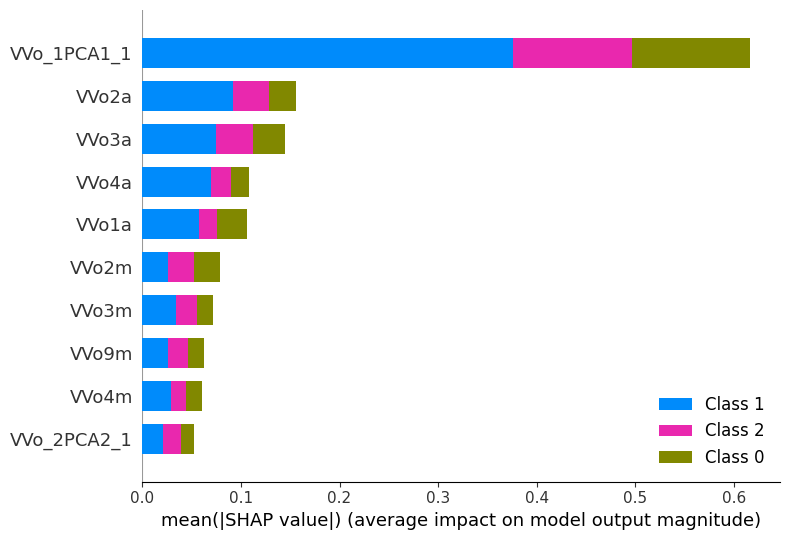

In [ ]:
import shap

explainer = shap.Explainer(model)
shap_values = explainer(X_val)

shap.summary_plot(shap_values, X_val)


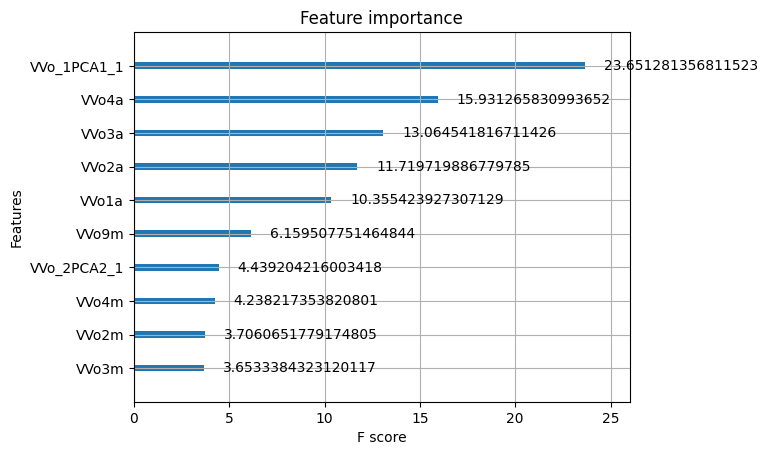

In [ ]:
import matplotlib.pyplot as plt
xgb.plot_importance(model, importance_type='gain')  # gain, weight, cover
plt.show()


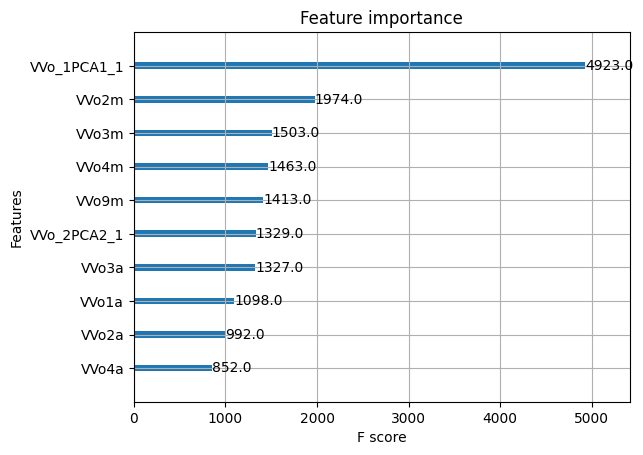

In [ ]:
import matplotlib.pyplot as plt
xgb.plot_importance(model, importance_type='weight')
plt.show()


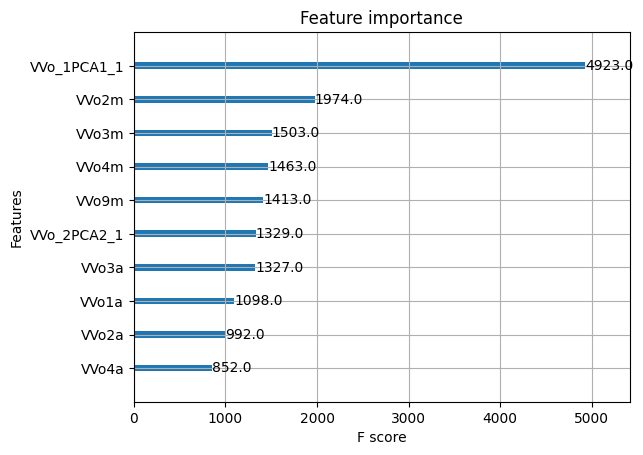

In [ ]:
import matplotlib.pyplot as plt
xgb.plot_importance(model, importance_type='weight')
plt.show()

**RESUMEN**

B1

In [ ]:
# ['VVo_1PCA1_1', "VVo2m", "VVo3m", "VVo4m", "VVo9m", "VVo1a", "VVo3a"]
#Los PCA son con: ["VVo10", "VVo15", "VVo30", "VVo1h", "VVo2h", "VVo4h", "VVo6h"]

# 📊 MATRIZ DE CONFUSIÓN (VALIDATION):
# [[14167 12248 12295]
#  [ 8341 24323  6925]
#  [14120 12252 11911]]
# 📄 REPORT (VALIDATION):
#               precision    recall  f1-score   support

#            0       0.39      0.37      0.38     38710
#            1       0.50      0.61      0.55     39589
#            2       0.38      0.31      0.34     38283

#     accuracy                           0.43    116582
#    macro avg       0.42      0.43      0.42    116582
# weighted avg       0.42      0.43      0.42    116582

# 📊 MATRIZ DE CONFUSIÓN (TEST):
# [[ 7076  6153  6126]
#  [ 4271 12182  3342]
#  [ 7070  6092  5980]]
# 📄 REPORT (TEST):
#               precision    recall  f1-score   support

#            0       0.38      0.37      0.37     19355
#            1       0.50      0.62      0.55     19795
#            2       0.39      0.31      0.35     19142

#     accuracy                           0.43     58292
#    macro avg       0.42      0.43      0.42     58292
# weighted avg       0.42      0.43      0.43     58292

B2

In [ ]:
# "VVo_2PCA2_1", "VVo9m", "VVo1a", "VVo2a", "VVo3a", "VVo4a"
# "VVo_2PCA2_1", "VVo9m", "VVo1a", "VVo2a", "VVo3a", "VVo4a"
# PCA armados con: ['VB1m', 'VB2m', 'VB3m', 'VB4m', 'VB5m', 'VB6m', 'VB9m']

# 📊 MATRIZ DE CONFUSIÓN (VALIDATION):
# [[17313  5301 13090]
#  [ 9663  8775  7030]
#  [16623  5237 13390]]
# 📄 REPORT (VALIDATION):
#               precision    recall  f1-score   support

#            0       0.40      0.48      0.44     35704
#            1       0.45      0.34      0.39     25468
#            2       0.40      0.38      0.39     35250

#     accuracy                           0.41     96422
#    macro avg       0.42      0.40      0.41     96422
# weighted avg       0.41      0.41      0.41     96422

# 📊 MATRIZ DE CONFUSIÓN (TEST):
# [[8629 2698 6525]
#  [4808 4418 3508]
#  [8351 2587 6688]]
# 📄 REPORT (TEST):
#               precision    recall  f1-score   support

#            0       0.40      0.48      0.44     17852
#            1       0.46      0.35      0.39     12734
#            2       0.40      0.38      0.39     17626

#     accuracy                           0.41     48212
#    macro avg       0.42      0.40      0.41     48212
# weighted avg       0.41      0.41      0.41     48212

B3

In [ ]:
# ""VVo_3PCA_1", "VVo_3PCA_2", "VVo9m", "VVo1a", "VVo2a", "VVo3a"

#LOS PCA ENTORPECIAN EL MODELO. MODELO SIN PCAs:

# 📊 MATRIZ DE CONFUSIÓN (VALIDATION):
# [[27744  2974 15350]
#  [13073  4898  7353]
#  [26247  2983 15960]]
# 📄 REPORT (VALIDATION):
#               precision    recall  f1-score   support

#            0       0.41      0.60      0.49     46068
#            1       0.45      0.19      0.27     25324
#            2       0.41      0.35      0.38     45190

#     accuracy                           0.42    116582
#    macro avg       0.43      0.38      0.38    116582
# weighted avg       0.42      0.42      0.40    116582

# 📊 MATRIZ DE CONFUSIÓN (TEST):
# [[13884  1506  7644]
#  [ 6574  2350  3738]
#  [13170  1441  7985]]
# 📄 REPORT (TEST):
#               precision    recall  f1-score   support

#            0       0.41      0.60      0.49     23034
#            1       0.44      0.19      0.26     12662
#            2       0.41      0.35      0.38     22596

#     accuracy                           0.42     58292
#    macro avg       0.42      0.38      0.38     58292
# weighted avg       0.42      0.42      0.40     58292

Por si sola la volatilidad pierde mucho poder predictivo en BTC, a 5 minutos, marca muy bien la tendencia, pero en 15 ya es casi 100% dummy, esto es llamativo
porque en todos los analisis se extrae de manera cauteloza las variables más influyentes de este universo, para su respectivo B (B, B1 y B2)

#MOMVo1

In [ ]:
# Diccionario de ventanas
ventanas_vol = {
    "5": 1, "10": 2, "15": 3, "30": 6, "1h": 12, "2h": 24, "4h": 48, "6h": 72, "8h": 96,
    "12h": 144, "1d": 288, "3d": 864, "4d": 1152, "5d": 1440, "1s": 2016, "2s": 4032,
    "1m": 8064, "2m": 16128, "3m": 24192, "4m": 32256, "5m": 40320, "6m": 48384,
    "9m": 72576, "1a": 100800, "2a": 201600, "3a": 302400
}

# Calcular MOM% para cada ventana
for label, n in ventanas_vol.items():
    close_tn = mf1["Volumet"].shift(n)
    mom = ((mf1["Volumet"] - close_tn) / close_tn)
    mf1[f"MOM_{label}"] = mom


In [ ]:
print(mf1.columns.tolist())

['Datetime', 'High', 'Low', 'Close', 'Volume', 'ETH_Close', 'ETH_Volume', 'USDT_Close', 'USDT_Volume', 'XRP_Close', 'XRP_Volume', 'SOL_Close', 'SOL_Volume', 'DOGE_Close', 'DOGE_Volume', 'VoM', 'DominanciaBTC', 'MC', 'MCM', 'DominanciaMBTC', 'cp2', 'vp2', 'SD_1', 'VB5', 'SD_2', 'VB10', 'SD_3', 'VB15', 'SD_6', 'VB30', 'SD_12', 'VB1h', 'SD_24', 'VB2h', 'SD_48', 'VB4h', 'SD_72', 'VB6h', 'SD_144', 'VB12h', 'SD_288', 'VB1d', 'SD_864', 'VB3d', 'SD_1152', 'VB4d', 'SD_1440', 'VB5d', 'SD_2016', 'VB1s', 'SD_4032', 'VB2s', 'SD_8064', 'VB1m', 'SD_16128', 'VB2m', 'SD_24192', 'VB3m', 'SD_32256', 'VB4m', 'SD_40320', 'VB5m', 'SD_48384', 'VB6m', 'SD_72576', 'VB9m', 'SD_100800', 'VB1a', 'SD_201600', 'VB2a', 'SD_302400', 'VB3a', 'VB_PCA_1', 'VB_PCA_2', 'VB_PCA_3', 'VB_PCA_4', 'B', 'B1', 'QBpc', 'QSD_1', 'VQ5', 'QSD_2', 'VQ10', 'QSD_3', 'VQ15', 'QSD_6', 'VQ30', 'QSD_12', 'VQ1h', 'QSD_24', 'VQ2h', 'QSD_48', 'VQ4h', 'QSD_72', 'VQ6h', 'QSD_144', 'VQ12h', 'QSD_288', 'VQ1d', 'QSD_864', 'VQ3d', 'QSD_1152', 'VQ4d

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ['MOM_10', 'MOM_15', 'MOM_30', 'MOM_1h', 'MOM_2h', 'MOM_4h', 'MOM_6h', 'MOM_8h',
             'MOM_12h', 'MOM_1d', 'MOM_3d', 'MOM_4d', 'MOM_5d', 'MOM_1s', 'MOM_2s',
             'MOM_1m', 'MOM_2m', 'MOM_3m', 'MOM_4m', 'MOM_5m', 'MOM_6m', 'MOM_9m', 'MOM_1a', 'MOM_2a', 'MOM_3a']


# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B1'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)


   Variable  Mutual Information
24   MOM_3a            0.020806
22   MOM_1a            0.019131
23   MOM_2a            0.017176
21   MOM_9m            0.014460
20   MOM_6m            0.012555
19   MOM_5m            0.010530
18   MOM_4m            0.010382
17   MOM_3m            0.009052
16   MOM_2m            0.008543
14   MOM_2s            0.007248
15   MOM_1m            0.006834
12   MOM_5d            0.005862
8   MOM_12h            0.005631
11   MOM_4d            0.005570
10   MOM_3d            0.005494
13   MOM_1s            0.004275
6    MOM_6h            0.003691
9    MOM_1d            0.003681
7    MOM_8h            0.003565
5    MOM_4h            0.002752
1    MOM_15            0.001811
4    MOM_2h            0.001694
3    MOM_1h            0.001392
2    MOM_30            0.001352
0    MOM_10            0.000000


In [ ]:
# "MOM_10"

**RSIV_PCA1**

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ['MOM_15', 'MOM_30', 'MOM_1h']
# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=2)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
for i in range(2):
    mf1.loc[subset.index, f'MOMVo_PCA_{i+1}'] = principal_component[:, i]

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ['MOM_15', 'MOM_30', 'MOM_1h', 'MOMVo_PCA_1', 'MOMVo_PCA_2']
# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)


      Variable  Mutual Information
0       MOM_15            0.186128
1       MOM_30            0.146330
2       MOM_1h            0.127345
3  MOMVo_PCA_1            0.109932
4  MOMVo_PCA_2            0.088758


In [ ]:
variables = ['MOM_15', 'MOM_30', 'MOM_1h']
loadings = pd.Series(pca.components_[0], index=variables)

print("Cargas del primer componente:")
print(loadings.sort_values(ascending=False))

print("\nVarianza explicada por el primer componente:")
print(pca.explained_variance_ratio_[0])


Cargas del primer componente:
RSIV_4h     0.501526
RSIV_6h     0.480623
RSIV_2h     0.454409
RSIV_12h    0.366260
RSIV_1h     0.357761
RSIV_30     0.221011
dtype: float64

Varianza explicada por el primer componente:
0.4735541318259824


In [ ]:
# "MOM_10", 'MOM_15', 'MOM_30', 'MOM_1h'

SHAP

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import xgboost as xgb
import matplotlib.pyplot as plt
import numpy as np

# Variables explicativas y objetivo
features = ["MOM_10", 'MOM_15', 'MOM_30', 'MOM_1h']
target = "B"

# Eliminar filas con NaN
df = mf1[features + [target]].dropna()
df[target] = df[target].astype(int)

# Definir X e y
X = df[features]
y = df[target]

# División: 70% train, 30% temp
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.30, stratify=y, random_state=42)

# División: 20% validation, 10% test (sobre el 30% restante)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=1/3, stratify=y_temp, random_state=42)


# Entrenar modelo multiclase
model = xgb.XGBClassifier(
    objective='multi:softmax',
    num_class=3,
    n_estimators=100,
    max_depth=6,
    learning_rate=0.1,
    use_label_encoder=False,
    eval_metric='mlogloss'
)

model.fit(X_train, y_train)

# --- Evaluación en validation ---
y_val_pred = model.predict(X_val)
print("📊 MATRIZ DE CONFUSIÓN (VALIDATION):")
print(confusion_matrix(y_val, y_val_pred))
print("📄 REPORT (VALIDATION):")
print(classification_report(y_val, y_val_pred))

# --- Evaluación en test ---
y_test_pred = model.predict(X_test)
print("📊 MATRIZ DE CONFUSIÓN (TEST):")
print(confusion_matrix(y_test, y_test_pred))
print("📄 REPORT (TEST):")
print(classification_report(y_test, y_test_pred))


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:03:18] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


📊 MATRIZ DE CONFUSIÓN (VALIDATION):
[[23238  2177    18]
 [ 3196  6726     9]
 [ 3971   889    15]]
📄 REPORT (VALIDATION):
              precision    recall  f1-score   support

           0       0.76      0.91      0.83     25433
           1       0.69      0.68      0.68      9931
           2       0.36      0.00      0.01      4875

    accuracy                           0.75     40239
   macro avg       0.60      0.53      0.51     40239
weighted avg       0.70      0.75      0.70     40239

📊 MATRIZ DE CONFUSIÓN (TEST):
[[11660  1046    11]
 [ 1668  3294     3]
 [ 1963   462    13]]
📄 REPORT (TEST):
              precision    recall  f1-score   support

           0       0.76      0.92      0.83     12717
           1       0.69      0.66      0.67      4965
           2       0.48      0.01      0.01      2438

    accuracy                           0.74     20120
   macro avg       0.64      0.53      0.51     20120
weighted avg       0.71      0.74      0.69     20120



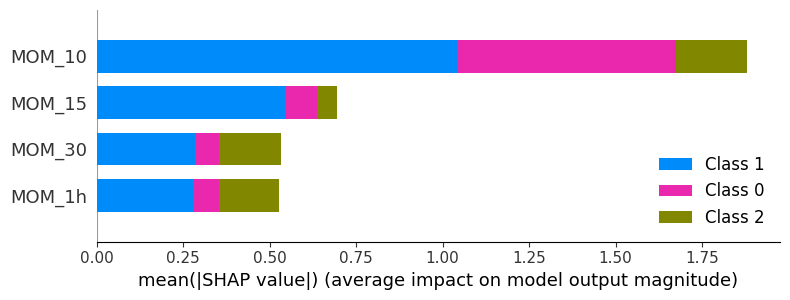

In [ ]:
import shap

explainer = shap.Explainer(model)
shap_values = explainer(X_val)

shap.summary_plot(shap_values, X_val)


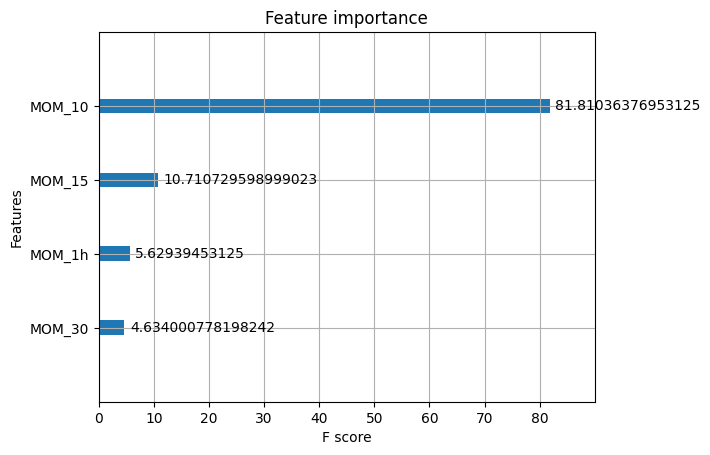

In [ ]:
import matplotlib.pyplot as plt
xgb.plot_importance(model, importance_type='gain')  # gain, weight, cover
plt.show()


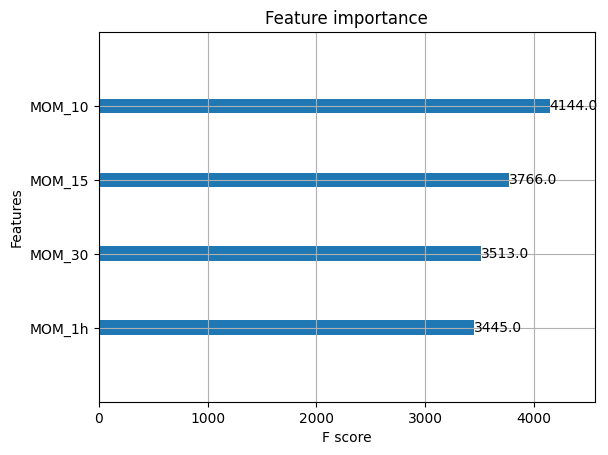

In [ ]:
import matplotlib.pyplot as plt
xgb.plot_importance(model, importance_type='weight')
plt.show()


In [ ]:
#Completito:
# "MOM_10", 'MOM_15', 'MOM_30', 'MOM_1h'
# Optimo:
# "MOM_10", 'MOM_15', 'MOM_1h'

# modelo fuerte en extremo superior, sobre todo en su recall es altimsimo
# probabable uso como modelo binario (varia o no?)
# ESTE ES SUPERIOR AL MOM CLASICO

# Cripto

In [ ]:
print(mf1.columns.tolist())

['Datetime', 'High', 'Low', 'Close', 'Volume', 'ETH_Close', 'ETH_Volume', 'USDT_Close', 'USDT_Volume', 'XRP_Close', 'XRP_Volume', 'SOL_Close', 'SOL_Volume', 'DOGE_Close', 'DOGE_Volume', 'VoM', 'DominanciaBTC', 'MC', 'MCM', 'DominanciaMBTC', 'cp2', 'vp2', 'B', 'B1', 'SD_1', 'VB5', 'SD_2', 'VB10', 'SD_3', 'VB15', 'SD_6', 'VB30', 'SD_12', 'VB1h', 'SD_24', 'VB2h', 'SD_48', 'VB4h', 'SD_72', 'VB6h', 'SD_144', 'VB12h', 'SD_288', 'VB1d', 'SD_864', 'VB3d', 'SD_1152', 'VB4d', 'SD_1440', 'VB5d', 'SD_2016', 'VB1s', 'SD_4032', 'VB2s', 'SD_8064', 'VB1m', 'SD_16128', 'VB2m', 'SD_24192', 'VB3m', 'SD_32256', 'VB4m', 'SD_40320', 'VB5m', 'SD_48384', 'VB6m', 'SD_72576', 'VB9m', 'SD_100800', 'VB1a', 'SD_201600', 'VB2a', 'SD_302400', 'VB3a', 'VB_PCA_1', 'VB_PCA_2', 'VB_PCA_3', 'VB_PCA_4', 'QBpc', 'QSD_1', 'VQ5', 'QSD_2', 'VQ10', 'QSD_3', 'VQ15', 'QSD_6', 'VQ30', 'QSD_12', 'VQ1h', 'QSD_24', 'VQ2h', 'QSD_48', 'VQ4h', 'QSD_72', 'VQ6h', 'QSD_144', 'VQ12h', 'QSD_288', 'VQ1d', 'QSD_864', 'VQ3d', 'QSD_1152', 'VQ4d

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ["Close", "Volume", "ETH_Close", "ETH_Volume", "USDT_Close", "USDT_Volume",
 "XRP_Close", "XRP_Volume", "SOL_Close", "SOL_Volume",
 "DOGE_Close", "DOGE_Volume", "VoM", "DominanciaBTC"]


# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B1'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)


         Variable  Mutual Information
1          Volume            0.037517
0           Close            0.036032
3      ETH_Volume            0.025894
10     DOGE_Close            0.025538
2       ETH_Close            0.023342
8       SOL_Close            0.022921
4      USDT_Close            0.020974
12            VoM            0.018808
6       XRP_Close            0.018067
9      SOL_Volume            0.017731
13  DominanciaBTC            0.015448
7      XRP_Volume            0.009822
5     USDT_Volume            0.008422
11    DOGE_Volume            0.006826


In [ ]:
# "MOM_10"

**RSIV_PCA1**

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = [ "ETH_Close", "ETH_Volume", "USDT_Close", "USDT_Volume",
 "XRP_Close", "XRP_Volume", "SOL_Close", "SOL_Volume",
 "DOGE_Close", "DOGE_Volume", "VoM", "DominanciaBTC"]
# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=4)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
for i in range(4):
    mf1.loc[subset.index, f'Cripto_PCA_{i+1}'] = principal_component[:, i]

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ['Cripto_PCA_1', 'Cripto_PCA_2', 'Cripto_PCA_3', 'Cripto_PCA_4',  "SOL_Close", "SOL_Volume"]
# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B1'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)


       Variable  Mutual Information
4     SOL_Close            0.023093
2  Cripto_PCA_3            0.019423
5    SOL_Volume            0.017451
1  Cripto_PCA_2            0.017261
0  Cripto_PCA_1            0.017169
3  Cripto_PCA_4            0.013250


In [ ]:
variables = ["Close", "Volume", "ETH_Close", "ETH_Volume", "USDT_Close", "USDT_Volume",
 "XRP_Close", "XRP_Volume", "SOL_Close", "SOL_Volume",
 "DOGE_Close", "DOGE_Volume", "VoM", "DominanciaBTC"]
loadings = pd.Series(pca.components_[0], index=variables)

print("Cargas del primer componente:")
print(loadings.sort_values(ascending=False))

print("\nVarianza explicada por el primer componente:")
print(pca.explained_variance_ratio_[0])


Cargas del primer componente:
Close            0.424738
SOL_Close        0.402841
DOGE_Close       0.379495
XRP_Close        0.359654
ETH_Close        0.348450
VoM              0.275254
XRP_Volume       0.239009
USDT_Volume      0.236189
DOGE_Volume      0.190735
ETH_Volume       0.050107
USDT_Close       0.046018
Volume           0.041846
SOL_Volume       0.037741
DominanciaBTC   -0.172261
dtype: float64

Varianza explicada por el primer componente:
0.29386797392047254


In [ ]:
variables = ["Close", "Volume", "ETH_Close", "ETH_Volume", "USDT_Close", "USDT_Volume",
 "XRP_Close", "XRP_Volume", "SOL_Close", "SOL_Volume",
 "DOGE_Close", "DOGE_Volume", "VoM", "DominanciaBTC"]
loadings = pd.Series(pca.components_[1], index=variables)

print("Cargas del segundo componente:")
print(loadings.sort_values(ascending=False))

print("\nVarianza explicada por el segundo componente:")
print(pca.explained_variance_ratio_[1])


Cargas del segundo componente:
Volume           0.443787
ETH_Volume       0.412447
VoM              0.394421
DOGE_Volume      0.371217
SOL_Volume       0.312205
XRP_Volume       0.240633
USDT_Volume      0.186912
DominanciaBTC    0.105668
USDT_Close       0.006530
DOGE_Close      -0.109913
XRP_Close       -0.148929
ETH_Close       -0.171352
Close           -0.181910
SOL_Close       -0.203314
dtype: float64

Varianza explicada por el segundo componente:
0.21862150317231904


In [ ]:
# "MOM_10", 'MOM_15', 'MOM_30', 'MOM_1h'

SHAP

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import xgboost as xgb
import matplotlib.pyplot as plt
import numpy as np

# Variables explicativas y objetivo
features = ["MOM_10", 'MOM_15', 'MOM_30', 'MOM_1h']
target = "B"

# Eliminar filas con NaN
df = mf1[features + [target]].dropna()
df[target] = df[target].astype(int)

# Definir X e y
X = df[features]
y = df[target]

# División: 70% train, 30% temp
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.30, stratify=y, random_state=42)

# División: 20% validation, 10% test (sobre el 30% restante)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=1/3, stratify=y_temp, random_state=42)


# Entrenar modelo multiclase
model = xgb.XGBClassifier(
    objective='multi:softmax',
    num_class=3,
    n_estimators=100,
    max_depth=6,
    learning_rate=0.1,
    use_label_encoder=False,
    eval_metric='mlogloss'
)

model.fit(X_train, y_train)

# --- Evaluación en validation ---
y_val_pred = model.predict(X_val)
print("📊 MATRIZ DE CONFUSIÓN (VALIDATION):")
print(confusion_matrix(y_val, y_val_pred))
print("📄 REPORT (VALIDATION):")
print(classification_report(y_val, y_val_pred))

# --- Evaluación en test ---
y_test_pred = model.predict(X_test)
print("📊 MATRIZ DE CONFUSIÓN (TEST):")
print(confusion_matrix(y_test, y_test_pred))
print("📄 REPORT (TEST):")
print(classification_report(y_test, y_test_pred))


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:03:18] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


📊 MATRIZ DE CONFUSIÓN (VALIDATION):
[[23238  2177    18]
 [ 3196  6726     9]
 [ 3971   889    15]]
📄 REPORT (VALIDATION):
              precision    recall  f1-score   support

           0       0.76      0.91      0.83     25433
           1       0.69      0.68      0.68      9931
           2       0.36      0.00      0.01      4875

    accuracy                           0.75     40239
   macro avg       0.60      0.53      0.51     40239
weighted avg       0.70      0.75      0.70     40239

📊 MATRIZ DE CONFUSIÓN (TEST):
[[11660  1046    11]
 [ 1668  3294     3]
 [ 1963   462    13]]
📄 REPORT (TEST):
              precision    recall  f1-score   support

           0       0.76      0.92      0.83     12717
           1       0.69      0.66      0.67      4965
           2       0.48      0.01      0.01      2438

    accuracy                           0.74     20120
   macro avg       0.64      0.53      0.51     20120
weighted avg       0.71      0.74      0.69     20120



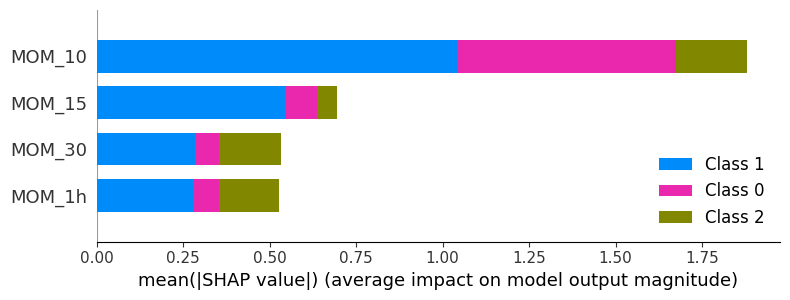

In [ ]:
import shap

explainer = shap.Explainer(model)
shap_values = explainer(X_val)

shap.summary_plot(shap_values, X_val)


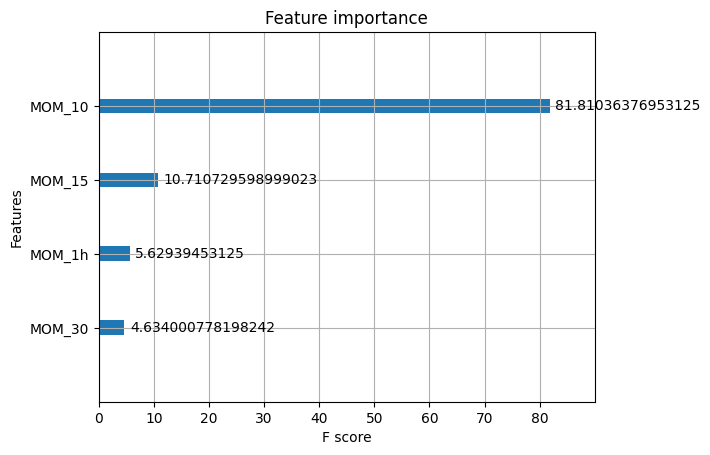

In [ ]:
import matplotlib.pyplot as plt
xgb.plot_importance(model, importance_type='gain')  # gain, weight, cover
plt.show()


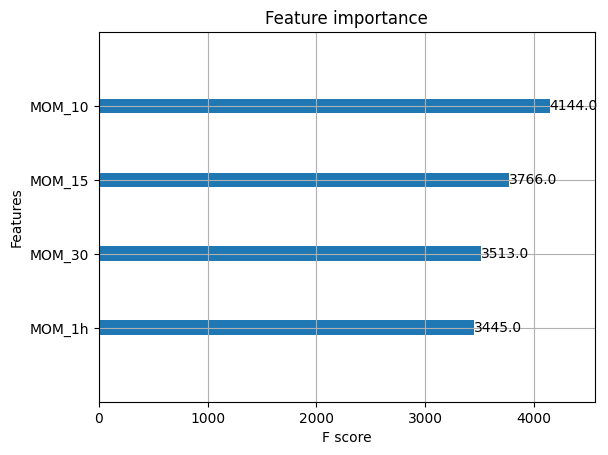

In [ ]:
import matplotlib.pyplot as plt
xgb.plot_importance(model, importance_type='weight')
plt.show()


In [ ]:
#Completito:
# "MOM_10", 'MOM_15', 'MOM_30', 'MOM_1h'
# Optimo:
# "MOM_10", 'MOM_15', 'MOM_1h'

# modelo fuerte en extremo superior, sobre todo en su recall es altimsimo
# probabable uso como modelo binario (varia o no?)
# ESTE ES SUPERIOR AL MOM CLASICO

#RSIV

In [ ]:
# Cálculo de deltas
delta = mf1['Closet'].diff()
theta =mf1["Volumet"].diff()

# Diccionario de ventanas
ventanas_vol = {
    "10": 2, "15": 3, "30": 6, "1h": 12, "2h": 24, "4h": 48, "6h": 72, "8h": 96,
    "12h": 144, "1d": 288, "3d": 864, "4d": 1152, "5d": 1440, "1s": 2016, "2s": 4032,
    "1m": 8064, "2m": 16128, "3m": 24192, "4m": 32256, "5m": 40320, "6m": 48384,
    "9m": 72576, "1a": 100800, "2a": 201600, "3a": 302400
}

# RSI con máximas variaciones
for label, n in ventanas_vol.items():
    gain = np.sqrt((delta.where(delta > 0, 0.0).rolling(window=n).max())*theta)
    loss = np.sqrt(((-delta.where(delta < 0, 0.0)).rolling(window=n).max())*theta)

    rs = gain / loss
    rsi = 100 - (100 / (1 + rs))

    mf1[f'RSIV_{label}'] = rsi


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)
/tmp/ipython-input-100-3728754972.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1[f'RSIV_{label}'] = rsi
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in sqrt
  result = get

In [ ]:
print(mf1.columns.tolist())

['Datetime', 'High', 'Low', 'Close', 'Volume', 'ETH_Close', 'ETH_Volume', 'USDT_Close', 'USDT_Volume', 'XRP_Close', 'XRP_Volume', 'SOL_Close', 'SOL_Volume', 'DOGE_Close', 'DOGE_Volume', 'VoM', 'DominanciaBTC', 'MC', 'MCM', 'DominanciaMBTC', 'cp2', 'vp2', 'SD_1', 'VB5', 'SD_2', 'VB10', 'SD_3', 'VB15', 'SD_6', 'VB30', 'SD_12', 'VB1h', 'SD_24', 'VB2h', 'SD_48', 'VB4h', 'SD_72', 'VB6h', 'SD_144', 'VB12h', 'SD_288', 'VB1d', 'SD_864', 'VB3d', 'SD_1152', 'VB4d', 'SD_1440', 'VB5d', 'SD_2016', 'VB1s', 'SD_4032', 'VB2s', 'SD_8064', 'VB1m', 'SD_16128', 'VB2m', 'SD_24192', 'VB3m', 'SD_32256', 'VB4m', 'SD_40320', 'VB5m', 'SD_48384', 'VB6m', 'SD_72576', 'VB9m', 'SD_100800', 'VB1a', 'SD_201600', 'VB2a', 'SD_302400', 'VB3a', 'VB_PCA_1', 'VB_PCA_2', 'VB_PCA_3', 'VB_PCA_4', 'B', 'B1', 'QBpc', 'QSD_1', 'VQ5', 'QSD_2', 'VQ10', 'QSD_3', 'VQ15', 'QSD_6', 'VQ30', 'QSD_12', 'VQ1h', 'QSD_24', 'VQ2h', 'QSD_48', 'VQ4h', 'QSD_72', 'VQ6h', 'QSD_144', 'VQ12h', 'QSD_288', 'VQ1d', 'QSD_864', 'VQ3d', 'QSD_1152', 'VQ4d

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ['RSIV_10', 'RSIV_15', 'RSIV_30', 'RSIV_1h', 'RSIV_2h',
             'RSIV_4h', 'RSIV_6h', 'RSIV_8h', 'RSIV_12h', 'RSIV_1d', 'RSIV_3d', 'RSIV_4d',
             'RSIV_5d', 'RSIV_1s', 'RSIV_2s', 'RSIV_1m', 'RSIV_2m', 'RSIV_3m',
             'RSIV_4m', 'RSIV_5m', 'RSIV_6m', 'RSIV_9m', 'RSIV_1a', 'RSIV_2a', 'RSIV_3a']


# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B1'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)


    Variable  Mutual Information
7    RSIV_8h            0.031878
8   RSIV_12h            0.030840
5    RSIV_4h            0.030417
9    RSIV_1d            0.030115
6    RSIV_6h            0.029887
10   RSIV_3d            0.028049
12   RSIV_5d            0.026695
4    RSIV_2h            0.025643
11   RSIV_4d            0.025382
13   RSIV_1s            0.023567
14   RSIV_2s            0.023373
16   RSIV_2m            0.020758
15   RSIV_1m            0.020724
17   RSIV_3m            0.019196
18   RSIV_4m            0.018011
19   RSIV_5m            0.016970
20   RSIV_6m            0.016156
21   RSIV_9m            0.015052
3    RSIV_1h            0.014719
22   RSIV_1a            0.013911
24   RSIV_3a            0.012167
23   RSIV_2a            0.010625
2    RSIV_30            0.005708
0    RSIV_10            0.005676
1    RSIV_15            0.003709


In [ ]:
# "RSIV_10", "RSIV_15"
# Van porque si del resto crearemos dos componentes ensamblados, considerando los lapsos
# mayores a 15 minutos y menores a 1 un dia
# mayores a 12h y menores o iguales a un año

**RSIV_PCA1**

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ['RSIV_30', 'RSIV_1h', 'RSIV_2h',
             'RSIV_4h', 'RSIV_6h', 'RSIV_12h']
# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=4)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
for i in range(4):
    mf1.loc[subset.index, f'RSIV_PCA1_{i+1}'] = principal_component[:, i]

/tmp/ipython-input-37-1458274188.py:24: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'RSIV_PCA1_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-37-1458274188.py:24: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'RSIV_PCA1_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-37-1458274188.py:24: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ["RSIV_6h", 'RSIV_4h', 'RSIV_PCA1_1', 'RSIV_PCA1_2', 'RSIV_PCA1_3', 'RSIV_PCA1_4']
# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)


      Variable  Mutual Information
0      RSIV_6h            0.035971
1      RSIV_4h            0.035939
3  RSIV_PCA1_2            0.018763
4  RSIV_PCA1_3            0.014387
2  RSIV_PCA1_1            0.011976
5  RSIV_PCA1_4            0.008944


In [ ]:
variables = ['RSIV_30', 'RSIV_1h', 'RSIV_2h',
             'RSIV_4h', 'RSIV_6h', 'RSIV_12h']
loadings = pd.Series(pca.components_[0], index=variables)

print("Cargas del primer componente:")
print(loadings.sort_values(ascending=False))

print("\nVarianza explicada por el primer componente:")
print(pca.explained_variance_ratio_[0])


Cargas del primer componente:
RSIV_4h     0.501526
RSIV_6h     0.480623
RSIV_2h     0.454409
RSIV_12h    0.366260
RSIV_1h     0.357761
RSIV_30     0.221011
dtype: float64

Varianza explicada por el primer componente:
0.4735541318259824


In [ ]:
# "RSIV_10", "RSIV_15", "RSIV_4h", "RSIV_6h"
#primeros pca malos

**RSIV_PCA2**

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ['RSIV_1d', 'RSIV_3d', 'RSIV_4d', 'RSIV_5d', 'RSIV_1s', 'RSIV_2s',
             'RSIV_1m', 'RSIV_2m', 'RSIV_3m', 'RSIV_4m', 'RSIV_5m', 'RSIV_6m',
             'RSIV_9m', "RSIV_1a"]
# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=4)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
for i in range(4):
    mf1.loc[subset.index, f'RSIV_PCA2_{i+1}'] = principal_component[:, i]

/tmp/ipython-input-84-4254905607.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'RSIV_PCA2_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-84-4254905607.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'RSIV_PCA2_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-84-4254905607.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ["RSIV_1d", 'RSIV_3d', 'RSIV_PCA2_1', 'RSIV_PCA2_2', 'RSIV_PCA2_3', 'RSIV_PCA2_4']
# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)


      Variable  Mutual Information
0      RSIV_1d            0.032950
1      RSIV_3d            0.028482
3  RSIV_PCA2_2            0.027938
2  RSIV_PCA2_1            0.027852
5  RSIV_PCA2_4            0.027673
4  RSIV_PCA2_3            0.026906


In [ ]:
variables = ['RSIV_1d', 'RSIV_3d', 'RSIV_4d', 'RSIV_5d', 'RSIV_1s', 'RSIV_2s',
             'RSIV_1m', 'RSIV_2m', 'RSIV_3m', 'RSIV_4m', 'RSIV_5m', 'RSIV_6m',
             'RSIV_9m', "RSIV_1a"]
loadings = pd.Series(pca.components_[0], index=variables)

print("Cargas del primer componente:")
print(loadings.sort_values(ascending=False))

print("\nVarianza explicada por el primer componente:")
print(pca.explained_variance_ratio_[0])


Cargas del primer componente:
RSIV_4m    0.358374
RSIV_3m    0.351983
RSIV_5m    0.345372
RSIV_2m    0.329130
RSIV_6m    0.313152
RSIV_1m    0.249345
RSIV_1s    0.240343
RSIV_5d    0.236437
RSIV_9m    0.235525
RSIV_2s    0.232212
RSIV_4d    0.223058
RSIV_1a    0.198002
RSIV_3d    0.195069
RSIV_1d    0.098776
dtype: float64

Varianza explicada por el primer componente:
0.33416128029884945


In [ ]:
variables = ['RSIV_1d', 'RSIV_3d', 'RSIV_4d', 'RSIV_5d', 'RSIV_1s', 'RSIV_2s',
             'RSIV_1m', 'RSIV_2m', 'RSIV_3m', 'RSIV_4m', 'RSIV_5m', 'RSIV_6m',
             'RSIV_9m', "RSIV_1a"]
loadings = pd.Series(pca.components_[1], index=variables)

print("Cargas del primer componente:")
print(loadings.sort_values(ascending=False))

print("\nVarianza explicada por el primer componente:")
print(pca.explained_variance_ratio_[1])


Cargas del primer componente:
RSIV_5d    0.367013
RSIV_4d    0.365008
RSIV_1s    0.343220
RSIV_3d    0.335860
RSIV_2s    0.261797
RSIV_1d    0.195239
RSIV_1m    0.158026
RSIV_2m   -0.013742
RSIV_3m   -0.144750
RSIV_4m   -0.229396
RSIV_1a   -0.251078
RSIV_5m   -0.265153
RSIV_9m   -0.282561
RSIV_6m   -0.287905
dtype: float64

Varianza explicada por el primer componente:
0.2768227066761404


In [ ]:
# "RSIV_10", "RSIV_15", "RSIV_4h", "RSIV_6h", "RSIV_1d", 'RSIV_3d', 'RSIV_PCA2_1', 'RSIV_PCA2_2'

SHAP

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import xgboost as xgb
import matplotlib.pyplot as plt
import numpy as np

# Variables explicativas y objetivo
features = ["RSIV_10", "RSIV_15", "RSIV_4h", "RSIV_6h", "RSIV_1d", 'RSIV_3d', 'RSIV_PCA2_1', 'RSIV_PCA2_2']
target = "B"

# Eliminar filas con NaN
df = mf1[features + [target]].dropna()
df[target] = df[target].astype(int)

# Definir X e y
X = df[features]
y = df[target]

# División: 70% train, 30% temp
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.30, stratify=y, random_state=42)

# División: 20% validation, 10% test (sobre el 30% restante)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=1/3, stratify=y_temp, random_state=42)


# Entrenar modelo multiclase
model = xgb.XGBClassifier(
    objective='multi:softmax',
    num_class=3,
    n_estimators=100,
    max_depth=6,
    learning_rate=0.1,
    use_label_encoder=False,
    eval_metric='mlogloss'
)

model.fit(X_train, y_train)

# --- Evaluación en validation ---
y_val_pred = model.predict(X_val)
print("📊 MATRIZ DE CONFUSIÓN (VALIDATION):")
print(confusion_matrix(y_val, y_val_pred))
print("📄 REPORT (VALIDATION):")
print(classification_report(y_val, y_val_pred))

# --- Evaluación en test ---
y_test_pred = model.predict(X_test)
print("📊 MATRIZ DE CONFUSIÓN (TEST):")
print(confusion_matrix(y_test, y_test_pred))
print("📄 REPORT (TEST):")
print(classification_report(y_test, y_test_pred))


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [01:14:28] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


📊 MATRIZ DE CONFUSIÓN (VALIDATION):
[[21190  1199  4963]
 [ 8191  4613  8592]
 [ 3298  1366 23168]]
📄 REPORT (VALIDATION):
              precision    recall  f1-score   support

           0       0.65      0.77      0.71     27352
           1       0.64      0.22      0.32     21396
           2       0.63      0.83      0.72     27832

    accuracy                           0.64     76580
   macro avg       0.64      0.61      0.58     76580
weighted avg       0.64      0.64      0.60     76580

📊 MATRIZ DE CONFUSIÓN (TEST):
[[10684   579  2413]
 [ 4107  2395  4196]
 [ 1679   608 11630]]
📄 REPORT (TEST):
              precision    recall  f1-score   support

           0       0.65      0.78      0.71     13676
           1       0.67      0.22      0.34     10698
           2       0.64      0.84      0.72     13917

    accuracy                           0.65     38291
   macro avg       0.65      0.61      0.59     38291
weighted avg       0.65      0.65      0.61     38291



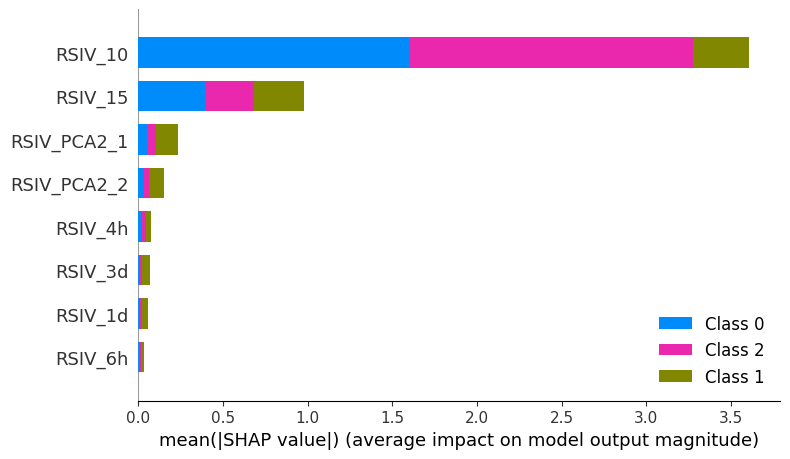

In [ ]:
import shap

explainer = shap.Explainer(model)
shap_values = explainer(X_val)

shap.summary_plot(shap_values, X_val)


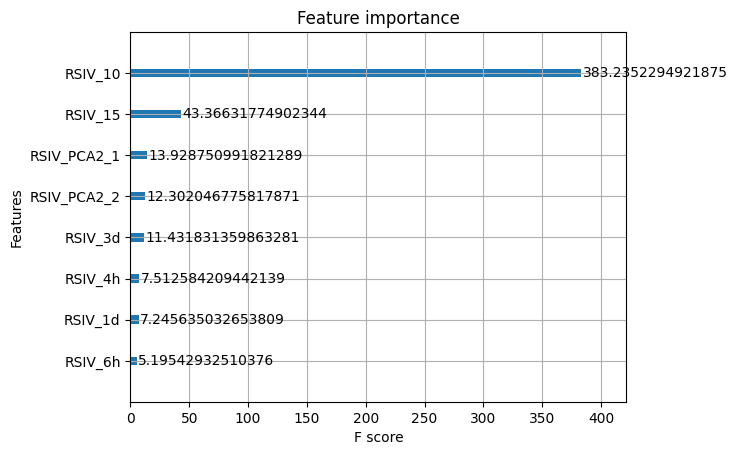

In [ ]:
import matplotlib.pyplot as plt
xgb.plot_importance(model, importance_type='gain')  # gain, weight, cover
plt.show()


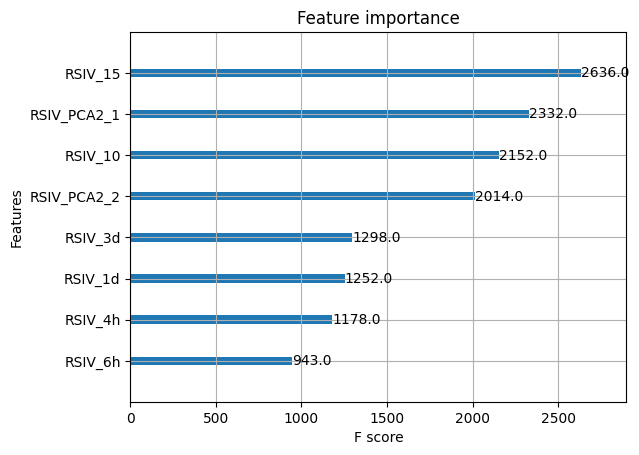

In [ ]:
import matplotlib.pyplot as plt
xgb.plot_importance(model, importance_type='weight')
plt.show()


In [ ]:
#Completito:
# "RSIV_10", "RSIV_15", "RSIV_4h", "RSIV_6h", "RSIV_1d", 'RSIV_3d', 'RSIV_PCA2_1', 'RSIV_PCA2_2'
# Optimo:
# ["RSIV_10", "RSIV_15"]
#Se excpluye al resto porque predicen donde el modelo más se equivoca, la calse neutro

# modelo fuerte en extremos, sobre todo en su recall

# CRIPTO Y FOREX


Crypto

<ipython-input-74-2420728008>:27: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, 'C_PCA'] = principal_component.flatten()


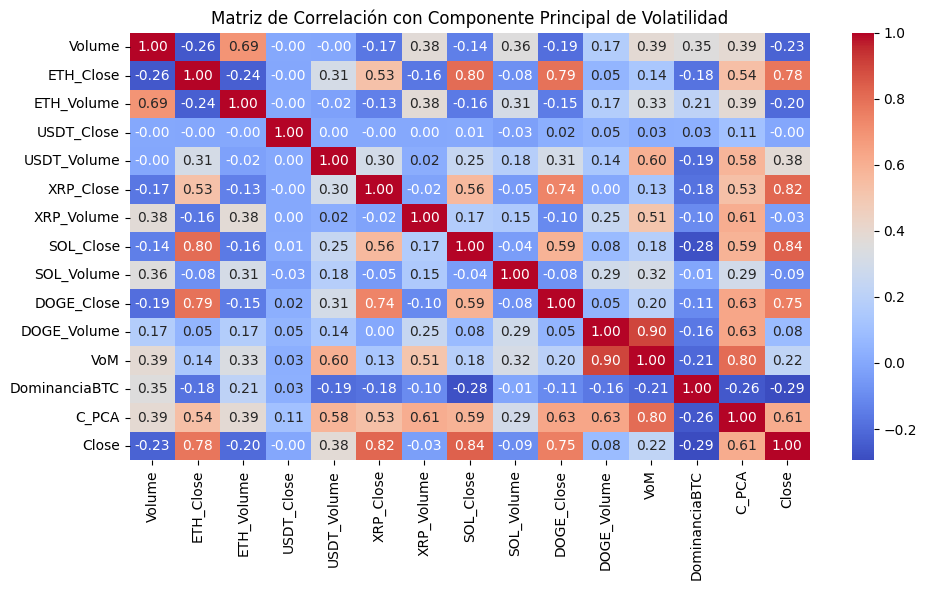

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ["Volume", "ETH_Close", "ETH_Volume", "USDT_Close", "USDT_Volume",
 "XRP_Close", "XRP_Volume", "SOL_Close", "SOL_Volume",
 "DOGE_Close", "DOGE_Volume", "VoM", "DominanciaBTC"]



# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=1)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
mf1.loc[subset.index, 'C_PCA'] = principal_component.flatten()

# Matriz de correlación
correlation_matrix = mf1[variables + ['C_PCA'] + ['Close']].corr()

# Visualización
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Matriz de Correlación con Componente Principal de Volatilidad")
plt.tight_layout()
plt.show()


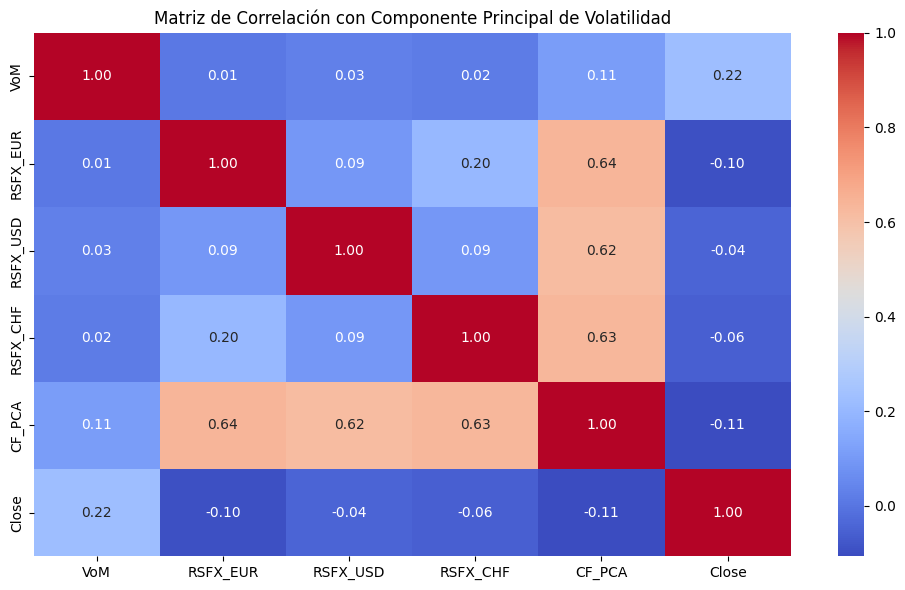

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ["VoM", "RSFX_EUR", "RSFX_USD", "RSFX_CHF"]



# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=1)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
mf1.loc[subset.index, 'CF_PCA'] = principal_component.flatten()

# Matriz de correlación
correlation_matrix = mf1[variables + ['CF_PCA'] + ['Close']].corr()

# Visualización
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Matriz de Correlación con Componente Principal de Volatilidad")
plt.tight_layout()
plt.show()


In [ ]:
from statsmodels.tsa.stattools import grangercausalitytests

# Asegurate de no tener valores nulos
mf1_clean = mf1[['Close', 'C_PCA']].dropna()

# Aplicamos el test con lags hasta 10 (podés ajustarlo)
grangercausalitytests(mf1_clean[['Close', 'C_PCA']], maxlag=10, verbose=True)


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



Granger Causality
number of lags (no zero) 1
ssr based F test:         F=31.7426 , p=0.0000  , df_denom=442713, df_num=1
ssr based chi2 test:   chi2=31.7428 , p=0.0000  , df=1
likelihood ratio test: chi2=31.7416 , p=0.0000  , df=1
parameter F test:         F=31.7426 , p=0.0000  , df_denom=442713, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=7.9106  , p=0.0004  , df_denom=442710, df_num=2
ssr based chi2 test:   chi2=15.8214 , p=0.0004  , df=2
likelihood ratio test: chi2=15.8211 , p=0.0004  , df=2
parameter F test:         F=7.9106  , p=0.0004  , df_denom=442710, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.9535  , p=0.0019  , df_denom=442707, df_num=3
ssr based chi2 test:   chi2=14.8608 , p=0.0019  , df=3
likelihood ratio test: chi2=14.8606 , p=0.0019  , df=3
parameter F test:         F=4.9535  , p=0.0019  , df_denom=442707, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=4.

{np.int64(1): ({'ssr_ftest': (np.float64(31.74255424996771),
    np.float64(1.7612920383074645e-08),
    np.float64(442713.0),
    np.int64(1)),
   'ssr_chi2test': (np.float64(31.742769350185572),
    np.float64(1.7600329724991968e-08),
    np.int64(1)),
   'lrtest': (np.float64(31.741631424985826),
    np.float64(1.761064483910475e-08),
    np.int64(1)),
   'params_ftest': (np.float64(31.742554249610947),
    np.float64(1.7612920386254953e-08),
    np.float64(442713.0),
    1.0)},
   array([[0., 1., 0.]])]),
 np.int64(2): ({'ssr_ftest': (np.float64(7.910590991235002),
    np.float64(0.00036688957392148755),
    np.float64(442710.0),
    np.int64(2)),
   'ssr_chi2test': (np.float64(15.821360668087928),
    np.float64(0.0003668049457950818),
    np.int64(2)),
   'lrtest': (np.float64(15.82107796985656),
    np.float64(0.00036685679701427406),
    np.int64(2)),
   'params_ftest': (np.float64(7.910590991384364),
    np.float64(0.00036688957386989357),
    np.float64(442710.0),
    2.0)},


VOC

In [ ]:
# Crear VoC dinámicamente a partir de las VVo existentes
for nombre in ventanas_vol.keys():
    vvo_col = f"VVo{nombre}"
    voc_col = f"VoC{nombre}"

    if vvo_col in mf1.columns:
        mf1[voc_col] = np.sqrt(mf1["Close"]* mf1[vvo_col])

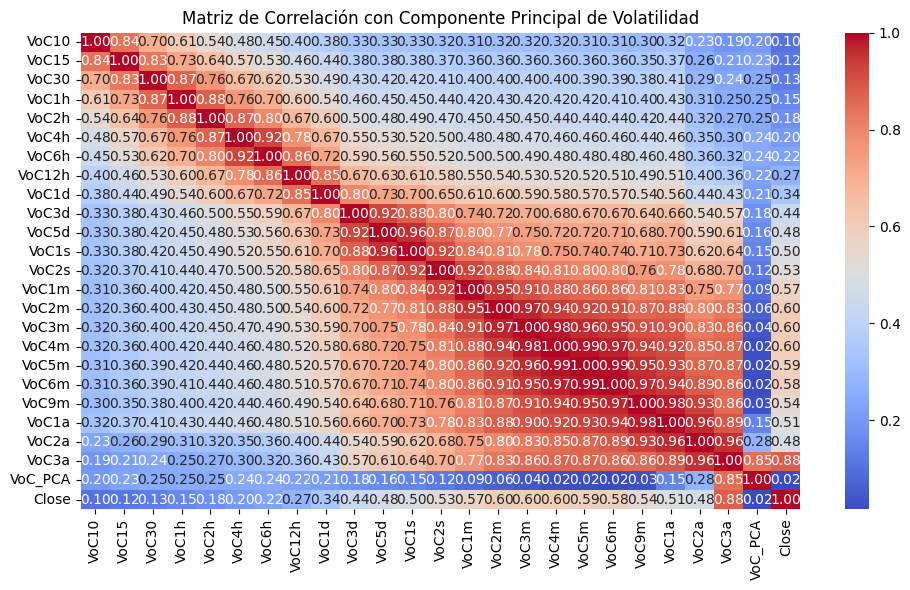

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ["VoC10", "VoC15", "VoC30", "VoC1h", "VoC2h", "VoC4h", "VoC6h", "VoC12h",
 "VoC1d", "VoC3d", "VoC5d", "VoC1s", "VoC2s", "VoC1m", "VoC2m", "VoC3m",
 "VoC4m", "VoC5m", "VoC6m", "VoC9m", "VoC1a", "VoC2a", "VoC3a"]

# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=1)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
mf1.loc[subset.index, 'VoC_PCA'] = principal_component.flatten()

# Matriz de correlación
correlation_matrix = mf1[variables + ['VoC_PCA'] + ['Close']].corr()

# Visualización
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Matriz de Correlación con Componente Principal de Volatilidad")
plt.tight_layout()
plt.show()


In [ ]:
from sklearn.linear_model import LinearRegression

# Selección de variables
X = mf1[["VoC_PCA", "VoV_PCA"]]
y = mf1["Close"]

# Combinar X e y para eliminar las filas con NaN en cualquiera de ellos
df_temp = pd.concat([X, y], axis=1).dropna()

# Redefinir X e y limpios
X_clean = df_temp[["VoC_PCA", "VoV_PCA"]]
y_clean = df_temp["Close"]

# Ajustar modelo lineal
reg = LinearRegression().fit(X_clean, y_clean)

# Coeficientes
alpha = reg.coef_[0]
beta = reg.coef_[1]
intercept = reg.intercept_

# Predecir y guardar MarketEnergy
mf1.loc[X_clean.index, "MarketEnergy"] = reg.predict(X_clean)


In [ ]:
from statsmodels.tsa.stattools import grangercausalitytests

# Asegurate de no tener valores nulos
mf1_clean = mf1[['Close', 'MarketEnergy']].dropna()

# Aplicamos el test con lags hasta 10 (podés ajustarlo)
grangercausalitytests(mf1_clean[['Close', 'MarketEnergy']], maxlag=10, verbose=True)


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



Granger Causality
number of lags (no zero) 1
ssr based F test:         F=26.5015 , p=0.0000  , df_denom=629565, df_num=1
ssr based chi2 test:   chi2=26.5016 , p=0.0000  , df=1
likelihood ratio test: chi2=26.5011 , p=0.0000  , df=1
parameter F test:         F=26.5015 , p=0.0000  , df_denom=629565, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=10.6172 , p=0.0000  , df_denom=629562, df_num=2
ssr based chi2 test:   chi2=21.2346 , p=0.0000  , df=2
likelihood ratio test: chi2=21.2343 , p=0.0000  , df=2
parameter F test:         F=10.6172 , p=0.0000  , df_denom=629562, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=8.3480  , p=0.0000  , df_denom=629559, df_num=3
ssr based chi2 test:   chi2=25.0444 , p=0.0000  , df=3
likelihood ratio test: chi2=25.0439 , p=0.0000  , df=3
parameter F test:         F=8.3480  , p=0.0000  , df_denom=629559, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=7.

{np.int64(1): ({'ssr_ftest': (np.float64(26.50150661137648),
    np.float64(2.6341157134212257e-07),
    np.float64(629565.0),
    np.int64(1)),
   'ssr_chi2test': (np.float64(26.501632896223693),
    np.float64(2.6331544310849067e-07),
    np.int64(1)),
   'lrtest': (np.float64(26.50107511971146),
    np.float64(2.63391482801285e-07),
    np.int64(1)),
   'params_ftest': (np.float64(26.501506610639876),
    np.float64(2.6341157144034875e-07),
    np.float64(629565.0),
    1.0)},
   array([[0., 1., 0.]])]),
 np.int64(2): ({'ssr_ftest': (np.float64(10.617240418512303),
    np.float64(2.4494514370682677e-05),
    np.float64(629562.0),
    np.int64(2)),
   'ssr_chi2test': (np.float64(21.234649481898636),
    np.float64(2.44880640453095e-05),
    np.int64(2)),
   'lrtest': (np.float64(21.234291377477348),
    np.float64(2.4492449079874557e-05),
    np.int64(2)),
   'params_ftest': (np.float64(10.617240418943016),
    np.float64(2.449451435827356e-05),
    np.float64(629562.0),
    2.0)},
 

In [ ]:
#neu seu importanchi
mf1["CoB1s"] = mf1["BoC1s"] *mf1["BoV1s"]

In [ ]:
mf1["CoV1s"] = mf1["VoC1s"] *mf1["VoV1s"]

In [ ]:
#volitldad cruzada nein
#mf1["VoB1s"] = mf1["VB1s"] *mf1["VVo1s"]

In [ ]:
mf1["VoB1s"] = np.sqrt(mf1["VB1s"] *mf1["VVo1s"])

In [ ]:
#nao
#mf1["me"] = np.sqrt( mf1["VoC1s"] + mf1["VoV1s"])

In [ ]:
from sklearn.linear_model import LinearRegression

# Selección de variables
X = mf1[["VoC1s", "VoV1s"]]
y = mf1["Close"]

# Combinar X e y para eliminar las filas con NaN en cualquiera de ellos
df_temp = pd.concat([X, y], axis=1).dropna()

# Redefinir X e y limpios
X_clean = df_temp[["VoC1s", "VoV1s"]]
y_clean = df_temp["Close"]

# Ajustar modelo lineal
reg = LinearRegression().fit(X_clean, y_clean)

# Coeficientes
alpha = reg.coef_[0]
beta = reg.coef_[1]
intercept = reg.intercept_

# Predecir y guardar MarketEnergy
mf1.loc[X_clean.index, "MarketEnergy"] = reg.predict(X_clean)


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Seleccionar las variables
vars = ['Close','MarketEnergy', 'VQ_PCA', "VB_PCA"]

# Calcular la matriz de correlación
correlation_matrix = mf1[vars].corr()

# Mostrar la matriz de correlación numérica
print("Matriz de correlación numérica:")
print(correlation_matrix)

Matriz de correlación numérica:
                 Close  MarketEnergy    VQ_PCA    VB_PCA
Close         1.000000      0.826408 -0.715992  0.722557
MarketEnergy  0.826408      1.000000 -0.478681  0.748812
VQ_PCA       -0.715992     -0.478681  1.000000 -0.331880
VB_PCA        0.722557      0.748812 -0.331880  1.000000


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Seleccionar las variables
vars = ['Close','VoC_PCA', "VVo_PCA"]

# Calcular la matriz de correlación
correlation_matrix = mf1[vars].corr()

# Mostrar la matriz de correlación numérica
print("Matriz de correlación numérica:")
print(correlation_matrix)

Matriz de correlación numérica:
            Close   VoC_PCA   VVo_PCA
Close    1.000000  0.841504 -0.715992
VoC_PCA  0.841504  1.000000 -0.321948
VVo_PCA -0.715992 -0.321948  1.000000


In [ ]:
!pip install statsmodels

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
import pandas as pd
import numpy as np

# Variables predictoras (sin incluir Close)
X = mf1[['MarketEnergy', 'VQ_PCA', "VB_PCA"]].copy()

# Eliminar filas con NaN o inf
X = X.replace([np.inf, -np.inf], np.nan).dropna()

# Agregar constante
X = add_constant(X)

# Calcular VIF
vif_data = pd.DataFrame()
vif_data["feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print(vif_data)


        feature        VIF
0         const  18.231276
1  MarketEnergy   3.978009
2        VQ_PCA   1.325353
3        VB_PCA   3.446075


In [ ]:
X = mf1[['MarketEnergy', 'VQ_PCA', "VB_PCA"]].dropna()
y = mf1.loc[X.index, 'Close']  # Para alinear índices

X_scaled = StandardScaler().fit_transform(X)
pca = PCA(n_components=2)
components = pca.fit_transform(X_scaled)

print("Explained variance ratio:", pca.explained_variance_ratio_)


Explained variance ratio: [0.71023594 0.24145188]


DMIN/DMAX

In [ ]:
# Asegurar orden temporal
mf1 = mf1.sort_values(by='Datetime')

# Diccionario de ventanas (en minutos) para granularidad 1m
ventanas = {
    "5min": 5,
    "15min": 15,
    "30min": 30,
    "1h": 60,
    "2h": 120,
    "4h": 240,
    "6h": 360,
    "12h": 720,
    "1d": 1440,
    "3d": 4320,
    "5d": 7200,
    "1s": 10080,
    "2s": 20160,
    "1m": 43200,
    "2m": 86400,
    "6m": 259200,
    "1a": 518400,
    "2a": 1036800
}


# Calcular rolling max y min por cada ventana
for nombre, window in ventanas.items():
    mf1[f"Max {nombre}"] = mf1["High"].rolling(window=window, min_periods=1).max()
    mf1[f"Min {nombre}"] = mf1["Low"].rolling(window=window, min_periods=1).min()

DDDMIN/MAX_5

In [ ]:
# Recorremos todos los tiempos mayores a 5min para construir las diferencias
for nombre, _ in ventanas.items():
    if nombre != "5min" and ventanas[nombre] > ventanas["5min"]:
        mf1[f"dmax5_{nombre}"] = (mf1[f"Max {nombre}"] - mf1["Max 5min"]).abs()
        mf1[f"dmin5_{nombre}"] = (mf1[f"Min {nombre}"] - mf1["Min 5min"]).abs()

In [ ]:
print(mf1.columns.tolist())

['Datetime', 'Open', 'High', 'Low', 'Close', 'Volume', 'ETH_Open', 'ETH_High', 'ETH_Low', 'ETH_Close', 'ETH_Volume', 'USDT_Open', 'USDT_High', 'USDT_Low', 'USDT_Close', 'USDT_Volume', 'XRP_Open', 'XRP_High', 'XRP_Low', 'XRP_Close', 'XRP_Volume', 'SOL_Open', 'SOL_High', 'SOL_Low', 'SOL_Close', 'SOL_Volume', 'DOGE_Open', 'DOGE_High', 'DOGE_Low', 'DOGE_Close', 'DOGE_Volume', 'SD_80640', 'VB2m', 'SD_5', 'VB5m', 'SD_10', 'VB10m', 'SD_15', 'VB15m', 'SD_60', 'VB1h', 'SD_120', 'VB2h', 'SD_360', 'VB6h', 'SD_720', 'VB12h', 'SD_1440', 'VB1d', 'SD_4320', 'VB3d', 'SD_10080', 'VB1s', 'SD_20160', 'VB2s', 'SD_40320', 'VB1m', 'SD_259200', 'VB6m', 'VoV2m', 'VoV5m', 'VoV10m', 'VoV15m', 'VoV1h', 'VoV2h', 'VoV6h', 'VoV12h', 'VoV1d', 'VoV3d', 'VoV1s', 'VoSD_2', 'VVo2m', 'VoSD_5', 'VVo5m', 'VoSD_10', 'VVo10m', 'VoSD_15', 'VVo15m', 'VoSD_60', 'VVo1h', 'VoSD_120', 'VVo2h', 'VoSD_360', 'VVo6h', 'VoSD_720', 'VVo12h', 'VoSD_1440', 'VVo1d', 'VoSD_4320', 'VVo3d', 'VoSD_10080', 'VVo1s', 'VoC2m', 'VoC5m', 'VoC10m', '

In [ ]:
mf1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1091512 entries, 0 to 1091511
Columns: 197 entries, Datetime to dmin5_2a
dtypes: datetime64[ns](1), float64(196)
memory usage: 1.6 GB


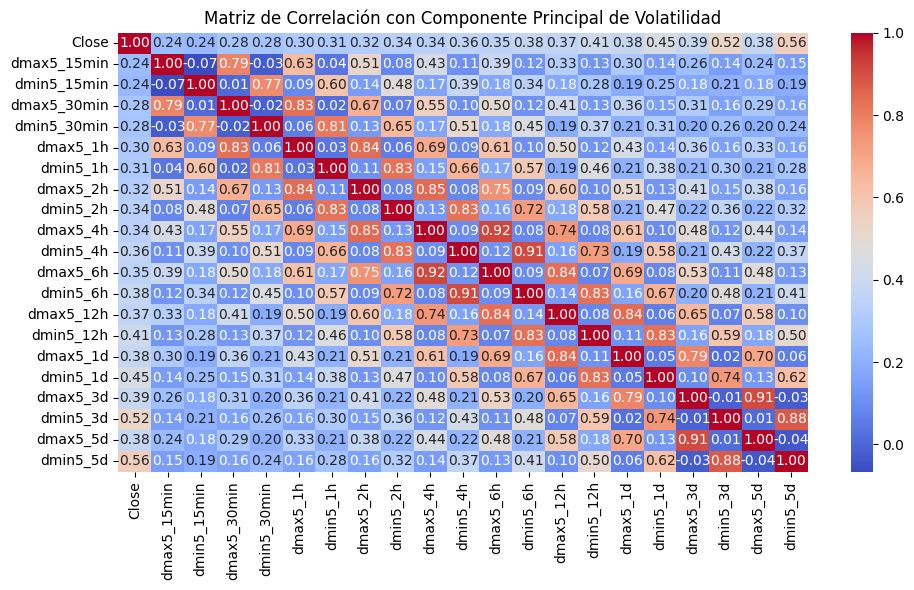

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ['Close','dmax5_15min', 'dmin5_15min', 'dmax5_30min', 'dmin5_30min', 'dmax5_1h',
        'dmin5_1h', 'dmax5_2h', 'dmin5_2h', 'dmax5_4h', 'dmin5_4h', 'dmax5_6h',
        'dmin5_6h', 'dmax5_12h', 'dmin5_12h', 'dmax5_1d', 'dmin5_1d', 'dmax5_3d',
        'dmin5_3d', 'dmax5_5d', 'dmin5_5d', ]


# Matriz de correlación
correlation_matrix = mf1[variables ].corr()

# Visualización
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Matriz de Correlación con Componente Principal de Volatilidad")
plt.tight_layout()
plt.show()


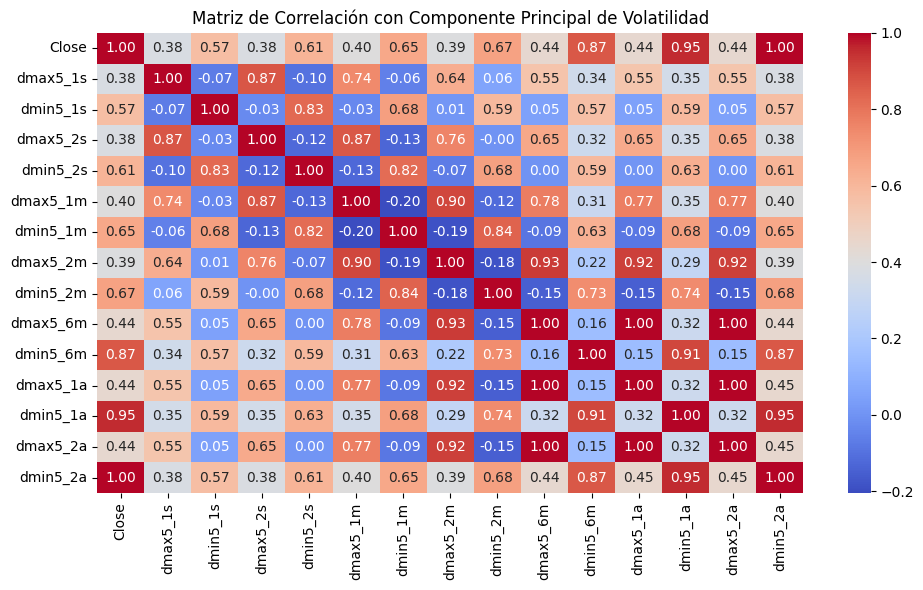

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ['Close', 'dmax5_1s', 'dmin5_1s', 'dmax5_2s',
        'dmin5_2s', 'dmax5_1m', 'dmin5_1m', 'dmax5_2m', 'dmin5_2m', 'dmax5_6m',
        'dmin5_6m', 'dmax5_1a', 'dmin5_1a', 'dmax5_2a', 'dmin5_2a']


# Matriz de correlación
correlation_matrix = mf1[variables ].corr()

# Visualización
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Matriz de Correlación con Componente Principal de Volatilidad")
plt.tight_layout()
plt.show()


DMIN/MAX_5

In [ ]:
# Recorremos todos los tiempos mayores a 5min para construir las diferencias
for nombre, _ in ventanas.items():
    if nombre != "5min" and ventanas[nombre] > ventanas["5min"]:
        mf1[f"dmax5_{nombre}"] = mf1["Max 5min"] - mf1[f"Max {nombre}"]
        mf1[f"dmin5_{nombre}"] = mf1["Min 5min"] - mf1[f"Min {nombre}"]

In [ ]:
print(mf1.columns.tolist())

['Datetime', 'Open', 'High', 'Low', 'Close', 'Volume', 'ETH_Open', 'ETH_High', 'ETH_Low', 'ETH_Close', 'ETH_Volume', 'USDT_Open', 'USDT_High', 'USDT_Low', 'USDT_Close', 'USDT_Volume', 'XRP_Open', 'XRP_High', 'XRP_Low', 'XRP_Close', 'XRP_Volume', 'SOL_Open', 'SOL_High', 'SOL_Low', 'SOL_Close', 'SOL_Volume', 'DOGE_Open', 'DOGE_High', 'DOGE_Low', 'DOGE_Close', 'DOGE_Volume', 'SD_80640', 'VB2m', 'SD_5', 'VB5m', 'SD_10', 'VB10m', 'SD_15', 'VB15m', 'SD_60', 'VB1h', 'SD_120', 'VB2h', 'SD_360', 'VB6h', 'SD_720', 'VB12h', 'SD_1440', 'VB1d', 'SD_4320', 'VB3d', 'SD_10080', 'VB1s', 'SD_20160', 'VB2s', 'SD_40320', 'VB1m', 'SD_259200', 'VB6m', 'VoV2m', 'VoV5m', 'VoV10m', 'VoV15m', 'VoV1h', 'VoV2h', 'VoV6h', 'VoV12h', 'VoV1d', 'VoV3d', 'VoV1s', 'VoSD_2', 'VVo2m', 'VoSD_5', 'VVo5m', 'VoSD_10', 'VVo10m', 'VoSD_15', 'VVo15m', 'VoSD_60', 'VVo1h', 'VoSD_120', 'VVo2h', 'VoSD_360', 'VVo6h', 'VoSD_720', 'VVo12h', 'VoSD_1440', 'VVo1d', 'VoSD_4320', 'VVo3d', 'VoSD_10080', 'VVo1s', 'VoC2m', 'VoC5m', 'VoC10m', '

In [ ]:
mf1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1091512 entries, 0 to 1091511
Columns: 197 entries, Datetime to dmin5_2a
dtypes: datetime64[ns](1), float64(196)
memory usage: 1.6 GB


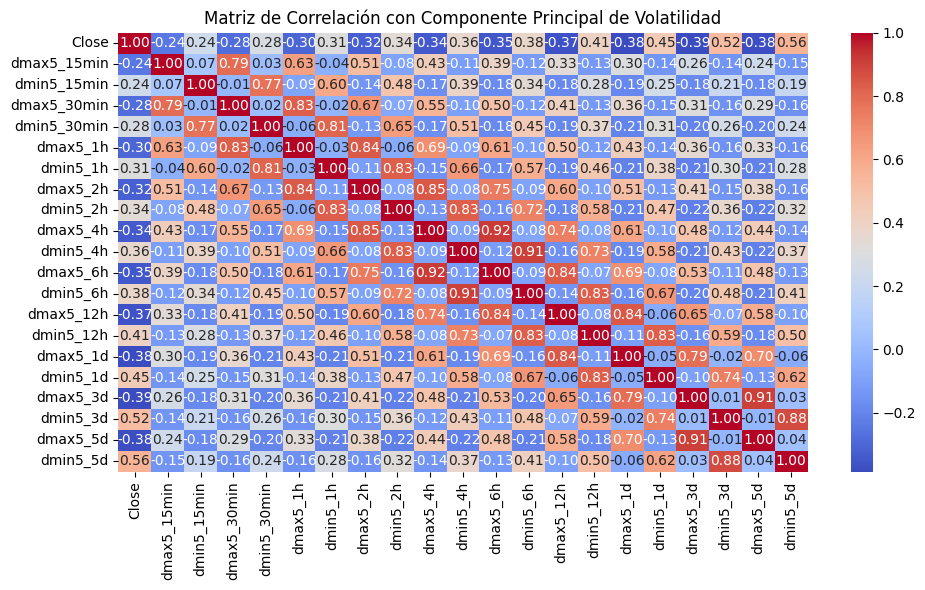

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ['Close','dmax5_15min', 'dmin5_15min', 'dmax5_30min', 'dmin5_30min', 'dmax5_1h',
        'dmin5_1h', 'dmax5_2h', 'dmin5_2h', 'dmax5_4h', 'dmin5_4h', 'dmax5_6h',
        'dmin5_6h', 'dmax5_12h', 'dmin5_12h', 'dmax5_1d', 'dmin5_1d', 'dmax5_3d',
        'dmin5_3d', 'dmax5_5d', 'dmin5_5d', ]


# Matriz de correlación
correlation_matrix = mf1[variables ].corr()

# Visualización
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Matriz de Correlación con Componente Principal de Volatilidad")
plt.tight_layout()
plt.show()


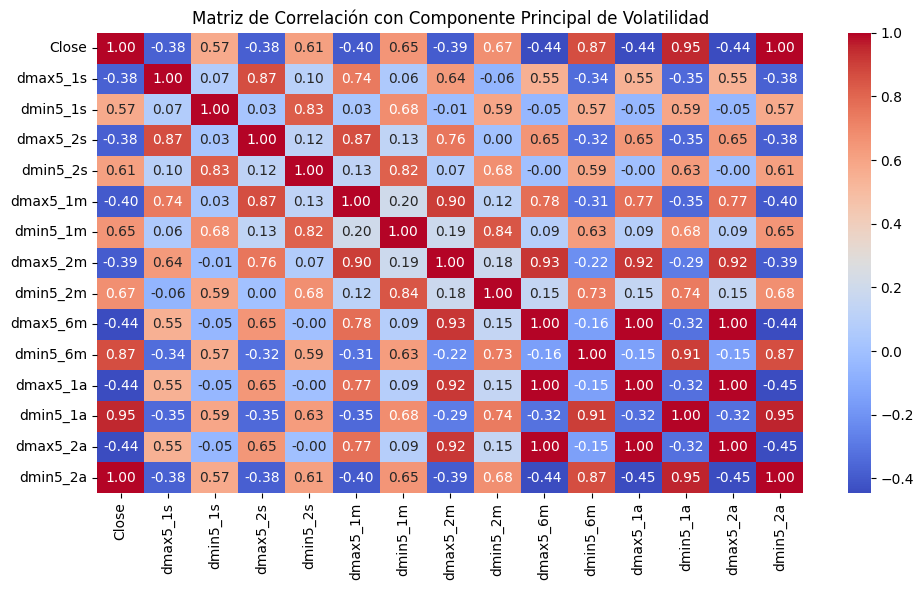

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ['Close', 'dmax5_1s', 'dmin5_1s', 'dmax5_2s',
        'dmin5_2s', 'dmax5_1m', 'dmin5_1m', 'dmax5_2m', 'dmin5_2m', 'dmax5_6m',
        'dmin5_6m', 'dmax5_1a', 'dmin5_1a', 'dmax5_2a', 'dmin5_2a']


# Matriz de correlación
correlation_matrix = mf1[variables ].corr()

# Visualización
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Matriz de Correlación con Componente Principal de Volatilidad")
plt.tight_layout()
plt.show()


DMIN/MAX_15

In [ ]:
# Recorremos todos los tiempos mayores a 5min para construir las diferencias
for nombre, _ in ventanas.items():
    if nombre != "15min" and ventanas[nombre] > ventanas["15min"]:
        mf1[f"dmax15_{nombre}"] = mf1["Max 15min"] - mf1[f"Max {nombre}"]
        mf1[f"dmin15_{nombre}"] = mf1["Min 15min"] - mf1[f"Min {nombre}"]

In [ ]:
print(mf1.columns.tolist())

['Datetime', 'Open', 'High', 'Low', 'Close', 'Volume', 'ETH_Open', 'ETH_High', 'ETH_Low', 'ETH_Close', 'ETH_Volume', 'USDT_Open', 'USDT_High', 'USDT_Low', 'USDT_Close', 'USDT_Volume', 'XRP_Open', 'XRP_High', 'XRP_Low', 'XRP_Close', 'XRP_Volume', 'SOL_Open', 'SOL_High', 'SOL_Low', 'SOL_Close', 'SOL_Volume', 'DOGE_Open', 'DOGE_High', 'DOGE_Low', 'DOGE_Close', 'DOGE_Volume', 'SD_80640', 'VB2m', 'SD_5', 'VB5m', 'SD_10', 'VB10m', 'SD_15', 'VB15m', 'SD_60', 'VB1h', 'SD_120', 'VB2h', 'SD_360', 'VB6h', 'SD_720', 'VB12h', 'SD_1440', 'VB1d', 'SD_4320', 'VB3d', 'SD_10080', 'VB1s', 'SD_20160', 'VB2s', 'SD_40320', 'VB1m', 'SD_259200', 'VB6m', 'VoV2m', 'VoV5m', 'VoV10m', 'VoV15m', 'VoV1h', 'VoV2h', 'VoV6h', 'VoV12h', 'VoV1d', 'VoV3d', 'VoV1s', 'VoSD_2', 'VVo2m', 'VoSD_5', 'VVo5m', 'VoSD_10', 'VVo10m', 'VoSD_15', 'VVo15m', 'VoSD_60', 'VVo1h', 'VoSD_120', 'VVo2h', 'VoSD_360', 'VVo6h', 'VoSD_720', 'VVo12h', 'VoSD_1440', 'VVo1d', 'VoSD_4320', 'VVo3d', 'VoSD_10080', 'VVo1s', 'VoC2m', 'VoC5m', 'VoC10m', '

In [ ]:
mf1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1091512 entries, 0 to 1091511
Columns: 229 entries, Datetime to dmin15_2a
dtypes: datetime64[ns](1), float64(228)
memory usage: 1.9 GB


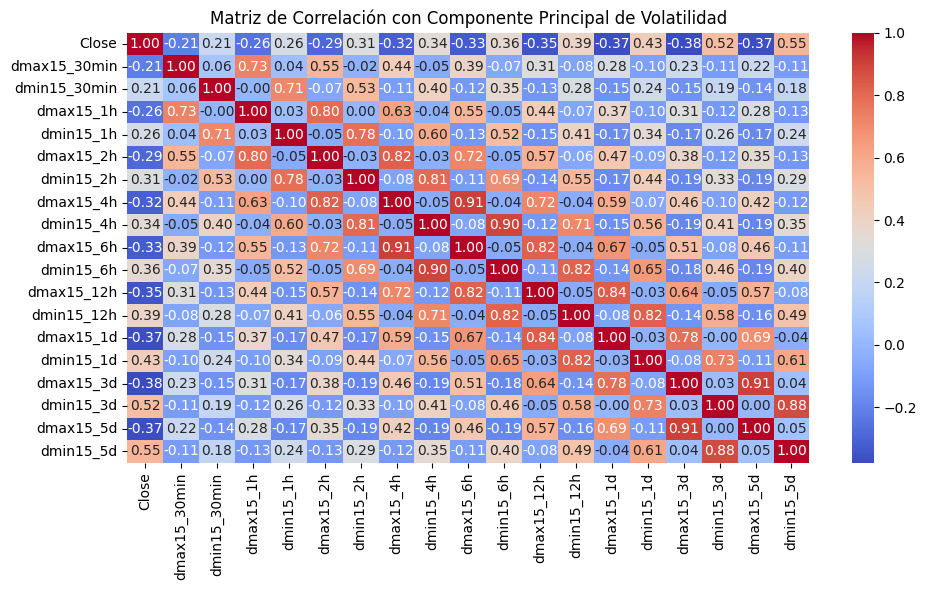

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ['Close','dmax15_30min', 'dmin15_30min', 'dmax15_1h', 'dmin15_1h', 'dmax15_2h',
        'dmin15_2h', 'dmax15_4h', 'dmin15_4h', 'dmax15_6h', 'dmin15_6h',
        'dmax15_12h', 'dmin15_12h', 'dmax15_1d', 'dmin15_1d', 'dmax15_3d',
        'dmin15_3d', 'dmax15_5d', 'dmin15_5d']


# Matriz de correlación
correlation_matrix = mf1[variables ].corr()

# Visualización
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Matriz de Correlación con Componente Principal de Volatilidad")
plt.tight_layout()
plt.show()


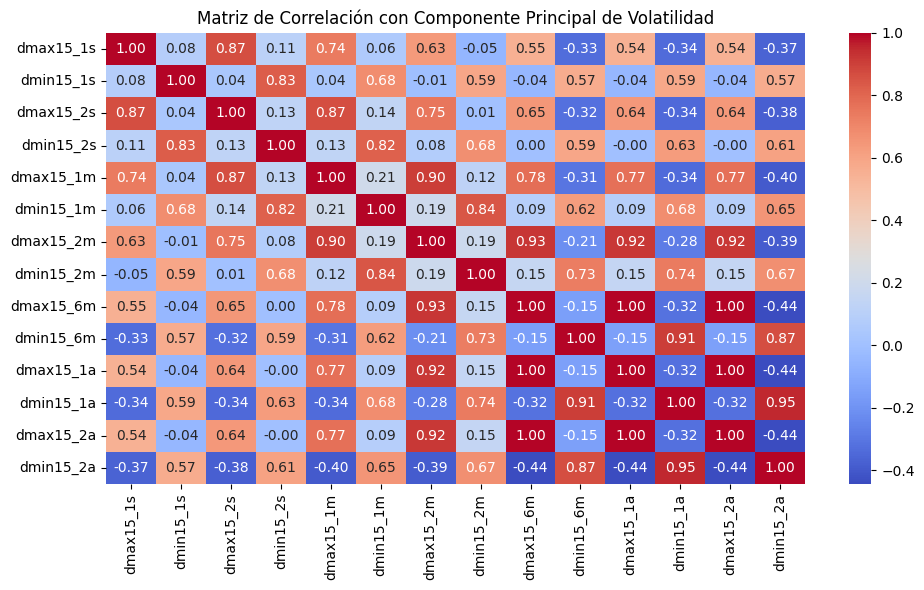

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ['dmax15_1s', 'dmin15_1s',
        'dmax15_2s', 'dmin15_2s', 'dmax15_1m', 'dmin15_1m', 'dmax15_2m', 'dmin15_2m',
        'dmax15_6m', 'dmin15_6m', 'dmax15_1a', 'dmin15_1a', 'dmax15_2a', 'dmin15_2a']


# Matriz de correlación
correlation_matrix = mf1[variables ].corr()

# Visualización
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Matriz de Correlación con Componente Principal de Volatilidad")
plt.tight_layout()
plt.show()


DMIN/MAX_30

In [ ]:
# Recorremos todos los tiempos mayores a 5min para construir las diferencias
for nombre, _ in ventanas.items():
    if nombre != "30min" and ventanas[nombre] > ventanas["30min"]:
        mf1[f"dmax30_{nombre}"] = mf1["Max 30min"] - mf1[f"Max {nombre}"]
        mf1[f"dmin30_{nombre}"] = mf1["Min 30min"] - mf1[f"Min {nombre}"]

In [ ]:
print(mf1.columns.tolist())

In [ ]:
mf1.info()

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ['Close','dmax15_30min', 'dmin15_30min', 'dmax15_1h', 'dmin15_1h', 'dmax15_2h',
        'dmin15_2h', 'dmax15_4h', 'dmin15_4h', 'dmax15_6h', 'dmin15_6h',
        'dmax15_12h', 'dmin15_12h', 'dmax15_1d', 'dmin15_1d', 'dmax15_3d',
        'dmin15_3d', 'dmax15_5d', 'dmin15_5d']


# Matriz de correlación
correlation_matrix = mf1[variables ].corr()

# Visualización
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Matriz de Correlación con Componente Principal de Volatilidad")
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ['dmax15_1s', 'dmin15_1s',
        'dmax15_2s', 'dmin15_2s', 'dmax15_1m', 'dmin15_1m', 'dmax15_2m', 'dmin15_2m',
        'dmax15_6m', 'dmin15_6m', 'dmax15_1a', 'dmin15_1a', 'dmax15_2a', 'dmin15_2a']


# Matriz de correlación
correlation_matrix = mf1[variables ].corr()

# Visualización
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Matriz de Correlación con Componente Principal de Volatilidad")
plt.tight_layout()
plt.show()


DMIN/MAX_2H

In [ ]:
# Recorremos todos los tiempos mayores a 5min para construir las diferencias
for nombre, _ in ventanas.items():
    if nombre != "2h" and ventanas[nombre] > ventanas["2h"]:
        mf1[f"dmax2h_{nombre}"] = mf1["Max 2h"] - mf1[f"Max {nombre}"]
        mf1[f"dmin2h_{nombre}"] = mf1["Min 2h"] - mf1[f"Min {nombre}"]

In [ ]:
print(mf1.columns.tolist())

['Datetime', 'Open', 'High', 'Low', 'Close', 'Volume', 'ETH_Open', 'ETH_High', 'ETH_Low', 'ETH_Close', 'ETH_Volume', 'USDT_Open', 'USDT_High', 'USDT_Low', 'USDT_Close', 'USDT_Volume', 'XRP_Open', 'XRP_High', 'XRP_Low', 'XRP_Close', 'XRP_Volume', 'SOL_Open', 'SOL_High', 'SOL_Low', 'SOL_Close', 'SOL_Volume', 'DOGE_Open', 'DOGE_High', 'DOGE_Low', 'DOGE_Close', 'DOGE_Volume', 'SD_80640', 'VB2m', 'SD_5', 'VB5m', 'SD_10', 'VB10m', 'SD_15', 'VB15m', 'SD_60', 'VB1h', 'SD_120', 'VB2h', 'SD_360', 'VB6h', 'SD_720', 'VB12h', 'SD_1440', 'VB1d', 'SD_4320', 'VB3d', 'SD_10080', 'VB1s', 'SD_20160', 'VB2s', 'SD_40320', 'VB1m', 'SD_259200', 'VB6m', 'VoV2m', 'VoV5m', 'VoV10m', 'VoV15m', 'VoV1h', 'VoV2h', 'VoV6h', 'VoV12h', 'VoV1d', 'VoV3d', 'VoV1s', 'VoSD_2', 'VVo2m', 'VoSD_5', 'VVo5m', 'VoSD_10', 'VVo10m', 'VoSD_15', 'VVo15m', 'VoSD_60', 'VVo1h', 'VoSD_120', 'VVo2h', 'VoSD_360', 'VVo6h', 'VoSD_720', 'VVo12h', 'VoSD_1440', 'VVo1d', 'VoSD_4320', 'VVo3d', 'VoSD_10080', 'VVo1s', 'VoC2m', 'VoC5m', 'VoC10m', '

In [ ]:
mf1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1091512 entries, 0 to 1091511
Columns: 255 entries, Datetime to dmin2h_2a
dtypes: datetime64[ns](1), float64(254)
memory usage: 2.1 GB


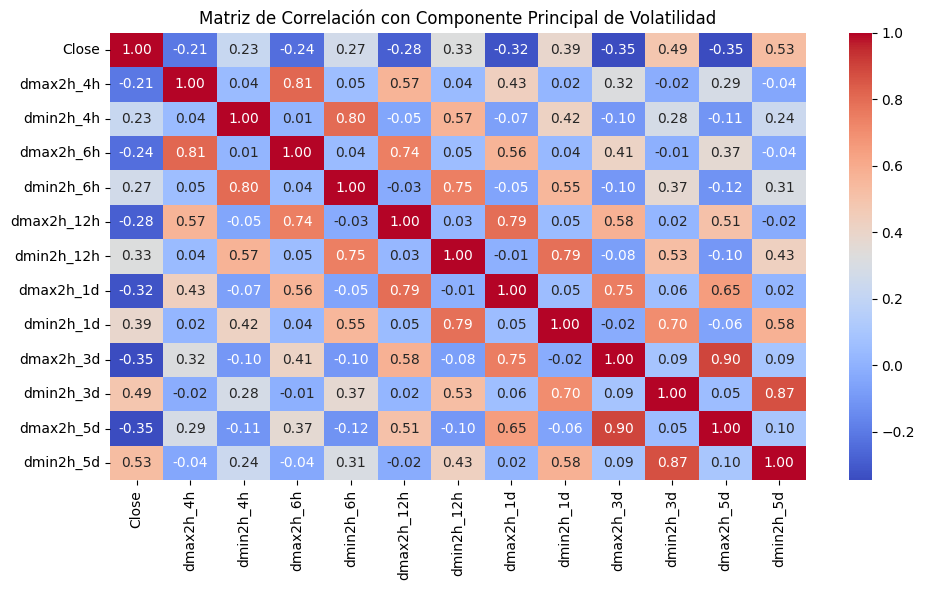

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ['Close','dmax2h_4h', 'dmin2h_4h', 'dmax2h_6h', 'dmin2h_6h', 'dmax2h_12h',
        'dmin2h_12h', 'dmax2h_1d', 'dmin2h_1d', 'dmax2h_3d', 'dmin2h_3d',
        'dmax2h_5d', 'dmin2h_5d']


# Matriz de correlación
correlation_matrix = mf1[variables ].corr()

# Visualización
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Matriz de Correlación con Componente Principal de Volatilidad")
plt.tight_layout()
plt.show()


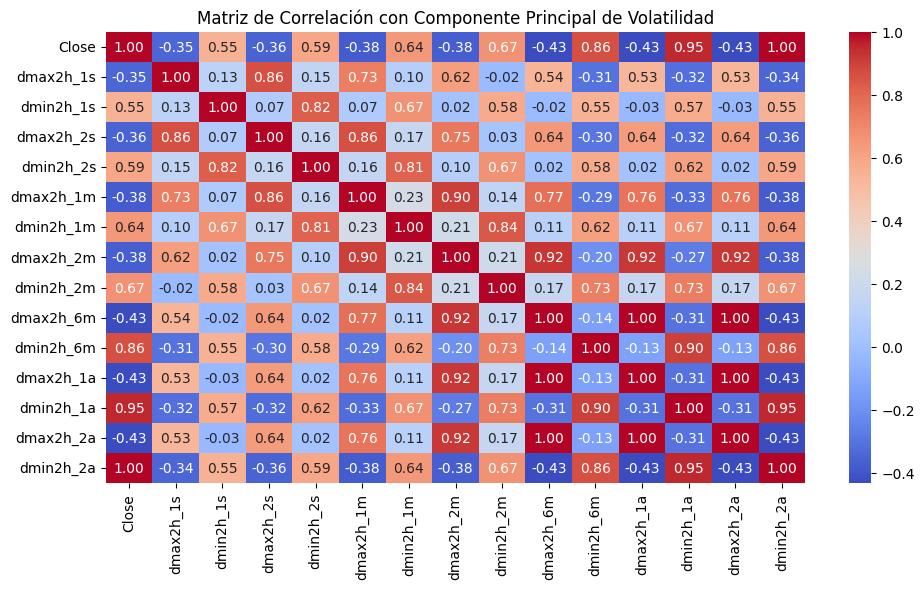

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ['Close', 'dmax2h_1s', 'dmin2h_1s', 'dmax2h_2s', 'dmin2h_2s',
        'dmax2h_1m', 'dmin2h_1m', 'dmax2h_2m', 'dmin2h_2m', 'dmax2h_6m', 'dmin2h_6m',
        'dmax2h_1a', 'dmin2h_1a', 'dmax2h_2a', 'dmin2h_2a']


# Matriz de correlación
correlation_matrix = mf1[variables ].corr()

# Visualización
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Matriz de Correlación con Componente Principal de Volatilidad")
plt.tight_layout()
plt.show()


DMIN/MAX_1d

In [ ]:
# Recorremos todos los tiempos mayores a 5min para construir las diferencias
for nombre, _ in ventanas.items():
    if nombre != "1d" and ventanas[nombre] > ventanas["1d"]:
        mf1[f"dmax1d_{nombre}"] = mf1["Max 1d"] - mf1[f"Max {nombre}"]
        mf1[f"dmin1d_{nombre}"] = mf1["Min 1d"] - mf1[f"Min {nombre}"]

<ipython-input-40-aefcae195111>:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1[f"dmax1d_{nombre}"] = mf1["Max 1d"] - mf1[f"Max {nombre}"]
<ipython-input-40-aefcae195111>:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1[f"dmin1d_{nombre}"] = mf1["Min 1d"] - mf1[f"Min {nombre}"]
<ipython-input-40-aefcae195111>:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) ins

In [ ]:
print(mf1.columns.tolist())

['Datetime', 'Open', 'High', 'Low', 'Close', 'Volume', 'ETH_Open', 'ETH_High', 'ETH_Low', 'ETH_Close', 'ETH_Volume', 'USDT_Open', 'USDT_High', 'USDT_Low', 'USDT_Close', 'USDT_Volume', 'XRP_Open', 'XRP_High', 'XRP_Low', 'XRP_Close', 'XRP_Volume', 'SOL_Open', 'SOL_High', 'SOL_Low', 'SOL_Close', 'SOL_Volume', 'DOGE_Open', 'DOGE_High', 'DOGE_Low', 'DOGE_Close', 'DOGE_Volume', 'SD_80640', 'VB2m', 'SD_5', 'VB5m', 'SD_10', 'VB10m', 'SD_15', 'VB15m', 'SD_60', 'VB1h', 'SD_120', 'VB2h', 'SD_360', 'VB6h', 'SD_720', 'VB12h', 'SD_1440', 'VB1d', 'SD_4320', 'VB3d', 'SD_10080', 'VB1s', 'SD_20160', 'VB2s', 'SD_40320', 'VB1m', 'SD_259200', 'VB6m', 'VoV2m', 'VoV5m', 'VoV10m', 'VoV15m', 'VoV1h', 'VoV2h', 'VoV6h', 'VoV12h', 'VoV1d', 'VoV3d', 'VoV1s', 'VoSD_2', 'VVo2m', 'VoSD_5', 'VVo5m', 'VoSD_10', 'VVo10m', 'VoSD_15', 'VVo15m', 'VoSD_60', 'VVo1h', 'VoSD_120', 'VVo2h', 'VoSD_360', 'VVo6h', 'VoSD_720', 'VVo12h', 'VoSD_1440', 'VVo1d', 'VoSD_4320', 'VVo3d', 'VoSD_10080', 'VVo1s', 'VoC2m', 'VoC5m', 'VoC10m', '

In [ ]:
mf1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1091512 entries, 0 to 1091511
Columns: 273 entries, Datetime to dmin1d_2a
dtypes: datetime64[ns](1), float64(272)
memory usage: 2.2 GB


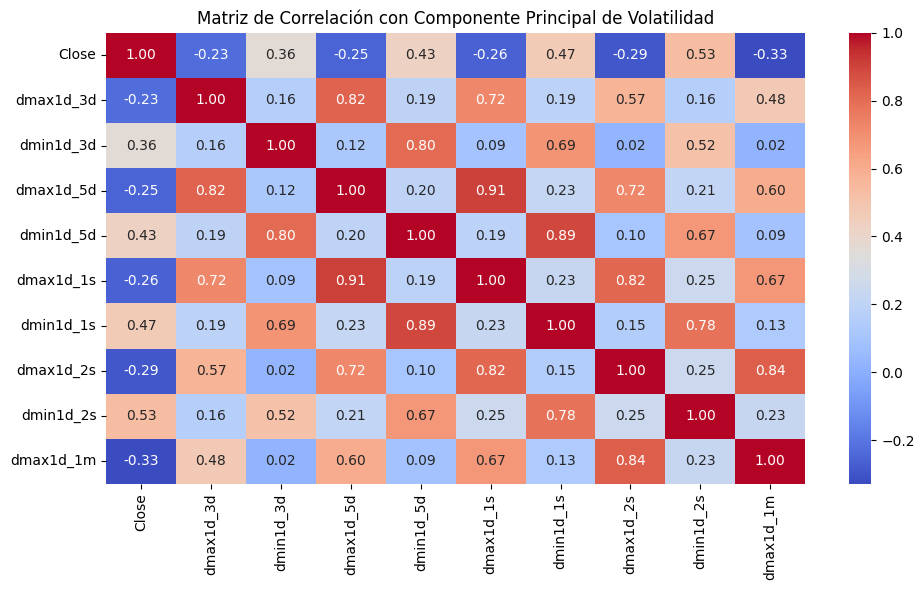

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ['Close','dmax1d_3d', 'dmin1d_3d', 'dmax1d_5d', 'dmin1d_5d',
             'dmax1d_1s', 'dmin1d_1s', 'dmax1d_2s', 'dmin1d_2s', 'dmax1d_1m']

# Matriz de correlación
correlation_matrix = mf1[variables ].corr()

# Visualización
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Matriz de Correlación con Componente Principal de Volatilidad")
plt.tight_layout()
plt.show()


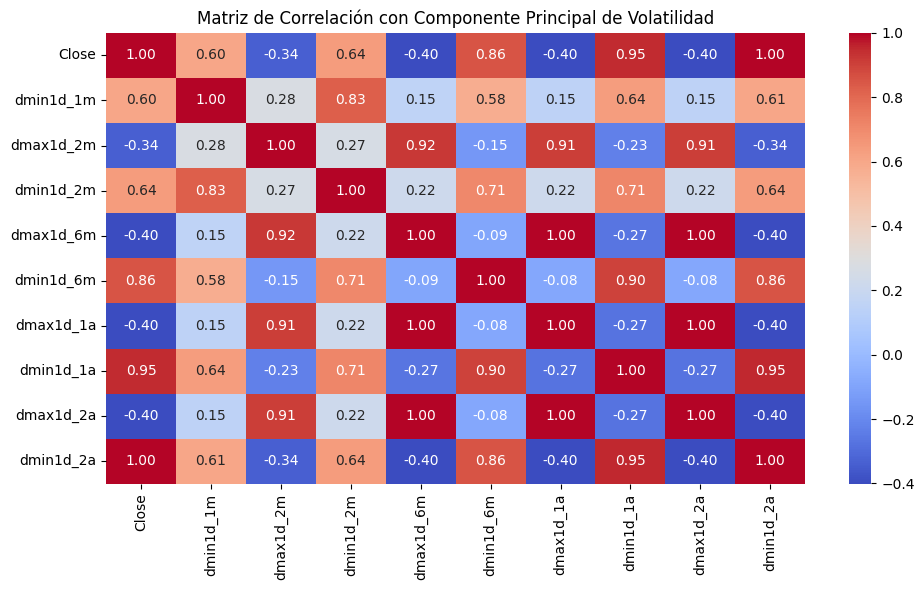

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ['Close', 'dmin1d_1m', 'dmax1d_2m', 'dmin1d_2m', 'dmax1d_6m', 'dmin1d_6m',
             'dmax1d_1a', 'dmin1d_1a', 'dmax1d_2a', 'dmin1d_2a']


# Matriz de correlación
correlation_matrix = mf1[variables ].corr()

# Visualización
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Matriz de Correlación con Componente Principal de Volatilidad")
plt.tight_layout()
plt.show()


# K stocastico

In [ ]:
# Diccionario de ventanas
ventanas_vol = {
    "5": 1, "10": 2, "15": 3, "30": 6, "1h": 12, "2h": 24, "4h": 48, "6h": 72,
    "12h": 144, "1d": 288, "3d": 864, "4d": 1152, "5d": 1440, "1s": 2016, "2s": 4032,
    "1m": 8064, "2m": 16128, "3m": 24192, "4m": 32256, "5m": 40320, "6m": 48384,
    "9m": 72576, "1a": 100800, "2a": 201600, "3a": 302400
}

# Calcular MOM% para cada ventana
for label, n in ventanas_vol.items():
    close_tn = mf1["Close"].shift(n)
    vol_tn = mf1["VB10"].shift(n)
    mom = np.sqrt((mf1["Close"] - close_tn) / close_tn) * ((mf1["VB10"]-mf1["VVo_PCA1_1"]))
    mf1[f"MOM_{label}"] = mom


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)
/tmp/ipython-input-99-3461897089.py:14: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1[f"MOM_{label}"] = mom
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)
/tmp/ipython-input-99-3461897089.py:14: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.

In [ ]:
print(mf1.columns.tolist())

['Datetime', 'High', 'Low', 'Close', 'Volume', 'ETH_Close', 'ETH_Volume', 'USDT_Close', 'USDT_Volume', 'XRP_Close', 'XRP_Volume', 'SOL_Close', 'SOL_Volume', 'DOGE_Close', 'DOGE_Volume', 'VoM', 'DominanciaBTC', 'MC', 'MCM', 'DominanciaMBTC', 'cp2', 'vp2', 'SD_1', 'VB5', 'SD_2', 'VB10', 'SD_3', 'VB15', 'SD_6', 'VB30', 'SD_12', 'VB1h', 'SD_24', 'VB2h', 'SD_48', 'VB4h', 'SD_72', 'VB6h', 'SD_144', 'VB12h', 'SD_288', 'VB1d', 'SD_864', 'VB3d', 'SD_1152', 'VB4d', 'SD_1440', 'VB5d', 'SD_2016', 'VB1s', 'SD_4032', 'VB2s', 'SD_8064', 'VB1m', 'SD_16128', 'VB2m', 'SD_24192', 'VB3m', 'SD_32256', 'VB4m', 'SD_40320', 'VB5m', 'SD_48384', 'VB6m', 'SD_72576', 'VB9m', 'SD_100800', 'VB1a', 'SD_201600', 'VB2a', 'SD_302400', 'VB3a', 'VB_PCA_1', 'VB_PCA_2', 'VB_PCA_3', 'VB_PCA_4', 'B', 'B1', 'QBpc', 'QSD_1', 'VQ5', 'QSD_2', 'VQ10', 'QSD_3', 'VQ15', 'QSD_6', 'VQ30', 'QSD_12', 'VQ1h', 'QSD_24', 'VQ2h', 'QSD_48', 'VQ4h', 'QSD_72', 'VQ6h', 'QSD_144', 'VQ12h', 'QSD_288', 'VQ1d', 'QSD_864', 'VQ3d', 'QSD_1152', 'VQ4d

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ['MOM_10', 'MOM_15', 'MOM_30', 'MOM_1h', 'MOM_2h', 'MOM_4h', 'MOM_6h',
             'MOM_12h', 'MOM_1d', 'MOM_3d', 'MOM_4d', 'MOM_5d', 'MOM_1s', 'MOM_2s',
             'MOM_1m', 'MOM_2m', 'MOM_3m', 'MOM_4m', 'MOM_5m', 'MOM_6m', 'MOM_9m', 'MOM_1a', 'MOM_2a', 'MOM_3a']


# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)


   Variable  Mutual Information
0    MOM_10            0.230377
1    MOM_15            0.185585
23   MOM_3a            0.164557
2    MOM_30            0.146754
20   MOM_9m            0.145126
3    MOM_1h            0.126352
21   MOM_1a            0.126315
19   MOM_6m            0.125847
16   MOM_3m            0.118112
18   MOM_5m            0.117012
4    MOM_2h            0.116185
22   MOM_2a            0.116023
17   MOM_4m            0.114824
5    MOM_4h            0.109368
6    MOM_6h            0.108274
15   MOM_2m            0.105886
13   MOM_2s            0.105300
14   MOM_1m            0.104872
7   MOM_12h            0.103725
8    MOM_1d            0.103550
12   MOM_1s            0.102916
10   MOM_4d            0.102527
11   MOM_5d            0.102500
9    MOM_3d            0.101590


In [ ]:
# "MOM_10"

**RSIV_PCA1**

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ['MOM_15', 'MOM_30', 'MOM_1h']
# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=2)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
for i in range(2):
    mf1.loc[subset.index, f'MOMVo_PCA_{i+1}'] = principal_component[:, i]

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ['MOM_15', 'MOM_30', 'MOM_1h', 'MOMVo_PCA_1', 'MOMVo_PCA_2']
# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)


      Variable  Mutual Information
0       MOM_15            0.186128
1       MOM_30            0.146330
2       MOM_1h            0.127345
3  MOMVo_PCA_1            0.109932
4  MOMVo_PCA_2            0.088758


In [ ]:
variables = ['MOM_15', 'MOM_30', 'MOM_1h']
loadings = pd.Series(pca.components_[0], index=variables)

print("Cargas del primer componente:")
print(loadings.sort_values(ascending=False))

print("\nVarianza explicada por el primer componente:")
print(pca.explained_variance_ratio_[0])


Cargas del primer componente:
RSIV_4h     0.501526
RSIV_6h     0.480623
RSIV_2h     0.454409
RSIV_12h    0.366260
RSIV_1h     0.357761
RSIV_30     0.221011
dtype: float64

Varianza explicada por el primer componente:
0.4735541318259824


In [ ]:
# "MOM_10", 'MOM_15', 'MOM_30', 'MOM_1h'

SHAP

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import xgboost as xgb
import matplotlib.pyplot as plt
import numpy as np

# Variables explicativas y objetivo
features = ["MOM_10", 'MOM_15', 'MOM_30', 'MOM_1h']
target = "B"

# Eliminar filas con NaN
df = mf1[features + [target]].dropna()
df[target] = df[target].astype(int)

# Definir X e y
X = df[features]
y = df[target]

# División: 70% train, 30% temp
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.30, stratify=y, random_state=42)

# División: 20% validation, 10% test (sobre el 30% restante)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=1/3, stratify=y_temp, random_state=42)


# Entrenar modelo multiclase
model = xgb.XGBClassifier(
    objective='multi:softmax',
    num_class=3,
    n_estimators=100,
    max_depth=6,
    learning_rate=0.1,
    use_label_encoder=False,
    eval_metric='mlogloss'
)

model.fit(X_train, y_train)

# --- Evaluación en validation ---
y_val_pred = model.predict(X_val)
print("📊 MATRIZ DE CONFUSIÓN (VALIDATION):")
print(confusion_matrix(y_val, y_val_pred))
print("📄 REPORT (VALIDATION):")
print(classification_report(y_val, y_val_pred))

# --- Evaluación en test ---
y_test_pred = model.predict(X_test)
print("📊 MATRIZ DE CONFUSIÓN (TEST):")
print(confusion_matrix(y_test, y_test_pred))
print("📄 REPORT (TEST):")
print(classification_report(y_test, y_test_pred))


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:03:18] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


📊 MATRIZ DE CONFUSIÓN (VALIDATION):
[[23238  2177    18]
 [ 3196  6726     9]
 [ 3971   889    15]]
📄 REPORT (VALIDATION):
              precision    recall  f1-score   support

           0       0.76      0.91      0.83     25433
           1       0.69      0.68      0.68      9931
           2       0.36      0.00      0.01      4875

    accuracy                           0.75     40239
   macro avg       0.60      0.53      0.51     40239
weighted avg       0.70      0.75      0.70     40239

📊 MATRIZ DE CONFUSIÓN (TEST):
[[11660  1046    11]
 [ 1668  3294     3]
 [ 1963   462    13]]
📄 REPORT (TEST):
              precision    recall  f1-score   support

           0       0.76      0.92      0.83     12717
           1       0.69      0.66      0.67      4965
           2       0.48      0.01      0.01      2438

    accuracy                           0.74     20120
   macro avg       0.64      0.53      0.51     20120
weighted avg       0.71      0.74      0.69     20120



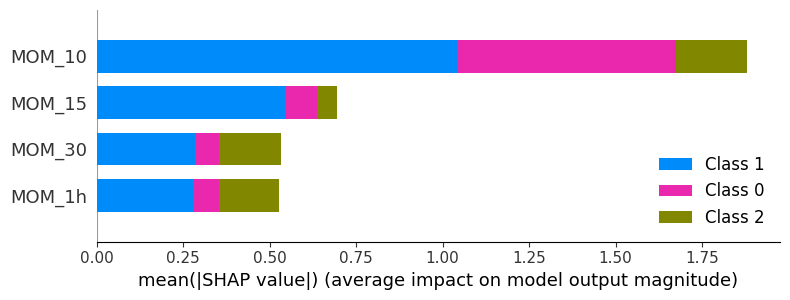

In [ ]:
import shap

explainer = shap.Explainer(model)
shap_values = explainer(X_val)

shap.summary_plot(shap_values, X_val)


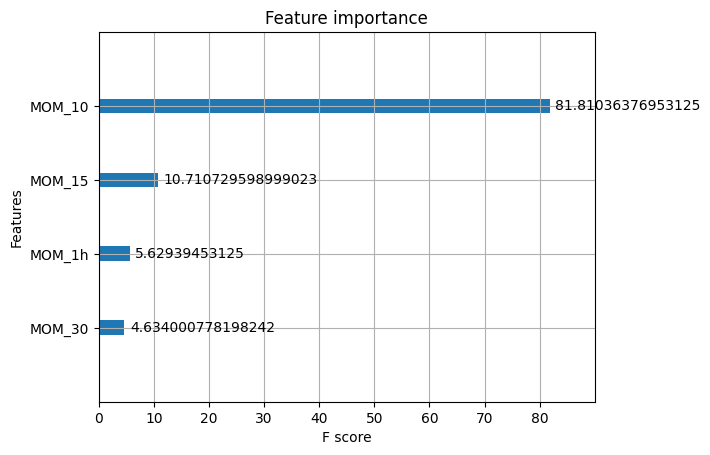

In [ ]:
import matplotlib.pyplot as plt
xgb.plot_importance(model, importance_type='gain')  # gain, weight, cover
plt.show()


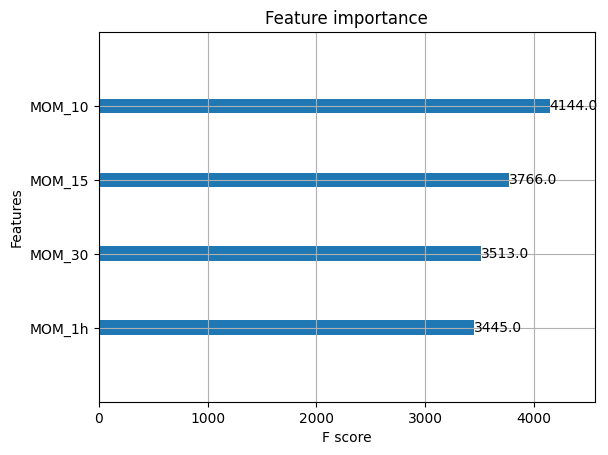

In [ ]:
import matplotlib.pyplot as plt
xgb.plot_importance(model, importance_type='weight')
plt.show()


In [ ]:
#Completito:
# "MOM_10", 'MOM_15', 'MOM_30', 'MOM_1h'
# Optimo:
# "MOM_10", 'MOM_15', 'MOM_1h'

# modelo fuerte en extremo superior, sobre todo en su recall es altimsimo
# probabable uso como modelo binario (varia o no?)
# ESTE ES SUPERIOR AL MOM CLASICO

#K y D stocastico

In [ ]:
print(mf1.columns.tolist())

['Datetime', 'High', 'Low', 'Close', 'Volume', 'ETH_Close', 'ETH_Volume', 'USDT_Close', 'USDT_Volume', 'XRP_Close', 'XRP_Volume', 'SOL_Close', 'SOL_Volume', 'DOGE_Close', 'DOGE_Volume', 'VoM', 'DominanciaBTC', 'SD_1', 'VB5', 'SD_2', 'VB10', 'SD_3', 'VB15', 'SD_6', 'VB30', 'SD_12', 'VB1h', 'SD_24', 'VB2h', 'SD_48', 'VB4h', 'SD_72', 'VB6h', 'SD_144', 'VB12h', 'SD_288', 'VB1d', 'SD_864', 'VB3d', 'SD_1152', 'VB4d', 'SD_1440', 'VB5d', 'SD_2016', 'VB1s', 'SD_4032', 'VB2s', 'SD_8064', 'VB1m', 'SD_16128', 'VB2m', 'SD_24192', 'VB3m', 'SD_32256', 'VB4m', 'SD_40320', 'VB5m', 'SD_48384', 'VB6m', 'SD_72576', 'VB9m', 'SD_100800', 'VB1a', 'SD_201600', 'VB2a', 'SD_302400', 'VB3a', 'P_MC', 'VoSD_1', 'VVo5', 'VoSD_2', 'VVo10', 'VoSD_3', 'VVo15', 'VoSD_6', 'VVo30', 'VoSD_12', 'VVo1h', 'VoSD_24', 'VVo2h', 'VoSD_48', 'VVo4h', 'VoSD_72', 'VVo6h', 'VoSD_144', 'VVo12h', 'VoSD_288', 'VVo1d', 'VoSD_864', 'VVo3d', 'VoSD_1152', 'VVo4d', 'VoSD_1440', 'VVo5d', 'VoSD_2016', 'VVo1s', 'VoSD_4032', 'VVo2s', 'VoSD_8064'

In [ ]:
# Diccionario de ventanas
ventanas_vol = {
    "5": 1, "10": 2, "15": 3, "30": 6, "1h": 12, "2h": 24, "4h": 48, "6h": 72,
    "12h": 144, "1d": 288, "3d": 864, "4d": 1152, "5d": 1440, "1s": 2016, "2s": 4032,
    "1m": 8064, "2m": 16128, "3m": 24192, "4m": 32256, "5m": 40320, "6m": 48384,
    "9m": 72576, "1a": 100800, "2a": 201600, "3a": 302400
}

# Calcular %K logarítmico y su promedio móvil para cada ventana
for label, n in ventanas_vol.items():
    high_tau = mf1['High'].rolling(window=n).max()
    low_tau = mf1['Low'].rolling(window=n).min()
    close_t = mf1['Close']

    num = np.log(close_t) - np.log(low_tau)
    denom = np.log(high_tau) - np.log(low_tau)
    k_log = np.where(denom != 0, num / denom, np.nan)

    # Guardar %K log
    mf1[f'Klog_{label}'] = k_log

    # Calcular promedio móvil simple (%K suavizado)
    mf1[f'Klogs_{label}'] = pd.Series(k_log, index=mf1.index).rolling(window=n).mean()


RIÑO EL ENTERIÑO

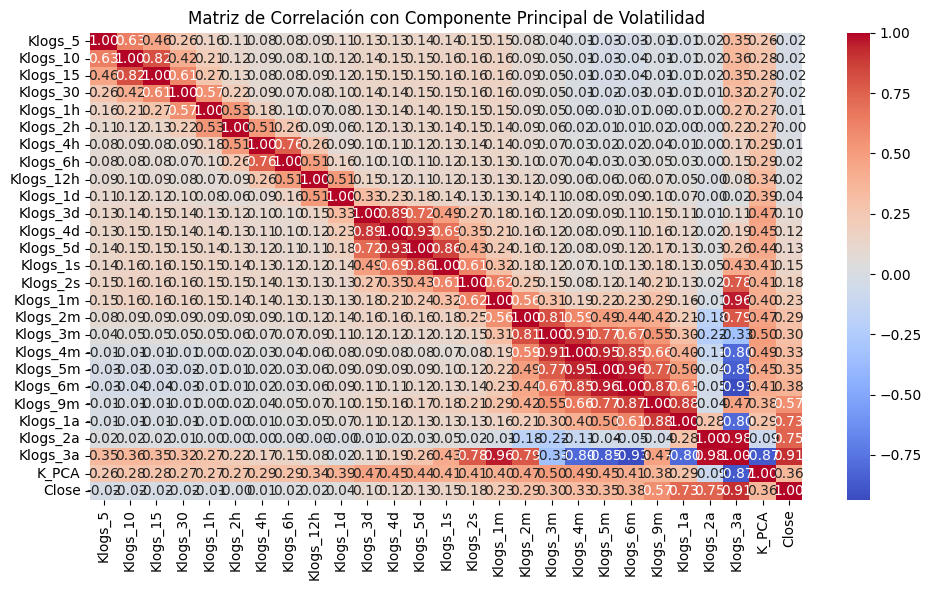

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ['Klogs_5', 'Klogs_10', 'Klogs_15', 'Klogs_30', 'Klogs_1h', 'Klogs_2h', 'Klogs_4h', 'Klogs_6h', 'Klogs_12h', 'Klogs_1d', 'Klogs_3d', 'Klogs_4d', 'Klogs_5d', 'Klogs_1s', 'Klogs_2s', 'Klogs_1m', 'Klogs_2m', 'Klogs_3m', 'Klogs_4m', 'Klogs_5m', 'Klogs_6m', 'Klogs_9m', 'Klogs_1a', 'Klogs_2a', 'Klogs_3a']

# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=1)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
mf1.loc[subset.index, 'K_PCA'] = principal_component.flatten()

# Matriz de correlación
correlation_matrix = mf1[variables + ['K_PCA'] + ['Close']].corr()

# Visualización
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Matriz de Correlación con Componente Principal de Volatilidad")
plt.tight_layout()
plt.show()


In [ ]:
mf1['D_SMA'] = mf1['K'].rolling(window=3, min_periods=1).mean()
mf1['D_EMA'] = mf1['K'].ewm(span=3, adjust=False).mean()
def weighted_moving_average(series, weights=[3, 2, 1]):
    return series.rolling(window=len(weights)).apply(lambda x: sum(x * weights) / sum(weights), raw=True)

mf1['D_WMA'] = weighted_moving_average(mf1['K'], weights=[3, 2, 1])


KeyError: 'K'

In [ ]:
# Matriz de correlación
correlation_matrix = mf1[['D_SMA']+ ['D_EMA'] + ['D_WMA']+ ['K_PCA'] + ['Close']].corr()

# Visualización
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Matriz de Correlación con Componente Principal de Volatilidad")
plt.tight_layout()
plt.show()

In [ ]:
from statsmodels.tsa.stattools import grangercausalitytests

# Asegurate de no tener valores nulos
mf1_clean = mf1[['Close', 'MOM_Energy']].dropna()

# Aplicamos el test con lags hasta 10 (podés ajustarlo)
grangercausalitytests(mf1_clean[['Close', 'MOM_Energy']], maxlag=10, verbose=True)

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.6030  , p=0.0034  , df_denom=46049, df_num=1
ssr based chi2 test:   chi2=8.6036  , p=0.0034  , df=1
likelihood ratio test: chi2=8.6028  , p=0.0034  , df=1
parameter F test:         F=8.6030  , p=0.0034  , df_denom=46049, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.4372  , p=0.0118  , df_denom=46046, df_num=2
ssr based chi2 test:   chi2=8.8754  , p=0.0118  , df=2
likelihood ratio test: chi2=8.8745  , p=0.0118  , df=2
parameter F test:         F=4.4372  , p=0.0118  , df_denom=46046, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.1708  , p=0.0232  , df_denom=46043, df_num=3
ssr based chi2 test:   chi2=9.5137  , p=0.0232  , df=3
likelihood ratio test: chi2=9.5127  , p=0.0232  , df=3
parameter F test:         F=3.1708  , p=0.0232  , df_denom=46043, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.8091  

{np.int64(1): ({'ssr_ftest': (np.float64(8.6030099795291),
    np.float64(0.003357731957162729),
    np.float64(46049.0),
    np.int64(1)),
   'ssr_chi2test': (np.float64(8.603570448376168),
    np.float64(0.003355046109498955),
    np.int64(1)),
   'lrtest': (np.float64(8.602766876341775),
    np.float64(0.0033565267558022293),
    np.int64(1)),
   'params_ftest': (np.float64(8.603009979533446),
    np.float64(0.003357731957162729),
    np.float64(46049.0),
    1.0)},
   array([[0., 1., 0.]])]),
 np.int64(2): ({'ssr_ftest': (np.float64(4.437210762757645),
    np.float64(0.011833944471509789),
    np.float64(46046.0),
    np.int64(2)),
   'ssr_chi2test': (np.float64(8.875385172903284),
    np.float64(0.011823188053989816),
    np.int64(2)),
   'lrtest': (np.float64(8.874530008528382),
    np.float64(0.011828244519550855),
    np.int64(2)),
   'params_ftest': (np.float64(4.437210762757884),
    np.float64(0.011833944471509789),
    np.float64(46046.0),
    2.0)},
   array([[0., 0., 1., 

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Seleccionar las variables
vars = ['Close','MarketEnergy', 'VQ_PCA', "VB_PCA", "MOM_Energy", "C_PCA"]

# Calcular la matriz de correlación
correlation_matrix = mf1[vars].corr()

# Mostrar la matriz de correlación numérica
print("Matriz de correlación numérica:")
print(correlation_matrix)

Matriz de correlación numérica:
                 Close  MarketEnergy    VQ_PCA    VB_PCA  MOM_Energy     C_PCA
Close         1.000000      0.894011 -0.800532  0.830757    0.798480  0.614817
MarketEnergy  0.894011      1.000000 -0.671379  0.831328    0.681341  0.628256
VQ_PCA       -0.800532     -0.671379  1.000000 -0.505979   -0.831260 -0.392938
VB_PCA        0.830757      0.831328 -0.505979  1.000000    0.718728  0.721421
MOM_Energy    0.798480      0.681341 -0.831260  0.718728    1.000000  0.488937
C_PCA         0.614817      0.628256 -0.392938  0.721421    0.488937  1.000000


In [ ]:
!pip install statsmodels

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
import pandas as pd
import numpy as np

# Variables predictoras (sin incluir Close)
X = mf1[['MarketEnergy', 'VQ_PCA', "VB_PCA", "MOM_Energy", "C_PCA"]].copy()

# Eliminar filas con NaN o inf
X = X.replace([np.inf, -np.inf], np.nan).dropna()

# Agregar constante
X = add_constant(X)

# Calcular VIF
vif_data = pd.DataFrame()
vif_data["feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print(vif_data)


        feature        VIF
0         const  18.970168
1  MarketEnergy   4.952490
2        VQ_PCA   5.203736
3        VB_PCA   6.526048
4    MOM_Energy   5.897471
5         C_PCA   2.063339


In [ ]:
X = mf1[['MarketEnergy', 'VQ_PCA', "VB_PCA", "MOM_Energy", "C_PCA"]].dropna()
y = mf1.loc[X.index, 'Close']  # Para alinear índices

X_scaled = StandardScaler().fit_transform(X)
pca = PCA(n_components=2)
components = pca.fit_transform(X_scaled)

print("Explained variance ratio:", pca.explained_variance_ratio_)


Explained variance ratio: [0.709389   0.16395156]


#VQ

In [ ]:
mf1["QBpc"] =  (mf1["Volume"] / mf1["Close"])

In [ ]:
# Definir las ventanas para calcular volatilidad
ventanas_vol = {
    "5": 1,
    "10": 2,
    "15": 3,
    "30": 6,
    "1h": 12,
    "2h": 24,
    "4h": 48,
    "6h": 72,
    "12h": 144,
    "1d": 288,
    "3d": 864,
    "4d": 1152,
    "5d": 1440,
    "1s": 2016,
    "2s": 4032,
    "1m": 8064,
    "2m": 16128,
    "3m": 24192,
    "4m": 32256,
    "5m": 40320,
    "6m": 48384,
    "9m": 72576,
    "1a": 100800,
    "2a": 201600,
    "3a": 302400
}

# Calcular SD y Volatilidad (VB) para cada ventana
for nombre, ventana in ventanas_vol.items():
    Qsd_col = f"QSD_{ventana}"
    Qb_col = f"VQ{nombre}"

    mf1[Qsd_col] = mf1["QBpc"].rolling(window=ventana, min_periods=ventana).std()
    mf1[Qb_col] = mf1[Qsd_col] * np.sqrt(ventana)

/tmp/ipython-input-22-2917034139.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1[Qsd_col] = mf1["QBpc"].rolling(window=ventana, min_periods=ventana).std()
/tmp/ipython-input-22-2917034139.py:36: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1[Qb_col] = mf1[Qsd_col] * np.sqrt(ventana)
/tmp/ipython-input-22-2917034139.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.conca

In [ ]:
print(mf1.columns.tolist())

['Datetime', 'High', 'Low', 'Close', 'Volume', 'ETH_Close', 'ETH_Volume', 'USDT_Close', 'USDT_Volume', 'XRP_Close', 'XRP_Volume', 'SOL_Close', 'SOL_Volume', 'DOGE_Close', 'DOGE_Volume', 'VoM', 'DominanciaBTC', 'MC', 'MCM', 'DominanciaMBTC', 'cp2', 'vp2', 'B', 'B1', 'SD_1', 'VB5', 'SD_2', 'VB10', 'SD_3', 'VB15', 'SD_6', 'VB30', 'SD_12', 'VB1h', 'SD_24', 'VB2h', 'SD_48', 'VB4h', 'SD_72', 'VB6h', 'SD_144', 'VB12h', 'SD_288', 'VB1d', 'SD_864', 'VB3d', 'SD_1152', 'VB4d', 'SD_1440', 'VB5d', 'SD_2016', 'VB1s', 'SD_4032', 'VB2s', 'SD_8064', 'VB1m', 'SD_16128', 'VB2m', 'SD_24192', 'VB3m', 'SD_32256', 'VB4m', 'SD_40320', 'VB5m', 'SD_48384', 'VB6m', 'SD_72576', 'VB9m', 'SD_100800', 'VB1a', 'SD_201600', 'VB2a', 'SD_302400', 'VB3a', 'VB_PCA', 'VBC_PCA', 'VBM_PCA', 'VBC_PCA_1', 'VBC_PCA_2', 'VBC_PCA_3', 'VBC_PCA_4', 'VB_PCA_1', 'VB_PCA_2', 'VB_PCA_3', 'VB_PCA_4', 'QBpc', 'QSD_1', 'VQ5', 'QSD_2', 'VQ10', 'QSD_3', 'VQ15', 'QSD_6', 'VQ30', 'QSD_12', 'VQ1h', 'QSD_24', 'VQ2h', 'QSD_48', 'VQ4h', 'QSD_72',

MCP

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ["VQ5", "VQ10", "VQ15", "VQ30", "VQ1h", "VQ2h", "VQ4h", "VQ6h", "VQ12h", "VQ1d",
 "VQ3d", "VQ4d", "VQ5d", "VQ1s", "VQ2s", "VQ1m", "VQ2m", "VQ3m", "VQ4m", "VQ5m",
 "VQ6m", "VQ9m", "VQ1a", "VQ2a", "VQ3a"]

# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)


   Variable  Mutual Information
16     VQ2m            0.042720
19     VQ5m            0.042581
17     VQ3m            0.042077
18     VQ4m            0.041883
20     VQ6m            0.040867
15     VQ1m            0.040822
21     VQ9m            0.039144
14     VQ2s            0.039007
22     VQ1a            0.037647
24     VQ3a            0.035799
23     VQ2a            0.034759
1      VQ10            0.033810
13     VQ1s            0.033404
2      VQ15            0.033361
3      VQ30            0.031795
4      VQ1h            0.030897
5      VQ2h            0.030879
12     VQ5d            0.028866
6      VQ4h            0.028708
7      VQ6h            0.027512
11     VQ4d            0.026685
8     VQ12h            0.026000
9      VQ1d            0.025850
10     VQ3d            0.025688
0       VQ5            0.000381


In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = [ "VQ2s", "VQ1m", "VQ2m", "VQ3m", "VQ4m", "VQ5m",
 "VQ6m", "VQ9m", "VQ1a"]

# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=4)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
for i in range(4):
    mf1.loc[subset.index, f'VQ_PCA1_{i+1}'] = principal_component[:, i]

/tmp/ipython-input-23-1087363926.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VQ_PCA1_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-23-1087363926.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VQ_PCA1_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-23-1087363926.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once us

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ["VQ10", "VQ15", "VQ30", "VQ1h", "VQ2h", "VQ4h",
   "VQ1s"]

# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=4)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
for i in range(4):
    mf1.loc[subset.index, f'VQ_PCA2_{i+1}'] = principal_component[:, i]

/tmp/ipython-input-107-4162223795.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VQ_PCA2_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-107-4162223795.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, f'VQ_PCA2_{i+1}'] = principal_component[:, i]
/tmp/ipython-input-107-4162223795.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Lista de variables
variables = ["VQ2m", 'VQ_PCA1_1', 'VQ_PCA1_2', 'VQ_PCA1_3', 'VQ_PCA1_4', 'VQ_PCA2_1', 'VQ_PCA2_2', 'VQ_PCA2_3', 'VQ_PCA2_4']
# Preprocesamiento: reemplazo de NaN con 0 (puede ajustar si preferís otra estrategia)
X = mf1[variables].fillna(0)
y = mf1['B'].fillna(1).astype(int)

# Cálculo de información mutua
mi = mutual_info_classif(X, y)

# Mostrar resultados como DataFrame ordenado
mi_df = pd.DataFrame({'Variable': variables, 'Mutual Information': mi})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

print(mi_df)


    Variable  Mutual Information
0       VQ2m            0.042400
1  VQ_PCA1_1            0.032410
2  VQ_PCA1_2            0.030470
5  VQ_PCA2_1            0.029537
3  VQ_PCA1_3            0.029378
4  VQ_PCA1_4            0.023875
8  VQ_PCA2_4            0.022733
6  VQ_PCA2_2            0.022302
7  VQ_PCA2_3            0.019410


In [ ]:
variables = ["VQ10", "VQ15", "VQ30", "VQ1h", "VQ2h", "VQ4h",
   "VQ1s", "VQ2s", "VQ1m", "VQ2m", "VQ3m", "VQ4m", "VQ5m",
 "VQ6m", "VQ9m", "VQ1a", "VQ2a", "VQ3a"]
loadings = pd.Series(pca.components_[0], index=variables)

print("Cargas del primer componente:")
print(loadings.sort_values(ascending=False))

print("\nVarianza explicada por el primer componente:")
print(pca.explained_variance_ratio_[0])


Cargas del primer componente:
VQ3m    0.263197
VQ2m    0.262157
VQ4m    0.261740
VQ5m    0.259552
VQ1m    0.258179
VQ6m    0.257362
VQ2s    0.253930
VQ9m    0.249716
VQ1s    0.248568
VQ1a    0.240678
VQ2a    0.223444
VQ4h    0.221536
VQ2h    0.218462
VQ1h    0.215220
VQ30    0.209588
VQ3a    0.206601
VQ15    0.193087
VQ10    0.172455
dtype: float64

Varianza explicada por el primer componente:
0.6939571199208001


SHAP

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import xgboost as xgb
import matplotlib.pyplot as plt
import numpy as np

# Variables explicativas y objetivo
features =  ["VQ2m", "VQ5m", 'VQ_PCA1_1', 'VQ_PCA1_2', 'VQ_PCA1_3', 'VQ_PCA1_4', 'VQ_PCA2_1', 'VQ_PCA2_2', 'VQ_PCA2_3', 'VQ_PCA2_4']
target = "B"

# Eliminar filas con NaN
df = mf1[features + [target]].dropna()
df[target] = df[target].astype(int)

# Definir X e y
X = df[features]
y = df[target]

# División: 70% train, 30% temp
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.30, stratify=y, random_state=42)

# División: 20% validation, 10% test (sobre el 30% restante)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=1/3, stratify=y_temp, random_state=42)


# Entrenar modelo multiclase
model = xgb.XGBClassifier(
    objective='multi:softmax',
    num_class=3,
    n_estimators=100,
    max_depth=6,
    learning_rate=0.1,
    use_label_encoder=False,
    eval_metric='mlogloss'
)

model.fit(X_train, y_train)

# --- Evaluación en validation ---
y_val_pred = model.predict(X_val)
print("📊 MATRIZ DE CONFUSIÓN (VALIDATION):")
print(confusion_matrix(y_val, y_val_pred))
print("📄 REPORT (VALIDATION):")
print(classification_report(y_val, y_val_pred))

# --- Evaluación en test ---
y_test_pred = model.predict(X_test)
print("📊 MATRIZ DE CONFUSIÓN (TEST):")
print(confusion_matrix(y_test, y_test_pred))
print("📄 REPORT (TEST):")
print(classification_report(y_test, y_test_pred))


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [01:09:36] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


📊 MATRIZ DE CONFUSIÓN (VALIDATION):
[[14254 12477 11979]
 [ 8335 24542  6713]
 [14089 12336 11857]]
📄 REPORT (VALIDATION):
              precision    recall  f1-score   support

           0       0.39      0.37      0.38     38710
           1       0.50      0.62      0.55     39590
           2       0.39      0.31      0.34     38282

    accuracy                           0.43    116582
   macro avg       0.42      0.43      0.42    116582
weighted avg       0.43      0.43      0.43    116582

📊 MATRIZ DE CONFUSIÓN (TEST):
[[ 7129  6255  5971]
 [ 4111 12255  3429]
 [ 7040  6155  5947]]
📄 REPORT (TEST):
              precision    recall  f1-score   support

           0       0.39      0.37      0.38     19355
           1       0.50      0.62      0.55     19795
           2       0.39      0.31      0.34     19142

    accuracy                           0.43     58292
   macro avg       0.42      0.43      0.42     58292
weighted avg       0.43      0.43      0.43     58292



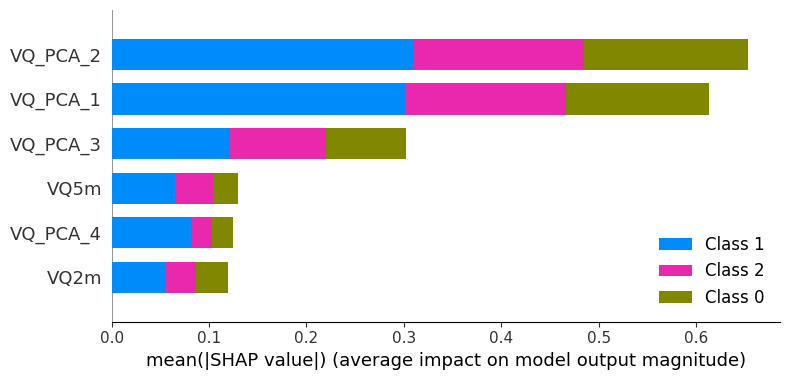

In [ ]:
import shap

explainer = shap.Explainer(model)
shap_values = explainer(X_val)

shap.summary_plot(shap_values, X_val)


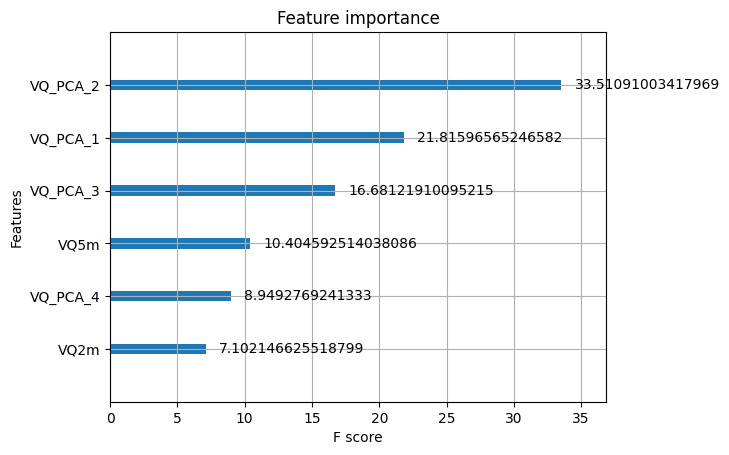

In [ ]:
import matplotlib.pyplot as plt
xgb.plot_importance(model, importance_type='gain')  # gain, weight, cover
plt.show()


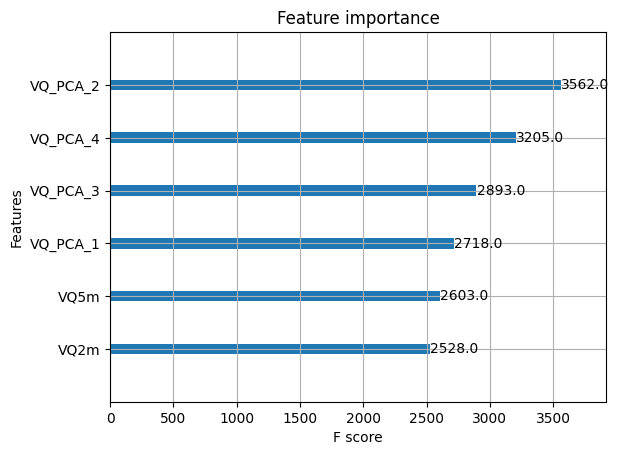

In [ ]:
import matplotlib.pyplot as plt
xgb.plot_importance(model, importance_type='weight')
plt.show()


In [ ]:
#Completito:
# ["VQ2m", "VQ5m", 'VQ_PCA1_1', 'VQ_PCA1_2', 'VQ_PCA1_3', 'VQ_PCA1_4', 'VQ_PCA2_1', 'VQ_PCA2_2', 'VQ_PCA2_3', 'VQ_PCA2_4']
#Optimo:
# ['VQ_PCA_1', 'VQ_PCA_2', 'VQ_PCA_3', 'VQ_PCA_4']

# Modelo de bajo rendimento

#RSI

In [ ]:
print(mf1.columns.tolist())

['Datetime', 'High', 'Low', 'Close', 'Volume', 'ETH_Close', 'ETH_Volume', 'USDT_Close', 'USDT_Volume', 'XRP_Close', 'XRP_Volume', 'SOL_Close', 'SOL_Volume', 'DOGE_Close', 'DOGE_Volume', 'VoM', 'DominanciaBTC', 'SD_1', 'VB5', 'SD_2', 'VB10', 'SD_3', 'VB15', 'SD_6', 'VB30', 'SD_12', 'VB1h', 'SD_24', 'VB2h', 'SD_48', 'VB4h', 'SD_72', 'VB6h', 'SD_144', 'VB12h', 'SD_288', 'VB1d', 'SD_864', 'VB3d', 'SD_1152', 'VB4d', 'SD_1440', 'VB5d', 'SD_2016', 'VB1s', 'SD_4032', 'VB2s', 'SD_8064', 'VB1m', 'SD_16128', 'VB2m', 'SD_24192', 'VB3m', 'SD_32256', 'VB4m', 'SD_40320', 'VB5m', 'SD_48384', 'VB6m', 'SD_72576', 'VB9m', 'SD_100800', 'VB1a', 'SD_201600', 'VB2a', 'SD_302400', 'VB3a', 'VB_PCA', 'c2', 'VoSD_1', 'VVo5', 'VoSD_2', 'VVo10', 'VoSD_3', 'VVo15', 'VoSD_6', 'VVo30', 'VoSD_12', 'VVo1h', 'VoSD_24', 'VVo2h', 'VoSD_48', 'VVo4h', 'VoSD_72', 'VVo6h', 'VoSD_144', 'VVo12h', 'VoSD_288', 'VVo1d', 'VoSD_864', 'VVo3d', 'VoSD_1152', 'VVo4d', 'VoSD_1440', 'VVo5d', 'VoSD_2016', 'VVo1s', 'VoSD_4032', 'VVo2s', 'Vo

In [ ]:
# Delta de Close
delta = mf1['Close'].diff()

# Ganancias y pérdidas
gain = delta.where(delta > 0, 0.0)
loss = -delta.where(delta < 0, 0.0)

# Diccionario de ventanas
ventanas_vol = {
    "5": 1, "10": 2, "15": 3, "30": 6, "1h": 12, "2h": 24, "4h": 48, "6h": 72,
    "12h": 144, "1d": 288, "3d": 864, "4d": 1152, "5d": 1440, "1s": 2016, "2s": 4032,
    "1m": 8064, "2m": 16128, "3m": 24192, "4m": 32256, "5m": 40320, "6m": 48384,
    "9m": 72576, "1a": 100800, "2a": 201600, "3a": 302400
}

# Calcular RSI para cada ventana
for label, n in ventanas_vol.items():
    avg_gain = gain.ewm(span=n, adjust=False).mean()
    avg_loss = loss.ewm(span=n, adjust=False).mean()

    rs = avg_gain / avg_loss
    rsi = 100 - (100 / (1 + rs))

    mf1[f'RSI_{label}'] = rsi


<ipython-input-22-2038587693>:24: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1[f'RSI_{label}'] = rsi


RIÑO EL ENTERIÑO

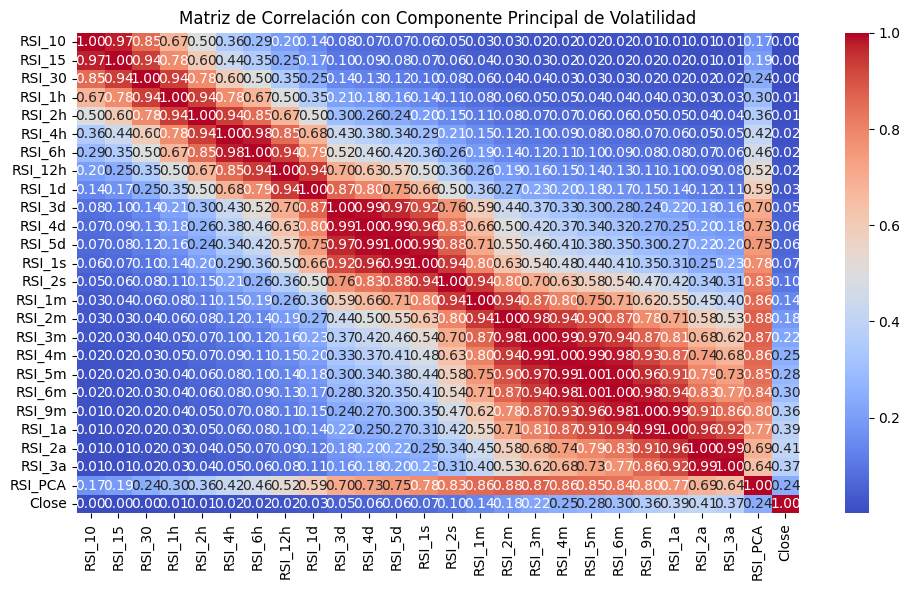

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ['RSI_10', 'RSI_15', 'RSI_30', 'RSI_1h', 'RSI_2h', 'RSI_4h',
             'RSI_6h', 'RSI_12h', 'RSI_1d', 'RSI_3d', 'RSI_4d', 'RSI_5d', 'RSI_1s',
             'RSI_2s', 'RSI_1m', 'RSI_2m', 'RSI_3m', 'RSI_4m', 'RSI_5m', 'RSI_6m',
             'RSI_9m', 'RSI_1a', 'RSI_2a', 'RSI_3a']


# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=1)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
mf1.loc[subset.index, 'RSI_PCA'] = principal_component.flatten()

# Matriz de correlación
correlation_matrix = mf1[variables + ['RSI_PCA'] + ['Close']].corr()

# Visualización
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Matriz de Correlación con Componente Principal de Volatilidad")
plt.tight_layout()
plt.show()


# MARKET POTENTIAL

VOV2

In [ ]:
# VoV2
for nombre in ventanas_vol.keys():
    vb_col = f"VB{nombre}"
    vov_col = f"VoV2{nombre}"

    if vb_col in mf1.columns:
        mf1[vov_col] = np.sqrt( mf1[vb_col]/mf1["Volume"])


<ipython-input-100-875624650>:26: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, 'VoV2_PCA'] = principal_component.flatten()


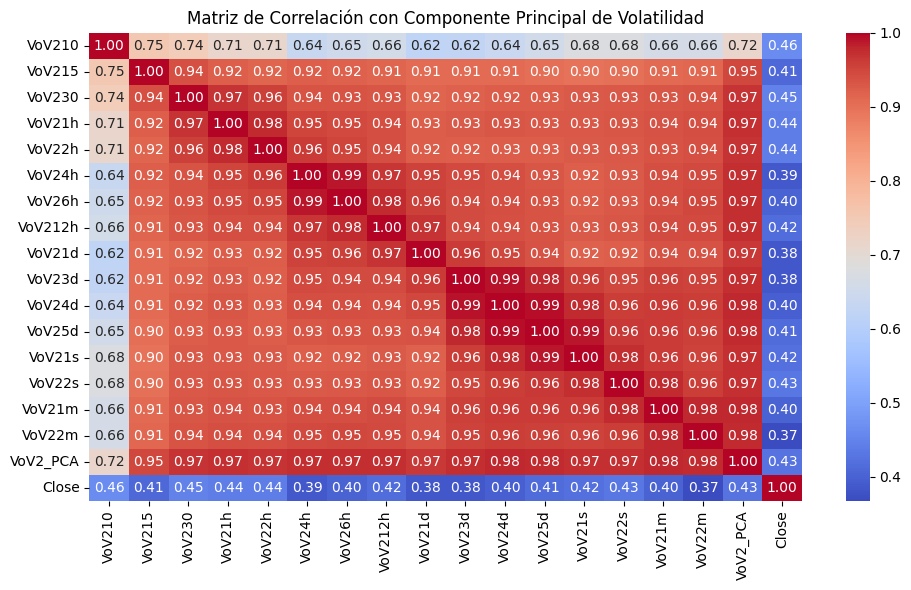

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ["VoV210", "VoV215", "VoV230", "VoV21h", "VoV22h", "VoV24h", "VoV26h", "VoV212h",
 "VoV21d", "VoV23d", "VoV24d", "VoV25d", "VoV21s", "VoV22s", "VoV21m", "VoV22m"]



# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=1)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
mf1.loc[subset.index, 'VoV2_PCA'] = principal_component.flatten()

# Matriz de correlación
correlation_matrix = mf1[variables + ['VoV2_PCA'] + ['Close']].corr()

# Visualización
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Matriz de Correlación con Componente Principal de Volatilidad")
plt.tight_layout()
plt.show()


VOC

In [ ]:
# Crear VoC dinámicamente a partir de las VVo existentes
for nombre in ventanas_vol.keys():
    vvo_col = f"VVo{nombre}"
    voc_col = f"VoC2{nombre}"

    if vvo_col in mf1.columns:
        mf1[voc_col] = np.sqrt(mf1[vvo_col]/mf1["Close"])

<ipython-input-101-2353200347>:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1[voc_col] = np.sqrt(mf1[vvo_col]/mf1["Close"])
<ipython-input-101-2353200347>:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1[voc_col] = np.sqrt(mf1[vvo_col]/mf1["Close"])
<ipython-input-101-2353200347>:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented 

<ipython-input-103-2668809040>:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[subset.index, 'VoC2_PCA'] = principal_component.flatten()


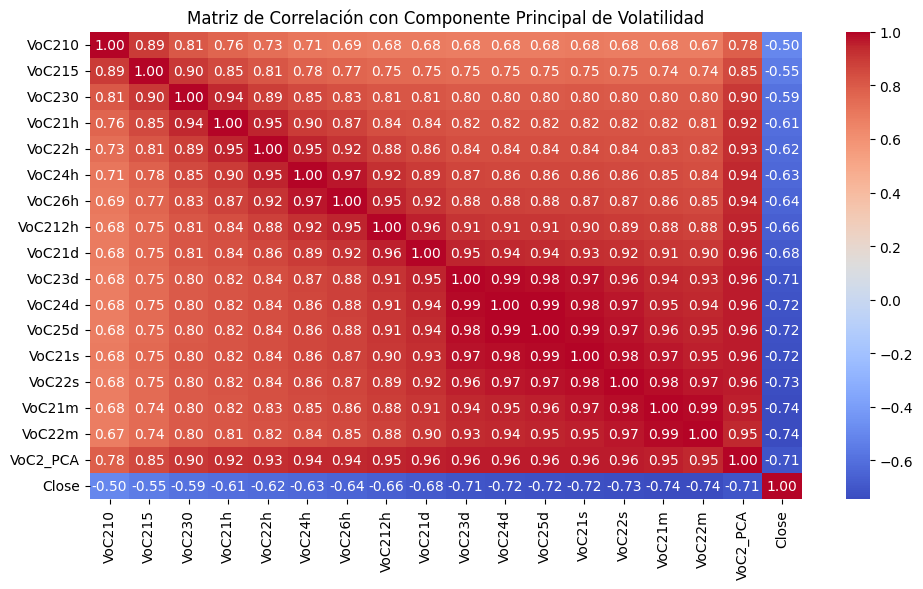

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ["VoC210", "VoC215", "VoC230", "VoC21h", "VoC22h", "VoC24h", "VoC26h", "VoC212h",
 "VoC21d", "VoC23d", "VoC24d", "VoC25d", "VoC21s", "VoC22s", "VoC21m", "VoC22m"]


# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=1)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
mf1.loc[subset.index, 'VoC2_PCA'] = principal_component.flatten()

# Matriz de correlación
correlation_matrix = mf1[variables + ['VoC2_PCA'] + ['Close']].corr()

# Visualización
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Matriz de Correlación con Componente Principal de Volatilidad")
plt.tight_layout()
plt.show()


In [ ]:
from sklearn.linear_model import LinearRegression

# Selección de variables
X = mf1[["VoC2_PCA", "VoV2_PCA"]]
y = mf1["Close"]

# Combinar X e y para eliminar las filas con NaN en cualquiera de ellos
df_temp = pd.concat([X, y], axis=1).dropna()

# Redefinir X e y limpios
X_clean = df_temp[["VoC2_PCA", "VoV2_PCA"]]
y_clean = df_temp["Close"]

# Ajustar modelo lineal
reg = LinearRegression().fit(X_clean, y_clean)

# Coeficientes
alpha = reg.coef_[0]
beta = reg.coef_[1]
intercept = reg.intercept_

# Predecir y guardar MarketEnergy
mf1.loc[X_clean.index, "MarketFluyd"] = reg.predict(X_clean)


<ipython-input-104-3273227161>:23: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1.loc[X_clean.index, "MarketFluyd"] = reg.predict(X_clean)


In [ ]:
from statsmodels.tsa.stattools import grangercausalitytests

# Asegurate de no tener valores nulos
mf1_clean = mf1[['Close', 'MarketFluyd']].dropna()

# Aplicamos el test con lags hasta 10 (podés ajustarlo)
grangercausalitytests(mf1_clean[['Close', 'MarketFluyd']], maxlag=10, verbose=True)


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.6058  , p=0.2051  , df_denom=615453, df_num=1
ssr based chi2 test:   chi2=1.6058  , p=0.2051  , df=1
likelihood ratio test: chi2=1.6058  , p=0.2051  , df=1
parameter F test:         F=1.6058  , p=0.2051  , df_denom=615453, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.7738  , p=0.4613  , df_denom=615450, df_num=2
ssr based chi2 test:   chi2=1.5476  , p=0.4613  , df=2
likelihood ratio test: chi2=1.5476  , p=0.4613  , df=2
parameter F test:         F=0.7738  , p=0.4613  , df_denom=615450, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.5589  , p=0.6421  , df_denom=615447, df_num=3
ssr based chi2 test:   chi2=1.6767  , p=0.6421  , df=3
likelihood ratio test: chi2=1.6767  , p=0.6421  , df=3
parameter F test:         F=0.5589  , p=0.6421  , df_denom=615447, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.

{np.int64(1): ({'ssr_ftest': (np.float64(1.605823589263862),
    np.float64(0.20508035118971557),
    np.float64(615453.0),
    np.int64(1)),
   'ssr_chi2test': (np.float64(1.6058314167840264),
    np.float64(0.20507876778380005),
    np.int64(1)),
   'lrtest': (np.float64(1.6058293217793107),
    np.float64(0.20507906327435468),
    np.int64(1)),
   'params_ftest': (np.float64(1.605823589313609),
    np.float64(0.20508035118971557),
    np.float64(615453.0),
    1.0)},
   array([[0., 1., 0.]])]),
 np.int64(2): ({'ssr_ftest': (np.float64(0.773802404701163),
    np.float64(0.46125629687962166),
    np.float64(615450.0),
    np.int64(2)),
   'ssr_chi2test': (np.float64(1.5476173823555261),
    np.float64(0.4612529485268192),
    np.int64(2)),
   'lrtest': (np.float64(1.5476154359057546),
    np.float64(0.4612533974298857),
    np.int64(2)),
   'params_ftest': (np.float64(0.7738024046125249),
    np.float64(0.4612562969111388),
    np.float64(615450.0),
    2.0)},
   array([[0., 0., 1., 0

# MARKET PRESSURE


In [ ]:
print(mf1.columns.tolist())

['Datetime', 'High', 'Low', 'Close', 'Volume', 'ETH_Close', 'ETH_Volume', 'USDT_Close', 'USDT_Volume', 'XRP_Close', 'XRP_Volume', 'SOL_Close', 'SOL_Volume', 'DOGE_Close', 'DOGE_Volume', 'VoM', 'DominanciaBTC', 'SD_1', 'VB5', 'SD_2', 'VB10', 'SD_3', 'VB15', 'SD_6', 'VB30', 'SD_12', 'VB1h', 'SD_24', 'VB2h', 'SD_48', 'VB4h', 'SD_72', 'VB6h', 'SD_144', 'VB12h', 'SD_288', 'VB1d', 'SD_864', 'VB3d', 'SD_1152', 'VB4d', 'SD_1440', 'VB5d', 'SD_2016', 'VB1s', 'SD_4032', 'VB2s', 'SD_8064', 'VB1m', 'SD_16128', 'VB2m', 'SD_24192', 'VB3m', 'SD_32256', 'VB4m', 'SD_40320', 'VB5m', 'SD_48384', 'VB6m', 'SD_72576', 'VB9m', 'SD_100800', 'VB1a', 'SD_201600', 'VB2a', 'SD_302400', 'VB3a', 'VB_PCA', 'c2', 'VoSD_1', 'VVo5', 'VoSD_2', 'VVo10', 'VoSD_3', 'VVo15', 'VoSD_6', 'VVo30', 'VoSD_12', 'VVo1h', 'VoSD_24', 'VVo2h', 'VoSD_48', 'VVo4h', 'VoSD_72', 'VVo6h', 'VoSD_144', 'VVo12h', 'VoSD_288', 'VVo1d', 'VoSD_864', 'VVo3d', 'VoSD_1152', 'VVo4d', 'VoSD_1440', 'VVo5d', 'VoSD_2016', 'VVo1s', 'VoSD_4032', 'VVo2s', 'Vo

VOV

In [ ]:
mf1["v2"] = mf1["Volume"].diff()

In [ ]:
# 2VoV
for nombre in ventanas_vol.keys():
    vb_col = f"VB{nombre}"
    vov_col = f"2VoV{nombre}"

    if vb_col in mf1.columns:
        mf1[vov_col] = (mf1["v2"]/(mf1["Volume"].shift(1))) * mf1[vb_col]


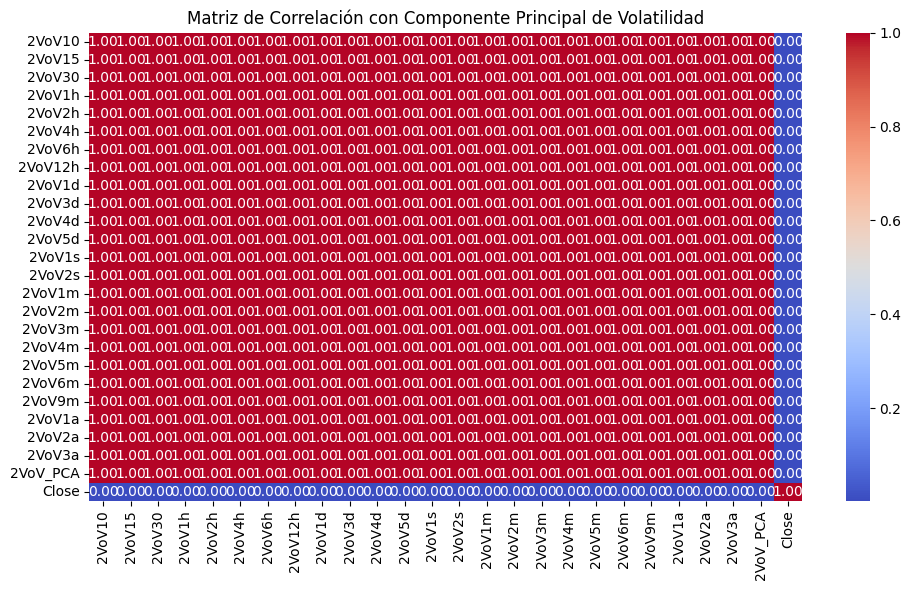

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ["2VoV10", "2VoV15", "2VoV30", "2VoV1h", "2VoV2h", "2VoV4h", "2VoV6h", "2VoV12h",
 "2VoV1d", "2VoV3d", "2VoV4d", "2VoV5d", "2VoV1s", "2VoV2s", "2VoV1m", "2VoV2m", "2VoV3m",
 "2VoV4m", "2VoV5m", "2VoV6m", "2VoV9m", "2VoV1a", "2VoV2a", "2VoV3a"]



# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=1)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
mf1.loc[subset.index, '2VoV_PCA'] = principal_component.flatten()

# Matriz de correlación
correlation_matrix = mf1[variables + ['2VoV_PCA'] + ['Close']].corr()

# Visualización
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Matriz de Correlación con Componente Principal de Volatilidad")
plt.tight_layout()
plt.show()


VOC

In [ ]:
# Crear VoC dinámicamente a partir de las VVo existentes
for nombre in ventanas_vol.keys():
    vvo_col = f"VVo{nombre}"
    voc_col = f"2VoC{nombre}"

    if vvo_col in mf1.columns:
        mf1[voc_col] = (mf1["c2"] /(mf1["Close"].shift(1))) * mf1[vvo_col]

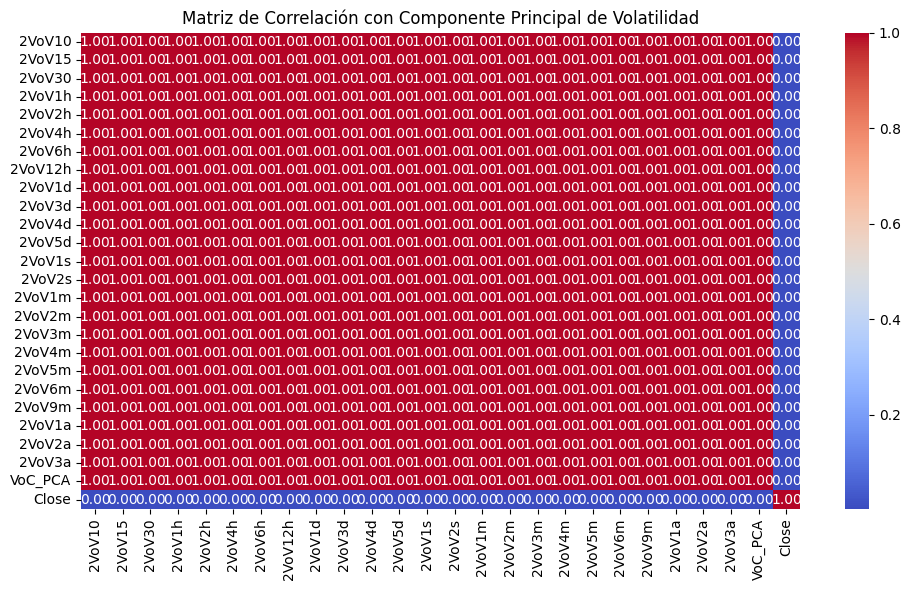

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ["2VoV10", "2VoV15", "2VoV30", "2VoV1h", "2VoV2h", "2VoV4h", "2VoV6h", "2VoV12h",
 "2VoV1d", "2VoV3d", "2VoV4d", "2VoV5d", "2VoV1s", "2VoV2s", "2VoV1m", "2VoV2m", "2VoV3m",
 "2VoV4m", "2VoV5m", "2VoV6m", "2VoV9m", "2VoV1a", "2VoV2a", "2VoV3a"]


# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=1)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
mf1.loc[subset.index, '2VoC_PCA'] = principal_component.flatten()

# Matriz de correlación
correlation_matrix = mf1[variables + ['2VoC_PCA'] + ['Close']].corr()

# Visualización
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Matriz de Correlación con Componente Principal de Volatilidad")
plt.tight_layout()
plt.show()


In [ ]:
from sklearn.linear_model import LinearRegression

# Selección de variables
X = mf1[["VoC_PCA", "VoV_PCA"]]
y = mf1["Close"]

# Combinar X e y para eliminar las filas con NaN en cualquiera de ellos
df_temp = pd.concat([X, y], axis=1).dropna()

# Redefinir X e y limpios
X_clean = df_temp[["VoC_PCA", "VoV_PCA"]]
y_clean = df_temp["Close"]

# Ajustar modelo lineal
reg = LinearRegression().fit(X_clean, y_clean)

# Coeficientes
alpha = reg.coef_[0]
beta = reg.coef_[1]
intercept = reg.intercept_

# Predecir y guardar MarketEnergy
mf1.loc[X_clean.index, "MarketEnergy"] = reg.predict(X_clean)


In [ ]:
from statsmodels.tsa.stattools import grangercausalitytests

# Asegurate de no tener valores nulos
mf1_clean = mf1[['Close', 'MarketEnergy']].dropna()

# Aplicamos el test con lags hasta 10 (podés ajustarlo)
grangercausalitytests(mf1_clean[['Close', 'MarketEnergy']], maxlag=10, verbose=True)


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



Granger Causality
number of lags (no zero) 1
ssr based F test:         F=26.5015 , p=0.0000  , df_denom=629565, df_num=1
ssr based chi2 test:   chi2=26.5016 , p=0.0000  , df=1
likelihood ratio test: chi2=26.5011 , p=0.0000  , df=1
parameter F test:         F=26.5015 , p=0.0000  , df_denom=629565, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=10.6172 , p=0.0000  , df_denom=629562, df_num=2
ssr based chi2 test:   chi2=21.2346 , p=0.0000  , df=2
likelihood ratio test: chi2=21.2343 , p=0.0000  , df=2
parameter F test:         F=10.6172 , p=0.0000  , df_denom=629562, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=8.3480  , p=0.0000  , df_denom=629559, df_num=3
ssr based chi2 test:   chi2=25.0444 , p=0.0000  , df=3
likelihood ratio test: chi2=25.0439 , p=0.0000  , df=3
parameter F test:         F=8.3480  , p=0.0000  , df_denom=629559, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=7.

{np.int64(1): ({'ssr_ftest': (np.float64(26.50150661137648),
    np.float64(2.6341157134212257e-07),
    np.float64(629565.0),
    np.int64(1)),
   'ssr_chi2test': (np.float64(26.501632896223693),
    np.float64(2.6331544310849067e-07),
    np.int64(1)),
   'lrtest': (np.float64(26.50107511971146),
    np.float64(2.63391482801285e-07),
    np.int64(1)),
   'params_ftest': (np.float64(26.501506610639876),
    np.float64(2.6341157144034875e-07),
    np.float64(629565.0),
    1.0)},
   array([[0., 1., 0.]])]),
 np.int64(2): ({'ssr_ftest': (np.float64(10.617240418512303),
    np.float64(2.4494514370682677e-05),
    np.float64(629562.0),
    np.int64(2)),
   'ssr_chi2test': (np.float64(21.234649481898636),
    np.float64(2.44880640453095e-05),
    np.int64(2)),
   'lrtest': (np.float64(21.234291377477348),
    np.float64(2.4492449079874557e-05),
    np.int64(2)),
   'params_ftest': (np.float64(10.617240418943016),
    np.float64(2.449451435827356e-05),
    np.float64(629562.0),
    2.0)},
 

In [ ]:
#neu seu importanchi
mf1["CoB1s"] = mf1["BoC1s"] *mf1["BoV1s"]

In [ ]:
mf1["CoV1s"] = mf1["VoC1s"] *mf1["VoV1s"]

In [ ]:
#volitldad cruzada nein
#mf1["VoB1s"] = mf1["VB1s"] *mf1["VVo1s"]

In [ ]:
mf1["VoB1s"] = np.sqrt(mf1["VB1s"] *mf1["VVo1s"])

In [ ]:
#nao
#mf1["me"] = np.sqrt( mf1["VoC1s"] + mf1["VoV1s"])

In [ ]:
from sklearn.linear_model import LinearRegression

# Selección de variables
X = mf1[["VoC1s", "VoV1s"]]
y = mf1["Close"]

# Combinar X e y para eliminar las filas con NaN en cualquiera de ellos
df_temp = pd.concat([X, y], axis=1).dropna()

# Redefinir X e y limpios
X_clean = df_temp[["VoC1s", "VoV1s"]]
y_clean = df_temp["Close"]

# Ajustar modelo lineal
reg = LinearRegression().fit(X_clean, y_clean)

# Coeficientes
alpha = reg.coef_[0]
beta = reg.coef_[1]
intercept = reg.intercept_

# Predecir y guardar MarketEnergy
mf1.loc[X_clean.index, "MarketEnergy"] = reg.predict(X_clean)


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Seleccionar las variables
vars = ['Close','MarketEnergy', 'VQ_PCA', "VB_PCA"]

# Calcular la matriz de correlación
correlation_matrix = mf1[vars].corr()

# Mostrar la matriz de correlación numérica
print("Matriz de correlación numérica:")
print(correlation_matrix)

Matriz de correlación numérica:
                 Close  MarketEnergy    VQ_PCA    VB_PCA
Close         1.000000      0.826408 -0.715992  0.722557
MarketEnergy  0.826408      1.000000 -0.478681  0.748812
VQ_PCA       -0.715992     -0.478681  1.000000 -0.331880
VB_PCA        0.722557      0.748812 -0.331880  1.000000


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Seleccionar las variables
vars = ['Close','VoC_PCA', "VVo_PCA"]

# Calcular la matriz de correlación
correlation_matrix = mf1[vars].corr()

# Mostrar la matriz de correlación numérica
print("Matriz de correlación numérica:")
print(correlation_matrix)

Matriz de correlación numérica:
            Close   VoC_PCA   VVo_PCA
Close    1.000000  0.841504 -0.715992
VoC_PCA  0.841504  1.000000 -0.321948
VVo_PCA -0.715992 -0.321948  1.000000


In [ ]:
!pip install statsmodels

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
import pandas as pd
import numpy as np

# Variables predictoras (sin incluir Close)
X = mf1[['MarketEnergy', 'VQ_PCA', "VB_PCA"]].copy()

# Eliminar filas con NaN o inf
X = X.replace([np.inf, -np.inf], np.nan).dropna()

# Agregar constante
X = add_constant(X)

# Calcular VIF
vif_data = pd.DataFrame()
vif_data["feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print(vif_data)


        feature        VIF
0         const  18.231276
1  MarketEnergy   3.978009
2        VQ_PCA   1.325353
3        VB_PCA   3.446075


In [ ]:
X = mf1[['MarketEnergy', 'VQ_PCA', "VB_PCA"]].dropna()
y = mf1.loc[X.index, 'Close']  # Para alinear índices

X_scaled = StandardScaler().fit_transform(X)
pca = PCA(n_components=2)
components = pca.fit_transform(X_scaled)

print("Explained variance ratio:", pca.explained_variance_ratio_)


Explained variance ratio: [0.71023594 0.24145188]


#EMA

MEDIAS MOVILES EXPONENCIALES y MACD

In [ ]:
ema_spans = {
    "5": 1,
    "10": 2,
    "15": 3,
    "30": 6,
    "1h": 12,
    "2h": 24,
    "4h": 48,
    "6h": 72,
    "12h": 144,
    "1d": 288,
    "3d": 864,
    "4d": 1152,
    "5d": 1440,
    "1s": 2016,
    "2s": 4032,
    "1m": 8064,
    "2m": 16128,
    "3m": 24192,
    "4m": 32256,
    "5m": 40320,
    "6m": 48384,
    "9m": 72576,
    "1a": 100800,
    "2a": 201600,
    "3a": 302400
}

# Calcular cada EMA
for label, span in ema_spans.items():
    mf1[f"EMA_{label}"] = mf1["Close"].ewm(span=span, adjust=False).mean()


<ipython-input-112-3798316204>:31: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1[f"EMA_{label}"] = mf1["Close"].ewm(span=span, adjust=False).mean()
<ipython-input-112-3798316204>:31: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1[f"EMA_{label}"] = mf1["Close"].ewm(span=span, adjust=False).mean()
<ipython-input-112-3798316204>:31: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.co

<ipython-input-113-2762062325>:27: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[-5.59103523 -5.59114021 -5.59135414 ... 12.78305969 12.78281533
 12.78307337]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  mf1.loc[subset.index, 'VoV2_PCA'] = principal_component.flatten()


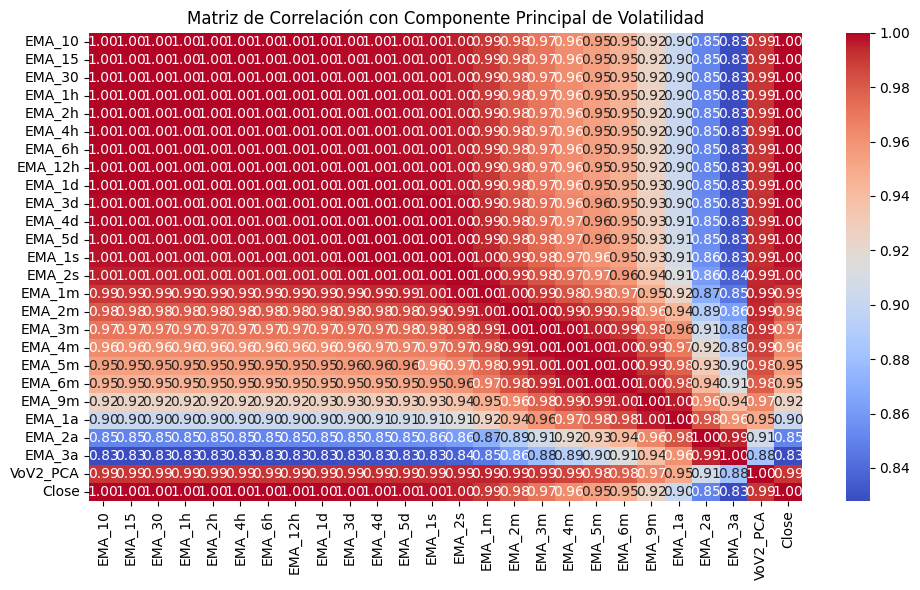

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ["EMA_10", "EMA_15", "EMA_30", "EMA_1h", "EMA_2h", "EMA_4h", "EMA_6h", "EMA_12h",
 "EMA_1d", "EMA_3d", "EMA_4d", "EMA_5d", "EMA_1s", "EMA_2s", "EMA_1m", "EMA_2m",
 "EMA_3m", "EMA_4m", "EMA_5m", "EMA_6m", "EMA_9m", "EMA_1a", "EMA_2a", "EMA_3a"]



# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=1)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
mf1.loc[subset.index, 'VoV2_PCA'] = principal_component.flatten()

# Matriz de correlación
correlation_matrix = mf1[variables + ['VoV2_PCA'] + ['Close']].corr()

# Visualización
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Matriz de Correlación con Componente Principal de Volatilidad")
plt.tight_layout()
plt.show()


In [ ]:
# Bases para las que queremos calcular el MACD
bases = ["5", "15", "1h"]

# Generar MACD y Señal para cada base comparada con EMAs de plazos mayores
for base in bases:
    base_span = ema_spans[base]
    for label, span in ema_spans.items():
        if span > base_span:
            macd_col = f"MACD_{base}_{label}"
            signal_col = f"Señal_{base}_{label}"
            mf1[macd_col] = mf1[f"EMA_{base}"] - mf1[f"EMA_{label}"]
            mf1[signal_col] = mf1[macd_col].ewm(span=9, adjust=False).mean()


<ipython-input-114-517551141>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1[macd_col] = mf1[f"EMA_{base}"] - mf1[f"EMA_{label}"]
<ipython-input-114-517551141>:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mf1[signal_col] = mf1[macd_col].ewm(span=9, adjust=False).mean()
<ipython-input-114-517551141>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. T

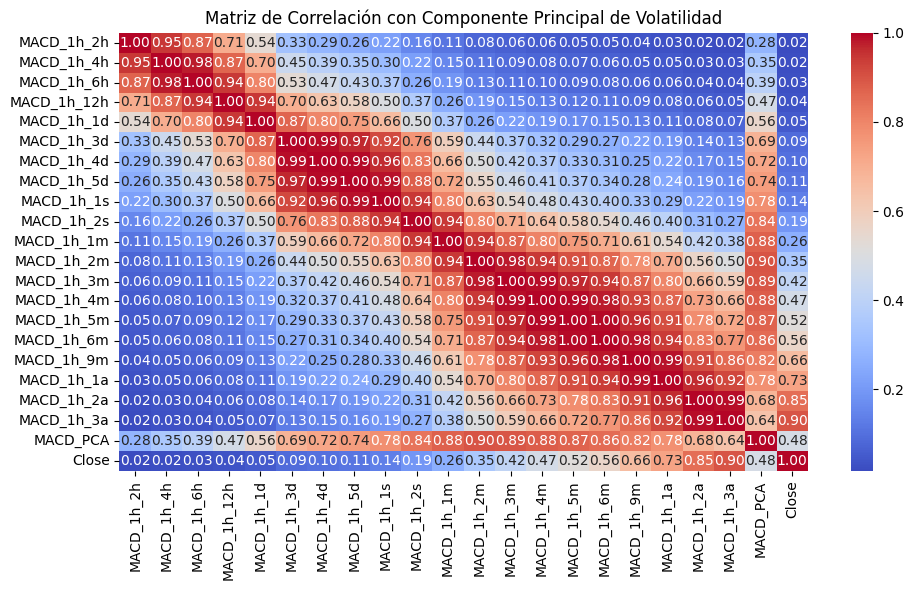

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ["MACD_1h_2h", "MACD_1h_4h", "MACD_1h_6h", "MACD_1h_12h", "MACD_1h_1d", "MACD_1h_3d",
 "MACD_1h_4d", "MACD_1h_5d", "MACD_1h_1s", "MACD_1h_2s", "MACD_1h_1m", "MACD_1h_2m",
 "MACD_1h_3m", "MACD_1h_4m", "MACD_1h_5m", "MACD_1h_6m", "MACD_1h_9m", "MACD_1h_1a",
 "MACD_1h_2a", "MACD_1h_3a"]






# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=1)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
mf1.loc[subset.index, 'MACD_PCA'] = principal_component.flatten()

# Matriz de correlación
correlation_matrix = mf1[variables + ['MACD_PCA'] + ['Close']].corr()

# Visualización
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Matriz de Correlación con Componente Principal de Volatilidad")
plt.tight_layout()
plt.show()


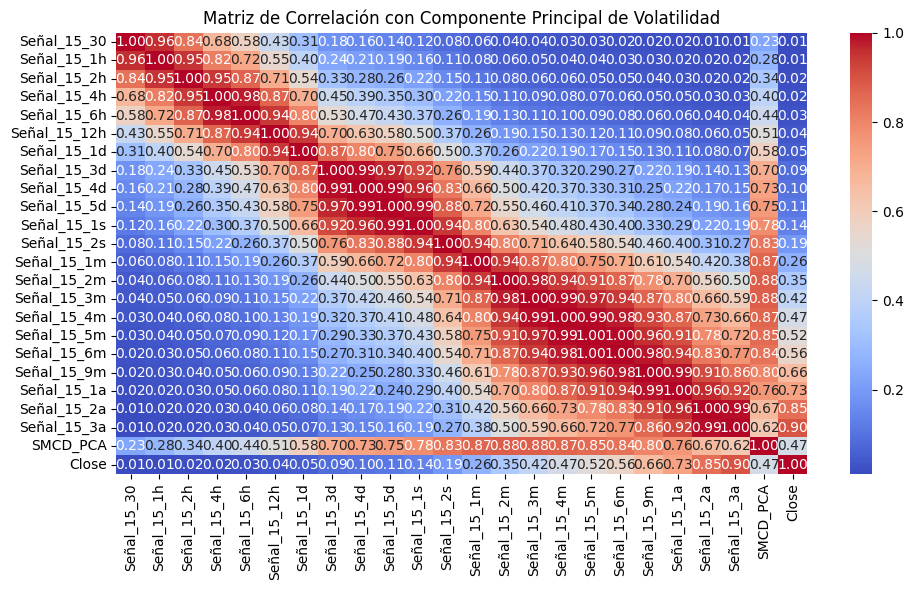

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = ["Señal_15_30", "Señal_15_1h", "Señal_15_2h", "Señal_15_4h", "Señal_15_6h", "Señal_15_12h",
 "Señal_15_1d", "Señal_15_3d", "Señal_15_4d", "Señal_15_5d", "Señal_15_1s", "Señal_15_2s",
 "Señal_15_1m", "Señal_15_2m", "Señal_15_3m", "Señal_15_4m", "Señal_15_5m", "Señal_15_6m",
 "Señal_15_9m", "Señal_15_1a", "Señal_15_2a", "Señal_15_3a"]




# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=1)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
mf1.loc[subset.index, 'SMCD_PCA'] = principal_component.flatten()

# Matriz de correlación
correlation_matrix = mf1[variables + ['SMCD_PCA'] + ['Close']].corr()

# Visualización
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Matriz de Correlación con Componente Principal de Volatilidad")
plt.tight_layout()
plt.show()


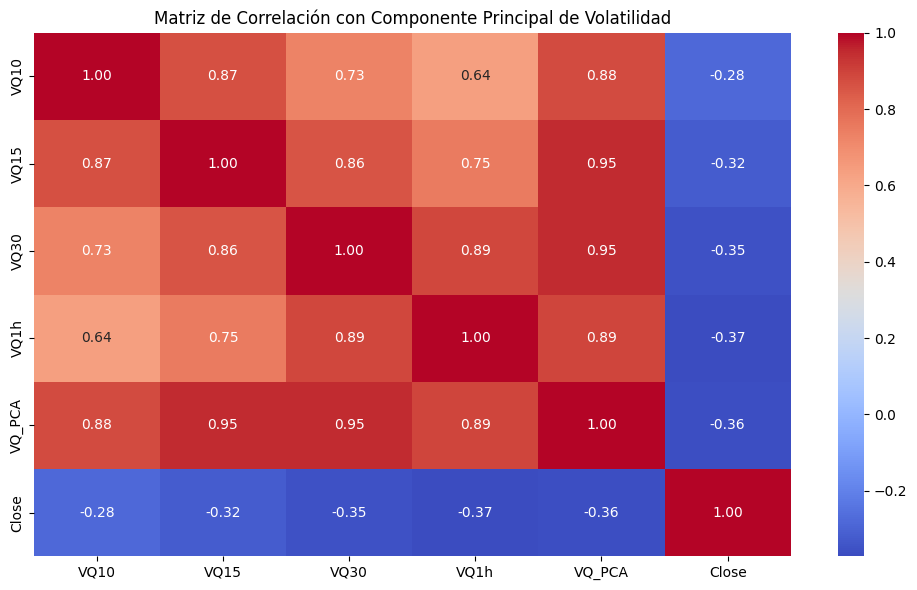

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de volatilidad
variables = [ "VQ10", "VQ15", "VQ30", "VQ1h"]
# Eliminar filas con NaN en esas columnas
subset = mf1[variables].dropna()

# Normalizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(subset)

# PCA
pca = PCA(n_components=1)
principal_component = pca.fit_transform(X_scaled)

# Insertar el componente en el dataframe original (manteniendo el índice correcto)
mf1.loc[subset.index, 'VQ_PCA'] = principal_component.flatten()

# Matriz de correlación
correlation_matrix = mf1[variables + ['VQ_PCA'] + ['Close']].corr()

# Visualización
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Matriz de Correlación con Componente Principal de Volatilidad")
plt.tight_layout()
plt.show()


# NORMALIZACION DE DATOS

In [ ]:
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler

# Inicialización de escaladores
standard_cols = ['High', 'Low', 'Close', 'ETH_Close', 'USDT_Close', 'XRP_Close', 'SOL_Close', 'DOGE_Close']
robust_cols = ['Volume', 'ETH_Volume', 'USDT_Volume', 'XRP_Volume', 'SOL_Volume', 'DOGE_Volume', 'VoM']
minmax_cols = ['DominanciaBTC']

# Crear copias de los escaladores
standard_scaler = StandardScaler()
robust_scaler = RobustScaler()
minmax_scaler = MinMaxScaler(feature_range=(-1, 1))  # para preservar el signo

# Aplicar transformaciones sobre dlmf1
dlmf1[standard_cols] = standard_scaler.fit_transform(dlmf1[standard_cols])
dlmf1[robust_cols] = robust_scaler.fit_transform(dlmf1[robust_cols])
dlmf1[minmax_cols] = minmax_scaler.fit_transform(dlmf1[minmax_cols])


In [ ]:
from sklearn.preprocessing import StandardScaler, RobustScaler

robust_cols_p2 = [col for col in dlmf1.columns if 'Max' in col or 'Min' in col]
robust_scaler_p2 = RobustScaler()
dlmf1[robust_cols_p2] = robust_scaler_p2.fit_transform(dlmf1[robust_cols_p2])


In [ ]:
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler

robust_cols_p3 = [col for col in dlmf1.columns if col.startswith('VB')]
minmax_cols_p3 = [col for col in dlmf1.columns if col.startswith('EMA')]

scaler_robust_p3 = RobustScaler()
scaler_minmax_p3 = MinMaxScaler(feature_range=(-1, 1))

dlmf1[robust_cols_p3] = scaler_robust_p3.fit_transform(dlmf1[robust_cols_p3])
dlmf1[minmax_cols_p3] = scaler_minmax_p3.fit_transform(dlmf1[minmax_cols_p3])


In [ ]:
#ACA POR error humano p3=p4 por lo que se pasa directamente a p5

In [ ]:
from sklearn.preprocessing import StandardScaler, RobustScaler

standard_cols_p5 = ['P_MC']
robust_cols_p5 = [col for col in dlmf1.columns if 'MACD' in col or 'Señal' in col or 'His' in col]

scaler_std_p5 = StandardScaler()
scaler_robust_p5 = RobustScaler()

dlmf1[standard_cols_p5] = scaler_std_p5.fit_transform(dlmf1[standard_cols_p5])
dlmf1[robust_cols_p5] = scaler_robust_p5.fit_transform(dlmf1[robust_cols_p5])


In [ ]:
from sklearn.preprocessing import StandardScaler, RobustScaler


robust_cols_p6 = [col for col in dlmf1.columns if col.startswith('VoV')]
binary_or_unchanged_cols_p6 = [col for col in dlmf1.columns if 'Vol Max' in col or 'Vol Min' in col]

scaler_robust_p6 = RobustScaler()

dlmf1[robust_cols_p6] = scaler_robust_p6.fit_transform(dlmf1[robust_cols_p6])

# Si en algún punto querés transformar las columnas de volumen a binario:
# for col in binary_or_unchanged_cols_p6:
#     dlmf1[col] = (dlmf1[col] != 0).astype(int)


In [ ]:
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler

robust_cols_p7 = [col for col in dlmf1.columns if col.startswith('VoSD') or col.startswith('VVo')]
minmax_cols_p7 = [col for col in dlmf1.columns if col.startswith('VoC')]

scaler_robust_p7 = RobustScaler()
scaler_minmax_p7 = MinMaxScaler(feature_range=(-1, 1))

dlmf1[robust_cols_p7] = scaler_robust_p7.fit_transform(dlmf1[robust_cols_p7])
dlmf1[minmax_cols_p7] = scaler_minmax_p7.fit_transform(dlmf1[minmax_cols_p7])


In [ ]:
dlmf1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 425088 entries, 34560 to 459647
Columns: 110 entries, Datetime to c2
dtypes: float32(109), timedelta64[ns](1)
memory usage: 183.2 MB


# MERGE

In [ ]:
# Merge asof por Datetime, tomando último valor disponible (ideal para mercados cerrados)
dlmf1 = pd.merge_asof(
    dlmf1.sort_values("Datetime"),
    mfusd[["Datetime",  "RSFX_USD"]],
    on="Datetime",
    direction="backward"
)

dlmf1 = pd.merge_asof(
    dlmf1.sort_values("Datetime"),
    mfeur[["Datetime", "RSFX_EUR"]],
    on="Datetime",
    direction="backward"
)

dlmf1 = pd.merge_asof(
    dlmf1.sort_values("Datetime"),
    mfchf[["Datetime", "RSFX_CHF"]],
    on="Datetime",
    direction="backward"
)

In [ ]:
# Merge asof por Datetime, tomando último valor disponible (ideal para mercados cerrados)
mf1 = pd.merge_asof(
    mf1.sort_values("Datetime"),
    mfusd[["Datetime",  "RSFX_USD"]],
    on="Datetime",
    direction="backward"
)

mf1 = pd.merge_asof(
    mf1.sort_values("Datetime"),
    mfeur[["Datetime", "RSFX_EUR"]],
    on="Datetime",
    direction="backward"
)

mf1 = pd.merge_asof(
    mf1.sort_values("Datetime"),
    mfchf[["Datetime", "RSFX_CHF"]],
    on="Datetime",
    direction="backward"
)

In [ ]:
# Merge asof por Datetime, tomando último valor disponible (ideal para mercados cerrados)
mf1 = pd.merge_asof(
    mf1.sort_values("Datetime"),
    mfusd[["Datetime", "Close_EUR"]],
    on="Datetime",
    direction="backward"
)

mf1 = pd.merge_asof(
    mf1.sort_values("Datetime"),
    mfeur[["Datetime", "Close_USD"]],
    on="Datetime",
    direction="backward"
)

mf1 = pd.merge_asof(
    mf1.sort_values("Datetime"),
    mfchf[["Datetime", "Close_USD"]],
    on="Datetime",
    direction="backward"
)

MergeError: Passing 'suffixes' which cause duplicate columns {'Close_USD_x'} is not allowed.

In [ ]:
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler

standard_cols_p8 = ['RSFX_USD', 'RSFX_EUR', 'RSFX_CHF']
minmax_cols_p8 = [col for col in dlmf1.columns if col.startswith('QSD') or col.startswith('VQ') or col == 'QBpc']
robust_cols_p8 = ['c2']

scaler_std_p8 = StandardScaler()
scaler_minmax_p8 = MinMaxScaler(feature_range=(-1, 1))
scaler_robust_p8 = RobustScaler()

dlmf1[standard_cols_p8] = scaler_std_p8.fit_transform(dlmf1[standard_cols_p8])
dlmf1[minmax_cols_p8] = scaler_minmax_p8.fit_transform(dlmf1[minmax_cols_p8])
dlmf1[robust_cols_p8] = scaler_robust_p8.fit_transform(dlmf1[robust_cols_p8])


In [ ]:
dlmf1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 967264 entries, 0 to 967263
Columns: 198 entries, Datetime to RSFX_CHF
dtypes: datetime64[ns](1), float32(193), float64(4)
memory usage: 749.0 MB


In [ ]:
bin.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1049649 entries, 0 to 1049648
Data columns (total 88 columns):
 #   Column           Non-Null Count    Dtype         
---  ------           --------------    -----         
 0   Datetime         1049649 non-null  datetime64[ns]
 1   Volume           1049343 non-null  float32       
 2   Close            1049343 non-null  float32       
 3   delta_close_t1   1049076 non-null  float32       
 4   BT1P10           1049076 non-null  category      
 5   BT1P5            1049076 non-null  category      
 6   BT1P4            1049076 non-null  category      
 7   BT1P3            1049076 non-null  category      
 8   delta_close_t2   1049068 non-null  float32       
 9   BT2P10           1049068 non-null  category      
 10  BT2P5            1049068 non-null  category      
 11  BT2P4            1049068 non-null  category      
 12  BT2P3            1049068 non-null  category      
 13  delta_close_t3   1049070 non-null  float32       
 14  BT

In [ ]:
dlmf1.info()

DMINT/DMAXT

# CORR

MF1

In [ ]:
print(mf1.columns.tolist())

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Seleccionar las variables
vars = ['Close', "VB_PCA", 'MarketEnergy', 'VoE_PCA', "VVo_PCA", "C_PCA"]

# Calcular la matriz de correlación
correlation_matrix = mf1[vars].corr()

# Mostrar la matriz de correlación numérica
print("Matriz de correlación numérica:")
print(correlation_matrix)

Matriz de correlación numérica:
                 Close    VB_PCA  MarketEnergy   VoE_PCA   VVo_PCA     C_PCA
Close         1.000000  0.722557      0.826408 -0.671769 -0.715992  0.614817
VB_PCA        0.722557  1.000000      0.748812 -0.269832 -0.331880  0.680001
MarketEnergy  0.826408  0.748812      1.000000 -0.438233 -0.478681  0.534008
VoE_PCA      -0.671769 -0.269832     -0.438233  1.000000  0.994339 -0.237248
VVo_PCA      -0.715992 -0.331880     -0.478681  0.994339  1.000000 -0.272713
C_PCA         0.614817  0.680001      0.534008 -0.237248 -0.272713  1.000000


In [ ]:
!pip install statsmodels

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
import pandas as pd
import numpy as np

# Variables predictoras (sin incluir Close)
X = mf1[["VB_PCA", 'MarketEnergy', 'VoE_PCA', "VVo_PCA", "C_PCA"]].copy()

# Eliminar filas con NaN o inf
X = X.replace([np.inf, -np.inf], np.nan).dropna()

# Agregar constante
X = add_constant(X)

# Calcular VIF
vif_data = pd.DataFrame()
vif_data["feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print(vif_data)


        feature        VIF
0         const  28.696421
1        VB_PCA   9.484186
2  MarketEnergy   7.351452
3       VoE_PCA  15.977752
4        VQ_PCA   2.703507
5         C_PCA   2.120531


In [ ]:
X = mf1[[ "VB_PCA", 'MarketEnergy',  "VVo_PCA", "C_PCA"]].dropna()
y = mf1.loc[X.index, 'Close']  # Para alinear índices

X_scaled = StandardScaler().fit_transform(X)
pca = PCA(n_components=2)
components = pca.fit_transform(X_scaled)

print("Explained variance ratio:", pca.explained_variance_ratio_)


Explained variance ratio: [0.67133141 0.20063246]


In [ ]:
columnas_p1 = [
    'Datetime', 'High', 'Low', 'Close', 'Volume', 'ETH_Close', 'ETH_Volume',
    'USDT_Close', 'USDT_Volume', 'XRP_Close', 'XRP_Volume', 'SOL_Close', 'SOL_Volume',
    'DOGE_Close', 'DOGE_Volume', 'VoM', 'DominanciaBTC', 'Max 30min', 'Min 30min',
    'Max 1h', 'Min 1h', 'Max 2h', 'Min 2h', 'Max 4h', 'Min 4h', 'Max 6h',
    'Min 6h', 'Max 12h', 'Min 12h', 'Max 1d', 'Min 1d', 'Max 3d', 'Min 3d',
    'Max 5d', 'Min 5d', 'Max 1s', 'Min 1s', 'Max 2s', 'Min 2s', 'Max 1m',
    'Min 1m', 'Max 2m', 'Min 2m', 'Max 6m', 'Min 6m', 'VB5m',  'VB10m', 'VB15m',
    'VB1h', 'VB2h', 'VB6h', 'VB12h', 'VB1d', 'VB3d',    'VB1s', 'EMA_2m', 'EMA_5m',
    'EMA_10m',     'EMA_15m', 'EMA_30m',    'EMA_1h', 'EMA_6h', 'MACD_5_2',
    'Señal_5_2', 'MACD_2_10',    'MACD_2_15', 'Señal_2_15',     'MACD_2_30',
    'Señal_2_30',  'MACD_10_30',    'Señal_10_30',  'MACD_1h_6h', 'Señal_1h_6h',]

P1 = mf1[columnas_p1].copy()

In [ ]:
P1 = P1.astype({col: "float32" for col in P1.select_dtypes(include=["float64"]).columns})
correlation_matrix = P1.select_dtypes(include=['float32']).corr()
Close_correlation_matrix = correlation_matrix[["Close"]]
Close_correlation_matrix

,Close
High,0.999996
Low,0.999998
Close,1.000000
Volume,-0.019717
ETH_Close,0.584292
...,...
Señal_2_30,0.009329
MACD_10_30,0.009416
Señal_10_30,0.009947
MACD_1h_6h,0.030693


In [ ]:
columnas_p2 = [
    'Datetime', 'Close', 'P_MC', 'VoV2m', 'VoV5m', 'VoV10m', 'VoV15m', 'VoV1h',
    'VoV2h', 'VoV6h', 'VoV12h', 'VoV1d', 'VoV3d', 'VoV1s', 'Vol Max 10min',
    'Vol Min 10min', 'Vol Max 15min', 'Vol Min 15min', 'Vol Max 30min', 'Vol Min 30min',
    'Vol Max 1h', 'Vol Min 1h', 'Vol Max 2h', 'Vol Min 2h', 'Vol Max 4h',
    'Vol Min 4h', 'Vol Max 6h', 'Vol Min 6h', 'Vol Max 12h', 'Vol Min 12h',
    'Vol Max 1d', 'Vol Min 1d', 'Vol Max 3d', 'Vol Min 3d', 'Vol Max 5d',
    'Vol Min 5d', 'Vol Max 1s', 'Vol Min 1s', 'Vol Max 2s', 'Vol Min 2s',
    'Vol Max 1m', 'Vol Min 1m', 'Vol Max 2m', 'Vol Min 2m', 'Vol Max 6m',
    'Vol Min 6m', 'VoSD_2', 'VVo2m', 'VoSD_5', 'VVo5m', 'VoSD_10', 'VVo10m',
    'VoSD_15', 'VVo15m', 'VoSD_60', 'VVo1h', 'VoSD_120', 'VVo2h', 'VoSD_360',
    'VVo6h', 'VoSD_720', 'VVo12h', 'VoSD_1440', 'VVo1d', 'VoSD_4320', 'VVo3d',
    'VoSD_10080', 'VVo1s', 'VoC2m', 'VoC5m', 'VoC10m', 'VoC15m', 'VoC1h', 'VoC2h',
    'VoC6h', 'VoC12h', 'VoC1d', 'VoC3d', 'VoC1s', 'QBpc', 'QSD_2', 'VQ2m', 'QSD_5',
    'VQ5m', 'QSD_10', 'VQ10m', 'QSD_15', 'VQ15m', 'QSD_60', 'VQ1h', 'QSD_120',
    'VQ2h', 'QSD_360', 'VQ6h', 'QSD_720', 'VQ12h', 'QSD_1440', 'VQ1d', 'QSD_4320',
    'VQ3d', 'QSD_10080', 'VQ1s', 'c2', 'Close_EUR', 'Close_USD_x', 'Close_USD_y']

P2 = mf1[columnas_p2].copy()

In [ ]:
P2 = P2.astype({col: "float32" for col in P2.select_dtypes(include=["float64"]).columns})
correlation_matrix = P2.select_dtypes(include=['float32']).corr()
Close_correlation_matrix = correlation_matrix[["Close"]]
Close_correlation_matrix

,Close
Close,1.000000
P_MC,0.250954
VoV2m,0.158384
VoV5m,0.182412
VoV10m,0.192657
...,...
VQ1s,-0.794974
c2,0.001546
Close_EUR,0.205243
Close_USD_x,-0.189712


DLMF1

In [ ]:
columnas_p3 = [
    'Datetime', 'High', 'Low', 'Close', 'Volume', 'ETH_Close', 'ETH_Volume',
    'USDT_Close', 'USDT_Volume', 'XRP_Close', 'XRP_Volume', 'SOL_Close', 'SOL_Volume',
    'DOGE_Close', 'DOGE_Volume', 'VoM', 'DominanciaBTC', 'Max 30min', 'Min 30min',
    'Max 1h', 'Min 1h', 'Max 2h', 'Min 2h', 'Max 4h', 'Min 4h', 'Max 6h',
    'Min 6h', 'Max 12h', 'Min 12h', 'Max 1d', 'Min 1d', 'Max 3d', 'Min 3d',
    'Max 5d', 'Min 5d', 'Max 1s', 'Min 1s', 'Max 2s', 'Min 2s', 'Max 1m',
    'Min 1m', 'Max 2m', 'Min 2m', 'Max 6m', 'Min 6m', 'VB5m',  'VB10m', 'VB15m',
    'VB1h', 'VB2h', 'VB6h', 'VB12h', 'VB1d', 'VB3d',    'VB1s', 'EMA_2m', 'EMA_5m',
    'EMA_10m',     'EMA_15m', 'EMA_30m',    'EMA_1h', 'EMA_6h', 'MACD_5_2',
    'Señal_5_2', 'MACD_2_10',    'MACD_2_15', 'Señal_2_15',     'MACD_2_30',
    'Señal_2_30',  'MACD_10_30',    'Señal_10_30',  'MACD_1h_6h', 'Señal_1h_6h',]

P3 = dlmf1[columnas_p3].copy()

In [ ]:
P3 = P3.astype({col: "float32" for col in P3.select_dtypes(include=["float64"]).columns})
correlation_matrix = P3.select_dtypes(include=['float32']).corr()
Close_correlation_matrix = correlation_matrix[["Close"]]
Close_correlation_matrix

,Close
High,0.374119
Low,0.459051
Close,1.000000
Volume,-0.008449
ETH_Close,0.603720
...,...
Señal_2_30,0.203630
MACD_10_30,0.295101
Señal_10_30,0.074303
MACD_1h_6h,0.081279


In [ ]:
columnas_p4 = [
    'Datetime', 'Close', 'P_MC', 'VoV2m', 'VoV5m', 'VoV10m', 'VoV15m', 'VoV1h',
    'VoV2h', 'VoV6h', 'VoV12h', 'VoV1d', 'VoV3d', 'VoV1s', 'Vol Max 10min',
    'Vol Min 10min', 'Vol Max 15min', 'Vol Min 15min', 'Vol Max 30min', 'Vol Min 30min',
    'Vol Max 1h', 'Vol Min 1h', 'Vol Max 2h', 'Vol Min 2h', 'Vol Max 4h',
    'Vol Min 4h', 'Vol Max 6h', 'Vol Min 6h', 'Vol Max 12h', 'Vol Min 12h',
    'Vol Max 1d', 'Vol Min 1d', 'Vol Max 3d', 'Vol Min 3d', 'Vol Max 5d',
    'Vol Min 5d', 'Vol Max 1s', 'Vol Min 1s', 'Vol Max 2s', 'Vol Min 2s',
    'Vol Max 1m', 'Vol Min 1m', 'Vol Max 2m', 'Vol Min 2m', 'Vol Max 6m',
    'Vol Min 6m', 'VoSD_2', 'VVo2m', 'VoSD_5', 'VVo5m', 'VoSD_10', 'VVo10m',
    'VoSD_15', 'VVo15m', 'VoSD_60', 'VVo1h', 'VoSD_120', 'VVo2h', 'VoSD_360',
    'VVo6h', 'VoSD_720', 'VVo12h', 'VoSD_1440', 'VVo1d', 'VoSD_4320', 'VVo3d',
    'VoSD_10080', 'VVo1s', 'VoC2m', 'VoC5m', 'VoC10m', 'VoC15m', 'VoC1h', 'VoC2h',
    'VoC6h', 'VoC12h', 'VoC1d', 'VoC3d', 'VoC1s', 'QBpc', 'QSD_2', 'VQ2m', 'QSD_5',
    'VQ5m', 'QSD_10', 'VQ10m', 'QSD_15', 'VQ15m', 'QSD_60', 'VQ1h', 'QSD_120',
    'VQ2h', 'QSD_360', 'VQ6h', 'QSD_720', 'VQ12h', 'QSD_1440', 'VQ1d', 'QSD_4320',
    'VQ3d', 'QSD_10080', 'VQ1s', 'c2', 'RSFX_USD', 'RSFX_EUR', 'RSFX_CHF']

P4 = dlmf1[columnas_p4].copy()

In [ ]:
P4 = P4.astype({col: "float32" for col in P4.select_dtypes(include=["float64"]).columns})
correlation_matrix = P4.select_dtypes(include=['float32']).corr()
Close_correlation_matrix = correlation_matrix[["Close"]]
Close_correlation_matrix

,Close
Close,1.000000
P_MC,-0.005274
VoV2m,0.021867
VoV5m,0.012748
VoV10m,0.002849
...,...
VQ1s,-0.033268
c2,0.581573
RSFX_USD,-0.011123
RSFX_EUR,0.000158


---

# CVS

---





In [ ]:
from google.colab import drive
drive.mount('/content/drive')
import pandas as pd

Mounted at /content/drive


SAVE

In [ ]:
# Montar Google Drive
drive.mount('/content/drive')

# Ruta donde querés guardar el archivo (podés cambiar el nombre o carpeta)
ruta_guardado = '/content/drive/MyDrive/mf1.parquet'

# Guardar en formato Parquet, conservando la estructura y tipos
mf1.to_parquet(ruta_guardado, index=False)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Montar Google Drive
drive.mount('/content/drive')

# Ruta donde querés guardar el archivo (podés cambiar el nombre o carpeta)
ruta_guardado = '/content/drive/MyDrive/dlmf1.parquet'

# Guardar en formato Parquet, conservando la estructura y tipos
dlmf1.to_parquet(ruta_guardado, index=False)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Montar Google Drive
drive.mount('/content/drive')

# Ruta donde querés guardar el archivo (podés cambiar el nombre o carpeta)
ruta_guardado = '/content/drive/MyDrive/bin.parquet'

# Guardar en formato Parquet, conservando la estructura y tipos
bin.to_parquet(ruta_guardado, index=False)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Asegurarse de que el directorio existe y está bien escrito
import os

# Corregimos el path: "MyDrive" (no "MyDrIve")
ruta_csv = '/content/drive/MyDrive/Close.csv'

# Guardar como CSV
Close_correlation_matrix.to_csv(ruta_csv, index=False)

print(f"Archivo guardado exitosamente en: {ruta_csv}")


Archivo guardado exitosamente en: /content/drive/MyDrive/Close.csv


APERTURA

In [ ]:
# Cargar el archivo guardado
dlmf1 = pd.read_parquet('/content/drive/MyDrive/dlmf1.parquet')


In [ ]:
bin = pd.read_parquet('/content/drive/MyDrive/bin.parquet')


In [ ]:
mf1 = bin.copy()

In [ ]:
mf1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 885312 entries, 0 to 885311
Data columns (total 31 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   Datetime     885312 non-null  datetime64[ns]
 1   BTC_Open     885312 non-null  float64       
 2   BTC_High     885312 non-null  float64       
 3   BTC_Low      885312 non-null  float64       
 4   BTC_Close    885312 non-null  float64       
 5   BTC_Volume   885312 non-null  float64       
 6   ETH_Open     884831 non-null  float64       
 7   ETH_High     884831 non-null  float64       
 8   ETH_Low      884831 non-null  float64       
 9   ETH_Close    884831 non-null  float64       
 10  ETH_Volume   884831 non-null  float64       
 11  USDT_Open    735903 non-null  float64       
 12  USDT_High    735903 non-null  float64       
 13  USDT_Low     735903 non-null  float64       
 14  USDT_Close   735903 non-null  float64       
 15  USDT_Volume  735903 non-null  floa

# DIAS

# Sección nueva

In [ ]:
# API Key y parámetros generales
api_key = "EjsF3b55e_87hI7reA6lHGP9bDuqETeL"
tickers = ["BTC"]
start_date = "2016-01-01"
end_date = "2025-05-27"
limit = 50000

# Headers para autenticación
headers = {
    "Authorization": f"Bearer {api_key}"
}


dataframes = {}

# Bucle para cada ticker
for symbol in tickers:
    print(f"Extrayendo datos de {symbol}...")
    base_url = f"https://api.polygon.io/v2/aggs/ticker/X:{symbol}USD/range/1/hour"
    next_url = f"{base_url}/{start_date}/{end_date}?adjusted=true&sort=asc&limit={limit}&apiKey={api_key}"

    all_data = []

    while next_url:
        response = requests.get(next_url, headers=headers)

        if response.status_code == 200:
            data = response.json()

            if "results" in data:
                all_data.extend(data["results"])

                if "next_url" in data:
                    next_url = data["next_url"]
                    time.sleep(1)
                else:
                    break
            else:
                print(f"No se encontraron más datos para {symbol}.")
                break
        else:
            print(f"Error al obtener datos de {symbol}: {response.status_code}, {response.text}")
            break

    # Convertir a DataFrame con sufijos si hay datos
    if all_data:
        df = pd.DataFrame(all_data)
        df["Datetime"] = pd.to_datetime(df["t"], unit="ms")
        df = df[["Datetime", "o", "h", "l", "c", "v"]]
        df.columns = ["Datetime", f"{symbol}_Open", f"{symbol}_High", f"{symbol}_Low", f"{symbol}_Close", f"{symbol}_Volume"]
        dataframes[symbol] = df
        print(f"{symbol} extraído con éxito. Total de filas: {len(df)}")
    else:
        print(f"No se pudo obtener datos para {symbol}.")

# Unir todos los DataFrames por la columna 'Datetime'
Bon = None
for df in dataframes.values():
    if B is None:
        B = df
    else:
        B = pd.merge(B, df, on="Datetime", how="outer")

# Ordenar por fecha y mostrar info
B = B.sort_values("Datetime").reset_index(drop=True)
B.info()


Extrayendo datos de BTC...
BTC extraído con éxito. Total de filas: 82258
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82258 entries, 0 to 82257
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Datetime    82258 non-null  datetime64[ns]
 1   BTC_Open    82258 non-null  float64       
 2   BTC_High    82258 non-null  float64       
 3   BTC_Low     82258 non-null  float64       
 4   BTC_Close   82258 non-null  float64       
 5   BTC_Volume  82258 non-null  float64       
dtypes: datetime64[ns](1), float64(5)
memory usage: 3.8 MB


In [ ]:
# Crear columnas auxiliares con la fecha solamente (sin hora)
B["Date"] = B["Datetime"].dt.date

# Agrupar por fecha para calcular el máximo y mínimo diario
daily_high = B.groupby("Date")["BTC_Close"].max()
daily_low = B.groupby("Date")["BTC_Close"].min()

# Combinar en un nuevo DataFrame
daily_range = pd.DataFrame({
    "High": daily_high,
    "Low": daily_low
})

# Calcular la diferencia porcentual diaria
daily_range["Pct"] = (daily_range["High"] - daily_range["Low"]) / daily_range["Low"]

# Ordenar por la columna 'Pct'
B_Dias = daily_range.sort_values("Pct", ascending=False).reset_index()

In [ ]:
B_Dias.head(100)

,Date,High,Low,Pct
0,2020-03-12,7923.44000,4857.10,0.631311
1,2020-03-13,5767.00000,4132.97,0.395365
2,2018-02-06,7840.03000,5918.00,0.324777
3,2017-03-31,1091.00000,852.05,0.280441
4,2017-12-07,17192.00000,13600.00,0.264118
...,...,...,...,...
95,2018-11-28,4324.39999,3799.01,0.138297
96,2017-05-01,1534.80000,1348.51,0.138145
97,2018-01-22,11758.99000,10334.99,0.137784
98,2017-06-26,2539.23000,2232.00,0.137648


In [ ]:
# Crear columnas auxiliares con la fecha solamente (sin hora)
B["Date"] = B["Datetime"].dt.date

# Agrupar por fecha para calcular el máximo y mínimo diario
daily_high = B.groupby("Date")["BTC_Close"].max()
daily_low = B.groupby("Date")["BTC_Close"].min()

# Combinar en un nuevo DataFrame
daily_range = pd.DataFrame({
    "High": daily_high,
    "Low": daily_low
})

# Calcular la diferencia porcentual diaria
daily_range["Pct"] = (daily_range["Low"] - daily_range["High"]) / daily_range["High"]

# Ordenar por la columna 'Pct'
B_Dias = daily_range.sort_values("Pct", ascending=False).reset_index()
B_Dias.head(100)

,Date,High,Low,Pct
0,2023-07-15,30360.790,30293.920,-0.002203
1,2023-08-12,29450.960,29366.470,-0.002869
2,2023-08-26,26074.280,25998.930,-0.002890
3,2023-08-05,29077.690,28980.280,-0.003350
4,2023-09-09,25906.980,25818.900,-0.003400
...,...,...,...,...
95,2023-07-01,30613.780,30385.060,-0.007471
96,2022-12-17,16782.250,16656.410,-0.007498
97,2016-09-28,606.660,602.091,-0.007531
98,2023-03-04,22389.650,22220.210,-0.007568


In [ ]:
B_Dias.tail(100)

,Date,High,Low,Pct
3335,2021-06-21,35560.18000,31271.00,-0.120617
3336,2017-06-26,2539.23000,2232.00,-0.120993
3337,2018-01-22,11758.99000,10334.99,-0.121099
3338,2017-05-01,1534.80000,1348.51,-0.121377
3339,2018-11-28,4324.39999,3799.01,-0.121494
...,...,...,...,...
3430,2017-12-07,17192.00000,13600.00,-0.208934
3431,2017-03-31,1091.00000,852.05,-0.219019
3432,2018-02-06,7840.03000,5918.00,-0.245156
3433,2020-03-13,5767.00000,4132.97,-0.283341


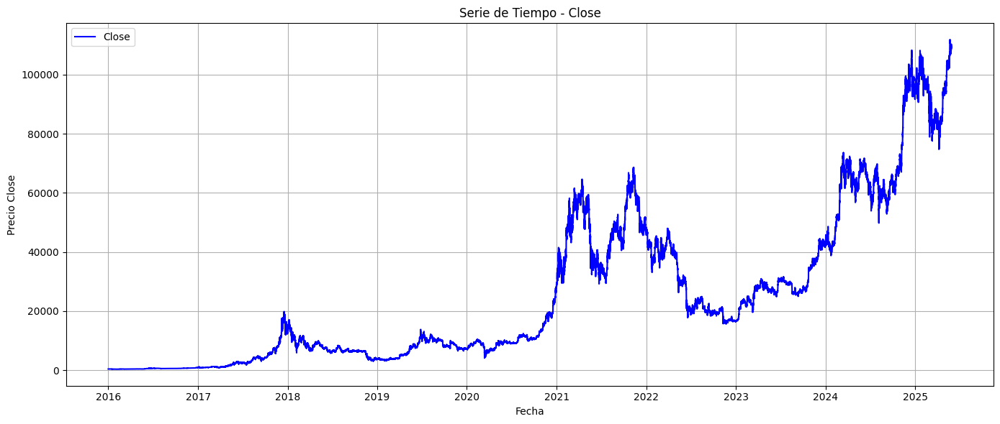

In [ ]:
plt.figure(figsize=(14, 6))
plt.plot(B["Datetime"], B["BTC_Close"], label="Close", color="blue")
plt.title("Serie de Tiempo - Close")
plt.xlabel("Fecha")
plt.ylabel("Precio Close")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


MESES

In [ ]:
import matplotlib.pyplot as plt

start_date = "2025-04-03 00:00"
end_date = "2025-04-03 18:00"
bon_filtrado = B[(B["Datetime"] >= start_date) & (bon["Datetime"] <= end_date)].copy()


# 4. Graficar
plt.figure(figsize=(14, 6))
plt.plot(bon_filtrado["Datetime"], bon_filtrado["c"], label="c", linewidth=1)

# Agregar cada EMA
for label in ema_spans:
    plt.plot(bon_filtrado["Datetime"], bon_filtrado[f"EMA_{label}"], label=f"EMA {label}", linestyle='--')

plt.title("Serie de Tiempo - Close con EMAs")
plt.xlabel("Fecha")
plt.ylabel("Precio Close")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()



# JUEGUIÑOS

In [ ]:
# API Key y parámetros generales
api_key = "EjsF3b55e_87hI7reA6lHGP9bDuqETeL"
tickers = ["BTC"]
start_date = "2016-01-01"
end_date = "2025-05-27"
limit = 50000

# Headers para autenticación
headers = {
    "Authorization": f"Bearer {api_key}"
}


dataframes = {}

# Bucle para cada ticker
for symbol in tickers:
    print(f"Extrayendo datos de {symbol}...")
    base_url = f"https://api.polygon.io/v2/aggs/ticker/X:{symbol}USD/range/1/minute"
    next_url = f"{base_url}/{start_date}/{end_date}?adjusted=true&sort=asc&limit={limit}&apiKey={api_key}"

    all_data = []

    while next_url:
        response = requests.get(next_url, headers=headers)

        if response.status_code == 200:
            data = response.json()

            if "results" in data:
                all_data.extend(data["results"])

                if "next_url" in data:
                    next_url = data["next_url"]
                    time.sleep(1)
                else:
                    break
            else:
                print(f"No se encontraron más datos para {symbol}.")
                break
        else:
            print(f"Error al obtener datos de {symbol}: {response.status_code}, {response.text}")
            break

    # Convertir a DataFrame con sufijos si hay datos
    if all_data:
        df = pd.DataFrame(all_data)
        df["Datetime"] = pd.to_datetime(df["t"], unit="ms")
        df = df[["Datetime", "o", "h", "l", "c", "v"]]
        dataframes[symbol] = df
        print(f"{symbol} extraído con éxito. Total de filas: {len(df)}")
    else:
        print(f"No se pudo obtener datos para {symbol}.")

# Unir todos los DataFrames por la columna 'Datetime'
bon = None
for df in dataframes.values():
    if bon is None:
        bon = df
    else:
        bon = pd.merge(bon, df, on="Datetime", how="outer")

# Ordenar por fecha y mostrar info
bon = bon.sort_values("Datetime").reset_index(drop=True)
bon.info()


Extrayendo datos de BTC...
BTC extraído con éxito. Total de filas: 4563825
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4563825 entries, 0 to 4563824
Data columns (total 6 columns):
 #   Column    Dtype         
---  ------    -----         
 0   Datetime  datetime64[ns]
 1   o         float64       
 2   h         float64       
 3   l         float64       
 4   c         float64       
 5   v         float64       
dtypes: datetime64[ns](1), float64(5)
memory usage: 208.9 MB


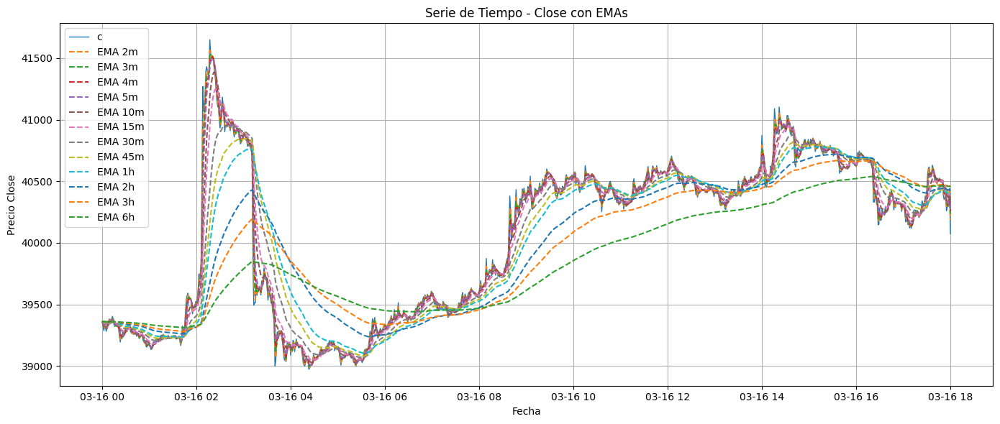

In [ ]:
import matplotlib.pyplot as plt

start_date = "2022-03-16 00:00"
end_date = "2022-03-16 18:00"
bon_filtrado = bon[(bon["Datetime"] >= start_date) & (bon["Datetime"] <= end_date)].copy()

# 2. Diccionario con spans en minutos
ema_spans = {
    "2m": 2,
    "3m": 3,
    "4m": 4,
    "5m": 5,
    "10m": 10,
    "15m": 15,
    "30m": 30,
    "45m": 45,
    "1h": 60,
    "2h": 120,
    "3h": 180,
    "6h": 360,

}

# 3. Calcular todas las EMAs
for label, span in ema_spans.items():
    bon_filtrado[f"EMA_{label}"] = bon_filtrado["c"].ewm(span=span, adjust=False).mean()

# 4. Graficar
plt.figure(figsize=(14, 6))
plt.plot(bon_filtrado["Datetime"], bon_filtrado["c"], label="c", linewidth=1)

# Agregar cada EMA
for label in ema_spans:
    plt.plot(bon_filtrado["Datetime"], bon_filtrado[f"EMA_{label}"], label=f"EMA {label}", linestyle='--')

plt.title("Serie de Tiempo - Close con EMAs")
plt.xlabel("Fecha")
plt.ylabel("Precio Close")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()



In [ ]:
mf1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1057969 entries, 0 to 1091511
Data columns (total 82 columns):
 #   Column         Non-Null Count    Dtype         
---  ------         --------------    -----         
 0   Datetime       1057969 non-null  datetime64[ns]
 1   High           1057969 non-null  float32       
 2   Low            1057969 non-null  float32       
 3   Close          1057969 non-null  float32       
 4   Volume         1057969 non-null  float32       
 5   ETH_Close      1057969 non-null  float32       
 6   ETH_Volume     1057969 non-null  float32       
 7   USDT_Close     1057969 non-null  float32       
 8   USDT_Volume    1057969 non-null  float32       
 9   XRP_Close      1057969 non-null  float32       
 10  XRP_Volume     1057969 non-null  float32       
 11  SOL_Close      1057969 non-null  float32       
 12  SOL_Volume     1057969 non-null  float32       
 13  DOGE_Close     1057969 non-null  float32       
 14  DOGE_Volume    1057969 non-null  float3

# JUEGUIÑOS MF1

In [ ]:
mf1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1057969 entries, 0 to 1091511
Columns: 182 entries, Datetime to c2
dtypes: datetime64[ns](1), float32(94), float64(87)
memory usage: 1.1 GB


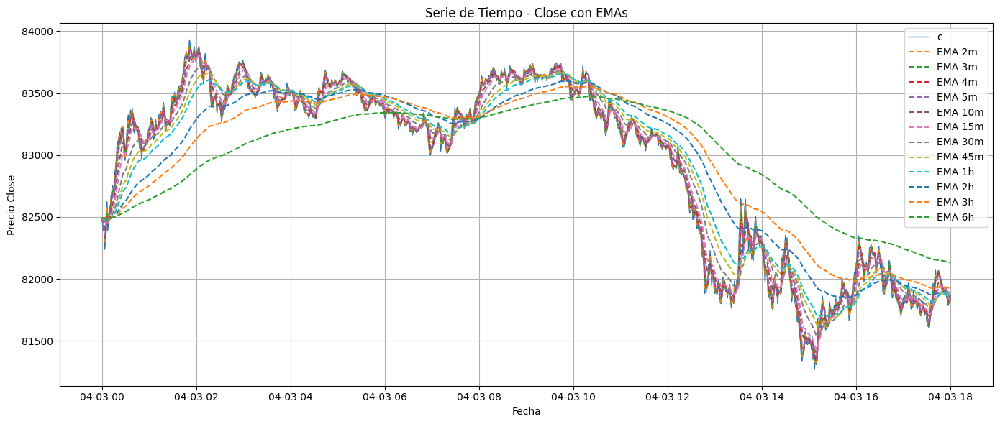

In [ ]:
import matplotlib.pyplot as plt

start_date = "2025-04-03 00:00"
end_date = "2025-04-03 18:00"
mf1_filtrado = mf1[(mf1["Datetime"] >= start_date) & (mf1["Datetime"] <= end_date)].copy()

# 2. Diccionario con spans en minutos
ema_spans = {
    "2m": 2,
    "3m": 3,
    "4m": 4,
    "5m": 5,
    "10m": 10,
    "15m": 15,
    "30m": 30,
    "45m": 45,
    "1h": 60,
    "2h": 120,
    "3h": 180,
    "6h": 360,

}

# 3. Calcular todas las EMAs
for label, span in ema_spans.items():
    mf1_filtrado[f"EMA_{label}"] = mf1_filtrado["c"].ewm(span=span, adjust=False).mean()

# 4. Graficar
plt.figure(figsize=(14, 6))
plt.plot(mf1_filtrado["Datetime"], mf1_filtrado["c"], label="c", linewidth=1)

# Agregar cada EMA
for label in ema_spans:
    plt.plot(mf1_filtrado["Datetime"], mf1_filtrado[f"EMA_{label}"], label=f"EMA {label}", linestyle='--')

plt.title("Serie de Tiempo - Close con EMAs")
plt.xlabel("Fecha")
plt.ylabel("Precio Close")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()



VB


In [ ]:
mf1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1057969 entries, 0 to 1091511
Data columns (total 93 columns):
 #   Column         Non-Null Count    Dtype         
---  ------         --------------    -----         
 0   Datetime       1057969 non-null  datetime64[ns]
 1   High           1057969 non-null  float32       
 2   Low            1057969 non-null  float32       
 3   Close          1057969 non-null  float32       
 4   Volume         1057969 non-null  float32       
 5   ETH_Close      1057969 non-null  float32       
 6   ETH_Volume     1057969 non-null  float32       
 7   USDT_Close     1057969 non-null  float32       
 8   USDT_Volume    1057969 non-null  float32       
 9   XRP_Close      1057969 non-null  float32       
 10  XRP_Volume     1057969 non-null  float32       
 11  SOL_Close      1057969 non-null  float32       
 12  SOL_Volume     1057969 non-null  float32       
 13  DOGE_Close     1057969 non-null  float32       
 14  DOGE_Volume    1057969 non-null  float3

TIMER

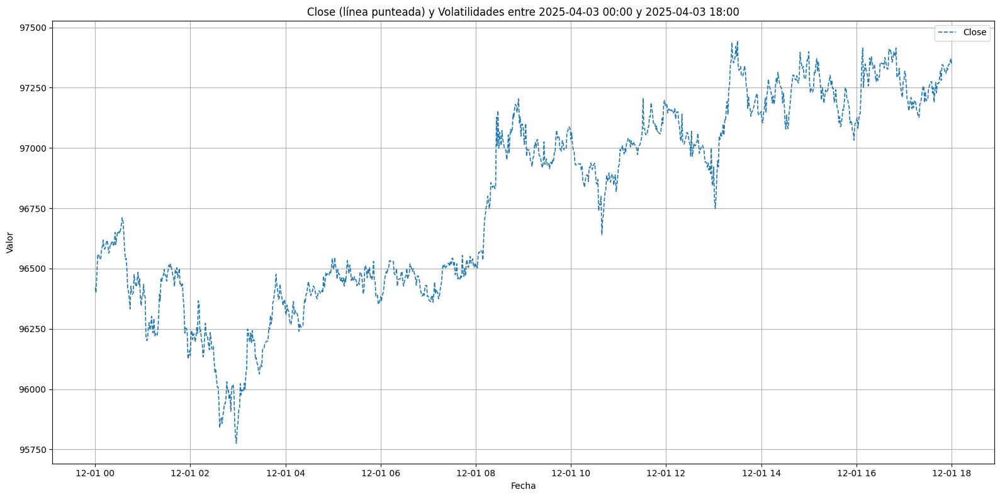

In [ ]:
import matplotlib.pyplot as plt

# Fechas de inicio y fin
start_date = "2024-12-01 00:00"
end_date = "2024-12-01 18:00"

# Filtrar el DataFrame
mf1_filtered = mf1[(mf1["Datetime"] >= start_date) & (mf1["Datetime"] <= end_date)]

# Columnas a graficar
columns_to_plot = ["Close"]

# Crear el gráfico
plt.figure(figsize=(16, 8))
for col in columns_to_plot:
    if col == "Close":
        plt.plot(mf1_filtered["Datetime"], mf1_filtered[col], label=col, linewidth=1.2, linestyle='--')
    else:
        plt.plot(mf1_filtered["Datetime"], mf1_filtered[col], label=col, linewidth=1)

plt.title("Close (línea punteada) y Volatilidades entre 2025-04-03 00:00 y 2025-04-03 18:00")
plt.xlabel("Fecha")
plt.ylabel("Valor")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


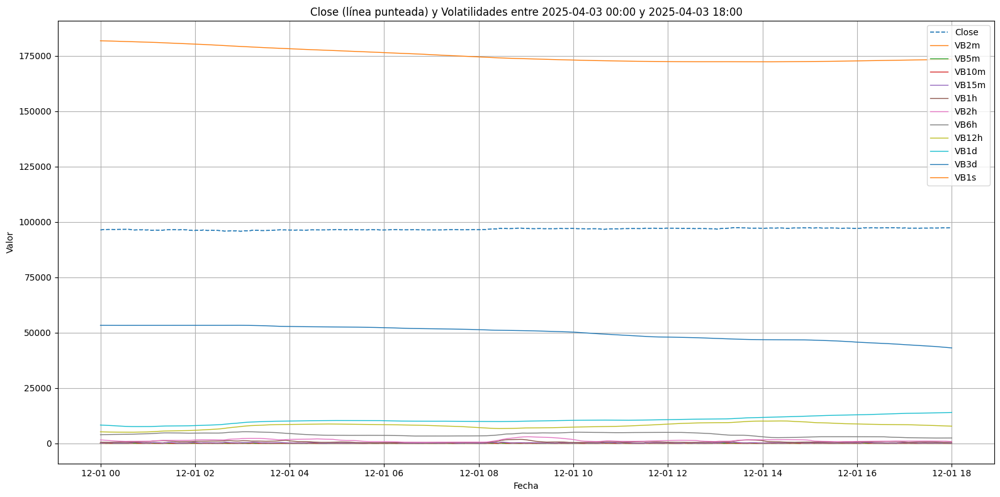

In [ ]:
import matplotlib.pyplot as plt

# Fechas de inicio y fin
start_date = "2024-12-01 00:00"
end_date = "2024-12-01 18:00"

# Filtrar el DataFrame
mf1_filtered = mf1[(mf1["Datetime"] >= start_date) & (mf1["Datetime"] <= end_date)]

# Columnas a graficar
columns_to_plot = ["Close", "VB2m", "VB5m", "VB10m", "VB15m", "VB1h", "VB2h", "VB6h", "VB12h", "VB1d", "VB3d", "VB1s"]

# Crear el gráfico
plt.figure(figsize=(16, 8))
for col in columns_to_plot:
    if col == "Close":
        plt.plot(mf1_filtered["Datetime"], mf1_filtered[col], label=col, linewidth=1.2, linestyle='--')
    else:
        plt.plot(mf1_filtered["Datetime"], mf1_filtered[col], label=col, linewidth=1)

plt.title("Close (línea punteada) y Volatilidades entre 2025-04-03 00:00 y 2025-04-03 18:00")
plt.xlabel("Fecha")
plt.ylabel("Valor")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


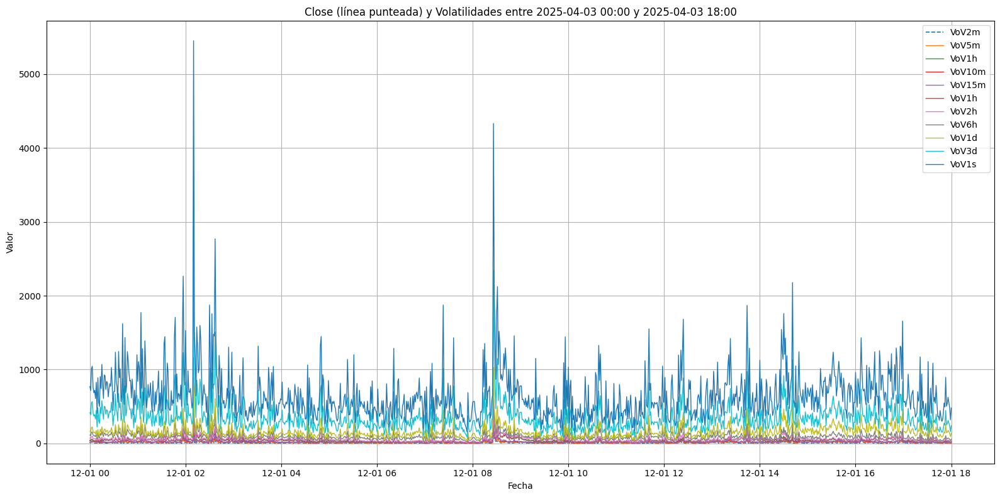

In [ ]:
import matplotlib.pyplot as plt

# Fechas de inicio y fin
start_date = "2024-12-01 00:00"
end_date = "2024-12-01 18:00"

# Filtrar el DataFrame
mf1_filtered = mf1[(mf1["Datetime"] >= start_date) & (mf1["Datetime"] <= end_date)]

# Columnas a graficar
columns_to_plot = [ "VoV2m", "VoV5m",  "VoV1h", "VoV10m", "VoV15m", "VoV1h", "VoV2h", "VoV6h", "VoV1d", "VoV3d", "VoV1s"]

# Crear el gráfico
plt.figure(figsize=(16, 8))
for col in columns_to_plot:
    if col == "VoV2m":
        plt.plot(mf1_filtered["Datetime"], mf1_filtered[col], label=col, linewidth=1.2, linestyle='--')
    else:
        plt.plot(mf1_filtered["Datetime"], mf1_filtered[col], label=col, linewidth=1)

plt.title("Close (línea punteada) y Volatilidades entre 2025-04-03 00:00 y 2025-04-03 18:00")
plt.xlabel("Fecha")
plt.ylabel("Valor")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
import matplotlib.pyplot as plt

# Fechas de inicio y fin
start_date = "2024-12-01 00:00"
end_date = "2024-12-01 18:00"

# Filtrar el DataFrame
mf1_filtered = mf1[(mf1["Datetime"] >= start_date) & (mf1["Datetime"] <= end_date)]

# Columnas a graficar
columns_to_plot = [ "Voc2m", "Voc5m",  "Voc1h", "Voc10m", "Voc15m", "Voc1h", "Voc2h", "Voc6h", "VoC1d", "VoC3d", "VoC1s"]

# Crear el gráfico
plt.figure(figsize=(16, 8))
for col in columns_to_plot:
    if col == "Voc2m":
        plt.plot(mf1_filtered["Datetime"], mf1_filtered[col], label=col, linewidth=1.2, linestyle='--')
    else:
        plt.plot(mf1_filtered["Datetime"], mf1_filtered[col], label=col, linewidth=1)

plt.title("Close (línea punteada) y Volatilidades entre 2025-04-03 00:00 y 2025-04-03 18:00")
plt.xlabel("Fecha")
plt.ylabel("Valor")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

KeyError: 'Voc2m'

<Figure size 1600x800 with 0 Axes>

In [ ]:
mf1["VoC2m"] = np.sqrt( mf1["Close"] *mf1["VVo2m"])
mf1["VoC5m"] = np.sqrt( mf1["Close"] *mf1["VVo5m"])
mf1["VoC10m"] = np.sqrt( mf1["Close"] *mf1["VVo10m"])
mf1["VoC15m"] = np.sqrt( mf1["Close"] *mf1["VVo15m"])
mf1["VoC1h"] = np.sqrt( mf1["Close"] *mf1["VVo1h"])
mf1["VoC2h"] = np.sqrt( mf1["Close"] *mf1["VVo2h"])
mf1["VoC6h"] = np.sqrt( mf1["Close"] *mf1["VVo6h"])
mf1["VoC12h"] = np.sqrt( mf1["Close"] *mf1["VVo12h"])
mf1["VoC1d"] = np.sqrt( mf1["Close"] *mf1["VVo1d"])
mf1["VoC3d"] = np.sqrt( mf1["Close"] *mf1["VVo3d"])
mf1["VoC1s"] = np.sqrt( mf1["Close"] *mf1["VVo1s"])